# 1) Veri Kaynağı ve Proje Konusu - Problemin Belirlenmesi

##  Veri Kaynağı (Data Source) Bulunma Aşaması

**kitapyurdu.com/robots.txt** dosyasının içeriği:
User-agent: *
Disallow: /admin/
Disallow: /system/
Disallow: /image/
Disallow: /img/
Disallow: /download/

     


 Kitap verilerinin scraping yapılmasını engelleyen bir `Disallow` bulunmamaktadır.

**Sonuç:**  
 `BeautifulSoup`, `Selenium` gibi kütüphaneler kullanılarak scraping yapılabilir.

---

##  Proje Konusunun ve Problemin Belirlenme Aşaması

Hangi verilere ve kolonlara ulaşabildiğimizi gördükten sonra, hangi problemi çözeceğimize karar verebiliriz.

<img src="images/book.png" alt="Kitap Verileri" width="720">

 Görselde işaretlenen verilere erişebiliyoruz.

Scraping yapabileceğimiz kolonlar şunlardır:

- Kitap Adı  
- Kitabın Kategorisi  
- Kitap Yazarı  
- Yayınevi  
- 100 Üzerinden Aldığı Puan (Yıldızlar yüzlük sistemde yer alıyor)  
- Favorilere Ekleyen Kişi Sayısı  
- "Okuyacağım" Olarak İşaretlenmiş Sayı  
- "Okuyorum" Olarak İşaretlenmiş Sayı  
- "Okudum" Olarak İşaretlenmiş Sayı  
- Liste Fiyatı  
- Yayın Tarihi  
- Dil  
- Sayfa Sayısı  
- Cilt Tipi  
- Boyut  
- Kağıt Cinsi  
- Toplam Satılma Sayısı  
- Toplam Yorum Sayısı  

---

**Sonuç:**  
Toplam satılma sayısı ya da fiyat tahmini yapmak en mantıklı iki seçenek olarak görünmektedir.  
Ben, **satış sayısını tahmin eden bir gözetimli regresyon (supervised regression) model** yapmaya karar verdim.

Çünkü satılma sayısı, bir kitabın ne kadar ilgi gördüğüyle çok yakın ilişkili. Yani bir nevi "kitap tutar mı, tutmaz mı?" gibi bir çıkarım yapmak için kullanılabilir.

---

 **Senaryo:**  
Bir yazar düşünelim; kitap yazacak. Yazarın amacı, yazdığı kitabın yüksek sayıda insanın ilgisini çekmesi ve satılmasıdır. Bununla orantılı olarak yazarın şöhreti artacak ve mevcut diğer kitaplarının da satışları yükselecektir.

Ancak kitap yazmak zor ve uzun bir süreçtir.  
Bu nedenle, yazar kitap yazmaya başlamadan önce bazı parametreleri girerek, **potansiyel olarak yazmayı planladığı kitabının ne kadar satılabileceğini** önceden görebilir.

Eğer tahmin düşükse, yazar bu verilere göre karar değiştirip farklı bir kitap fikrine yönelebilir.
        



# 2) Veri Toplama (Scraping) ve Veri Kaydetme (.csv)

 Belirlediğimiz kolonlardaki verileri toplayabilmek için bir Python scripti yazdım.  
Bu script:

1. İlk olarak kitap listeleme sayfalarını dolaşır,  
2. Her kitap için URL’leri toplar,  
3. Ardından her kitap detay sayfasına giderek verileri ilgili kolonlara ayırır  
4. Son olarak verileri bir `.csv` dosyasına kaydeder.

---
<img src="images/scraping1.png" alt="Kitap Verileri" width="720">
<img src="images/scraping2.png" alt="Kitap Verileri" width="720">

##  Nasıl Çalıştırılır?

1. Gerekli kütüphaneleri yüklemek için terminalde aşağıdaki komutu çalıştırın:



pip install -r scraping/requirements.txt


2. `scraping.py` ve `chromedriver.exe` dosyaları `scraping/` klasöründe bulunduğu için, terminalden şu komutla scripti çalıştırabilirsiniz:



python scraping/scraping.py

**scraping.py:**

In [ ]:
import time
import random
import pandas as pd
from selenium import webdriver
from selenium.webdriver.chrome.service import Service
from bs4 import BeautifulSoup
import re # Sayısal verileri ayıklamak için

def get_book_details(book_url, driver):
    """
    Verilen kitap URL'sinden, güncellenmiş HTML yapısına göre tüm detayları çeker.
    """
    try:
        driver.get(book_url)
        time.sleep(random.uniform(2, 4)) # Sayfanın tam yüklenmesi için bekle
        
        soup = BeautifulSoup(driver.page_source, 'html.parser')
        book_data = {}

        # Kitap Adı
        try:
            book_data['Kitap Adı'] = soup.find('h1', class_='pr_header__heading').get_text(strip=True)
        except:
            book_data['Kitap Adı'] = 'Bilgi Yok'

        # Kitabın Kategorisi
        try:
            category_elements = soup.select('.rel-cats__link span')
            book_data['Kitabın kategorisi'] = ' > '.join([cat.get_text(strip=True) for cat in category_elements])
        except:
            book_data['Kitabın kategorisi'] = 'Bilgi Yok'
            
        # Kitap Yazarı
        try:
            book_data['Kitap Yazarı'] = soup.select_one('.pr_producers__manufacturer .pr_producers__link').get_text(strip=True)
        except:
            book_data['Kitap Yazarı'] = 'Bilgi Yok'
        
        # Yayınevi
        try:
            book_data['Yayınevi'] = soup.select_one('.pr_producers__publisher .pr_producers__link').get_text(strip=True)
        except:
            book_data['Yayınevi'] = 'Bilgi Yok'

        # Puan
        try:
            rating_val = soup.find('meta', itemprop='ratingValue')['content']
            rating_count = soup.find('meta', itemprop='ratingCount')['content']
            book_data['100 Üzerinden Aldığı Puan'] = f"{rating_val} / 5 ({rating_count} oy)"
        except:
            book_data['100 Üzerinden Aldığı Puan'] = 'Puan Yok'

        # Favorilere Ekleyen Kişi Sayısı
        try:
            book_data['Favorilere Ekleyen Kişi Sayısı'] = soup.find('span', id='favorite-count').get_text(strip=True)
        except:
            book_data['Favorilere Ekleyen Kişi Sayısı'] = '0'
        
        # Okuma Listeleri
        try: book_data['Okuyacağım olarak işaretlenmiş sayısı'] = soup.find('span', id='count-1').get_text(strip=True)
        except: book_data['Okuyacağım olarak işaretlenmiş sayısı'] = '0'
        try: book_data['Okuyorum olarak işaretlenmiş sayısı'] = soup.find('span', id='count-2').get_text(strip=True)
        except: book_data['Okuyorum olarak işaretlenmiş sayısı'] = '0'
        try: book_data['Okudum olarak işaretlenmiş sayısı'] = soup.find('span', id='count-3').get_text(strip=True)
        except: book_data['Okudum olarak işaretlenmiş sayısı'] = '0'

        # Toplam Satılma Sayısı
        try:
            purchased_text = soup.find('p', class_='purchased').get_text(strip=True)
            digits = re.findall(r'\d+', purchased_text)
            book_data['Toplam Satılma Sayısı'] = "".join(digits)
        except:
            book_data['Toplam Satılma Sayısı'] = 'Bilgi Yok'

        # Toplam Yorum Sayısı
        try:
            book_data['Toplam Yorum Sayısı'] = soup.select_one('p.pr_view-review-text span:last-child').get_text(strip=True)
        except:
             book_data['Toplam Yorum Sayısı'] = '0'

        # Liste Fiyatı ve diğer tablo verileri
        attribute_map = {
            'Liste Fiyatı:': 'Liste Fiyatı', 'Yayın Tarihi:': 'Yayın Tarihi', 'Dil:': 'Dil',
            'Sayfa Sayısı:': 'Sayfa Sayısı', 'Cilt Tipi:': 'Cilt Tipi', 'Kağıt Cinsi:': 'Kağıt Cinsi',
            'Boyut:': 'Boyut'
        }
        for key in attribute_map.values():
            book_data[key] = 'Bilgi Yok'
        try:
            attributes_table = soup.find('div', class_='attributes').find('table')
            if attributes_table:
                rows = attributes_table.find_all('tr')
                for row in rows:
                    cells = row.find_all('td')
                    if len(cells) == 2:
                        label = cells[0].get_text(strip=True)
                        if label in attribute_map:
                            book_data[attribute_map[label]] = cells[1].get_text(strip=True).replace('\n', '').strip()
        except Exception:
            pass
            
        return book_data

    except Exception as e:
        print(f"Detay çekme hatası: {book_url} - {e}")
        return None

# --- ANA KOD ---
if __name__ == "__main__":
    service = Service()
    options = webdriver.ChromeOptions()
    # Tarayıcının arka planda, görünmeden çalışmasını isterseniz aşağıdaki satırı aktifleştirin.
    # options.add_argument('--headless')
    driver = webdriver.Chrome(service=service, options=options)

    # ** URL'ye sayfalama için `&page={}` eklendi.**
    base_url = "https://www.kitapyurdu.com/index.php?route=product/bargain&category=0&discount=60&filter_in_stock=1&filter_in_shelf=0&sort=purchased&order=DESC&limit=100&page={}"
    
    all_books_data = []; book_urls = set()

    print("Kitap linkleri toplanıyor...")
    # 1497 kitap için 15 sayfa gezilecek.**
    for page_num in range(1, 16): 
        if len(book_urls) >= 1497: break
        try:
            url = base_url.format(page_num)
            driver.get(url) 
            time.sleep(random.uniform(2, 4)) 
            soup = BeautifulSoup(driver.page_source, 'html.parser')
            
            
            book_divs = soup.find_all('div', class_='product-cr')
            
            if not book_divs:
                print(f"UYARI: Sayfa {page_num} üzerinde kitap bulunamadı. Muhtemelen son sayfaya ulaşıldı.")
                break # Kitap bulunamayan sayfada döngüyü sonlandır.
            
            for div in book_divs:
                link_tag = div.find('a', class_='pr-img-link', href=True)
                if link_tag: 
                    book_urls.add(link_tag['href'])
            print(f"Sayfa {page_num} tarandı. Toplam {len(book_urls)} adet eşsiz link bulundu.")
        except Exception as e:
            print(f"Liste sayfası hatası: {e}"); break
    
    print(f"\nToplam {len(book_urls)} adet kitap linki bulundu. Şimdi detaylar çekiliyor...")
    count = 0
    for url in list(book_urls):
       
        if count >= 1497: 
            print("Hedeflenen 1497 kitap verisine ulaşıldı. İşlem durduruluyor.")
            break
        
        book_details = get_book_details(url, driver)
        if book_details:
            all_books_data.append(book_details)
            count += 1
            print(f"{count}. Kitap işlendi: {book_details.get('Kitap Adı', 'N/A')}")

    driver.quit()

    print("\nVeriler CSV dosyasına kaydediliyor...")
    if all_books_data:
        df = pd.DataFrame(all_books_data)
        desired_columns = [ 'Kitap Adı', 'Kitabın kategorisi', 'Kitap Yazarı', 'Yayınevi', '100 Üzerinden Aldığı Puan', 'Favorilere Ekleyen Kişi Sayısı', 'Okuyacağım olarak işaretlenmiş sayısı', 'Okuyorum olarak işaretlenmiş sayısı', 'Okudum olarak işaretlenmiş sayısı', 'Liste Fiyatı', 'Yayın Tarihi', 'Dil', 'Sayfa Sayısı', 'Cilt Tipi', 'Boyut', 'Kağıt Cinsi', 'Toplam Satılma Sayısı', 'Toplam Yorum Sayısı' ]
        for col in desired_columns:
            if col not in df.columns: df[col] = 'Bilgi Yok'
        df = df.reindex(columns=desired_columns)
        
        # ** Final dosya adı.**
        df.to_csv('kitapyurdu_dataset.csv', index=False, encoding='utf-8-sig')
        print("\nİşlem tamamlandı! 'kitapyurdu_dataset.csv' dosyası oluşturuldu.")
    else:
        print("Hiç veri çekilemedi. CSV dosyası oluşturulmadı.")



 Script çalıştıktan sonra, veri toplama işlemi tamamlanır ve elde edilen veriler  `kitapyurdu_dataset.csv` dosyasına kaydedilir.

 **Sonuç:1497 kitap verisi kolonlara ayrılarak çekildi.**
<img src="images/firstdata.png" alt="FirstData" width="720">

# 3) Veri Ön İşleme (Data Pre-processing) , Özellik Mühendisliği (Feature Engineering) ve ML Algoritmalarına Hazır Hale Getirme

## Uygulanacak Adımlar

---

### Veriyi Anlama ve Keşifsel Analiz (EDA) - Exploratory Data Analysis

#### Veri Seti Analizi
Veriyi derinlemesine inceleyerek özelliklerini, dağılımını ve olası sorunlarını keşfetme sürecidir.

- Eksik ve aykırı değerlerle başa çıkma

#### Veri Görselleştirme

- Histogramlar ve yoğunluk grafikleri ile değişkenlerin dağılımını inceleme  
- Saçılım ve kutu grafikleri (scatter & boxplot) ile değişkenler arası ilişkileri keşfetme  
- Korelasyon matrisi (ısı haritası) ile değişkenler arasındaki doğrusal ilişkileri görselleştirme

#### İstatistiksel Analizler

- Ortalama, medyan, mod gibi merkezi eğilim ölçüleri  
- Standart sapma, varyans gibi dağılım ölçüleri  
- Çarpıklık (Skewness) ve Basıklık (Kurtosis) analizi

#### Öznitelik Ölçeklendirme ve Dönüştürme

- Veriyi standardize etme (Z-Score Normalizasyonu)  
- Veriyi normalize etme (Min-Max Skalalama)

---

### Temel Veri Ön İşleme Adımları

#### Eksik Veri Tespiti ve Sayısallaştırma (Encoding)

- Veri setindeki boş (`NaN`, `Null`) veya anlamsız (`0`, `"-"`, `"?"`) değerlerin hangi kolonlarda ve ne oranda bulunduğunu belirleme
- String veya Object verileri bulup float ya da int değerlere dönüştürme

#### Eksik Verileri Doldurma (Imputation)

- Eksik değerleri ilgili kolonun:
  - Ortalaması
  - Medyanı
  - En sık görülen değeri (mod)
  gibi yöntemlerle doldurmak

#### Eksik Verileri Silme

- Eğer eksik değer oranı çok yüksekse:
  - İlgili satırları veya kolonları veri setinden çıkarmak

#### Aykırı Değer Tespiti

- Sayısal değişkenlerin dağılımlarını histogram veya boxplot (kutu grafiği) ile inceleyerek uç noktalardaki anormal değerleri belirleme

#### Aykırı Değerleri Temizleme

- Tespit edilen aykırı değerleri:
  - Veri setinden çıkarmak
  - Ortalama, medyan gibi daha uygun değerlerle değiştirmek

#### Etiket Kodlama (Label Encoding)

- Kategorik değişkenlerdeki her bir benzersiz değeri bir sayıya dönüştürmek  
  Örnek:  
  `Vites` sütunundaki `Otomatik`, `Yarı Otomatik`, `Düz` → `0`, `1`, `2`

#### Tek-Sıcak Kodlama (One-Hot Encoding)

- Kategorik değişkenleri her bir benzersiz değer için yeni bir ikili sütun oluşturarak sayısal hale getirmek  
- Bu, algoritmaların kategorik verileri yanlış yorumlamasını engeller
  
#### Özellik Mühendisliği **(Gerekirse)** (Feature Engineering)

- Kolonların birbirleriyle ilişkilerine göre yeni çözümler üretmek. 
- Genelde belirli bir sorunu çözmeye yönelik mantıksal değişim veya dönüşümlerdir.
  
---


# EDA & Veri Ön-İşleme
**EDA ile analiz yapılıp üstüne düzeltmeler yapılarak ilerlenecek ve her aşamada dataset versiyonu kaydedilecek.**
## Temel Veri Seti Analizi ve İlk Problemler


Elimizdeki verileri anlamak için ilk sütun ve ilk 10 satıra bakalım:

In [10]:
import pandas as pd
import csv
import itertools # Döngüyü sınırlamak için eklendi

# CSV dosyanızın yolunu belirtin
file_path = 'datasetVersions/kitapyurdu_dataset_original.csv'

try:
    with open(file_path, 'r', encoding='utf-8') as f:
        reader = csv.reader(f)
        
        # Başlık satırını oku ve yazdır
        header = next(reader)
        print("--- Başlık ---")
        print(header)
        print("\n--- İlk 10 Veri Satırı ---")

        # İlk 10 veri satırını oku ve yazdır
      
        for i, row in enumerate(itertools.islice(reader, 10)):
            print(f"Satır {i+1}: {row}")
            print()
            print()

except FileNotFoundError:
    print(f"Hata: '{file_path}' dosyası bulunamadı. Lütfen dosya adını ve konumunu kontrol edin.")
except StopIteration:
    # Bu hata, dosya boşsa veya sadece başlık satırı varsa oluşur.
    print("Dosya boş veya sadece başlık satırı içeriyor.")
except Exception as e:
    print(f"Dosya okunurken bir hata oluştu: {e}")

--- Başlık ---
['\ufeffKitap Adı', 'Kitabın kategorisi', 'Kitap Yazarı', 'Yayınevi', '100 Üzerinden Aldığı Puan', 'Favorilere Ekleyen Kişi Sayısı', 'Okuyacağım olarak işaretlenmiş sayısı', 'Okuyorum olarak işaretlenmiş sayısı', 'Okudum olarak işaretlenmiş sayısı', 'Liste Fiyatı', 'Yayın Tarihi', 'Dil', 'Sayfa Sayısı', 'Cilt Tipi', 'Boyut', 'Kağıt Cinsi', 'Toplam Satılma Sayısı', 'Toplam Yorum Sayısı']

--- İlk 10 Veri Satırı ---
Satır 1: ['Macera İçinde Macera', 'Kitap > Çocuk Kitapları > Diğer', 'Kolektif', 'LOTİ KİTAP', '5 / 5 (3 oy)', '8', '0', '0', '2', '150,00', '25.01.2024', 'TÜRKÇE', '144', 'Karton Kapak', '13.5 x 19.5 cm', 'Kitap Kağıdı', '339', '3']


Satır 2: ['Zevk Mahkumu', 'Kitap > Edebiyat > Roman (Çeviri) > Kitap > Orijinal Dil > İngilizce', 'Kresley Cole', 'PEGASUS YAYINLARI', '5 / 5 (42 oy)', '113', '6', '2', '48', '299,00', '18.02.2015', 'TÜRKÇE', '416', 'Karton Kapak', '13.5 x 21 cm', 'Kitap Kağıdı', '253', '15']


Satır 3: ['Alman KışıNeo-Liberal Çağın Almanya’sında

---
###  Genel veri yapısına ve boş (NaN) değerlere göz atalım. Ayrıca kolon bazlı tekrar eden değerleri inceleyelim.
---

In [2]:
import pandas as pd
import numpy as np

# --- ANALİZ AYARLARI ---

# Analiz edilecek CSV dosyasının yolu (sizin belirttiğiniz yol)
file_path = 'datasetVersions/kitapyurdu_dataset_original.csv'

# Hangi metinsel değerlerin "boş" (NaN) olarak kabul edileceğini bu listeye ekleyebilirsiniz.
# scraping.py scriptini çalıştırırken hücreleri boş kaydetmemek amacıyla "Bilgi Yok" "Puan Yok" veya "0" olarak kaydetmiştik.
missing_values_list = ['Bilgi Yok', 'Puan Yok', '0', 'N/A', np.nan, None]


# --- ANA ANALİZ KODU ---

try:
    # CSV dosyasını okurken, belirttiğimiz özel metinleri otomatik olarak NaN (boş) değere dönüştürüyoruz.
    # Bu, analizlerin daha doğru olmasını sağlar.
    df = pd.read_csv(file_path, na_values=missing_values_list)

    print(f"'{file_path}' dosyası başarıyla yüklendi.")
    
    # ===================================================================
    #                   BÖLÜM 1: GENEL VERİ SETİ BAKIŞI 
    # ===================================================================
    
    # 1. Genel veri yapısına göz atalım
    # df.info() metodu, sütun adlarını, veri tiplerini ve boş olmayan değer sayılarını gösterir.
    print("\n" + "-"*50)
    print("Veri Setinin Genel Yapısı ve Bilgileri (df.info())")
    print("-" * 50)
    df.info()

    # 2. Boş (NaN) değerlerin sütun bazında sayısını kontrol edelim
    # na_values parametresi sayesinde 'Bilgi Yok' gibi ifadeler de artık burada sayılacaktır.
    print("\n" + "-"*50)
    print("Sütunlardaki Toplam Boş Değer Sayısı (isnull().sum())")
    print("-" * 50)
    print(df.isnull().sum())
    
    
    # ===================================================================
    #                BÖLÜM 2: DETAYLI KOLON BAZLI ANALİZ
    # ===================================================================

    print("\n" + "="*80 + "\n")
    print("DETAYLI KOLON BAZLI ANALİZ")
    print("="*80 + "\n")

    # Her bir kolonu döngüye alarak detaylı analiz et
    for column in df.columns:
        print(f"--- SÜTUN ANALİZİ: '{column}' ---")
        
        # Boş Değer Analizi
        missing_count = df[column].isnull().sum()
        total_count = len(df[column])
        missing_percentage = (missing_count / total_count) * 100
        
        print(f"Boş/Geçersiz Değer Sayısı: {missing_count} ({missing_percentage:.2f}%)")
        
        # Eşsiz Değer Analizi
        unique_count = df[column].nunique()
        print(f"Eşsiz Değer Sayısı: {unique_count}")
        
        # Değer Dağılımı (En sık tekrar eden 5 değer)
        # Eğer sütundaki tüm değerler eşsiz ise (ID gibi), bu adımı atla
        if unique_count > 0 and unique_count < total_count:
            print("En Sık Tekrar Eden 5 Değer:")
            print(df[column].value_counts().head(5))
        elif unique_count == 0:
             print("Bu sütunda hiç geçerli değer bulunmuyor.")
        else:
            print("Tüm değerler eşsiz olduğu için değer dağılımı gösterilmiyor.")
            
        print("-" * (len(column) + 24) + "\n")


except FileNotFoundError:
    print(f"HATA: '{file_path}' dosyası bulunamadı.")
    print("Lütfen 'file_path' değişkenini kontrol edip dosyanın doğru konumda olduğundan emin olun.")
except Exception as e:
    print(f"Dosya okunurken veya işlenirken beklenmedik bir hata oluştu: {e}")

'datasetVersions/kitapyurdu_dataset_original.csv' dosyası başarıyla yüklendi.

--------------------------------------------------
Veri Setinin Genel Yapısı ve Bilgileri (df.info())
--------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1497 entries, 0 to 1496
Data columns (total 18 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   Kitap Adı                              1497 non-null   object 
 1   Kitabın kategorisi                     1497 non-null   object 
 2   Kitap Yazarı                           1476 non-null   object 
 3   Yayınevi                               1497 non-null   object 
 4   100 Üzerinden Aldığı Puan              1216 non-null   object 
 5   Favorilere Ekleyen Kişi Sayısı         1492 non-null   float64
 6   Okuyacağım olarak işaretlenmiş sayısı  1256 non-null   float64
 7   Okuyorum olarak işaretlenmiş sayısı    555 n

# Tespit Edilen Sorunlar ve Yorumlar



## Genel Değerlendirme

Veri seti, 1497 kitap kaydı ve 18 öznitelik (sütun) içermektedir. Analiz sonucunda, model performansını doğrudan etkileyecek bazı kritik noktalar tespit edilmiştir:

1.  **Eksik Veri (Missing Values):** Özellikle `` `Okuyorum olarak işaretlenmiş sayısı` `` (%62.93), `` `Toplam Yorum Sayısı` `` (%33.93) ve `` `Okudum olarak işaretlenmiş sayısı` `` (%22.58) gibi sütunlarda ciddi oranda eksik veri bulunmaktadır.
2.  **Veri Tipi ve Format Problemleri:** `` `Liste Fiyatı` ``, `` `100 Üzerinden Aldığı Puan` `` ve `` `Boyut` `` gibi sütunlar, sayısal bilgi içermelerine rağmen metin (object) olarak saklanmakta ve temizlenmesi gerekmektedir.
3.  **Yüksek Kardinalite:** `` `Kitap Yazarı` `` (1094 farklı yazar) ve `` `Yayınevi` `` (107 farklı yayınevi) gibi sütunlar çok sayıda eşsiz değere sahiptir. Bu durum, doğrudan etiketlemeye (encoding) uygun değildir ve özel bir yaklaşım gerektirir.
4.  **Özellik Mühendisliği (Feature Engineering) Potansiyeli:** Bazı sütunlar birden fazla bilgiyi bir arada barındırmaktadır (`Puan` ve `Oy Sayısı`ya da`En` ve `Boy` gibi) ve modelin daha iyi öğrenebilmesi için bu bilgilerin ayrıştırılması gerekmektedir.

---

## Aksiyon Planı: Veri Ön İşleme Adımları

Aşağıda sütun bazında uygulanması gereken adımlar detaylandırılmıştır.

### Grup 1: Özellik Mühendisliği (Feature Engineering) - Yeni Sütunlar Oluşturma

Bu sütunlar, içerdikleri birden fazla bilgiyi ayrıştırarak modele daha anlamlı veriler sunmak için yeniden yapılandırılmalıdır.

-   **`100 Üzerinden Aldığı Puan`**
    -   **Problem:** Hem puan (örn: "5 / 5") hem de oy sayısı ("(1 oy)") bilgisini tek bir metin alanında barındırıyor.
    -   **Çözüm:** Bu sütun iki yeni sayısal sütuna ayrılmalıdır:
        -   **`Puan` (float):** Sadece yıldız değerini (ilk sayı) alacak.
        -   **`Oy_Sayisi` (int):** Parantez içindeki oy sayısını alacak.
    -   **Not:** Orijinal sütun bu işlemden sonra veri setinden çıkarılmalıdır.

-   **`Kitabın kategorisi`**
    -   **Problem:** Kategoriler hiyerarşik bir yapıda (`>`) birleştirilmiş. Bu yapı, model için anlamlı bir özellik olabilir.
    -   **Çözüm:** `>` karakterinden ayrılarak en azından ilk kategori alınmalı ve yeni bir sütun oluşturulmalıdır.
        -   **`Ana_Kategori` (object):** "Kitap > Edebiyat > Roman" için sadece "Edebiyat" gibi en anlamlı olan parça alınabilir. Bu, kategori sayısını azaltarak modelin genelleme yapmasını kolaylaştırır.

-   **`Yayın Tarihi`**
    -   **Problem:** Tam tarih (gün.ay.yıl) formatında. Gün ve ay bilgisi, kitabın popülerliği üzerinde genellikle yıldan daha az etkilidir.
    -   **Çözüm:** Yalnızca yıl bilgisi alınarak yeni bir sütun oluşturulmalıdır.
        -   **`Yayin_Yili` (int):** Sadece yıl bilgisini içerecek.

-   **`Boyut`**
    -   **Problem:** En ve boy bilgisi "13.5 x 21 cm" gibi tek bir metin alanında birleştirilmiş.
    -   **Çözüm:** Bu sütun iki yeni sayısal sütuna ayrılmalıdır:
        -   **`En` (float):** Genişlik değerini alacak.
        -   **`Boy` (float):** Yükseklik değerini alacak.
    -   **Not:** Orijinal sütun bu işlemden sonra veri setinden çıkarılmalıdır.

### Grup 2: Veri Temizleme ve Tip Dönüşümü

-   **`Liste Fiyatı`**
    -   **Problem:** Ondalık ayraç olarak virgül kullanılmış ve veri tipi `object`.
    -   **Çözüm:** Virgül (`,`) noktaya (`.`) çevrilmeli ve veri tipi `float` olarak dönüştürülmelidir.

### Grup 3: Kategorik Verilerin Yönetimi

-   **Düşük Kardinaliteli Sütunlar (Az Sayıda Kategori):**
    -   **Sütunlar:** `Dil`, `Cilt Tipi`, `Kağıt Cinsi`
    -   **Yorum:** Bu sütunlarda az sayıda ve tekrar eden kategoriler bulunmaktadır.
    -   **Öneri:** **Label Encoding veya One-Hot Encoding** uygulanmalıdır.(One-Hot Encoding tercihi daha mantıklı çünkü her kolonun 3 ve 3 ten fazla kategorisi var bu durum label encoding yapılırsa algoritma için x kategorisi daha değerlidir yanılgısı yaratabilir) Bu yöntem, kategoriler arasında yapay bir sıralama ilişkisi kurmasını engelleyerek modelin daha doğru öğrenmesini sağlar.

-   **Yüksek Kardinaliteli Sütunlar (Çok Sayıda Kategori):**
    -   **Sütunlar:** `Kitap Yazarı`, `Yayınevi`, `Ana_Kategori` (yeni oluşturulacak)
    -   **Yorum:** Bu sütunlarda yüzlerce farklı kategori bulunmaktadır. `One-Hot Encoding` burada yüzlerce yeni sütun oluşturacağı için pratik değildir.
    -   **Öneri:** **Frekans Gruplaması**. En sık görülen ilk 10-20 kategori korunup, geri kalanlar "Diğer" adında tek bir kategoride birleştirilebilir. Ardından bu yeni, daha az kategorili sütuna `One-Hot Encoding` uygulanabilir.

### Grup 4: Eksik Verilerin Yönetimi (Handling Missing Values)

-   **`Okuyorum olarak işaretlenmiş sayısı`**
    -   **Durum:** **%62.93**'ü boş. Verinin yarısından fazlası mevcut değil.  Ayrıca elimizde **Toplam Satılma Sayısı** gibi bir kolon olduğu için bu kolonun çok bir anlamı yoktur çünkü zaten kitabı satın almış bir kişi kitabı okuyordur.
    -   **Öneri:** Bu sütunun doldurulması (imputation) güvenilir sonuçlar vermeyecektir. **Veri setinden çıkarılması (drop) en mantıklı adımdır.**

-   **`Toplam Yorum Sayısı`, `Okudum olarak işaretlenmiş sayısı`, `Puan`, `Oy_Sayisi`**
    -   **Durum:** %18 ile %34 arasında kayda değer oranda boş veri içeriyorlar.
    -   **Öneri:** Bu etkileşim sütunları için boş değerler, genellikle "hiç etkileşim olmamış" anlamına gelir. Bu nedenle en basit ve etkili yöntem, boş değerleri **0 ile doldurmaktır.**

-   **Diğer Sütunlar (`Kitap Yazarı`, `Yayın Tarihi`, `Sayfa Sayısı` vb.)**
    -   **Durum:** Boşluk oranı çok düşük (%0.13 - %1.40).
    -   **Öneri:** Sayısal sütunlar (`Sayfa Sayısı`) için **medyan** veya **ortalama** ile; kategorik sütunlar (`Kitap Yazarı`) için ise **en sık tekrar eden değer (mod)** ile doldurulabilir.

### Grup 5: Modelden Çıkarılacak Sütunlar

-   **`Kitap Adı`**
    -   **Gerekçe:** 1495 eşsiz değere sahip. Her kitap için neredeyse benzersizdir ve modelin ezberlemesine (overfitting) neden olur. Tahmin gücü yoktur.
    -   **Aksiyon:** **Çıkarılmalı.**

---
### BU AŞAMALARI SIRAYLA YAPALIM
**kitapyurdu_dataset_v1 olarak kaydediyoruz.**

In [17]:
import pandas as pd
import numpy as np
import re
import os

# --- AYARLAR ---
input_file = 'datasetVersions/kitapyurdu_dataset_original.csv'
output_dir = 'datasetVersions'
output_file = os.path.join(output_dir, 'kitapyurdu_dataset_v1.csv')

# 'Bilgi Yok', 'Puan Yok' gibi ifadeleri NaN olarak okumak için liste
missing_values_list = ['Bilgi Yok', 'Puan Yok', 'N/A', np.nan, None]

# --- ANA PREPROCESSING KODU ---
try:
    # Orijinal veriyi yükle
    df = pd.read_csv(input_file, na_values=missing_values_list)
    print(f"'{input_file}' dosyası başarıyla yüklendi. Ön işleme başlıyor...")

    # ==============================================================================
    # Adım 1: Özellik Mühendisliği (Feature Engineering)
    # ==============================================================================
    print("Adım 1: Özellik mühendisliği uygulanıyor...")
    
    # '100 Üzerinden Aldığı Puan' sütununu Puan ve Oy_Sayisi olarak ayır
    puan_oy = df['100 Üzerinden Aldığı Puan'].str.extract(r'(\d+)\s*/\s*\d+\s*\((\d+)\s*oy\)')
    df['Puan'] = pd.to_numeric(puan_oy[0], errors='coerce')
    df['Oy_Sayisi'] = pd.to_numeric(puan_oy[1], errors='coerce')

    # 'Kitabın kategorisi' sütunundan Ana_Kategori'yi çıkar
    df['Ana_Kategori'] = df['Kitabın kategorisi'].str.split('>').str[1].str.strip()

    # 'Yayın Tarihi' sütunundan Yayin_Yili'nı çıkar
    df['Yayin_Yili'] = pd.to_datetime(df['Yayın Tarihi'], format='%d.%m.%Y', errors='coerce').dt.year

    # 'Boyut' sütununu En ve Boy olarak ayır
    boyutlar = df['Boyut'].str.replace(',', '.').str.extract(r'(\d+\.?\d*)\s*x\s*(\d+\.?\d*)')
    df['En'] = pd.to_numeric(boyutlar[0], errors='coerce')
    df['Boy'] = pd.to_numeric(boyutlar[1], errors='coerce')

    # ==============================================================================
    # Adım 2: Veri Temizleme ve Tip Dönüşümü
    # ==============================================================================
    print("Adım 2: Veri temizleme ve tip dönüşümü yapılıyor...")
    
    # 'Liste Fiyatı' sütunundaki binlik ayıracı olan noktayı kaldır, ondalık ayıracı olan virgülü noktaya çevir ve float yap
    df['Liste Fiyatı'] = df['Liste Fiyatı'].str.replace('.', '', regex=False).str.replace(',', '.', regex=False).astype(float)
    
    # "0" değerini de NaN olarak okuduğumuz sütunları tekrar 0 ile dolduralım
    # (Çünkü '0' bu sütunlarda "etkileşim yok" anlamı taşıyor, boş değil)
    cols_to_fill_zero_again = ['Okudum olarak işaretlenmiş sayısı', 'Toplam Yorum Sayısı']
    for col in cols_to_fill_zero_again:
        if col in df.columns:
            df[col] = df[col].fillna(0)


    # ==============================================================================
    # Adım 3: Eksik Verilerin Yönetimi (Handling Missing Values)
    # ==============================================================================
    print("Adım 3: Eksik veriler yönetiliyor...")

    # Kullanıcı etkileşimi sütunlarındaki boşlukları 0 ile doldur
    etkilesim_sutunlari = ['Puan', 'Oy_Sayisi', 'Toplam Yorum Sayısı', 'Okudum olarak işaretlenmiş sayısı',
                           'Favorilere Ekleyen Kişi Sayısı', 'Okuyacağım olarak işaretlenmiş sayısı']
    for col in etkilesim_sutunlari:
        if col in df.columns:
            df[col] = df[col].fillna(0)

    # Düşük oranlı eksik verileri doldur
    df['Sayfa Sayısı'] = df['Sayfa Sayısı'].fillna(df['Sayfa Sayısı'].median())
    df['Yayin_Yili'] = df['Yayin_Yili'].fillna(df['Yayin_Yili'].mode()[0])
    df['En'] = df['En'].fillna(df['En'].median())
    df['Boy'] = df['Boy'].fillna(df['Boy'].median())
    df['Kitap Yazarı'] = df['Kitap Yazarı'].fillna(df['Kitap Yazarı'].mode()[0])
    df['Ana_Kategori'] = df['Ana_Kategori'].fillna(df['Ana_Kategori'].mode()[0])
    
    # GÜNCELLEME: Liste Fiyatı'ndaki eksik verileri medyan ile doldur
    df['Liste Fiyatı'] = df['Liste Fiyatı'].fillna(df['Liste Fiyatı'].median())

    # ==============================================================================
    # Adım 4: Kategorik Verilerin Yönetimi (Encoding)
    # ==============================================================================
    print("Adım 4: Kategorik veriler yönetiliyor...")

    # Yüksek kardinaliteli sütunlar için frekans gruplaması
    for col in ['Kitap Yazarı', 'Yayınevi', 'Ana_Kategori']:
        top_10 = df[col].value_counts().nlargest(10).index
        df[col] = np.where(df[col].isin(top_10), df[col], 'Diğer')
    
    # One-Hot Encoding
    kategorik_sutunlar = ['Dil', 'Cilt Tipi', 'Kağıt Cinsi', 'Kitap Yazarı', 'Yayınevi', 'Ana_Kategori']
    df = pd.get_dummies(df, columns=kategorik_sutunlar, drop_first=True, dtype=float)

    # ==============================================================================
    # Adım 5: Gereksiz Sütunları Çıkarma
    # ==============================================================================
    print("Adım 5: Gereksiz sütunlar çıkarılıyor...")
    
    drop_cols = ['Kitap Adı', '100 Üzerinden Aldığı Puan', 'Kitabın kategorisi', 'Yayın Tarihi', 'Boyut', 
                 'Okuyorum olarak işaretlenmiş sayısı'] # Yüksek oranda boş olduğu için
    df.drop(columns=drop_cols, inplace=True, errors='ignore')
    
    # ==============================================================================
    # Sonuç: Veriyi Kaydetme
    # ==============================================================================
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    df.to_csv(output_file, index=False)
    print("-" * 50)
    print("Ön işleme tamamlandı!")
    print(f"Temizlenmiş veri '{output_file}' dosyasına başarıyla kaydedildi.")
    print(f"Yeni veri setinin boyutu: {df.shape}")
    print("-" * 50)


except FileNotFoundError:
    print(f"HATA: '{input_file}' dosyası bulunamadı. Lütfen dosya adını ve yolunu kontrol edin.")
except Exception as e:
    print(f"Ön işleme sırasında beklenmedik bir hata oluştu: {e}")



'datasetVersions/kitapyurdu_dataset_original.csv' dosyası başarıyla yüklendi. Ön işleme başlıyor...
Adım 1: Özellik mühendisliği uygulanıyor...
Adım 2: Veri temizleme ve tip dönüşümü yapılıyor...
Adım 3: Eksik veriler yönetiliyor...
Adım 4: Kategorik veriler yönetiliyor...
Adım 5: Gereksiz sütunlar çıkarılıyor...
--------------------------------------------------
Ön işleme tamamlandı!
Temizlenmiş veri 'datasetVersions\kitapyurdu_dataset_v1.csv' dosyasına başarıyla kaydedildi.
Yeni veri setinin boyutu: (1497, 48)
--------------------------------------------------


---
### Verilerimizi ilk ön işlemeden geçirdikten sonra tekrardan uyguladığımız adımların sonuçlarını inceleyelim.
---

In [18]:
import pandas as pd
import numpy as np

# --- ANALİZ AYARLARI ---

# Analiz edilecek İŞLENMİŞ CSV dosyasının yolu
file_path = 'datasetVersions/kitapyurdu_dataset_v1.csv'


# --- ANA ANALİZ KODU ---

print("="*60)
print("     ÖN İŞLEME SONRASI VERİ SETİ KONTROL SCRIPTI")
print("="*60)

try:
    # İşlenmiş CSV dosyasını okuyoruz. 
    # Bu aşamada 'na_values' parametresine gerek yoktur çünkü tüm eksik
    # değerlerin önceki script'te yönetilmiş olması beklenir.
    df = pd.read_csv(file_path)

    print(f"\n'{file_path}' dosyası başarıyla yüklendi.")
    
    # ===================================================================
    #                  BÖLÜM 1: GENEL VERİ SETİ BAKIŞI 
    # ===================================================================
    
    # 1. Genel veri yapısına göz atalım
    print("\n" + "-"*50)
    print("Veri Setinin Genel Yapısı ve Bilgileri (df.info())")
    print("-" * 50)
    df.info()

    # 2. Boş (NaN) değerlerin sütun bazında sayısını kontrol edelim
    # Bu çıktıda hiçbir sütunda boş değer görmemeyi bekliyoruz.
    print("\n" + "-"*50)
    print("Sütunlardaki Toplam Boş Değer Sayısı (isnull().sum())")
    print("-" * 50)
    print(df.isnull().sum())
    
    
    # ===================================================================
    #                 BÖLÜM 2: DETAYLI KOLON BAZLI ANALİZ
    # ===================================================================

    print("\n" + "="*80 + "\n")
    print("DETAYLI KOLON BAZLI ANALİZ (ÖN İŞLEME SONRASI)")
    print("="*80 + "\n")

    # Her bir kolonu döngüye alarak detaylı analiz et
    for column in df.columns:
        print(f"--- SÜTUN ANALİZİ: '{column}' ---")
        
        # Boş Değer Analizi
        missing_count = df[column].isnull().sum()
        total_count = len(df[column])
        missing_percentage = (missing_count / total_count) * 100
        
        print(f"Boş/Geçersiz Değer Sayısı: {missing_count} ({missing_percentage:.2f}%)")
        
        # Eşsiz Değer Analizi
        unique_count = df[column].nunique()
        print(f"Eşsiz Değer Sayısı: {unique_count}")
        
        # Değer Dağılımı (En sık tekrar eden 5 değer)
        if unique_count > 0 and unique_count < total_count:
            print("En Sık Tekrar Eden 5 Değer:")
            print(df[column].value_counts().head(5))
        elif unique_count == 0:
             print("Bu sütunda hiç geçerli değer bulunmuyor.")
        else:
            print("Tüm değerler eşsiz olduğu için değer dağılımı gösterilmiyor.")
            
        print("-" * (len(column) + 24) + "\n")


except FileNotFoundError:
    print(f"HATA: '{file_path}' dosyası bulunamadı.")
    print("Lütfen önce 'kitapyurdu_preprocessing.py' betiğini çalıştırdığınızdan emin olun.")
except Exception as e:
    print(f"Dosya okunurken veya işlenirken beklenmedik bir hata oluştu: {e}")


     ÖN İŞLEME SONRASI VERİ SETİ KONTROL SCRIPTI

'datasetVersions/kitapyurdu_dataset_v1.csv' dosyası başarıyla yüklendi.

--------------------------------------------------
Veri Setinin Genel Yapısı ve Bilgileri (df.info())
--------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1497 entries, 0 to 1496
Data columns (total 48 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   Favorilere Ekleyen Kişi Sayısı             1497 non-null   float64
 1   Okuyacağım olarak işaretlenmiş sayısı      1497 non-null   float64
 2   Okudum olarak işaretlenmiş sayısı          1497 non-null   float64
 3   Liste Fiyatı                               1497 non-null   float64
 4   Sayfa Sayısı                               1497 non-null   float64
 5   Toplam Satılma Sayısı                      1497 non-null   int64  
 6   Toplam Yorum Sayısı                 

## Sonuçlar Analiz Edildiğinde Ortaya Çıkan Sonuçlar

- **Eksik veya boş değer kalmamış**  
- **Tüm kolonlar sayısal veri tiplerine dönüştürülmüş**  
- **İlgili kolonlar ayrılarak yeni kolonlar oluşturulmuş**  
- **Kategorik kolonlar one-hot encoding yöntemiyle düzenlenmiş.**  

---

## Olası Problemler veya Alternatifler

1. **Kolon Sayısının Fazlalığı**  
   Toplamda 47 adet kolon bulunuyor. 1497 veri için bu kolon sayısı oldukça fazla olabilir.

2. **Kolonlar ile İlgili Spesifik Sorunlar**

   - **Ana_Kategori, Yayınevi gibi kolonlar** one-hot encoding ile nispeten kabul edilebilir bir şekilde gruplandı. Fakat Kategori için Edebiyat kolonu Yayınevi için ise Diğer kolonlarında yarı yarıya birikme gözlemleniyor  
   - Ancak, bazı kolonlarda problemler gözlemleniyor:
   
     - **Dil Kolonu**  
       Dil kolonu için, örneğin *Dil_İNGİLİZCE*'de sadece 6 kitap, *Dil_İNGİLİZCE_TÜRKÇE*'de ise sadece 1 kitap yer alıyor. Bu kolon, düşük sayıda gözlem içermesi nedeniyle **tamamen kaldırılabilir**.

     - **Cilt Tipi Kolonu**  
       Bu kolon için, yalnızca 5 adet *Karton Kapak* olmayan cilt mevcut. Bu nedenle **Cilt Tipi kolonu da tamamen kaldırılabilir**.

     - **Kağıt Cinsi Kolonu**  
       Bu kolonda, yalnızca 42 adet *Kitap Kağıdı* olmayan cilt var. Bu kolon, tek bir kolona indirilip 0 veya 1 olarak değiştirilebilir. Ayrıca bu sadece %2.81 gibi küçük bir orana sahip olduğu için bu kolonda kaldırılabilir.

     - **Yazar Kolonu**  
       *Yazarı_Diğer* kolonunda 1379 adet veri birikmiş durumda. Bu kolon silinemeyecek kadar önemli. Bu yüzden, **Yazarın Kitap Sayısını Yeni Bir Özellik Olarak Ekleme (Feature Engineering)** yapılabilir. Bu, yazarın ne kadar üretken veya popüler olduğunu gösteren sayısal bir değer olarak oluşturulabilir.

---
**Ancak yine de hangi veri setinin en iyi sonucu vereceğini tahmin etmek imkansız. Bu yüzden versiyonlayarak kaydedelim. Bu sayede kötü sonuçlar alırsak en azından alternatif veri setlerimiz olmuş olur.**

## VERSİYON : kitapyurdu_dataset_v2.csv
#### Yazar kolonları tek bir kolona indirilerek 'Yazar Kitap Sayısı' olarak düzenlendi.
#### Dil ve Cilt kolonları tamamen kaldırıldı.
#### Kağıt Cinsi kolonu binary 0/1 sistemine dönüştürüldü.


    

In [27]:
import pandas as pd
import numpy as np
import re
import os

# --- AYARLAR ---
input_file = 'datasetVersions/kitapyurdu_dataset_original.csv'
output_dir = 'datasetVersions'
# Çıktı dosyasının adını v2 versiyonunu yansıtacak şekilde güncelledik
output_file = os.path.join(output_dir, 'kitapyurdu_dataset_v2.csv')

# 'Bilgi Yok', 'Puan Yok' gibi ifadeleri NaN olarak okumak için liste
missing_values_list = ['Bilgi Yok', 'Puan Yok', 'N/A', np.nan, None]

# --- ANA PREPROCESSING KODU ---
try:
    # Orijinal veriyi yükle
    df = pd.read_csv(input_file, na_values=missing_values_list)
    print(f"'{input_file}' dosyası başarıyla yüklendi. Ön işleme başlıyor...")

    # ==============================================================================
    # Adım 1: Özellik Mühendisliği (Feature Engineering) - Part 1
    # ==============================================================================
    print("Adım 1: Özellik mühendisliği uygulanıyor...")
    
    # '100 Üzerinden Aldığı Puan' sütununu Puan ve Oy_Sayisi olarak ayır
    puan_oy = df['100 Üzerinden Aldığı Puan'].str.extract(r'(\d+)\s*/\s*\d+\s*\((\d+)\s*oy\)')
    df['Puan'] = pd.to_numeric(puan_oy[0], errors='coerce')
    df['Oy_Sayisi'] = pd.to_numeric(puan_oy[1], errors='coerce')

    # 'Kitabın kategorisi' sütunundan Ana_Kategori'yi çıkar
    df['Ana_Kategori'] = df['Kitabın kategorisi'].str.split('>').str[1].str.strip()

    # 'Yayın Tarihi' sütunundan Yayin_Yili'nı çıkar
    df['Yayin_Yili'] = pd.to_datetime(df['Yayın Tarihi'], format='%d.%m.%Y', errors='coerce').dt.year

    # 'Boyut' sütununu En ve Boy olarak ayır
    boyutlar = df['Boyut'].str.replace(',', '.').str.extract(r'(\d+\.?\d*)\s*x\s*(\d+\.?\d*)')
    df['En'] = pd.to_numeric(boyutlar[0], errors='coerce')
    df['Boy'] = pd.to_numeric(boyutlar[1], errors='coerce')

    # ==============================================================================
    # Adım 2: Veri Temizleme ve Tip Dönüşümü
    # ==============================================================================
    print("Adım 2: Veri temizleme ve tip dönüşümü yapılıyor...")
    
    # 'Liste Fiyatı' sütunundaki binlik ayıracı olan noktayı kaldır, ondalık ayıracı olan virgülü noktaya çevir ve float yap
    df['Liste Fiyatı'] = df['Liste Fiyatı'].str.replace('.', '', regex=False).str.replace(',', '.', regex=False).astype(float)
    
    # "0" değerini de NaN olarak okuduğumuz sütunları tekrar 0 ile dolduralım
    cols_to_fill_zero_again = ['Okudum olarak işaretlenmiş sayısı', 'Toplam Yorum Sayısı']
    for col in cols_to_fill_zero_again:
        if col in df.columns:
            df[col] = df[col].fillna(0)

    # ==============================================================================
    # YENİ ADIM: Yazar Popülerliği Özelliğini Oluşturma
    # ==============================================================================
    print("Yeni Adım: 'Yazar_Kitap_Sayisi' özelliği oluşturuluyor...")
    # Boş yazar isimlerini doldurduktan sonra bu adımı yapmak daha sağlıklı
    df['Kitap Yazarı'] = df['Kitap Yazarı'].fillna(df['Kitap Yazarı'].mode()[0])
    df['Yazar_Kitap_Sayisi'] = df.groupby('Kitap Yazarı')['Kitap Yazarı'].transform('count')


    # ==============================================================================
    # Adım 3: Eksik Verilerin Yönetimi (Handling Missing Values)
    # ==============================================================================
    print("Adım 3: Eksik veriler yönetiliyor...")

    # Kullanıcı etkileşimi sütunlarındaki boşlukları 0 ile doldur
    etkilesim_sutunlari = ['Puan', 'Oy_Sayisi', 'Toplam Yorum Sayısı', 'Okudum olarak işaretlenmiş sayısı',
                           'Favorilere Ekleyen Kişi Sayısı', 'Okuyacağım olarak işaretlenmiş sayısı']
    for col in etkilesim_sutunlari:
        if col in df.columns:
            df[col] = df[col].fillna(0)

    # Düşük oranlı eksik verileri doldur
    df['Sayfa Sayısı'] = df['Sayfa Sayısı'].fillna(df['Sayfa Sayısı'].median())
    df['Yayin_Yili'] = df['Yayin_Yili'].fillna(df['Yayin_Yili'].mode()[0])
    df['En'] = df['En'].fillna(df['En'].median())
    df['Boy'] = df['Boy'].fillna(df['Boy'].median())
    # Kitap Yazarı zaten yukarıda dolduruldu
    df['Ana_Kategori'] = df['Ana_Kategori'].fillna(df['Ana_Kategori'].mode()[0])
    
    df['Liste Fiyatı'] = df['Liste Fiyatı'].fillna(df['Liste Fiyatı'].median())

    # ==============================================================================
    # Adım 4: Kategorik Verilerin Yönetimi (Encoding)
    # ==============================================================================
    print("Adım 4: Kategorik veriler yönetiliyor...")

    # YENİ ADIM (v2): 'Kağıt Cinsi'ni ikili (binary) özelliğe dönüştür
    # 'Kitap Kağıdı' olanlara 1, diğer (nadir) türlere 0 değerini veriyoruz.
    df['Kagit_Cinsi_Kitap_Kagidi_Mi'] = np.where(df['Kağıt Cinsi'] == 'Kitap Kağıdı', 1, 0)

    # Yüksek kardinaliteli sütunlar için frekans gruplaması (Yazar hariç)
    for col in ['Yayınevi', 'Ana_Kategori']:
        top_10 = df[col].value_counts().nlargest(10).index
        df[col] = np.where(df[col].isin(top_10), df[col], 'Diğer')
    
    # One-Hot Encoding (Yazar, Dil, Cilt Tipi ve Kağıt Cinsi hariç)
    # Kağıt Cinsi'ni listeden çıkardık çünkü onu manuel olarak binary yaptık.
    kategorik_sutunlar = ['Yayınevi', 'Ana_Kategori']
    df = pd.get_dummies(df, columns=kategorik_sutunlar, drop_first=True, dtype=float)

    # ==============================================================================
    # Adım 5: Gereksiz Sütunları Çıkarma
    # ==============================================================================
    print("Adım 5: Gereksiz sütunlar çıkarılıyor...")
    
    # Dil, Cilt Tipi ve orijinal Kağıt Cinsi kolonları da çıkarılacaklar listesine eklendi
    drop_cols = ['Kitap Adı', '100 Üzerinden Aldığı Puan', 'Kitabın kategorisi', 'Yayın Tarihi', 'Boyut', 
                 'Okuyorum olarak işaretlenmiş sayısı', 'Kitap Yazarı', 'Dil', 'Cilt Tipi', 'Kağıt Cinsi']
    df.drop(columns=drop_cols, inplace=True, errors='ignore')
    
    # ==============================================================================
    # Sonuç: Veriyi Kaydetme
    # ==============================================================================
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    df.to_csv(output_file, index=False)
    print("-" * 50)
    print("Ön işleme tamamlandı!")
    print(f"Temizlenmiş veri '{output_file}' dosyasına başarıyla kaydedildi.")
    print(f"Yeni veri setinin boyutu: {df.shape}")
    print("-" * 50)


except FileNotFoundError:
    print(f"HATA: '{input_file}' dosyası bulunamadı. Lütfen dosya adını ve yolunu kontrol edin.")
except Exception as e:
    print(f"Ön işleme sırasında beklenmedik bir hata oluştu: {e}")



'datasetVersions/kitapyurdu_dataset_original.csv' dosyası başarıyla yüklendi. Ön işleme başlıyor...
Adım 1: Özellik mühendisliği uygulanıyor...
Adım 2: Veri temizleme ve tip dönüşümü yapılıyor...
Yeni Adım: 'Yazar_Kitap_Sayisi' özelliği oluşturuluyor...
Adım 3: Eksik veriler yönetiliyor...
Adım 4: Kategorik veriler yönetiliyor...
Adım 5: Gereksiz sütunlar çıkarılıyor...
--------------------------------------------------
Ön işleme tamamlandı!
Temizlenmiş veri 'datasetVersions\kitapyurdu_dataset_v2.csv' dosyasına başarıyla kaydedildi.
Yeni veri setinin boyutu: (1497, 33)
--------------------------------------------------


## VERSİYON : kitapyurdu_dataset_v2-nokagitcinsi.csv
#### Yazar kolonları tek bir kolona indirilerek 'Yazar Kitap Sayısı' olarak düzenlendi.
#### Dil , Cilt ve Kağıt Cinsi kolonları tamamen kaldırıldı.

**NOT: Sezgisel ve istatiksel olarak bana en mantıklı gelen varyasyon budur.**

    

In [1]:
import pandas as pd
import numpy as np
import re
import os

# --- AYARLAR ---
input_file = 'datasetVersions/kitapyurdu_dataset_original.csv'
output_dir = 'datasetVersions'
# Çıktı dosyasının adını v2 versiyonunu yansıtacak şekilde güncelledik
output_file = os.path.join(output_dir, 'kitapyurdu_dataset_v2-nokagitcinsi.csv')

# 'Bilgi Yok', 'Puan Yok' gibi ifadeleri NaN olarak okumak için liste
missing_values_list = ['Bilgi Yok', 'Puan Yok', 'N/A', np.nan, None]

# --- ANA PREPROCESSING KODU ---
try:
    # Orijinal veriyi yükle
    df = pd.read_csv(input_file, na_values=missing_values_list)
    print(f"'{input_file}' dosyası başarıyla yüklendi. Ön işleme başlıyor...")

    # ==============================================================================
    # Adım 1: Özellik Mühendisliği (Feature Engineering) - Part 1
    # ==============================================================================
    print("Adım 1: Özellik mühendisliği uygulanıyor...")
    
    # '100 Üzerinden Aldığı Puan' sütununu Puan ve Oy_Sayisi olarak ayır
    puan_oy = df['100 Üzerinden Aldığı Puan'].str.extract(r'(\d+)\s*/\s*\d+\s*\((\d+)\s*oy\)')
    df['Puan'] = pd.to_numeric(puan_oy[0], errors='coerce')
    df['Oy_Sayisi'] = pd.to_numeric(puan_oy[1], errors='coerce')

    # 'Kitabın kategorisi' sütunundan Ana_Kategori'yi çıkar
    df['Ana_Kategori'] = df['Kitabın kategorisi'].str.split('>').str[1].str.strip()

    # 'Yayın Tarihi' sütunundan Yayin_Yili'nı çıkar
    df['Yayin_Yili'] = pd.to_datetime(df['Yayın Tarihi'], format='%d.%m.%Y', errors='coerce').dt.year

    # 'Boyut' sütununu En ve Boy olarak ayır
    boyutlar = df['Boyut'].str.replace(',', '.').str.extract(r'(\d+\.?\d*)\s*x\s*(\d+\.?\d*)')
    df['En'] = pd.to_numeric(boyutlar[0], errors='coerce')
    df['Boy'] = pd.to_numeric(boyutlar[1], errors='coerce')

    # ==============================================================================
    # Adım 2: Veri Temizleme ve Tip Dönüşümü
    # ==============================================================================
    print("Adım 2: Veri temizleme ve tip dönüşümü yapılıyor...")
    
    # 'Liste Fiyatı' sütunundaki binlik ayıracı olan noktayı kaldır, ondalık ayıracı olan virgülü noktaya çevir ve float yap
    df['Liste Fiyatı'] = df['Liste Fiyatı'].str.replace('.', '', regex=False).str.replace(',', '.', regex=False).astype(float)
    
    # "0" değerini de NaN olarak okuduğumuz sütunları tekrar 0 ile dolduralım
    cols_to_fill_zero_again = ['Okudum olarak işaretlenmiş sayısı', 'Toplam Yorum Sayısı']
    for col in cols_to_fill_zero_again:
        if col in df.columns:
            df[col] = df[col].fillna(0)

    # ==============================================================================
    # YENİ ADIM: Yazar Popülerliği Özelliğini Oluşturma
    # ==============================================================================
    print("Yeni Adım: 'Yazar_Kitap_Sayisi' özelliği oluşturuluyor...")
    # Boş yazar isimlerini doldurduktan sonra bu adımı yapmak daha sağlıklı
    df['Kitap Yazarı'] = df['Kitap Yazarı'].fillna(df['Kitap Yazarı'].mode()[0])
    df['Yazar_Kitap_Sayisi'] = df.groupby('Kitap Yazarı')['Kitap Yazarı'].transform('count')


    # ==============================================================================
    # Adım 3: Eksik Verilerin Yönetimi (Handling Missing Values)
    # ==============================================================================
    print("Adım 3: Eksik veriler yönetiliyor...")

    # Kullanıcı etkileşimi sütunlarındaki boşlukları 0 ile doldur
    etkilesim_sutunlari = ['Puan', 'Oy_Sayisi', 'Toplam Yorum Sayısı', 'Okudum olarak işaretlenmiş sayısı',
                           'Favorilere Ekleyen Kişi Sayısı', 'Okuyacağım olarak işaretlenmiş sayısı']
    for col in etkilesim_sutunlari:
        if col in df.columns:
            df[col] = df[col].fillna(0)

    # Düşük oranlı eksik verileri doldur
    df['Sayfa Sayısı'] = df['Sayfa Sayısı'].fillna(df['Sayfa Sayısı'].median())
    df['Yayin_Yili'] = df['Yayin_Yili'].fillna(df['Yayin_Yili'].mode()[0])
    df['En'] = df['En'].fillna(df['En'].median())
    df['Boy'] = df['Boy'].fillna(df['Boy'].median())
    # Kitap Yazarı zaten yukarıda dolduruldu
    df['Ana_Kategori'] = df['Ana_Kategori'].fillna(df['Ana_Kategori'].mode()[0])
    
    df['Liste Fiyatı'] = df['Liste Fiyatı'].fillna(df['Liste Fiyatı'].median())

    # ==============================================================================
    # Adım 4: Kategorik Verilerin Yönetimi (Encoding)
    # ==============================================================================
    print("Adım 4: Kategorik veriler yönetiliyor...")

    # --- 'Kağıt Cinsi' ile ilgili bölüm kaldırıldı ---
    
    # Yüksek kardinaliteli sütunlar için frekans gruplaması (Yazar hariç)
    for col in ['Yayınevi', 'Ana_Kategori']:
        top_10 = df[col].value_counts().nlargest(10).index
        df[col] = np.where(df[col].isin(top_10), df[col], 'Diğer')
    
    # One-Hot Encoding (Yazar, Dil, Cilt Tipi ve Kağıt Cinsi hariç)
    kategorik_sutunlar = ['Yayınevi', 'Ana_Kategori']
    df = pd.get_dummies(df, columns=kategorik_sutunlar, drop_first=True, dtype=float)

    # ==============================================================================
    # Adım 5: Gereksiz Sütunları Çıkarma
    # ==============================================================================
    print("Adım 5: Gereksiz sütunlar çıkarılıyor...")
    
    # Dil, Cilt Tipi ve orijinal Kağıt Cinsi kolonları da çıkarılacaklar listesine eklendi
    # 'Kağıt Cinsi' zaten bu listedeydi.
    drop_cols = ['Kitap Adı', '100 Üzerinden Aldığı Puan', 'Kitabın kategorisi', 'Yayın Tarihi', 'Boyut', 
                 'Okuyorum olarak işaretlenmiş sayısı', 'Kitap Yazarı', 'Dil', 'Cilt Tipi', 'Kağıt Cinsi']
    df.drop(columns=drop_cols, inplace=True, errors='ignore')
    
    # ==============================================================================
    # Sonuç: Veriyi Kaydetme
    # ==============================================================================
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    df.to_csv(output_file, index=False)
    print("-" * 50)
    print("Ön işleme tamamlandı!")
    print(f"Temizlenmiş veri '{output_file}' dosyasına başarıyla kaydedildi.")
    print(f"Yeni veri setinin boyutu: {df.shape}")
    print("-" * 50)


except FileNotFoundError:
    print(f"HATA: '{input_file}' dosyası bulunamadı. Lütfen dosya adını ve yolunu kontrol edin.")
except Exception as e:
    print(f"Ön işleme sırasında beklenmedik bir hata oluştu: {e}")

'datasetVersions/kitapyurdu_dataset_original.csv' dosyası başarıyla yüklendi. Ön işleme başlıyor...
Adım 1: Özellik mühendisliği uygulanıyor...
Adım 2: Veri temizleme ve tip dönüşümü yapılıyor...
Yeni Adım: 'Yazar_Kitap_Sayisi' özelliği oluşturuluyor...
Adım 3: Eksik veriler yönetiliyor...
Adım 4: Kategorik veriler yönetiliyor...
Adım 5: Gereksiz sütunlar çıkarılıyor...
--------------------------------------------------
Ön işleme tamamlandı!
Temizlenmiş veri 'datasetVersions\kitapyurdu_dataset_v2-nokagitcinsi.csv' dosyasına başarıyla kaydedildi.
Yeni veri setinin boyutu: (1497, 32)
--------------------------------------------------


## VERSİYON : kitapyurdu_dataset_v2-noyayinevinokategorinokagitcinsi.csv
#### Yazar kolonları tek bir kolona indirilerek 'Yazar Kitap Sayısı' olarak düzenlendi.
#### Dil , Cilt , Kağıt Cinsi , Yayınevi ve Kategori kolonları tamamen kaldırıldı.

**Yayınevi ve Kategori kolonlarının tek bir kolonda neredeyse yarı yarıya toplanması modelin performansını ciddi etkileyebileceğini düşündüğüm için  kategorik karmaşanın olmadığı alternatif bir veri seti kaydediyorum.**

    

In [2]:
import pandas as pd
import numpy as np
import re
import os

# --- AYARLAR ---
input_file = 'datasetVersions/kitapyurdu_dataset_original.csv'
output_dir = 'datasetVersions'
# Çıktı dosyasının adını isteğiniz doğrultusunda güncelledik
output_file = os.path.join(output_dir, 'kitapyurdu_dataset_v2-noyayinevinokategorinokagitcinsi.csv')

# 'Bilgi Yok', 'Puan Yok' gibi ifadeleri NaN olarak okumak için liste
missing_values_list = ['Bilgi Yok', 'Puan Yok', 'N/A', np.nan, None]

# --- ANA PREPROCESSING KODU ---
try:
    # Orijinal veriyi yükle
    df = pd.read_csv(input_file, na_values=missing_values_list)
    print(f"'{input_file}' dosyası başarıyla yüklendi. Ön işleme başlıyor...")

    # ==============================================================================
    # Adım 1: Özellik Mühendisliği (Feature Engineering) - Part 1
    # ==============================================================================
    print("Adım 1: Özellik mühendisliği uygulanıyor...")
    
    # '100 Üzerinden Aldığı Puan' sütununu Puan ve Oy_Sayisi olarak ayır
    puan_oy = df['100 Üzerinden Aldığı Puan'].str.extract(r'(\d+)\s*/\s*\d+\s*\((\d+)\s*oy\)')
    df['Puan'] = pd.to_numeric(puan_oy[0], errors='coerce')
    df['Oy_Sayisi'] = pd.to_numeric(puan_oy[1], errors='coerce')

    # 'Kitabın kategorisi' sütunundan Ana_Kategori'yi çıkarma adımı KALDIRILDI
    # df['Ana_Kategori'] = df['Kitabın kategorisi'].str.split('>').str[1].str.strip()

    # 'Yayın Tarihi' sütunundan Yayin_Yili'nı çıkar
    df['Yayin_Yili'] = pd.to_datetime(df['Yayın Tarihi'], format='%d.%m.%Y', errors='coerce').dt.year

    # 'Boyut' sütununu En ve Boy olarak ayır
    boyutlar = df['Boyut'].str.replace(',', '.').str.extract(r'(\d+\.?\d*)\s*x\s*(\d+\.?\d*)')
    df['En'] = pd.to_numeric(boyutlar[0], errors='coerce')
    df['Boy'] = pd.to_numeric(boyutlar[1], errors='coerce')

    # ==============================================================================
    # Adım 2: Veri Temizleme ve Tip Dönüşümü
    # ==============================================================================
    print("Adım 2: Veri temizleme ve tip dönüşümü yapılıyor...")
    
    # 'Liste Fiyatı' sütunundaki binlik ayıracı olan noktayı kaldır, ondalık ayıracı olan virgülü noktaya çevir ve float yap
    df['Liste Fiyatı'] = df['Liste Fiyatı'].str.replace('.', '', regex=False).str.replace(',', '.', regex=False).astype(float)
    
    # "0" değerini de NaN olarak okuduğumuz sütunları tekrar 0 ile dolduralım
    cols_to_fill_zero_again = ['Okudum olarak işaretlenmiş sayısı', 'Toplam Yorum Sayısı']
    for col in cols_to_fill_zero_again:
        if col in df.columns:
            df[col] = df[col].fillna(0)

    # ==============================================================================
    # YENİ ADIM: Yazar Popülerliği Özelliğini Oluşturma
    # ==============================================================================
    print("Yeni Adım: 'Yazar_Kitap_Sayisi' özelliği oluşturuluyor...")
    # Boş yazar isimlerini doldurduktan sonra bu adımı yapmak daha sağlıklı
    df['Kitap Yazarı'] = df['Kitap Yazarı'].fillna(df['Kitap Yazarı'].mode()[0])
    df['Yazar_Kitap_Sayisi'] = df.groupby('Kitap Yazarı')['Kitap Yazarı'].transform('count')


    # ==============================================================================
    # Adım 3: Eksik Verilerin Yönetimi (Handling Missing Values)
    # ==============================================================================
    print("Adım 3: Eksik veriler yönetiliyor...")

    # Kullanıcı etkileşimi sütunlarındaki boşlukları 0 ile doldur
    etkilesim_sutunlari = ['Puan', 'Oy_Sayisi', 'Toplam Yorum Sayısı', 'Okudum olarak işaretlenmiş sayısı',
                           'Favorilere Ekleyen Kişi Sayısı', 'Okuyacağım olarak işaretlenmiş sayısı']
    for col in etkilesim_sutunlari:
        if col in df.columns:
            df[col] = df[col].fillna(0)

    # Düşük oranlı eksik verileri doldur
    df['Sayfa Sayısı'] = df['Sayfa Sayısı'].fillna(df['Sayfa Sayısı'].median())
    df['Yayin_Yili'] = df['Yayin_Yili'].fillna(df['Yayin_Yili'].mode()[0])
    df['En'] = df['En'].fillna(df['En'].median())
    df['Boy'] = df['Boy'].fillna(df['Boy'].median())
    # Kitap Yazarı zaten yukarıda dolduruldu
    
    # Ana_Kategori doldurma adımı KALDIRILDI
    # df['Ana_Kategori'] = df['Ana_Kategori'].fillna(df['Ana_Kategori'].mode()[0])
    
    df['Liste Fiyatı'] = df['Liste Fiyatı'].fillna(df['Liste Fiyatı'].median())

    # ==============================================================================
    # Adım 4: Kategorik Verilerin Yönetimi (Encoding)
    # ==============================================================================
    print("Adım 4: Kategorik veriler yönetiliyor...")

    # --- 'Kağıt Cinsi' ile ilgili bölüm zaten kaldırılmıştı ---
    
    # Yüksek kardinaliteli sütunlar (Yayınevi, Ana_Kategori) için frekans gruplaması KALDIRILDI
    # for col in ['Yayınevi', 'Ana_Kategori']:
    #     top_10 = df[col].value_counts().nlargest(10).index
    #     df[col] = np.where(df[col].isin(top_10), df[col], 'Diğer')
    
    # One-Hot Encoding (Yayınevi, Ana_Kategori) KALDIRILDI
    # kategorik_sutunlar = ['Yayınevi', 'Ana_Kategori']
    # df = pd.get_dummies(df, columns=kategorik_sutunlar, drop_first=True, dtype=float)

    # ==============================================================================
    # Adım 5: Gereksiz Sütunları Çıkarma
    # ==============================================================================
    print("Adım 5: Gereksiz sütunlar çıkarılıyor...")
    
    # 'Yayınevi' ve 'Kitabın kategorisi' (Ana_Kategori'nin kaynağı) drop listesine eklendi/korundu.
    drop_cols = ['Kitap Adı', '100 Üzerinden Aldığı Puan', 'Kitabın kategorisi', 'Yayın Tarihi', 'Boyut', 
                 'Okuyorum olarak işaretlenmiş sayısı', 'Kitap Yazarı', 'Dil', 'Cilt Tipi', 'Kağıt Cinsi',
                 'Yayınevi'] # Yayınevi eklendi
    
    df.drop(columns=drop_cols, inplace=True, errors='ignore')
    
    # ==============================================================================
    # Sonuç: Veriyi Kaydetme
    # ==============================================================================
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    df.to_csv(output_file, index=False)
    print("-" * 50)
    print("Ön işleme tamamlandı!")
    print(f"Temizlenmiş veri '{output_file}' dosyasına başarıyla kaydedildi.")
    print(f"Yeni veri setinin boyutu: {df.shape}")
    print("-" * 50)


except FileNotFoundError:
    print(f"HATA: '{input_file}' dosyası bulunamadı. Lütfen dosya adını ve yolunu kontrol edin.")
except Exception as e:
    print(f"Ön işleme sırasında beklenmedik bir hata oluştu: {e}")

'datasetVersions/kitapyurdu_dataset_original.csv' dosyası başarıyla yüklendi. Ön işleme başlıyor...
Adım 1: Özellik mühendisliği uygulanıyor...
Adım 2: Veri temizleme ve tip dönüşümü yapılıyor...
Yeni Adım: 'Yazar_Kitap_Sayisi' özelliği oluşturuluyor...
Adım 3: Eksik veriler yönetiliyor...
Adım 4: Kategorik veriler yönetiliyor...
Adım 5: Gereksiz sütunlar çıkarılıyor...
--------------------------------------------------
Ön işleme tamamlandı!
Temizlenmiş veri 'datasetVersions\kitapyurdu_dataset_v2-noyayinevinokategorinokagitcinsi.csv' dosyasına başarıyla kaydedildi.
Yeni veri setinin boyutu: (1497, 13)
--------------------------------------------------


## SONUÇ : 
### Artık elimizde 3 farklı versiyon var. Her bir veri seti için **Aykırı Değer Tespiti & Görselleştirme + Korelasyon Analizi ve Saçılım Grafiği İncelemesi** yaptıktan sonra son olarak **Normalizasyon** ile makine öğrenmesi algoritmaları için tamamen hazır olacağız.
---

# Aykırı Değer Tespiti & Görselleştirme

### İlk olarak **Sayısal Kolonların Analizi** ile başlayalım 

**Sırayla tüm versiyonların analizini yapalım.**
### 1) kitapyurdu_dataset_v2.csv

In [12]:
import pandas as pd
import sys

def analyze_csv_numerics(file_path):
    """
    Belirtilen CSV dosyasını yükler ve 'gerçek' sayısal kolonların
    (0/1 binary/one-hot olanlar hariç) istatistiksel özetini yazdırır.
    
    Args:
        file_path (str): Analiz edilecek CSV dosyasının yolu.
    """
    try:
        # 1. Adım: CSV dosyasını pandas DataFrame olarak oku
        df = pd.read_csv(file_path)
        print(f"'{file_path}' dosyası başarıyla yüklendi.")
        
    except FileNotFoundError:
        print(f"HATA: Dosya bulunamadı. Lütfen şu yolu kontrol edin: {file_path}", file=sys.stderr)
        return
    except pd.errors.EmptyDataError:
        print(f"HATA: '{file_path}' dosyası boş.", file=sys.stderr)
        return
    except Exception as e:
        print(f"Dosya okunurken bir hata oluştu: {e}", file=sys.stderr)
        return

    # 2. Adım: Tüm sayısal veri tipindeki kolonları seç
    tum_sayisal_kolonlar = df.select_dtypes(include=['float64', 'int64']).columns

    if len(tum_sayisal_kolonlar) == 0:
        print("\nAnaliz edilecek 'float64' veya 'int64' tipinde sayısal kolon bulunamadı.")
        return

    # 3. Adım: Yalnızca 0 ve 1 içeren (binary/one-hot) kolonları filtrele
    # .dropna() -> NaN (eksik) değerleri bu kontrolden hariç tutar
    # .isin([0, 1]) -> Değerlerin 0 veya 1 olup olmadığını kontrol eder
    # .all() -> Kolondaki (NaN dışındaki) *tüm* değerlerin bu şartı sağlayıp sağlamadığına bakar
    
    analiz_edilecek_kolonlar = []
    cikarilan_kolonlar = []

    for kolon in tum_sayisal_kolonlar:
        # Kolondaki (NaN olmayan) tüm değerler 0 veya 1 ise, bu kolonu atla
        is_binary = df[kolon].dropna().isin([0, 1]).all()
        
        if is_binary:
            cikarilan_kolonlar.append(kolon)
        else:
            analiz_edilecek_kolonlar.append(kolon)

    # 4. Adım: Kullanıcıyı bilgilendir
    if len(cikarilan_kolonlar) > 0:
        print("\n--- Göz Ardı Edilen Binary Kolonlar ---")
        print("Aşağıdaki kolonlar sadece 0 ve 1 değerlerini içerdiği için (one-hot encoding) istatistiksel özet dışında bırakıldı:")
        # Kolonları daha okunaklı göstermek için birleştir
        print(", ".join(cikarilan_kolonlar))

    # 5. Adım: Kalan 'gerçek' sayısal kolonların özetini görüntüle
    if len(analiz_edilecek_kolonlar) == 0:
        print("\nİstatistiksel özeti alınacak (binary olmayan) 'gerçek' sayısal kolon bulunamadı.")
        return

    print("\n--- 'Gerçek' Sayısal Kolonların İstatistiksel Özeti ---")
    # Sadece filtrelenmiş 'gerçek' sayısal kolonlar için .describe() çalıştır
    print(df[analiz_edilecek_kolonlar].describe())


if __name__ == "__main__":
    
    csv_dosya_yolu = "datasetVersions/kitapyurdu_dataset_v2.csv"  
    
    # Analiz fonksiyonunu çağır
    analyze_csv_numerics(csv_dosya_yolu)

'datasetVersions/kitapyurdu_dataset_v2.csv' dosyası başarıyla yüklendi.

--- Göz Ardı Edilen Binary Kolonlar ---
Aşağıdaki kolonlar sadece 0 ve 1 değerlerini içerdiği için (one-hot encoding) istatistiksel özet dışında bırakıldı:
Kagit_Cinsi_Kitap_Kagidi_Mi, Yayınevi_DESTEK YAYIN GRUBU-KAMPANYA, Yayınevi_Diğer, Yayınevi_EPONA KİTAP, Yayınevi_FİHRİST KİTAP, Yayınevi_HAYY KİTAP - KAMPANYA, Yayınevi_PEGASUS YAYINLARI, Yayınevi_SARMAL KİTABEVİ, Yayınevi_SAY YAYIN GRUBU-KAMPANYA, Yayınevi_URZENİ, Yayınevi_YEDİVEREN YAYIN GRUBU - KAMPANYA, Ana_Kategori_Diğer, Ana_Kategori_Edebiyat, Ana_Kategori_Felsefe-Düşünce, Ana_Kategori_Kişisel Gelişim, Ana_Kategori_Siyaset, Ana_Kategori_Sosyoloji, Ana_Kategori_Tarih, Ana_Kategori_Çocuk Kitapları, Ana_Kategori_İslam

--- 'Gerçek' Sayısal Kolonların İstatistiksel Özeti ---
       Favorilere Ekleyen Kişi Sayısı  Okuyacağım olarak işaretlenmiş sayısı  \
count                     1497.000000                            1497.000000   
mean                      

### 2) kitapyurdu_dataset_v2-nokagitcinsi.csv

In [13]:
import pandas as pd
import sys

def analyze_csv_numerics(file_path):
    """
    Belirtilen CSV dosyasını yükler ve 'gerçek' sayısal kolonların
    (0/1 binary/one-hot olanlar hariç) istatistiksel özetini yazdırır.
    
    Args:
        file_path (str): Analiz edilecek CSV dosyasının yolu.
    """
    try:
        # 1. Adım: CSV dosyasını pandas DataFrame olarak oku
        df = pd.read_csv(file_path)
        print(f"'{file_path}' dosyası başarıyla yüklendi.")
        
    except FileNotFoundError:
        print(f"HATA: Dosya bulunamadı. Lütfen şu yolu kontrol edin: {file_path}", file=sys.stderr)
        return
    except pd.errors.EmptyDataError:
        print(f"HATA: '{file_path}' dosyası boş.", file=sys.stderr)
        return
    except Exception as e:
        print(f"Dosya okunurken bir hata oluştu: {e}", file=sys.stderr)
        return

    # 2. Adım: Tüm sayısal veri tipindeki kolonları seç
    tum_sayisal_kolonlar = df.select_dtypes(include=['float64', 'int64']).columns

    if len(tum_sayisal_kolonlar) == 0:
        print("\nAnaliz edilecek 'float64' veya 'int64' tipinde sayısal kolon bulunamadı.")
        return

    # 3. Adım: Yalnızca 0 ve 1 içeren (binary/one-hot) kolonları filtrele
    # .dropna() -> NaN (eksik) değerleri bu kontrolden hariç tutar
    # .isin([0, 1]) -> Değerlerin 0 veya 1 olup olmadığını kontrol eder
    # .all() -> Kolondaki (NaN dışındaki) *tüm* değerlerin bu şartı sağlayıp sağlamadığına bakar
    
    analiz_edilecek_kolonlar = []
    cikarilan_kolonlar = []

    for kolon in tum_sayisal_kolonlar:
        # Kolondaki (NaN olmayan) tüm değerler 0 veya 1 ise, bu kolonu atla
        is_binary = df[kolon].dropna().isin([0, 1]).all()
        
        if is_binary:
            cikarilan_kolonlar.append(kolon)
        else:
            analiz_edilecek_kolonlar.append(kolon)

    # 4. Adım: Kullanıcıyı bilgilendir
    if len(cikarilan_kolonlar) > 0:
        print("\n--- Göz Ardı Edilen Binary Kolonlar ---")
        print("Aşağıdaki kolonlar sadece 0 ve 1 değerlerini içerdiği için (one-hot encoding) istatistiksel özet dışında bırakıldı:")
        # Kolonları daha okunaklı göstermek için birleştir
        print(", ".join(cikarilan_kolonlar))

    # 5. Adım: Kalan 'gerçek' sayısal kolonların özetini görüntüle
    if len(analiz_edilecek_kolonlar) == 0:
        print("\nİstatistiksel özeti alınacak (binary olmayan) 'gerçek' sayısal kolon bulunamadı.")
        return

    print("\n--- 'Gerçek' Sayısal Kolonların İstatistiksel Özeti ---")
    # Sadece filtrelenmiş 'gerçek' sayısal kolonlar için .describe() çalıştır
    print(df[analiz_edilecek_kolonlar].describe())


if __name__ == "__main__":
    
    csv_dosya_yolu = "datasetVersions/kitapyurdu_dataset_v2-nokagitcinsi.csv"  
    
    # Analiz fonksiyonunu çağır
    analyze_csv_numerics(csv_dosya_yolu)

'datasetVersions/kitapyurdu_dataset_v2-nokagitcinsi.csv' dosyası başarıyla yüklendi.

--- Göz Ardı Edilen Binary Kolonlar ---
Aşağıdaki kolonlar sadece 0 ve 1 değerlerini içerdiği için (one-hot encoding) istatistiksel özet dışında bırakıldı:
Yayınevi_DESTEK YAYIN GRUBU-KAMPANYA, Yayınevi_Diğer, Yayınevi_EPONA KİTAP, Yayınevi_FİHRİST KİTAP, Yayınevi_HAYY KİTAP - KAMPANYA, Yayınevi_PEGASUS YAYINLARI, Yayınevi_SARMAL KİTABEVİ, Yayınevi_SAY YAYIN GRUBU-KAMPANYA, Yayınevi_URZENİ, Yayınevi_YEDİVEREN YAYIN GRUBU - KAMPANYA, Ana_Kategori_Diğer, Ana_Kategori_Edebiyat, Ana_Kategori_Felsefe-Düşünce, Ana_Kategori_Kişisel Gelişim, Ana_Kategori_Siyaset, Ana_Kategori_Sosyoloji, Ana_Kategori_Tarih, Ana_Kategori_Çocuk Kitapları, Ana_Kategori_İslam

--- 'Gerçek' Sayısal Kolonların İstatistiksel Özeti ---
       Favorilere Ekleyen Kişi Sayısı  Okuyacağım olarak işaretlenmiş sayısı  \
count                     1497.000000                            1497.000000   
mean                        98.669643     

### 3) kitapyurdu_dataset_v2-noyayinevinokategorinokagitcinsi.csv

In [14]:
import pandas as pd
import sys

def analyze_csv_numerics(file_path):
    """
    Belirtilen CSV dosyasını yükler ve 'gerçek' sayısal kolonların
    (0/1 binary/one-hot olanlar hariç) istatistiksel özetini yazdırır.
    
    Args:
        file_path (str): Analiz edilecek CSV dosyasının yolu.
    """
    try:
        # 1. Adım: CSV dosyasını pandas DataFrame olarak oku
        df = pd.read_csv(file_path)
        print(f"'{file_path}' dosyası başarıyla yüklendi.")
        
    except FileNotFoundError:
        print(f"HATA: Dosya bulunamadı. Lütfen şu yolu kontrol edin: {file_path}", file=sys.stderr)
        return
    except pd.errors.EmptyDataError:
        print(f"HATA: '{file_path}' dosyası boş.", file=sys.stderr)
        return
    except Exception as e:
        print(f"Dosya okunurken bir hata oluştu: {e}", file=sys.stderr)
        return

    # 2. Adım: Tüm sayısal veri tipindeki kolonları seç
    tum_sayisal_kolonlar = df.select_dtypes(include=['float64', 'int64']).columns

    if len(tum_sayisal_kolonlar) == 0:
        print("\nAnaliz edilecek 'float64' veya 'int64' tipinde sayısal kolon bulunamadı.")
        return

    # 3. Adım: Yalnızca 0 ve 1 içeren (binary/one-hot) kolonları filtrele
    # .dropna() -> NaN (eksik) değerleri bu kontrolden hariç tutar
    # .isin([0, 1]) -> Değerlerin 0 veya 1 olup olmadığını kontrol eder
    # .all() -> Kolondaki (NaN dışındaki) *tüm* değerlerin bu şartı sağlayıp sağlamadığına bakar
    
    analiz_edilecek_kolonlar = []
    cikarilan_kolonlar = []

    for kolon in tum_sayisal_kolonlar:
        # Kolondaki (NaN olmayan) tüm değerler 0 veya 1 ise, bu kolonu atla
        is_binary = df[kolon].dropna().isin([0, 1]).all()
        
        if is_binary:
            cikarilan_kolonlar.append(kolon)
        else:
            analiz_edilecek_kolonlar.append(kolon)

    # 4. Adım: Kullanıcıyı bilgilendir
    if len(cikarilan_kolonlar) > 0:
        print("\n--- Göz Ardı Edilen Binary Kolonlar ---")
        print("Aşağıdaki kolonlar sadece 0 ve 1 değerlerini içerdiği için (one-hot encoding) istatistiksel özet dışında bırakıldı:")
        # Kolonları daha okunaklı göstermek için birleştir
        print(", ".join(cikarilan_kolonlar))

    # 5. Adım: Kalan 'gerçek' sayısal kolonların özetini görüntüle
    if len(analiz_edilecek_kolonlar) == 0:
        print("\nİstatistiksel özeti alınacak (binary olmayan) 'gerçek' sayısal kolon bulunamadı.")
        return

    print("\n--- 'Gerçek' Sayısal Kolonların İstatistiksel Özeti ---")
    # Sadece filtrelenmiş 'gerçek' sayısal kolonlar için .describe() çalıştır
    print(df[analiz_edilecek_kolonlar].describe())


if __name__ == "__main__":
    
    csv_dosya_yolu = "datasetVersions/kitapyurdu_dataset_v2-noyayinevinokategorinokagitcinsi.csv"  
    
    # Analiz fonksiyonunu çağır
    analyze_csv_numerics(csv_dosya_yolu)

'datasetVersions/kitapyurdu_dataset_v2-noyayinevinokategorinokagitcinsi.csv' dosyası başarıyla yüklendi.

--- 'Gerçek' Sayısal Kolonların İstatistiksel Özeti ---
       Favorilere Ekleyen Kişi Sayısı  Okuyacağım olarak işaretlenmiş sayısı  \
count                     1497.000000                            1497.000000   
mean                        98.669643                              11.519149   
std                        137.657689                              32.097489   
min                          0.000000                               0.000000   
25%                         17.000000                               1.000000   
50%                         45.000000                               4.000000   
75%                        126.000000                              10.000000   
max                        995.000000                             550.000000   

       Okudum olarak işaretlenmiş sayısı  Liste Fiyatı  Sayfa Sayısı  \
count                        1497.000000   14

---
### İkinci olarak **IQR** yöntemini kullanarak aykırı değer sınırlarını tespit edip ardından aykırı verileri **Capping** yöntemi ile yumuşatıyoruz (Silmemeyi tercih ettim çünkü veri sayımız az). Bu sırada öncesi-sonrası olarak **Görselleştirme** yapıyoruz. 

**Sırayla tüm veri setlerine uygulayalım.**

### 1) kitapyurdu_dataset_v2.csv --> kitapyurdu_dataset_v3.csv

Görseller 'visualization_v2' klasörüne kaydedilecek.
Temizlenmiş veri 'datasetVersions' klasörüne kaydedilecek.

'datasetVersions/kitapyurdu_dataset_v2.csv' dosyası başarıyla yüklendi. Toplam 1497 satır.

--- Kolon Analizi ---
Atlanan 'Binary' (0/1) Kolonlar: Kagit_Cinsi_Kitap_Kagidi_Mi, Yayınevi_DESTEK YAYIN GRUBU-KAMPANYA, Yayınevi_Diğer, Yayınevi_EPONA KİTAP, Yayınevi_FİHRİST KİTAP, Yayınevi_HAYY KİTAP - KAMPANYA, Yayınevi_PEGASUS YAYINLARI, Yayınevi_SARMAL KİTABEVİ, Yayınevi_SAY YAYIN GRUBU-KAMPANYA, Yayınevi_URZENİ, Yayınevi_YEDİVEREN YAYIN GRUBU - KAMPANYA, Ana_Kategori_Diğer, Ana_Kategori_Edebiyat, Ana_Kategori_Felsefe-Düşünce, Ana_Kategori_Kişisel Gelişim, Ana_Kategori_Siyaset, Ana_Kategori_Sosyoloji, Ana_Kategori_Tarih, Ana_Kategori_Çocuk Kitapları, Ana_Kategori_İslam
İşlenecek 'Sürekli' Kolonlar: Favorilere Ekleyen Kişi Sayısı, Okuyacağım olarak işaretlenmiş sayısı, Okudum olarak işaretlenmiş sayısı, Liste Fiyatı, Sayfa Sayısı, Toplam Satılma Sayısı, Toplam Yorum Sayısı, Puan

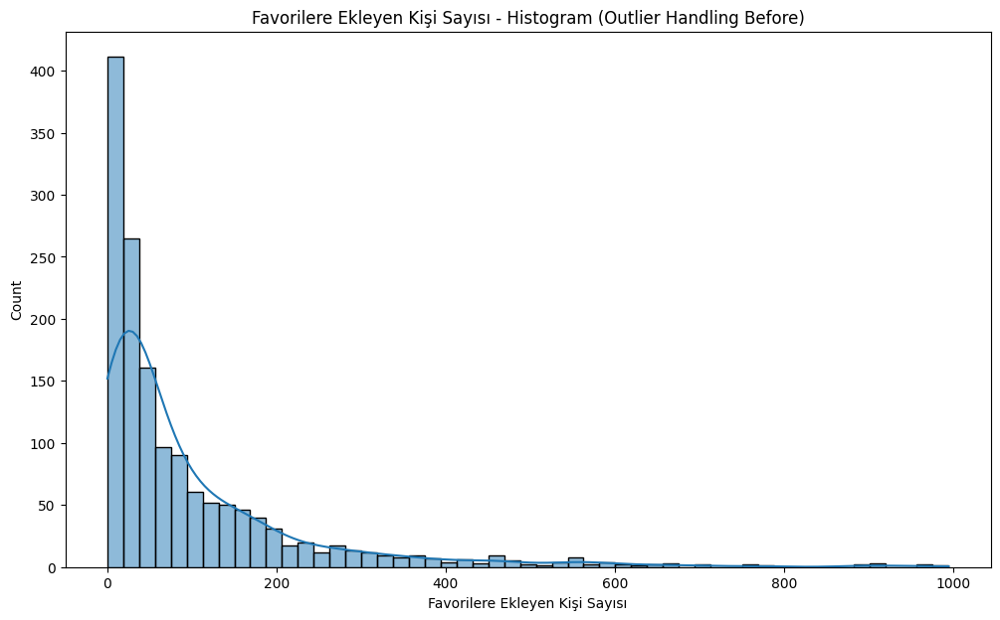

  ✓ Kaydedildi: visualization_v2\Favorilere Ekleyen Kişi Sayısı_before_boxplot.png


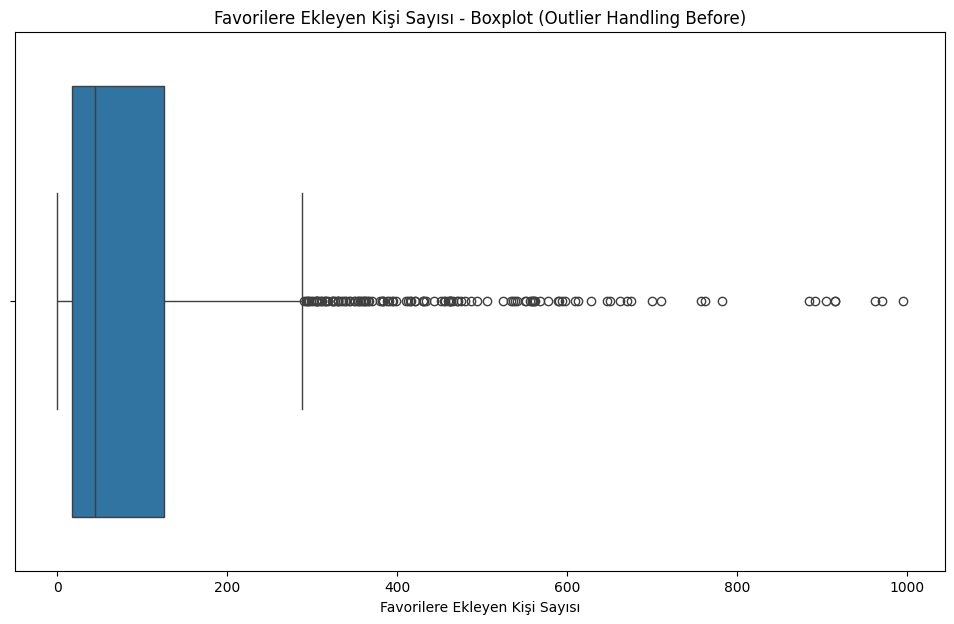

  Favorilere Ekleyen Kişi Sayısı -> Q1: 17.00, Q3: 126.00, IQR: 109.00
  Geçerli Sınırlar -> Alt: -146.50, Üst: 289.50
  Tespit edilen aykırı değer sayısı: 120
  İşlem SONRASI (Capping uygulanmış) görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2\Favorilere Ekleyen Kişi Sayısı_after_histogram.png


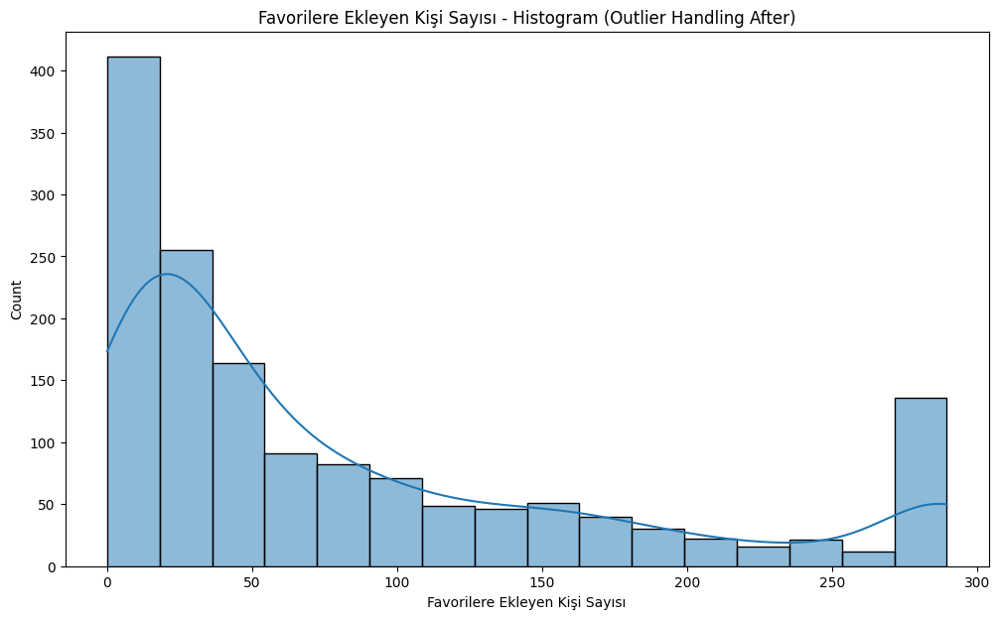

  ✓ Kaydedildi: visualization_v2\Favorilere Ekleyen Kişi Sayısı_after_boxplot.png


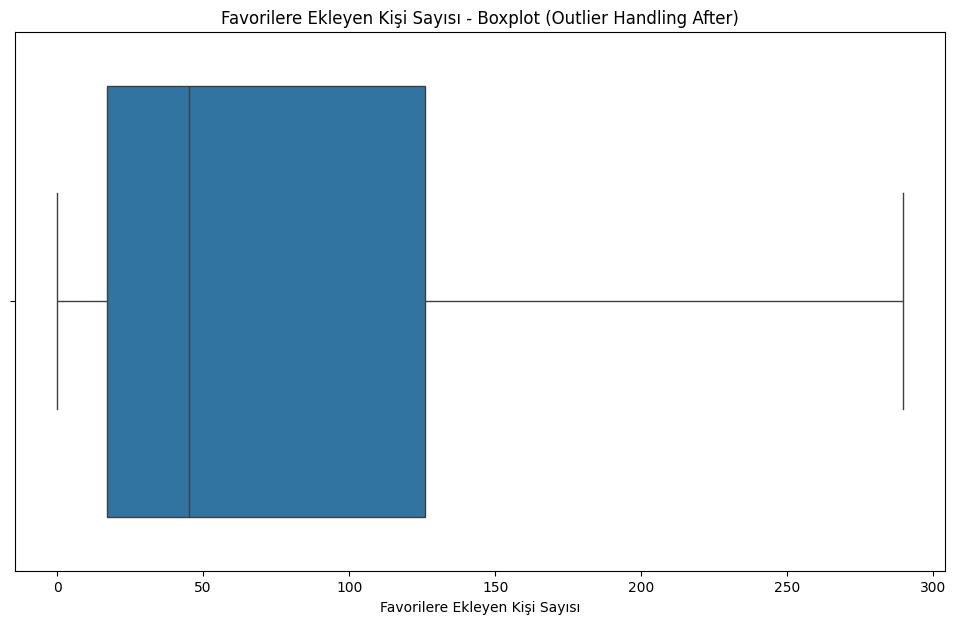


--- İşleniyor: Okuyacağım olarak işaretlenmiş sayısı ---
  İşlem ÖNCESİ görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2\Okuyacağım olarak işaretlenmiş sayısı_before_histogram.png


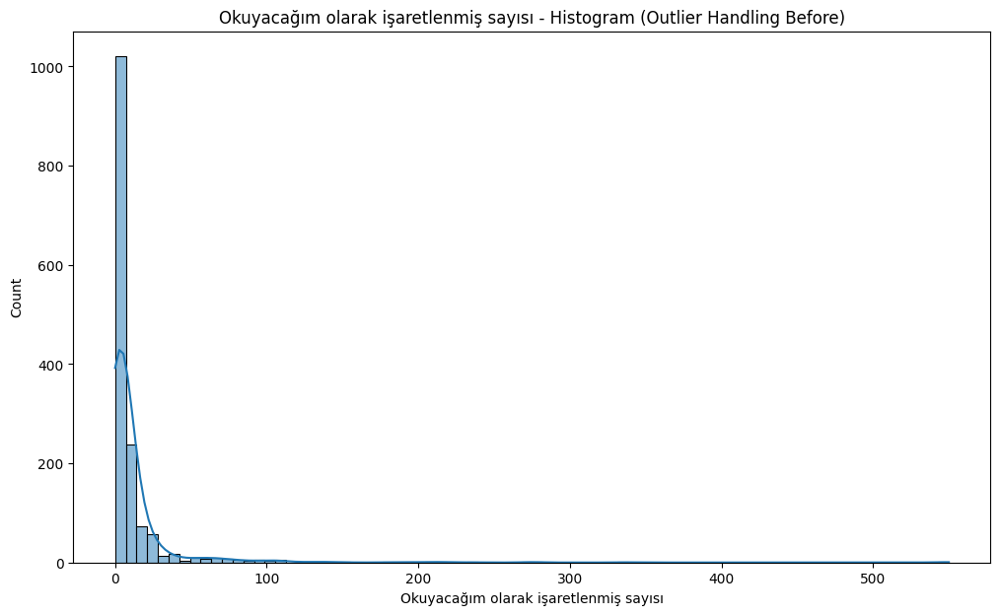

  ✓ Kaydedildi: visualization_v2\Okuyacağım olarak işaretlenmiş sayısı_before_boxplot.png


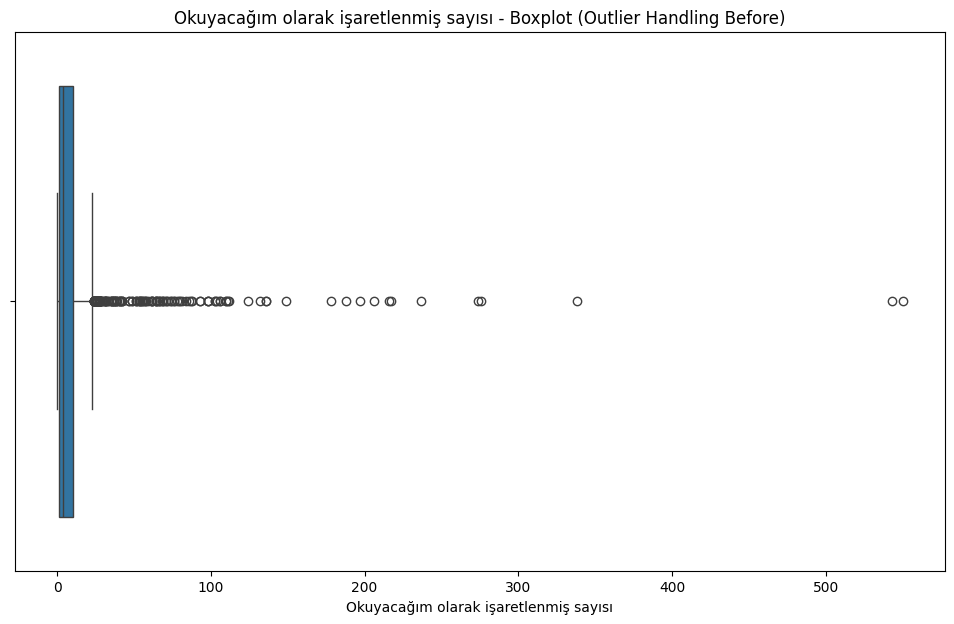

  Okuyacağım olarak işaretlenmiş sayısı -> Q1: 1.00, Q3: 10.00, IQR: 9.00
  Geçerli Sınırlar -> Alt: -12.50, Üst: 23.50
  Tespit edilen aykırı değer sayısı: 147
  İşlem SONRASI (Capping uygulanmış) görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2\Okuyacağım olarak işaretlenmiş sayısı_after_histogram.png


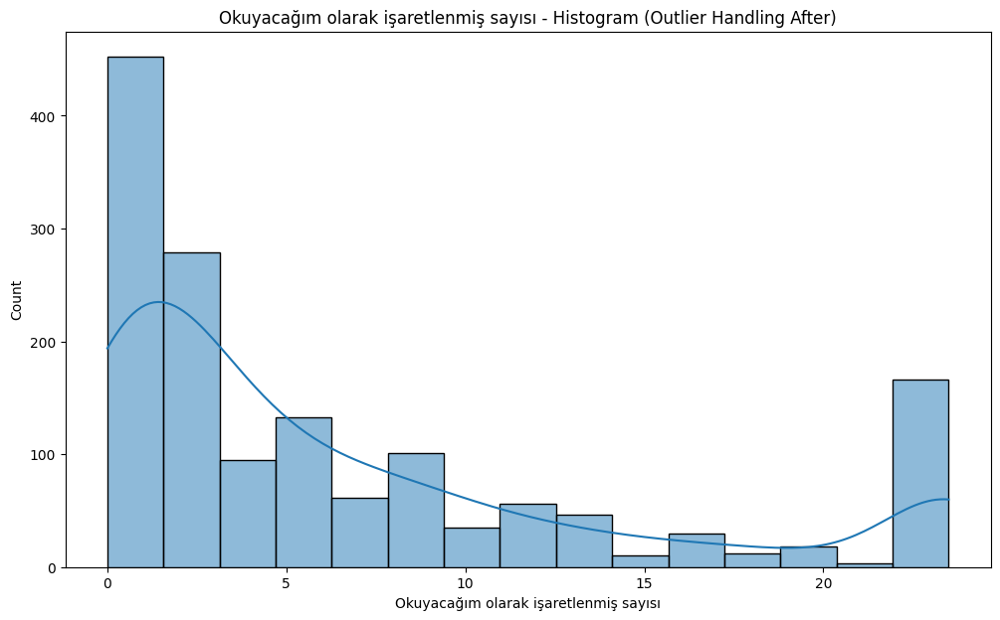

  ✓ Kaydedildi: visualization_v2\Okuyacağım olarak işaretlenmiş sayısı_after_boxplot.png


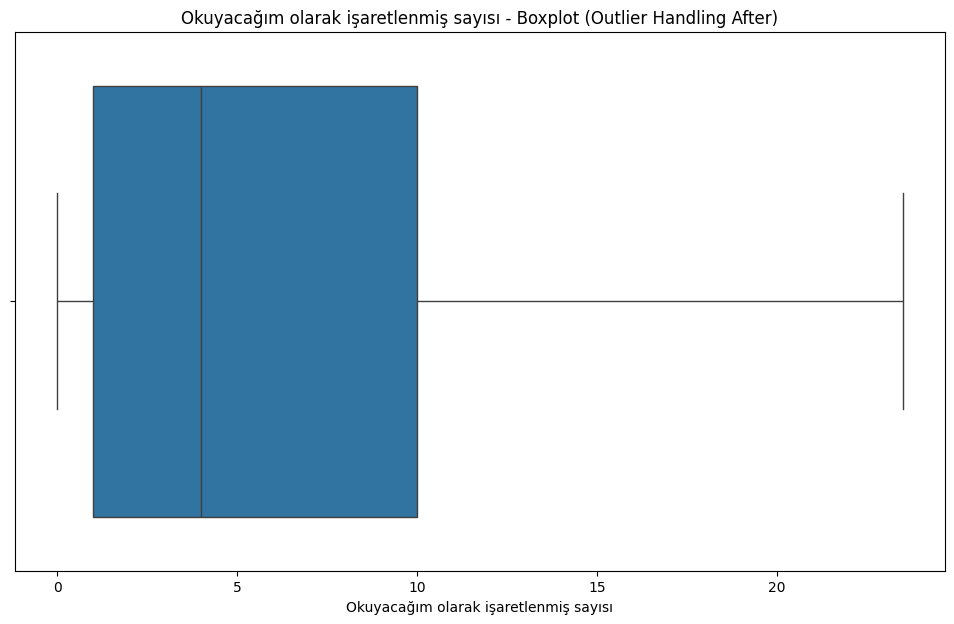


--- İşleniyor: Okudum olarak işaretlenmiş sayısı ---
  İşlem ÖNCESİ görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2\Okudum olarak işaretlenmiş sayısı_before_histogram.png


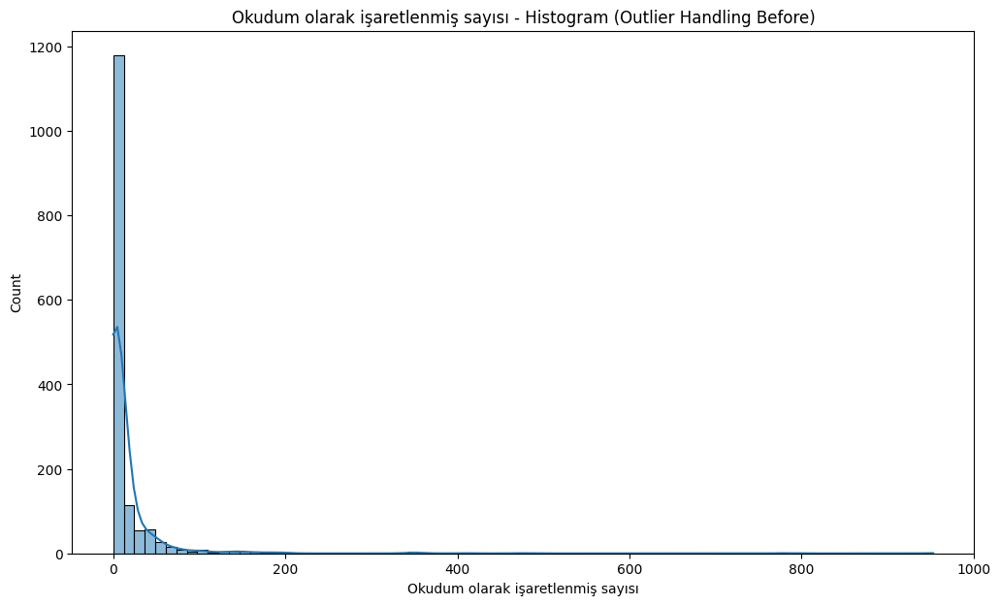

  ✓ Kaydedildi: visualization_v2\Okudum olarak işaretlenmiş sayısı_before_boxplot.png


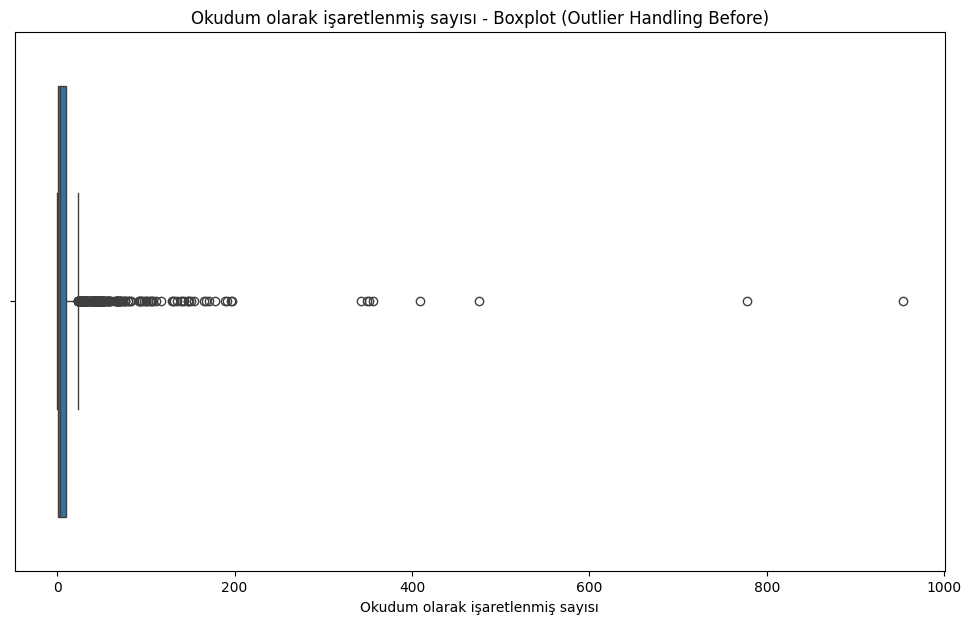

  Okudum olarak işaretlenmiş sayısı -> Q1: 1.00, Q3: 10.00, IQR: 9.00
  Geçerli Sınırlar -> Alt: -12.50, Üst: 23.50
  Tespit edilen aykırı değer sayısı: 210
  İşlem SONRASI (Capping uygulanmış) görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2\Okudum olarak işaretlenmiş sayısı_after_histogram.png


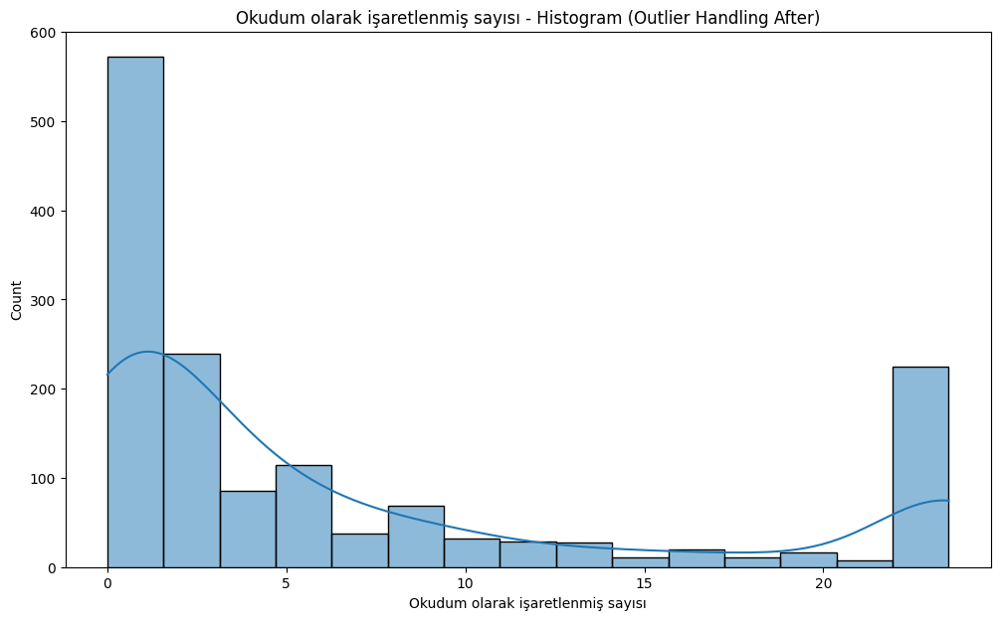

  ✓ Kaydedildi: visualization_v2\Okudum olarak işaretlenmiş sayısı_after_boxplot.png


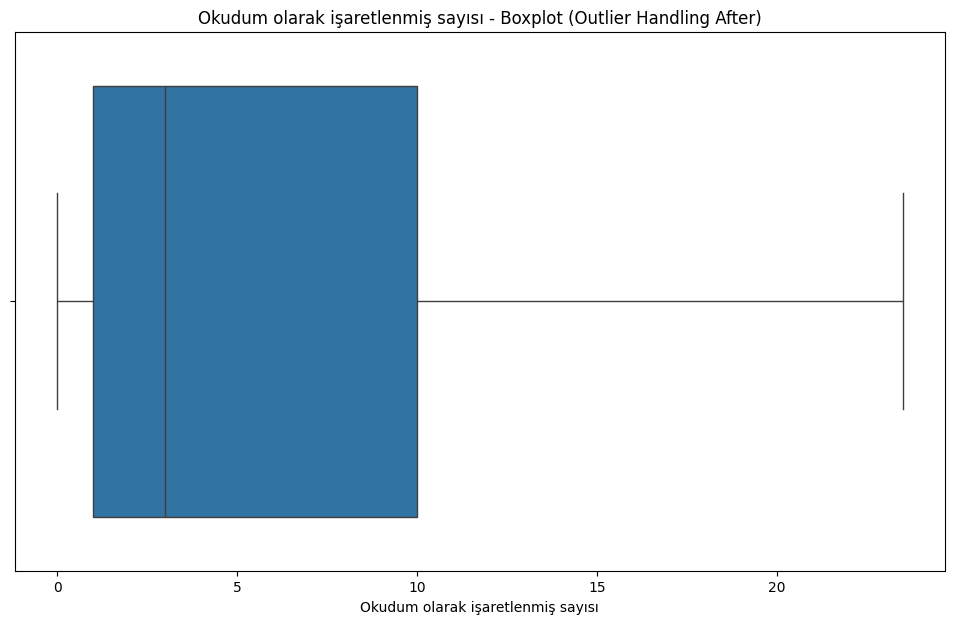


--- İşleniyor: Liste Fiyatı ---
  İşlem ÖNCESİ görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2\Liste Fiyatı_before_histogram.png


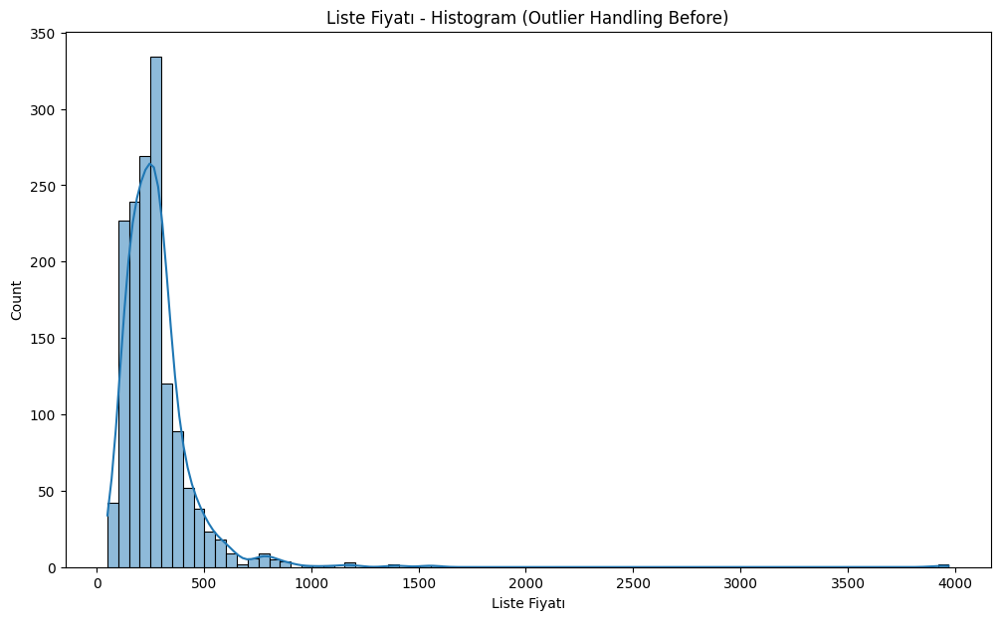

  ✓ Kaydedildi: visualization_v2\Liste Fiyatı_before_boxplot.png


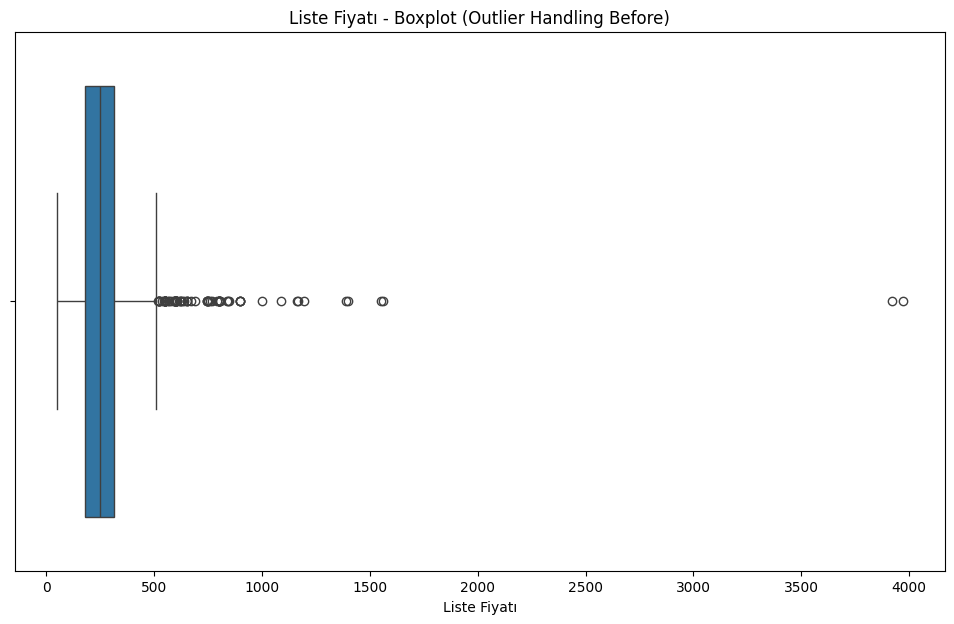

  Liste Fiyatı -> Q1: 180.00, Q3: 314.00, IQR: 134.00
  Geçerli Sınırlar -> Alt: -21.00, Üst: 515.00
  Tespit edilen aykırı değer sayısı: 83
  İşlem SONRASI (Capping uygulanmış) görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2\Liste Fiyatı_after_histogram.png


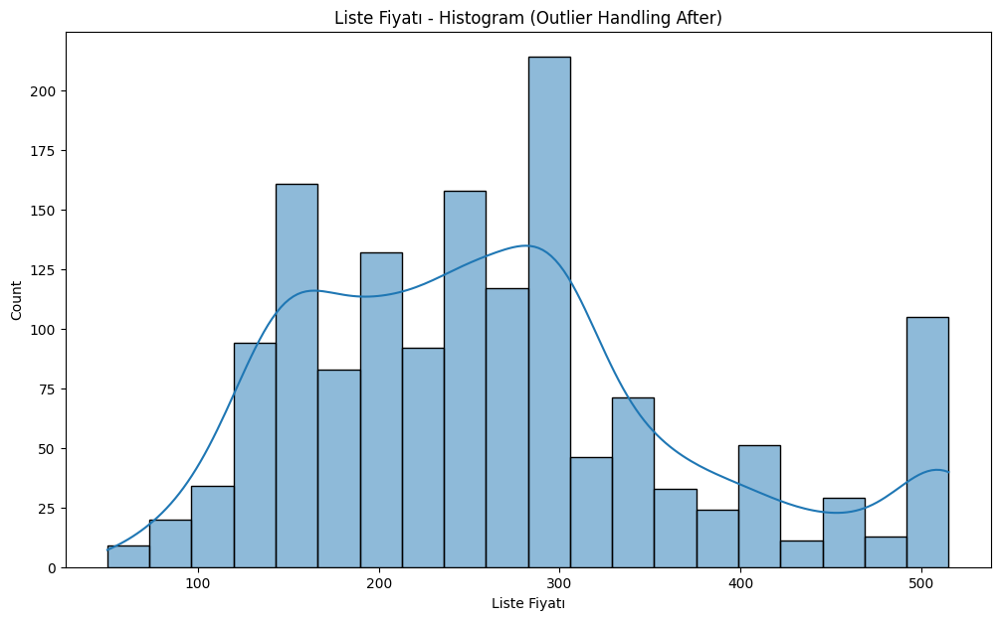

  ✓ Kaydedildi: visualization_v2\Liste Fiyatı_after_boxplot.png


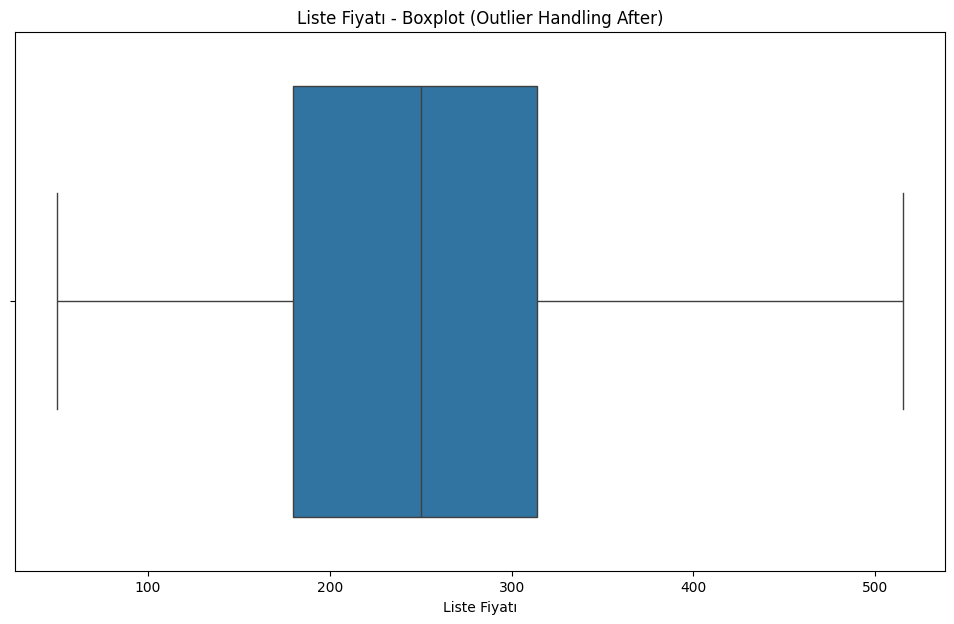


--- İşleniyor: Sayfa Sayısı ---
  İşlem ÖNCESİ görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2\Sayfa Sayısı_before_histogram.png


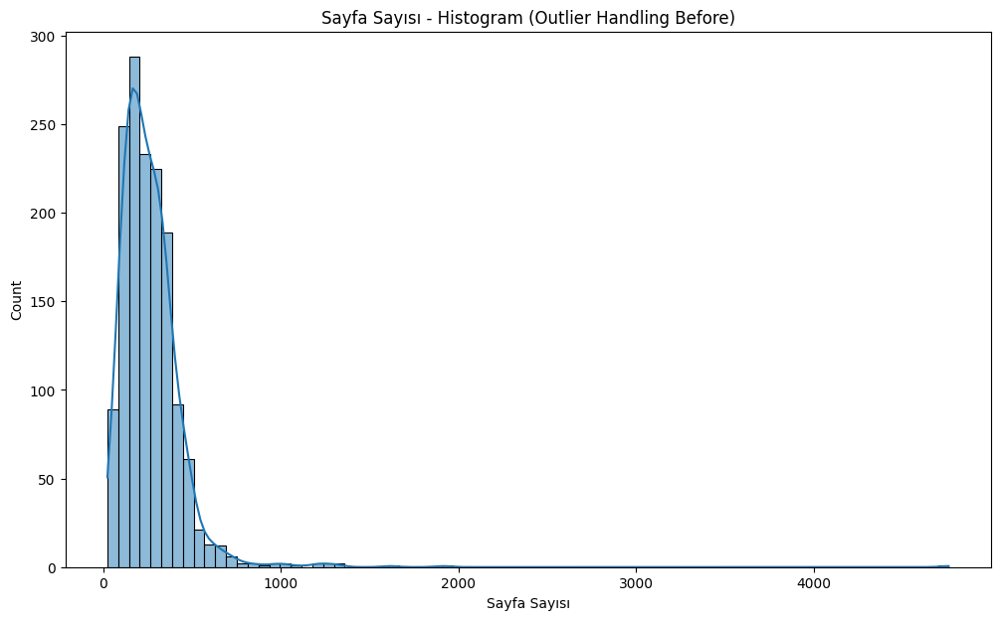

  ✓ Kaydedildi: visualization_v2\Sayfa Sayısı_before_boxplot.png


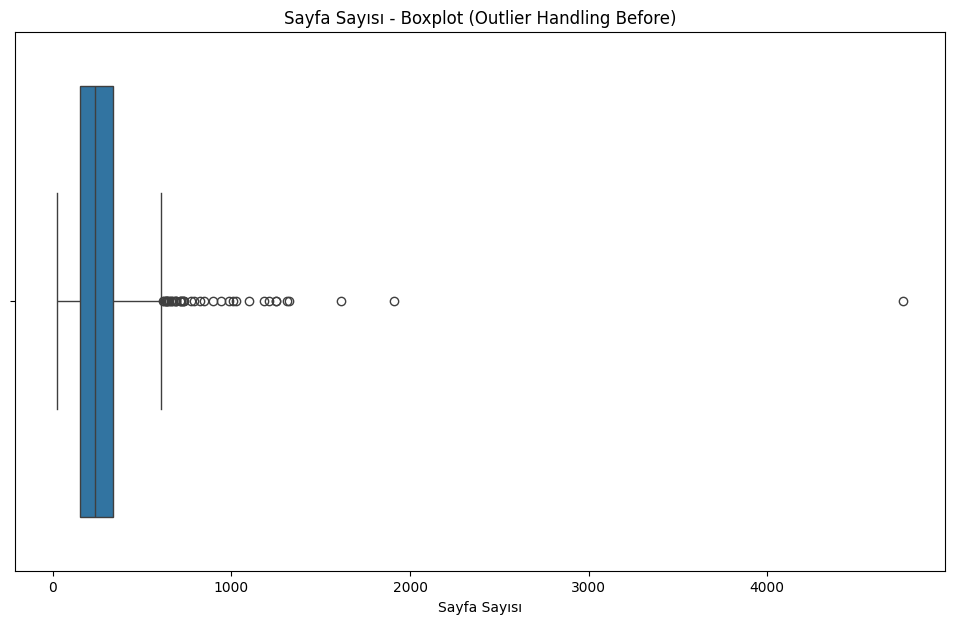

  Sayfa Sayısı -> Q1: 152.00, Q3: 336.00, IQR: 184.00
  Geçerli Sınırlar -> Alt: -124.00, Üst: 612.00
  Tespit edilen aykırı değer sayısı: 39
  İşlem SONRASI (Capping uygulanmış) görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2\Sayfa Sayısı_after_histogram.png


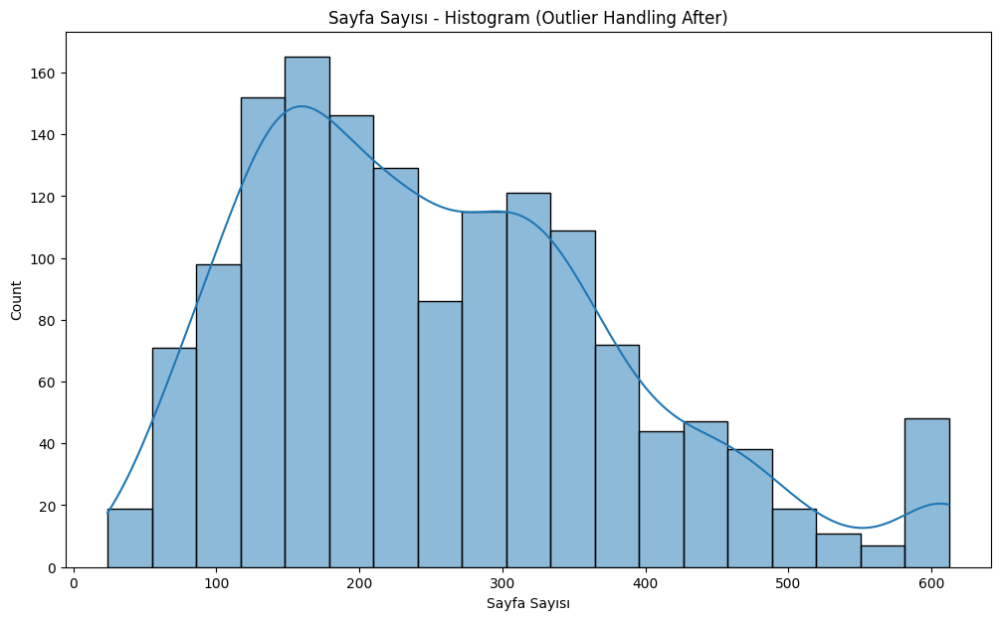

  ✓ Kaydedildi: visualization_v2\Sayfa Sayısı_after_boxplot.png


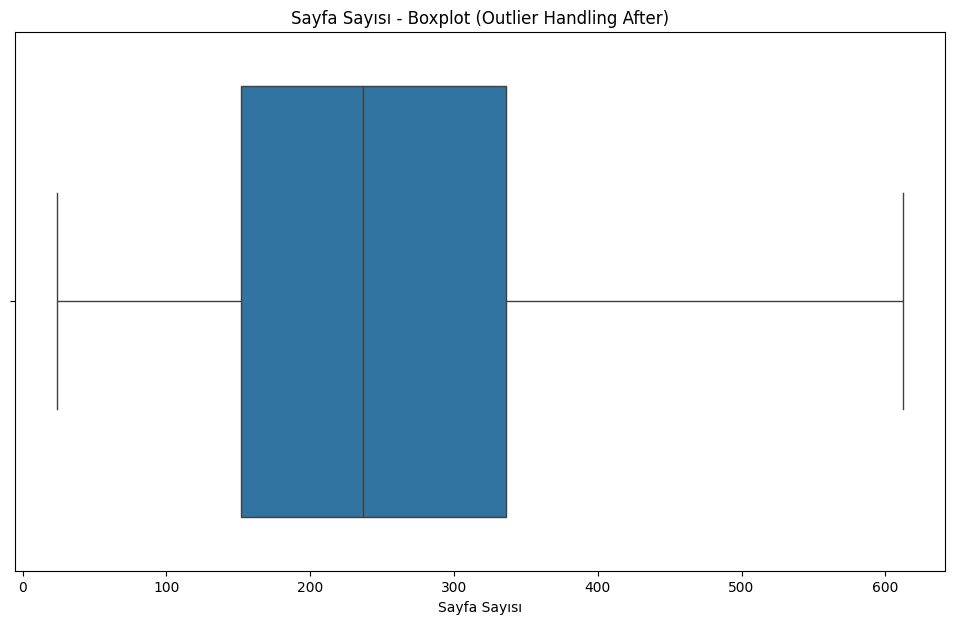


--- İşleniyor: Toplam Satılma Sayısı ---
  İşlem ÖNCESİ görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2\Toplam Satılma Sayısı_before_histogram.png


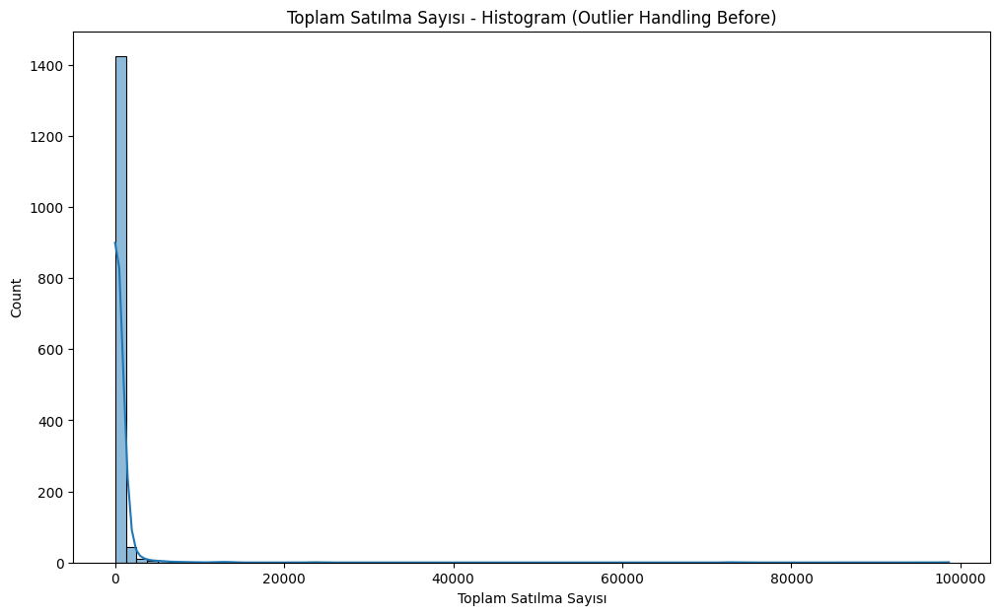

  ✓ Kaydedildi: visualization_v2\Toplam Satılma Sayısı_before_boxplot.png


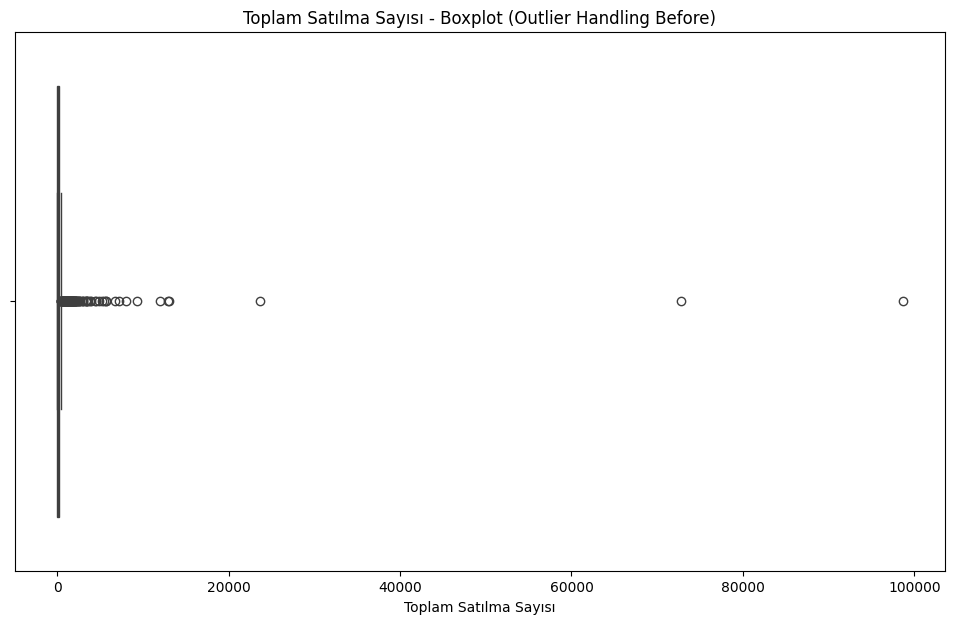

  Toplam Satılma Sayısı -> Q1: 40.00, Q3: 217.00, IQR: 177.00
  Geçerli Sınırlar -> Alt: -225.50, Üst: 482.50
  Tespit edilen aykırı değer sayısı: 145
  İşlem SONRASI (Capping uygulanmış) görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2\Toplam Satılma Sayısı_after_histogram.png


C:\Users\metehan\AppData\Local\Temp\ipykernel_8724\3307667499.py:168: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-225.5' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_cleaned.loc[df_cleaned[col_name] < lower_bound, col_name] = lower_bound


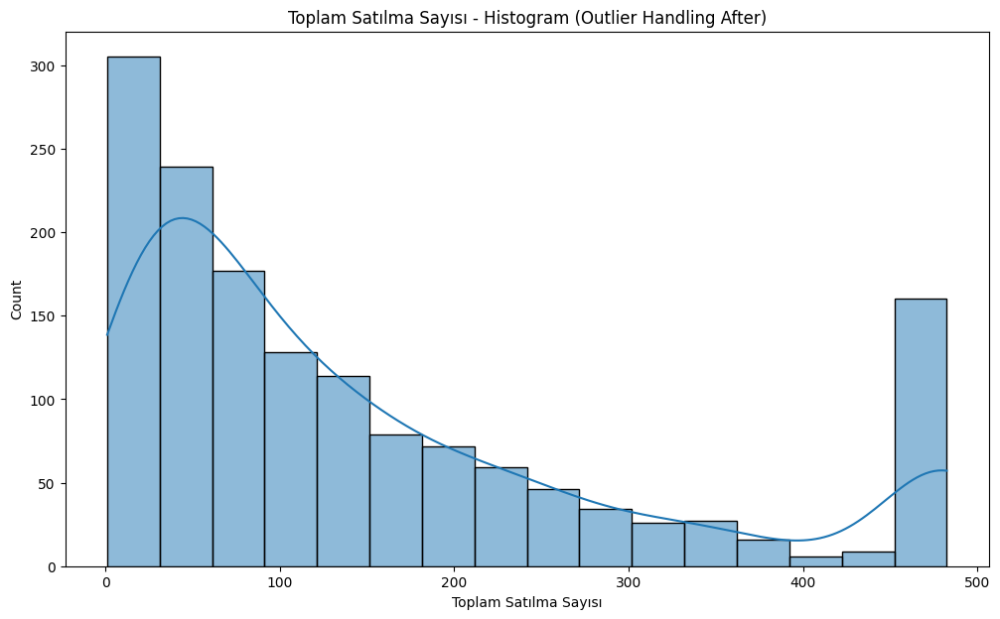

  ✓ Kaydedildi: visualization_v2\Toplam Satılma Sayısı_after_boxplot.png


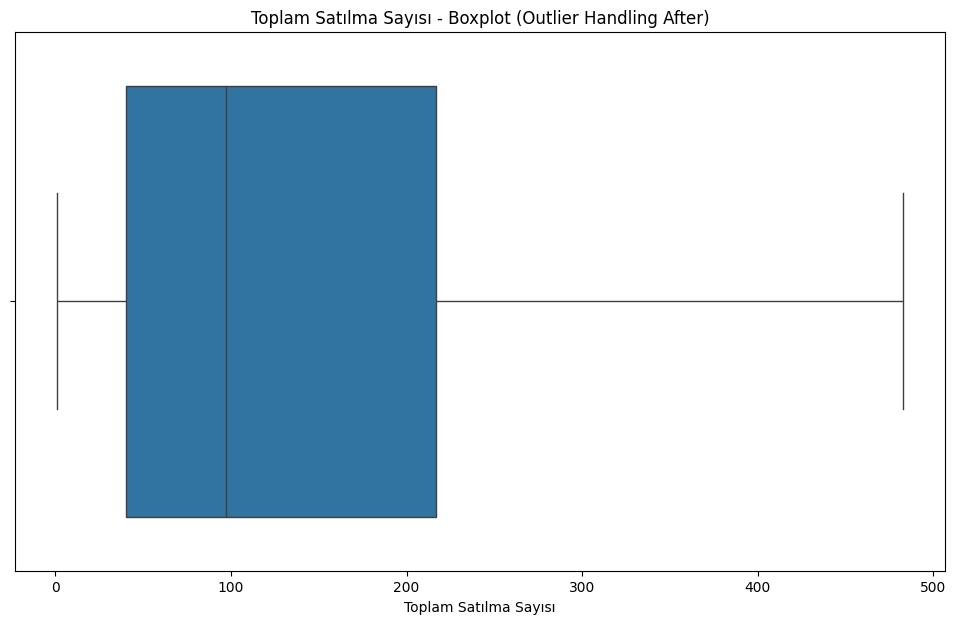


--- İşleniyor: Toplam Yorum Sayısı ---
  İşlem ÖNCESİ görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2\Toplam Yorum Sayısı_before_histogram.png


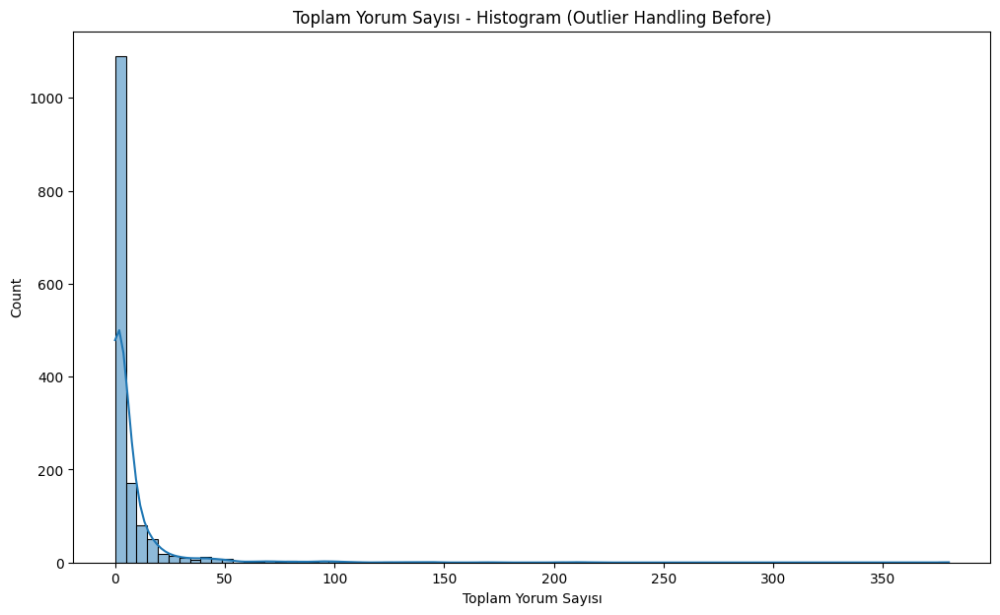

  ✓ Kaydedildi: visualization_v2\Toplam Yorum Sayısı_before_boxplot.png


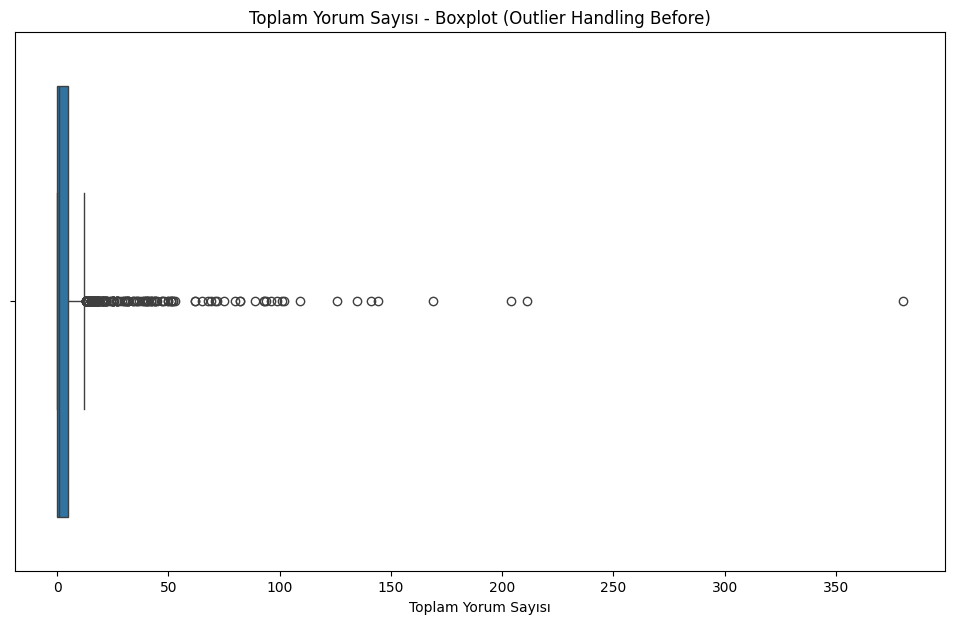

  Toplam Yorum Sayısı -> Q1: 0.00, Q3: 5.00, IQR: 5.00
  Geçerli Sınırlar -> Alt: -7.50, Üst: 12.50
  Tespit edilen aykırı değer sayısı: 179
  İşlem SONRASI (Capping uygulanmış) görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2\Toplam Yorum Sayısı_after_histogram.png


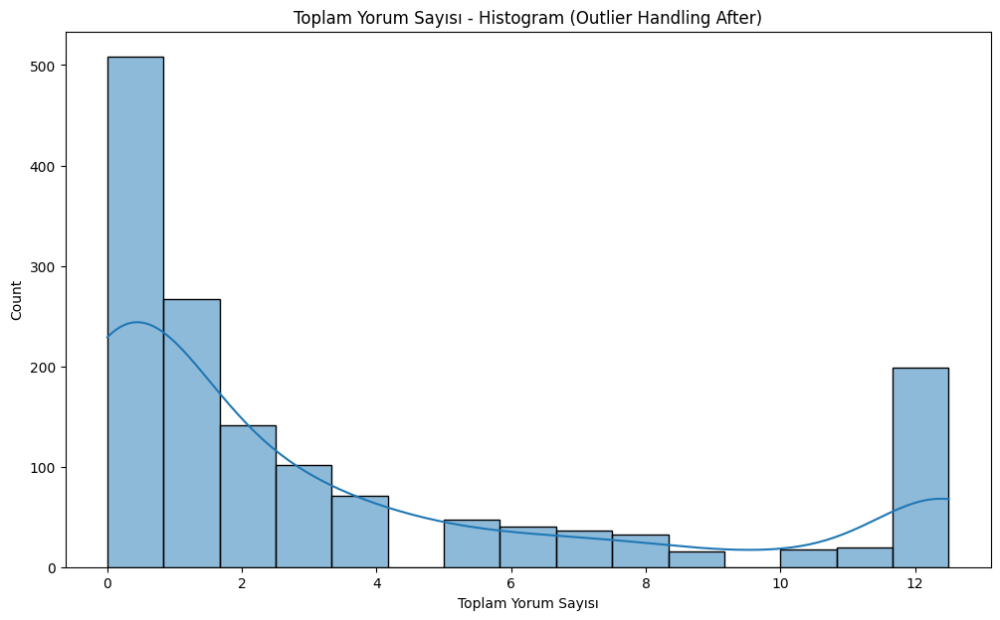

  ✓ Kaydedildi: visualization_v2\Toplam Yorum Sayısı_after_boxplot.png


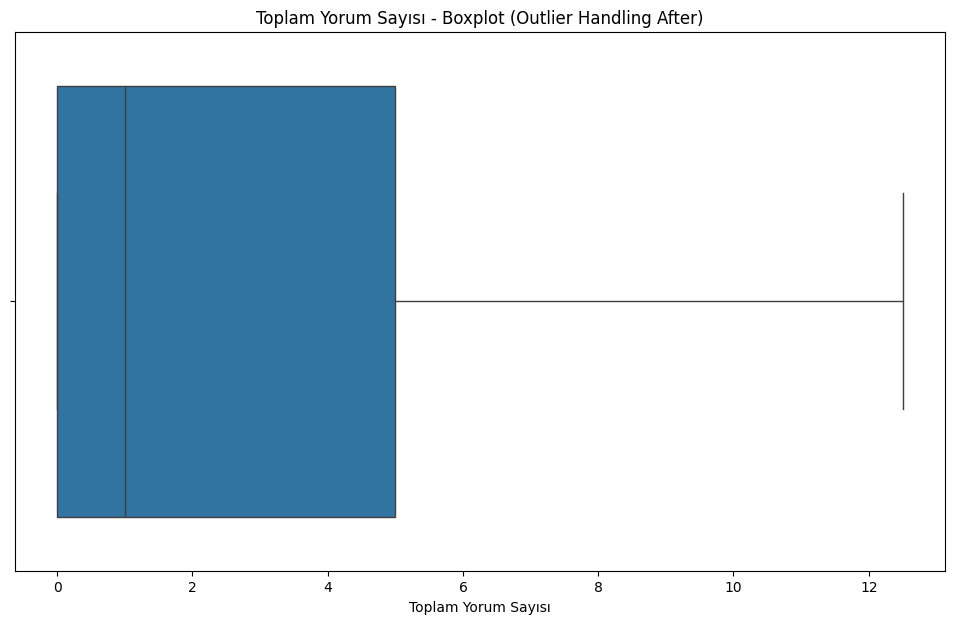


--- İşleniyor: Puan ---
  İşlem ÖNCESİ görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2\Puan_before_histogram.png


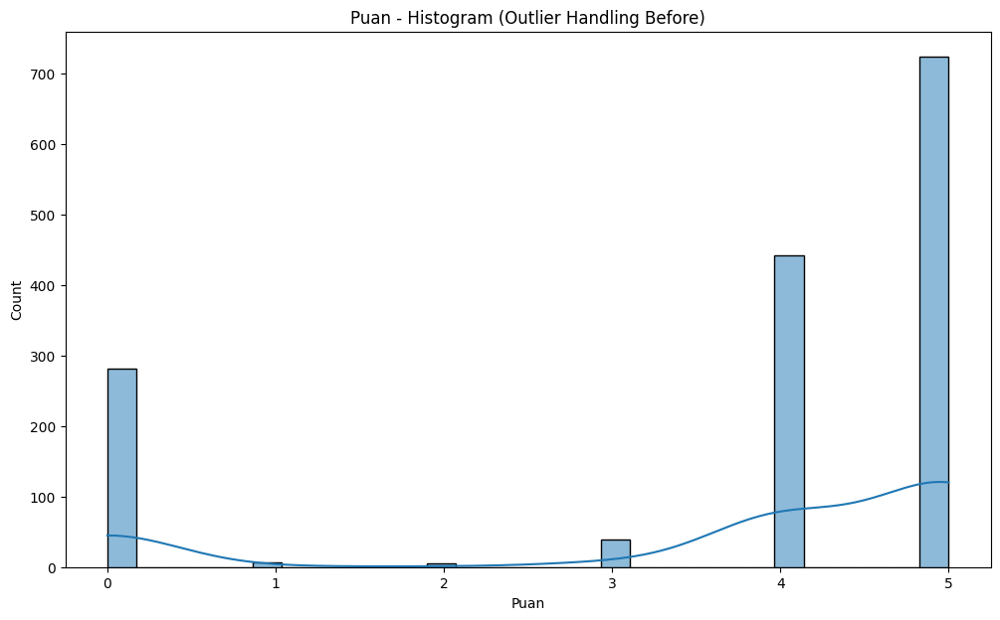

  ✓ Kaydedildi: visualization_v2\Puan_before_boxplot.png


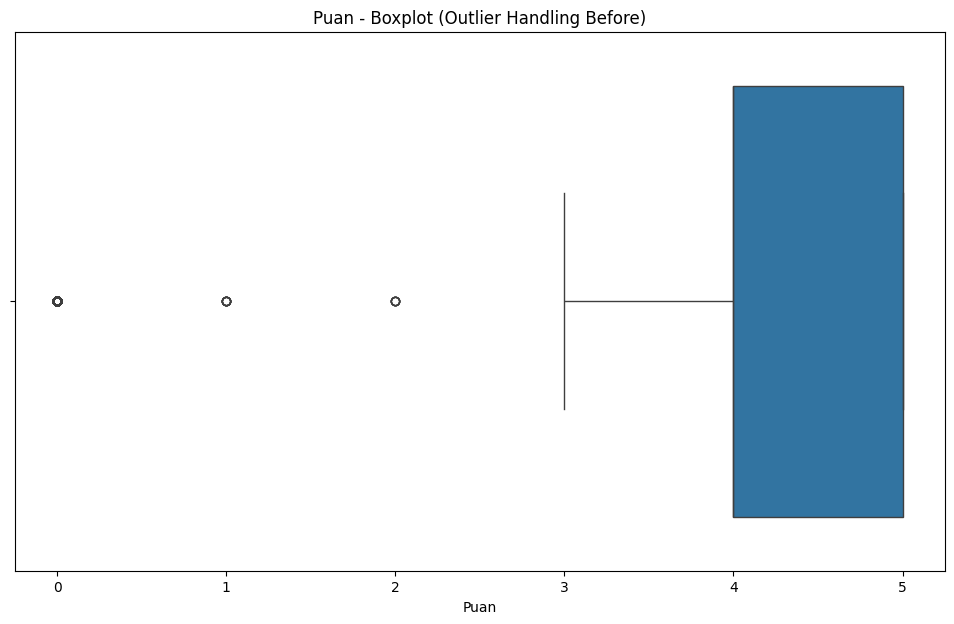

  Puan -> Q1: 4.00, Q3: 5.00, IQR: 1.00
  Geçerli Sınırlar -> Alt: 2.50, Üst: 6.50
  Tespit edilen aykırı değer sayısı: 293
  İşlem SONRASI (Capping uygulanmış) görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2\Puan_after_histogram.png


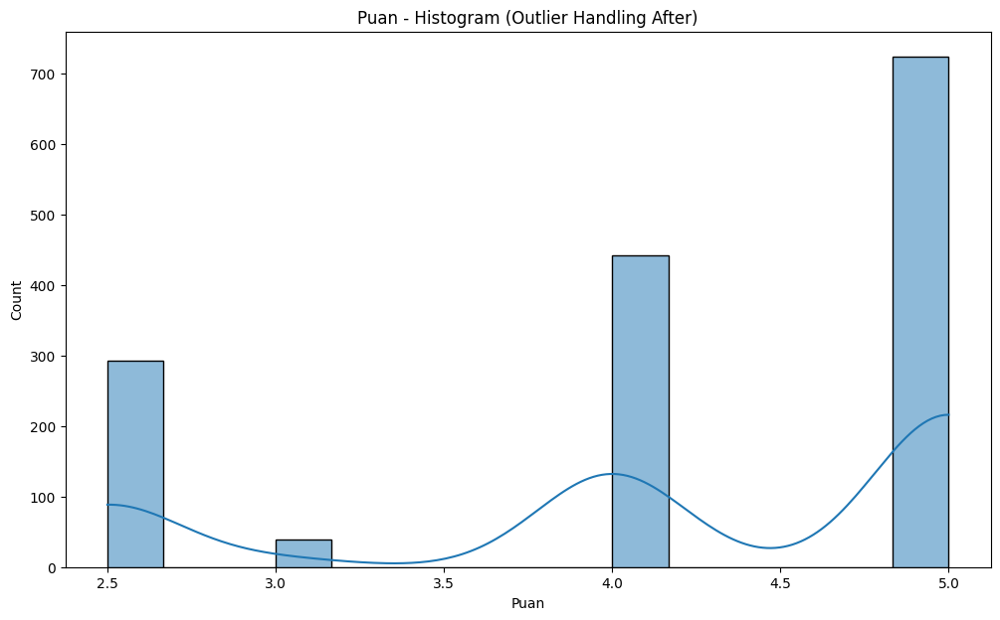

  ✓ Kaydedildi: visualization_v2\Puan_after_boxplot.png


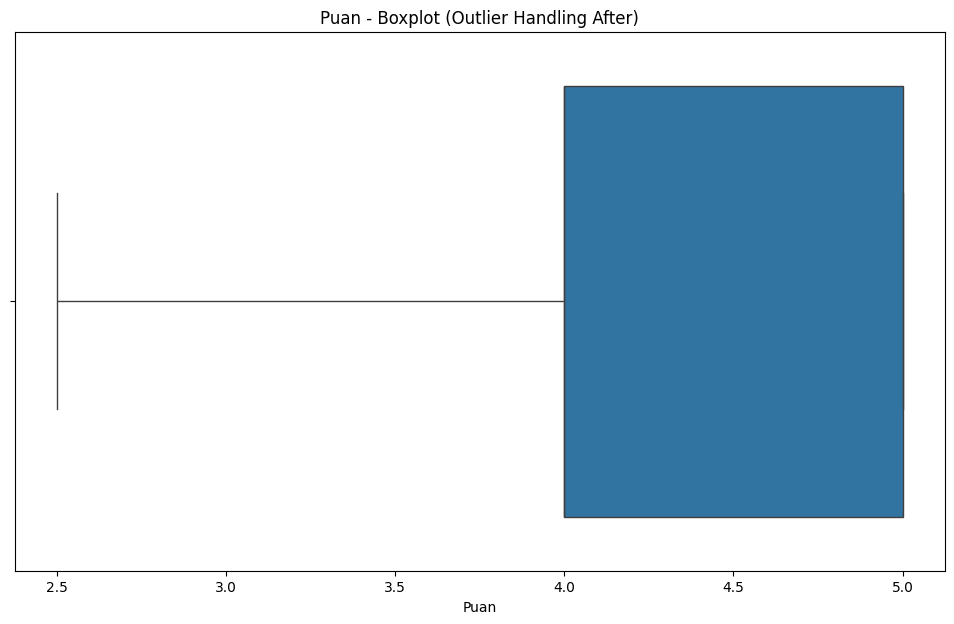


--- İşleniyor: Oy_Sayisi ---
  İşlem ÖNCESİ görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2\Oy_Sayisi_before_histogram.png


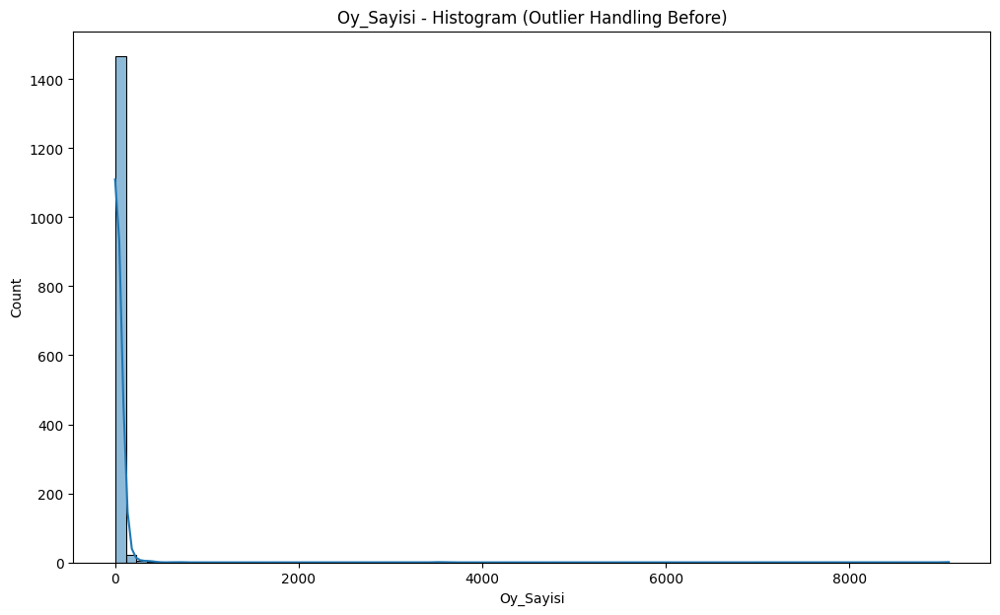

  ✓ Kaydedildi: visualization_v2\Oy_Sayisi_before_boxplot.png


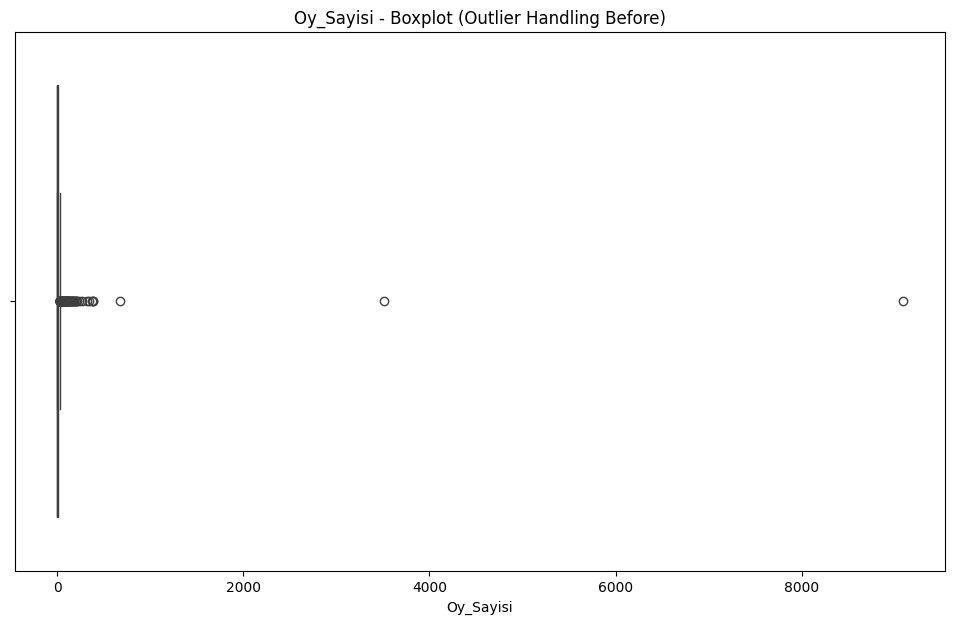

  Oy_Sayisi -> Q1: 1.00, Q3: 12.00, IQR: 11.00
  Geçerli Sınırlar -> Alt: -15.50, Üst: 28.50
  Tespit edilen aykırı değer sayısı: 187
  İşlem SONRASI (Capping uygulanmış) görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2\Oy_Sayisi_after_histogram.png


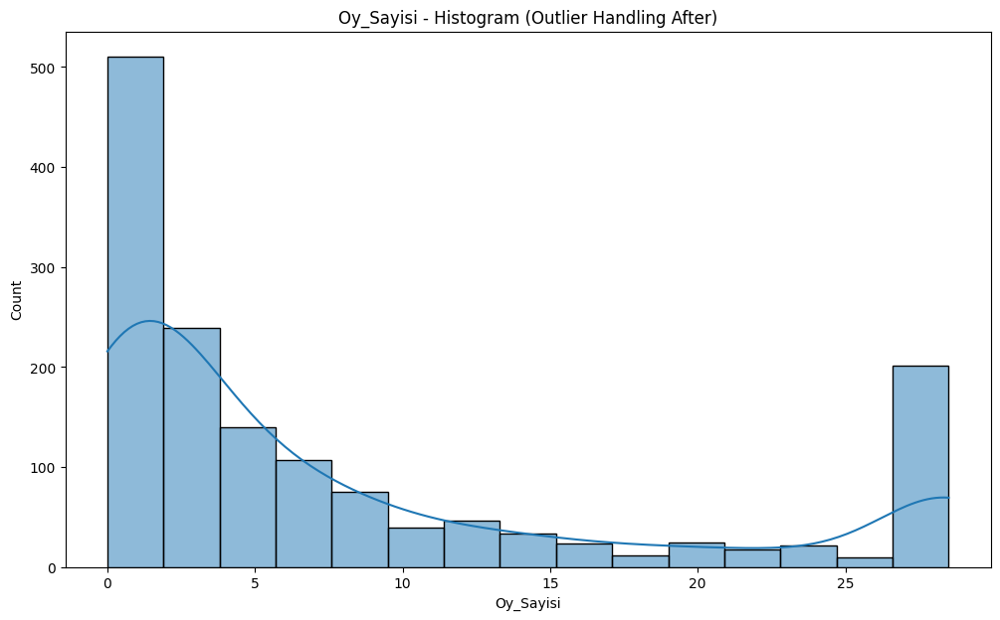

  ✓ Kaydedildi: visualization_v2\Oy_Sayisi_after_boxplot.png


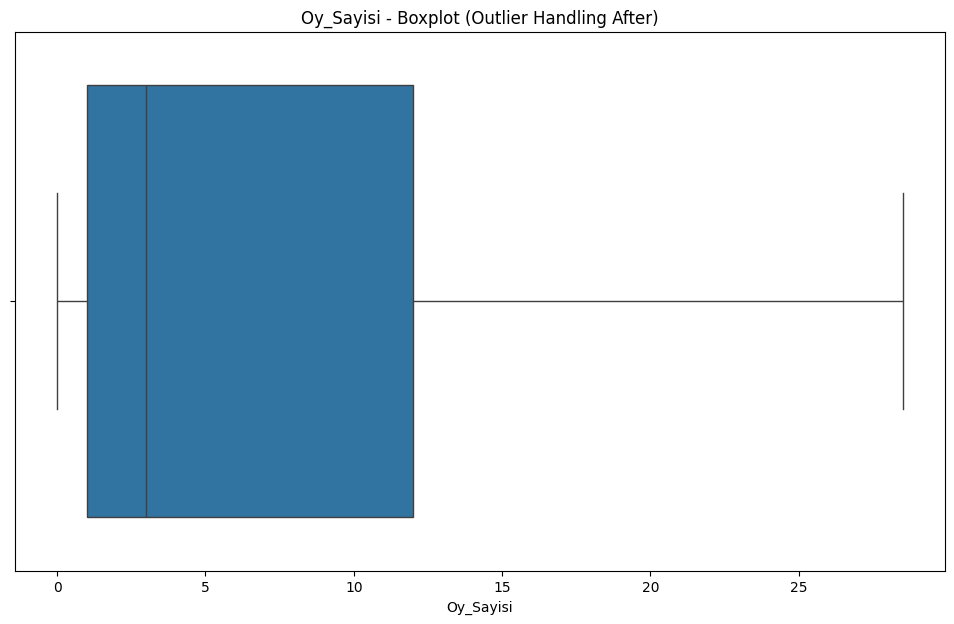


--- İşleniyor: Yayin_Yili ---
  İşlem ÖNCESİ görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2\Yayin_Yili_before_histogram.png


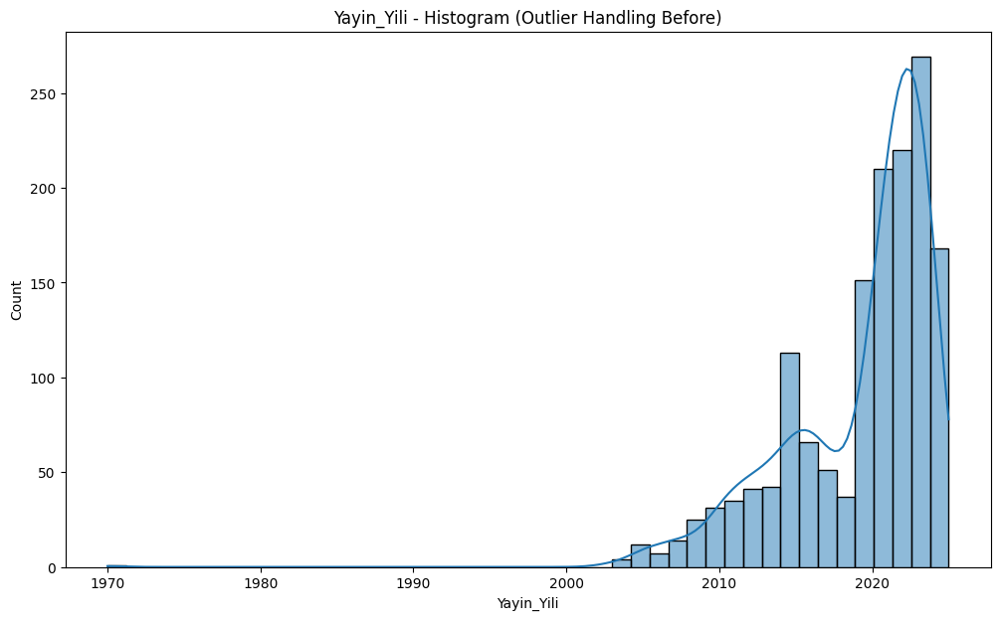

  ✓ Kaydedildi: visualization_v2\Yayin_Yili_before_boxplot.png


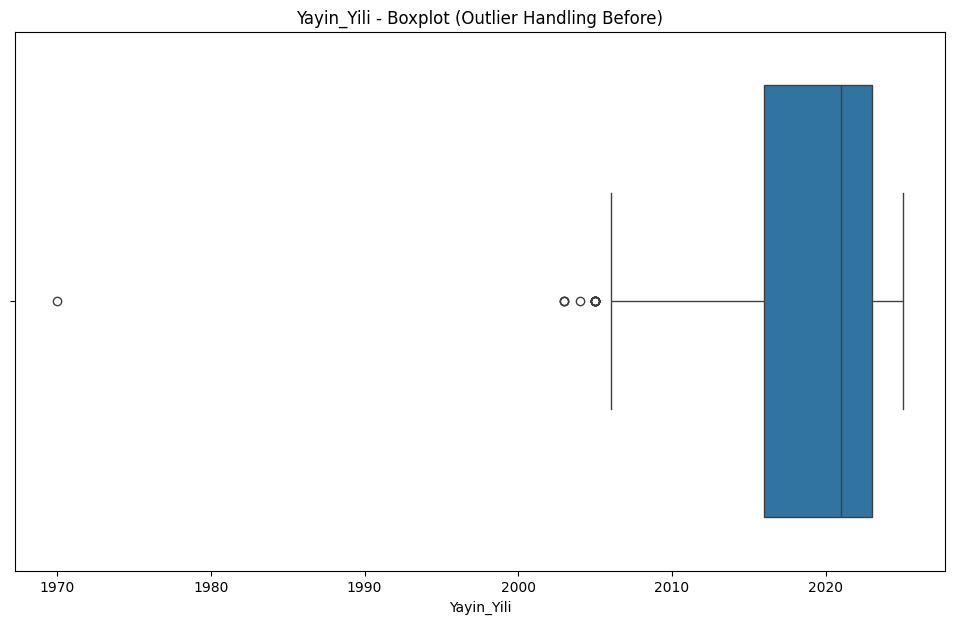

  Yayin_Yili -> Q1: 2016.00, Q3: 2023.00, IQR: 7.00
  Geçerli Sınırlar -> Alt: 2005.50, Üst: 2033.50
  Tespit edilen aykırı değer sayısı: 17
  İşlem SONRASI (Capping uygulanmış) görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2\Yayin_Yili_after_histogram.png


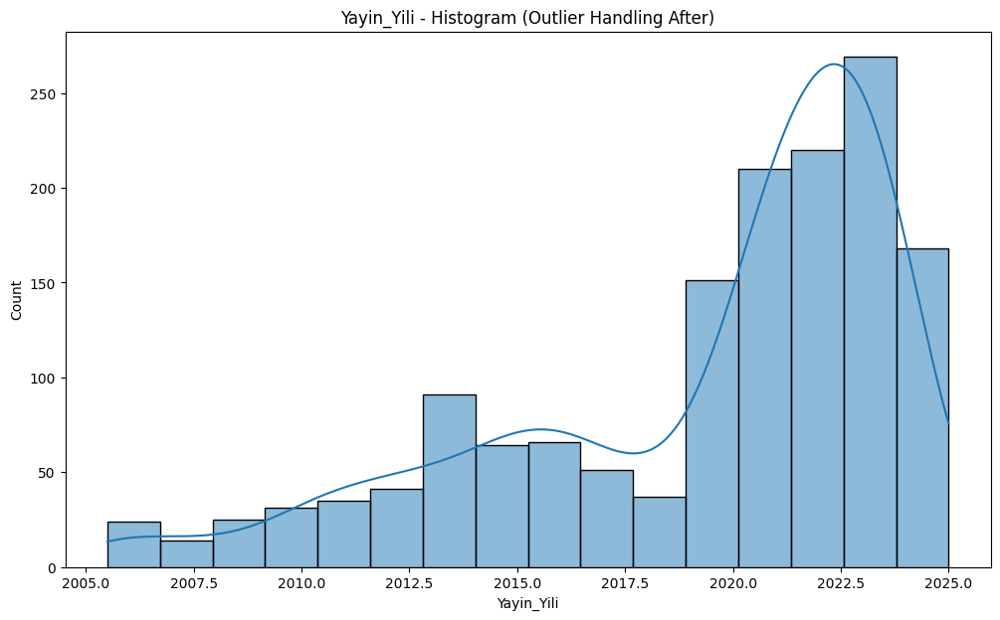

  ✓ Kaydedildi: visualization_v2\Yayin_Yili_after_boxplot.png


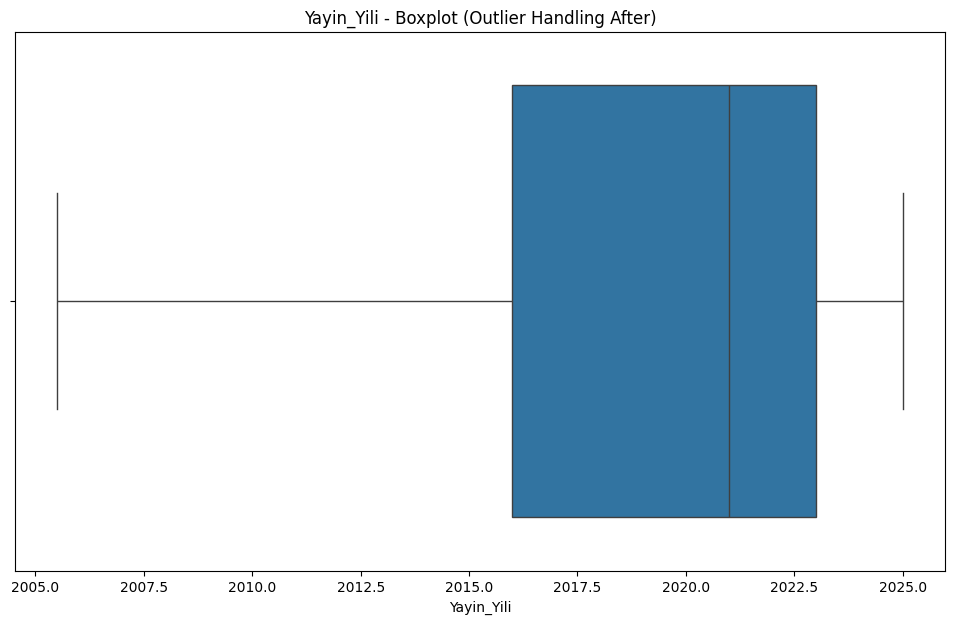


--- İşleniyor: En ---
  İşlem ÖNCESİ görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2\En_before_histogram.png


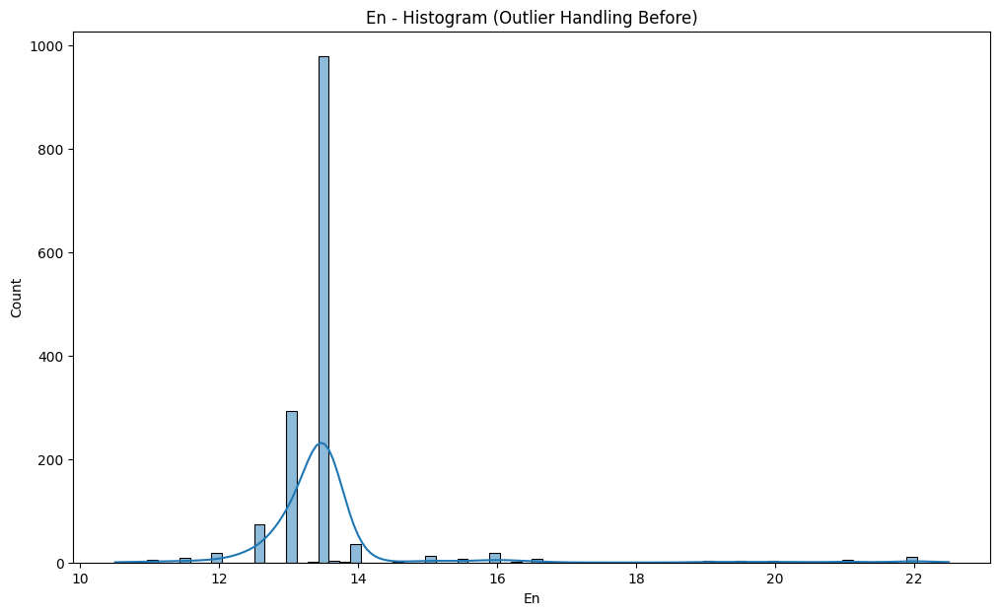

  ✓ Kaydedildi: visualization_v2\En_before_boxplot.png


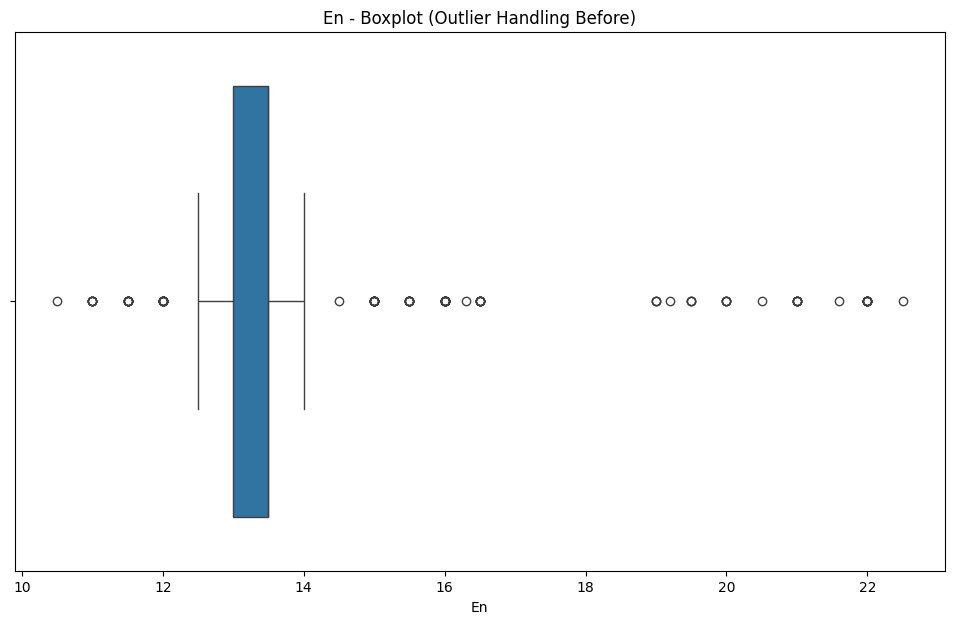

  En -> Q1: 13.00, Q3: 13.50, IQR: 0.50
  Geçerli Sınırlar -> Alt: 12.25, Üst: 14.25
  Tespit edilen aykırı değer sayısı: 111
  İşlem SONRASI (Capping uygulanmış) görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2\En_after_histogram.png


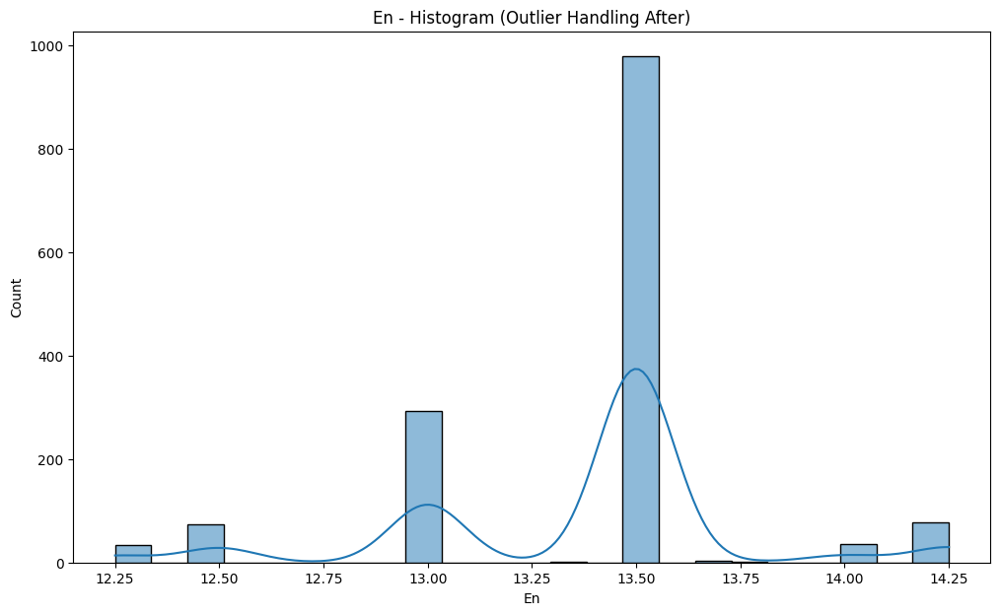

  ✓ Kaydedildi: visualization_v2\En_after_boxplot.png


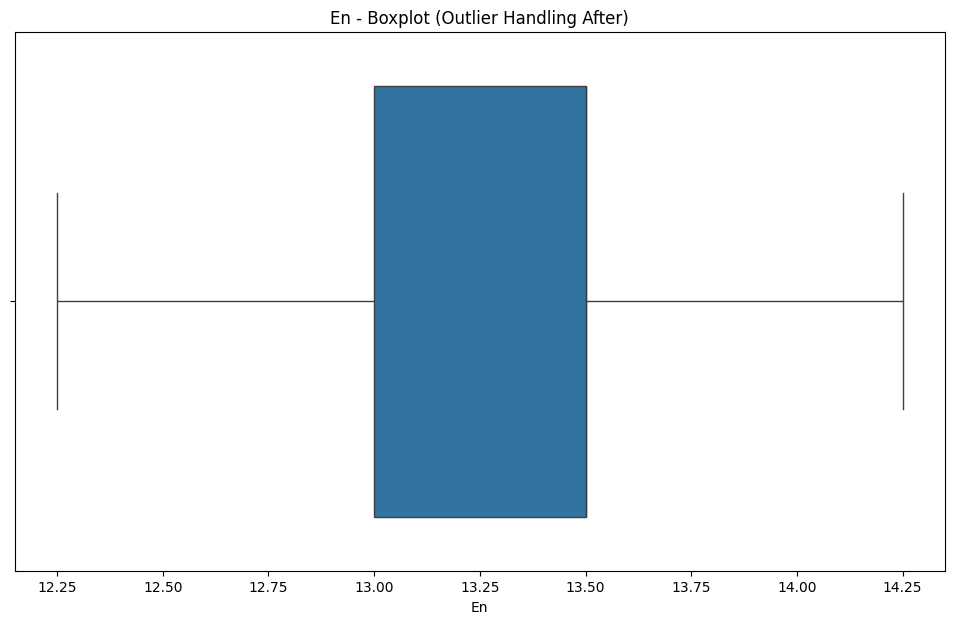


--- İşleniyor: Boy ---
  İşlem ÖNCESİ görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2\Boy_before_histogram.png


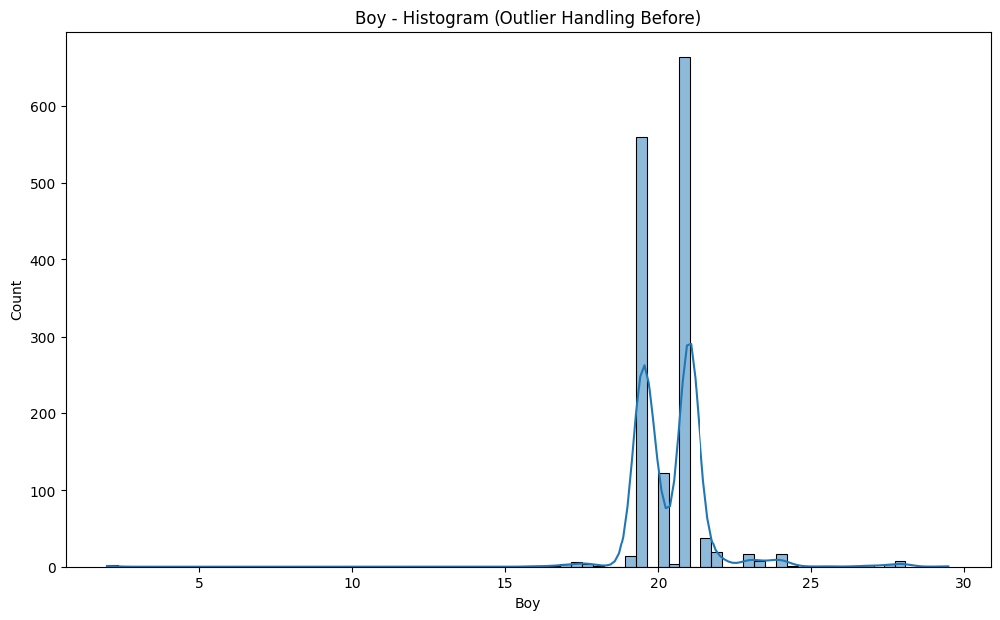

  ✓ Kaydedildi: visualization_v2\Boy_before_boxplot.png


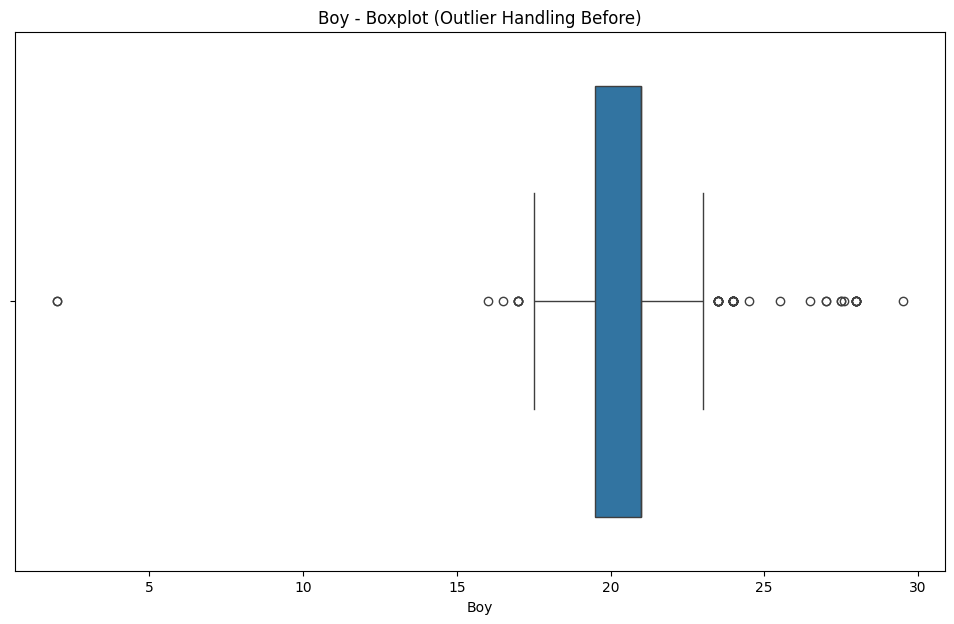

  Boy -> Q1: 19.50, Q3: 21.00, IQR: 1.50
  Geçerli Sınırlar -> Alt: 17.25, Üst: 23.25
  Tespit edilen aykırı değer sayısı: 49
  İşlem SONRASI (Capping uygulanmış) görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2\Boy_after_histogram.png


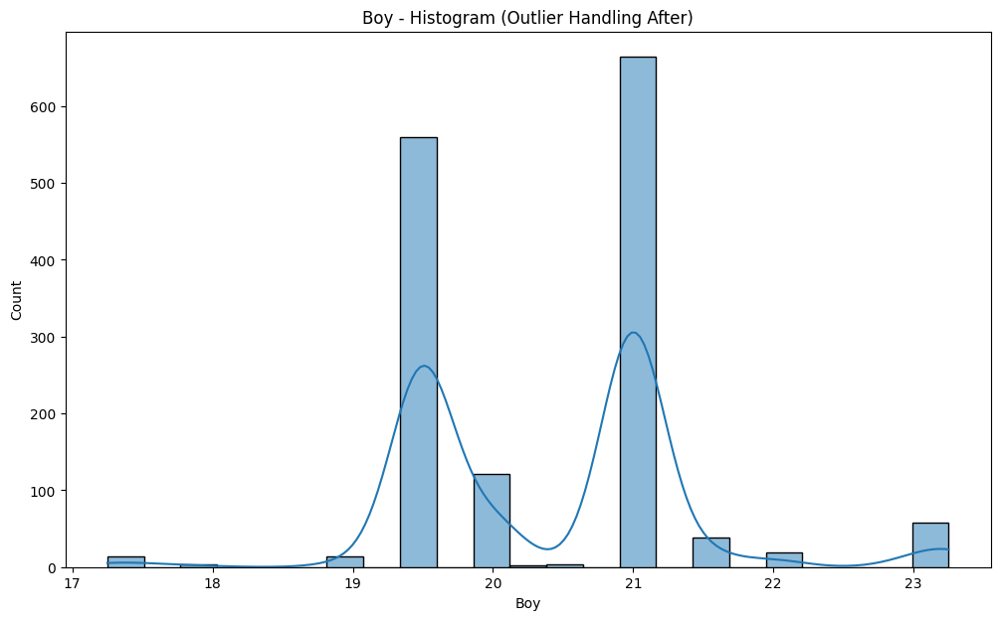

  ✓ Kaydedildi: visualization_v2\Boy_after_boxplot.png


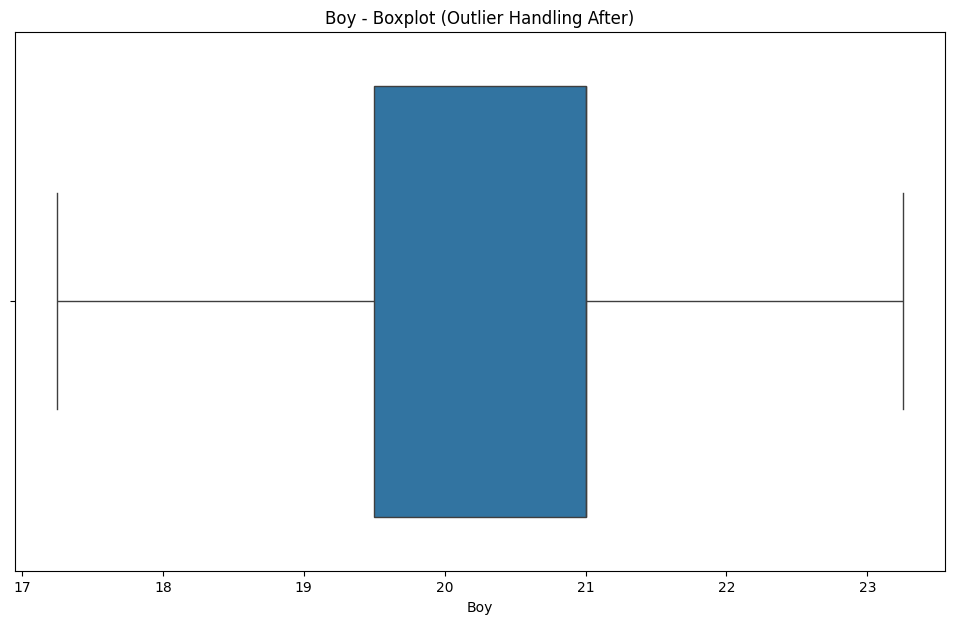


--- İşleniyor: Yazar_Kitap_Sayisi ---
  İşlem ÖNCESİ görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2\Yazar_Kitap_Sayisi_before_histogram.png


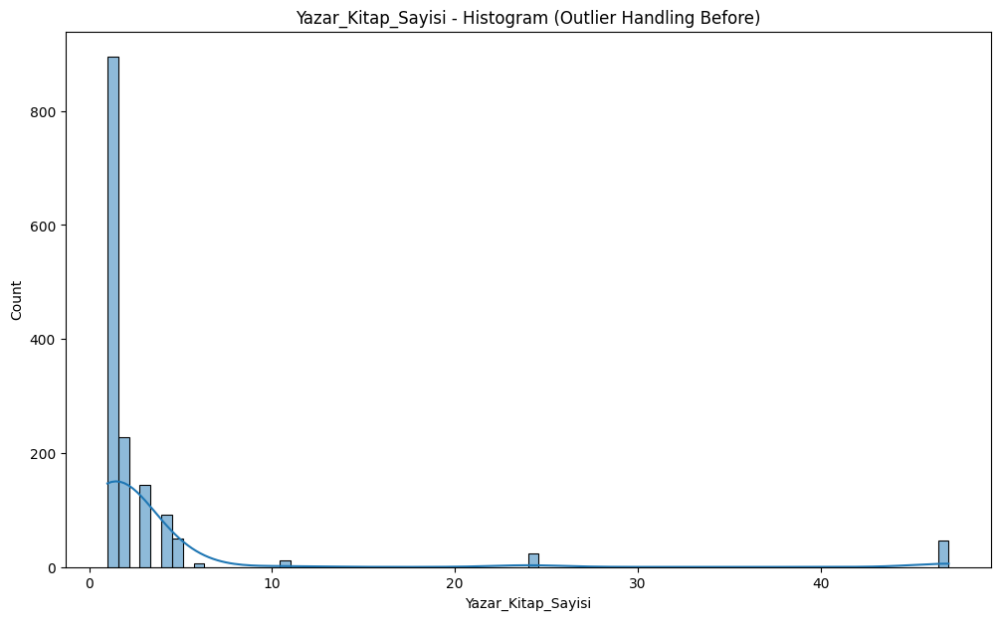

  ✓ Kaydedildi: visualization_v2\Yazar_Kitap_Sayisi_before_boxplot.png


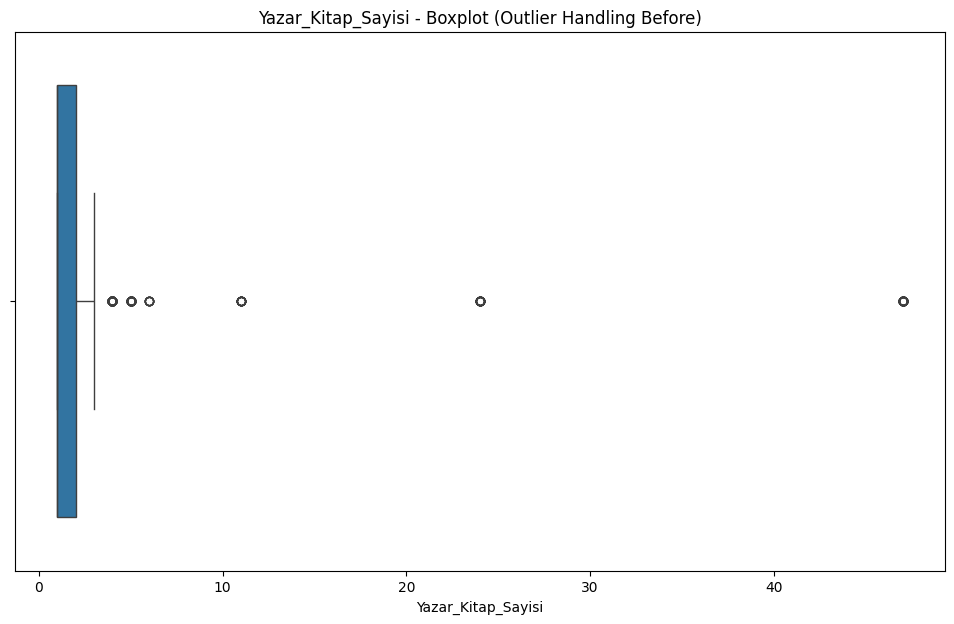

  Yazar_Kitap_Sayisi -> Q1: 1.00, Q3: 2.00, IQR: 1.00
  Geçerli Sınırlar -> Alt: -0.50, Üst: 3.50
  Tespit edilen aykırı değer sayısı: 230
  İşlem SONRASI (Capping uygulanmış) görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2\Yazar_Kitap_Sayisi_after_histogram.png


C:\Users\metehan\AppData\Local\Temp\ipykernel_8724\3307667499.py:168: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.5' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_cleaned.loc[df_cleaned[col_name] < lower_bound, col_name] = lower_bound


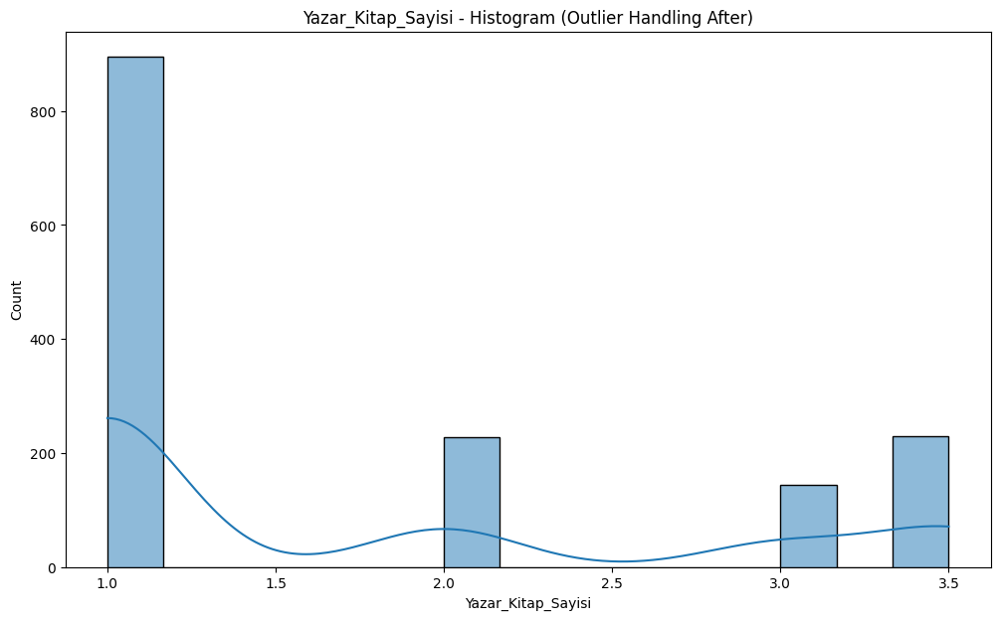

  ✓ Kaydedildi: visualization_v2\Yazar_Kitap_Sayisi_after_boxplot.png


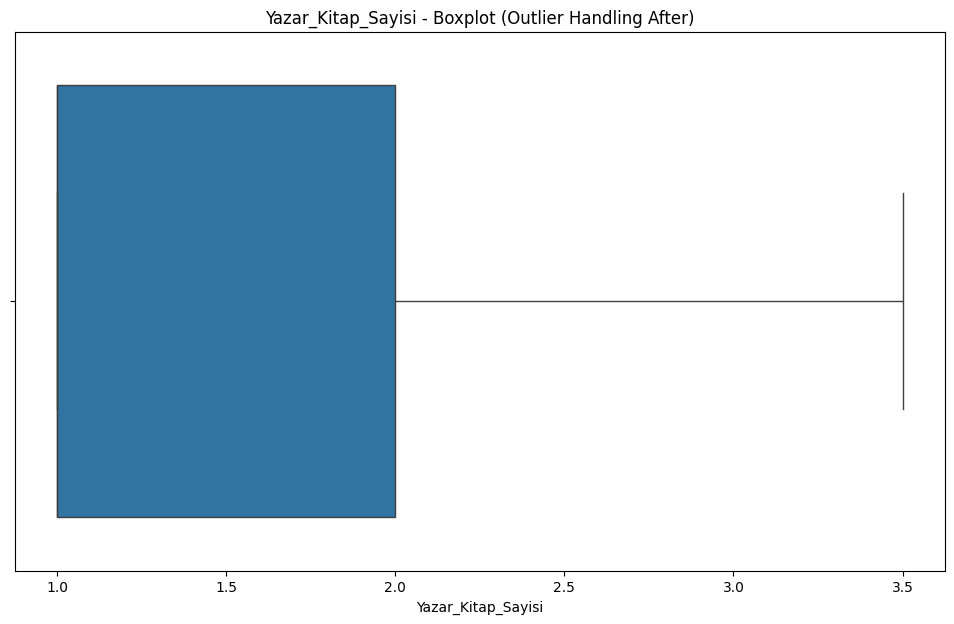


--- Analiz Raporu ---
Orijinal veri 1497 satırdı.
Toplamda 1810 adet aykırı değer (hücre) tespit edildi ve sınır değerler ile baskılandı (capped).

Aykırı değerleri 'Capping' (baskılanmış) veri seti başarıyla kaydedildi:
  -> datasetVersions\kitapyurdu_dataset_v3.csv

--- İşlem Tamamlandı ---


In [4]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os
import sys

# Görselleştirme dosyalarının kaydedileceği klasör adı
VIZ_DIR = "visualization_v2"

# Temizlenmiş verinin kaydedileceği klasör ve dosya adı
CLEANED_DATA_DIR = "datasetVersions"
CLEANED_FILENAME = "kitapyurdu_dataset_v3.csv"  


def save_plot(data_series, col_name, stage, plot_type, output_dir):
    """
    Verilen pandas Serisi için bir histogram veya kutu grafiği oluşturur,
    Jupyter'da gösterir ve belirtilen klasöre kaydeder.
    
    Args:
        data_series (pd.Series): Görselleştirilecek veri.
        col_name (str): Kolon adı (dosya adlandırması için).
        stage (str): 'before' (önce) veya 'after' (sonra).
        plot_type (str): 'histogram' veya 'boxplot'.
        output_dir (str): Görsellerin kaydedileceği klasör.
    """
    plt.figure(figsize=(12, 7))
    
    # Dosya adı ve başlık için formatlama
    title = f"{col_name} - {plot_type.title()} (Outlier Handling {stage.title()})"
    filename = f"{col_name}_{stage}_{plot_type}.png"
    save_path = os.path.join(output_dir, filename)
    
    try:
        if plot_type == 'histogram':
            sns.histplot(data_series, kde=True)
            plt.title(title)
        elif plot_type == 'boxplot':
            sns.boxplot(x=data_series)
            plt.title(title)
        
        # 1. Kaydet
        plt.savefig(save_path)
        print(f"  ✓ Kaydedildi: {save_path}")
        
        # 2. <<! YENİ EKLENDİ !>> Jupyter'da göster
        plt.show() 
        
        # 3. Hafızadan temizle
        plt.close() 
        
    except Exception as e:
        print(f"  ✗ HATA: {col_name} için '{plot_type}' çizilirken hata: {e}", file=sys.stderr)


def process_continuous_data_outliers(file_path):
    """
    Ana fonksiyon: CSV'yi yükler, sürekli (continuous) sayısal kolonları
    filtreler, IQR yöntemiyle aykırı değerleri 'capping' (baskılama)
    yöntemiyle yönetir, işlem öncesi/sonrası görselleri kaydeder/gösterir
    ve temiz veriyi CSV'ye basar.
    
    Args:
        file_path (str): Analiz edilecek CSV dosyasının yolu.
    """
    
    # --- 1. Adım: Çıktı Klasörlerini Oluşturma ---
    try:
        os.makedirs(VIZ_DIR, exist_ok=True)
        print(f"Görseller '{VIZ_DIR}' klasörüne kaydedilecek.")
        
        os.makedirs(CLEANED_DATA_DIR, exist_ok=True)
        print(f"Temizlenmiş veri '{CLEANED_DATA_DIR}' klasörüne kaydedilecek.")
            
    except OSError as e:
        print(f"HATA: Çıktı klasörleri oluşturulamadı: {e}", file=sys.stderr)
        return

    # --- 2. Adım: Veri Yükleme ---
    try:
        df = pd.read_csv(file_path)
        print(f"\n'{file_path}' dosyası başarıyla yüklendi. Toplam {len(df)} satır.")
    except FileNotFoundError:
        print(f"HATA: Dosya bulunamadı. Lütfen şu yolu kontrol edin: {file_path}", file=sys.stderr)
        return
    except Exception as e:
        print(f"Dosya okunurken bir hata oluştu: {e}", file=sys.stderr)
        return

    # --- 3. Adım: 'Gerçek' Sürekli (Continuous) Sayısal Kolonları Filtreleme ---
    
    all_numeric_cols = df.select_dtypes(include=['float64', 'int64']).columns
    continuous_cols = []
    binary_cols = []

    print("\n--- Kolon Analizi ---")
    if len(all_numeric_cols) == 0:
        print("İşlenecek sayısal kolon bulunamadı.")
        return

    for col in all_numeric_cols:
        is_binary = df[col].dropna().isin([0, 1]).all()
        
        if is_binary:
            binary_cols.append(col)
        else:
            continuous_cols.append(col)

    if len(binary_cols) > 0:
        print(f"Atlanan 'Binary' (0/1) Kolonlar: {', '.join(binary_cols)}")
    
    if len(continuous_cols) == 0:
        print("İşlenecek 'sürekli' (continuous) sayısal kolon bulunamadı.")
        return
        
    print(f"İşlenecek 'Sürekli' Kolonlar: {', '.join(continuous_cols)}")

    # --- 4. Adım: Her Sürekli Kolon İçin Aykırı Değer İşleme ve Görselleştirme ---
    
    # Orijinal DataFrame'i kopyala, aykırı değerleri bu kopya üzerinde
    # "Capping" (baskılama) yöntemiyle güncelleyeceğiz.
    df_cleaned = df.copy()
    
    total_outliers_handled = 0
    
    for col_name in continuous_cols:
        print(f"\n--- İşleniyor: {col_name} ---")
        
        # Sadece NaN olmayan verileri al
        data_before = df[col_name].dropna()
        
        if data_before.empty:
            print(f"  ! Uyarı: {col_name} kolonu boş veya sadece NaN değerler içeriyor. Atlanıyor.")
            continue
            
        # --- 4a: "ÖNCE" Görselleştirme ---
        print("  İşlem ÖNCESİ görseller oluşturuluyor...")
        save_plot(data_before, col_name, "before", "histogram", VIZ_DIR)
        save_plot(data_before, col_name, "before", "boxplot", VIZ_DIR)
        
        # --- 4b: IQR Yöntemi ile Aykırı Değer Sınırlarını Hesaplama ---
        Q1 = data_before.quantile(0.25)
        Q3 = data_before.quantile(0.75)
        IQR_val = Q3 - Q1
        
        lower_bound = Q1 - 1.5 * IQR_val
        upper_bound = Q3 + 1.5 * IQR_val
        
        print(f"  {col_name} -> Q1: {Q1:.2f}, Q3: {Q3:.2f}, IQR: {IQR_val:.2f}")
        print(f"  Geçerli Sınırlar -> Alt: {lower_bound:.2f}, Üst: {upper_bound:.2f}")
        
        # --- 4c: Aykırı Değerleri Tespit Etme ve Capping --- <<! GÜNCELLENDİ !>>
        
        # Sadece raporlama için aykırı değer sayısını bul
        outlier_count = data_before[(data_before < lower_bound) | (data_before > upper_bound)].count()
        
        print(f"  Tespit edilen aykırı değer sayısı: {outlier_count}")
        total_outliers_handled += outlier_count
        
        if outlier_count == 0:
            print("  Aykırı değere rastlanmadı. 'Sonra' grafikleri çizilmeyecek.")
            continue
            
        # CAPPING UYGULAMASI
        # 'df_cleaned' kopyası üzerinde çalışıyoruz
        
        # 1. Alt sınırdan küçük olanları alt sınıra eşitle (baskıla)
        df_cleaned.loc[df_cleaned[col_name] < lower_bound, col_name] = lower_bound
        
        # 2. Üst sınırdan büyük olanları üst sınıra eşitle (baskıla)
        df_cleaned.loc[df_cleaned[col_name] > upper_bound, col_name] = upper_bound

        # 'Sonra' verisi, artık Capping uygulanmış veridir
        data_after = df_cleaned[col_name].dropna()

        # --- 4d: "SONRA" Görselleştirme ---
        print("  İşlem SONRASI (Capping uygulanmış) görseller oluşturuluyor...")
        save_plot(data_after, col_name, "after", "histogram", VIZ_DIR)
        save_plot(data_after, col_name, "after", "boxplot", VIZ_DIR)

    print("\n--- Analiz Raporu ---")
    print(f"Orijinal veri {len(df)} satırdı.")
    # <<! GÜNCELLENDİ !>> (Rapor metni)
    print(f"Toplamda {total_outliers_handled} adet aykırı değer (hücre) tespit edildi ve sınır değerler ile baskılandı (capped).")

    # --- 5. Adım: Temizlenmiş (Capped) Veriyi Kaydetme ---
    try:
        output_csv_path = os.path.join(CLEANED_DATA_DIR, CLEANED_FILENAME)
        
        df_cleaned.to_csv(output_csv_path, index=False)
        
        print(f"\nAykırı değerleri 'Capping' (baskılanmış) veri seti başarıyla kaydedildi:")
        print(f"  -> {output_csv_path}")
        
    except Exception as e:
        print(f"\nHATA: Temizlenmiş veri CSV'ye kaydedilirken bir hata oluştu: {e}", file=sys.stderr)


    print("\n--- İşlem Tamamlandı ---")


# --- BU BETİĞİ ÇALIŞTIRMAK İÇİN ---
if __name__ == "__main__":
    # <<!>> LÜTFEN ANALİZ ETMEK İSTEDİĞİNİZ DOSYANIN YOLUNU BURAYA GİRİN
    # Bu kod bir .py dosyası olarak çalıştırılırsa bu blok çalışır.
    # Jupyter'da çalıştırıyorsanız, bu bloğun dışına çıkıp
    # bir sonraki hücrede manuel olarak çağırabilirsiniz:
    
    # csv_dosya_yolu = "verileriniz.csv"
    # process_continuous_data_outliers(csv_dosya_yolu)
    
    # Örnek olarak doğrudan burada tanımlayalım:
    csv_dosya_yolu = "datasetVersions/kitapyurdu_dataset_v2.csv" 
    
    # Ana analiz fonksiyonunu çağır
    process_continuous_data_outliers(csv_dosya_yolu)

### 2) kitapyurdu_dataset_v2-nokagitcinsi.csv --> kitapyurdu_dataset_v3-nokagitcinsi.csv

Görseller 'visualization_v2-nokagitcinsi' klasörüne kaydedilecek.
Temizlenmiş veri 'datasetVersions' klasörüne kaydedilecek.

'datasetVersions/kitapyurdu_dataset_v2-nokagitcinsi.csv' dosyası başarıyla yüklendi. Toplam 1497 satır.

--- Kolon Analizi ---
Atlanan 'Binary' (0/1) Kolonlar: Yayınevi_DESTEK YAYIN GRUBU-KAMPANYA, Yayınevi_Diğer, Yayınevi_EPONA KİTAP, Yayınevi_FİHRİST KİTAP, Yayınevi_HAYY KİTAP - KAMPANYA, Yayınevi_PEGASUS YAYINLARI, Yayınevi_SARMAL KİTABEVİ, Yayınevi_SAY YAYIN GRUBU-KAMPANYA, Yayınevi_URZENİ, Yayınevi_YEDİVEREN YAYIN GRUBU - KAMPANYA, Ana_Kategori_Diğer, Ana_Kategori_Edebiyat, Ana_Kategori_Felsefe-Düşünce, Ana_Kategori_Kişisel Gelişim, Ana_Kategori_Siyaset, Ana_Kategori_Sosyoloji, Ana_Kategori_Tarih, Ana_Kategori_Çocuk Kitapları, Ana_Kategori_İslam
İşlenecek 'Sürekli' Kolonlar: Favorilere Ekleyen Kişi Sayısı, Okuyacağım olarak işaretlenmiş sayısı, Okudum olarak işaretlenmiş sayısı, Liste Fiyatı, Sayfa Sayısı, Toplam Satılma Sayısı, Toplam Yorum Sayısı, Puan, O

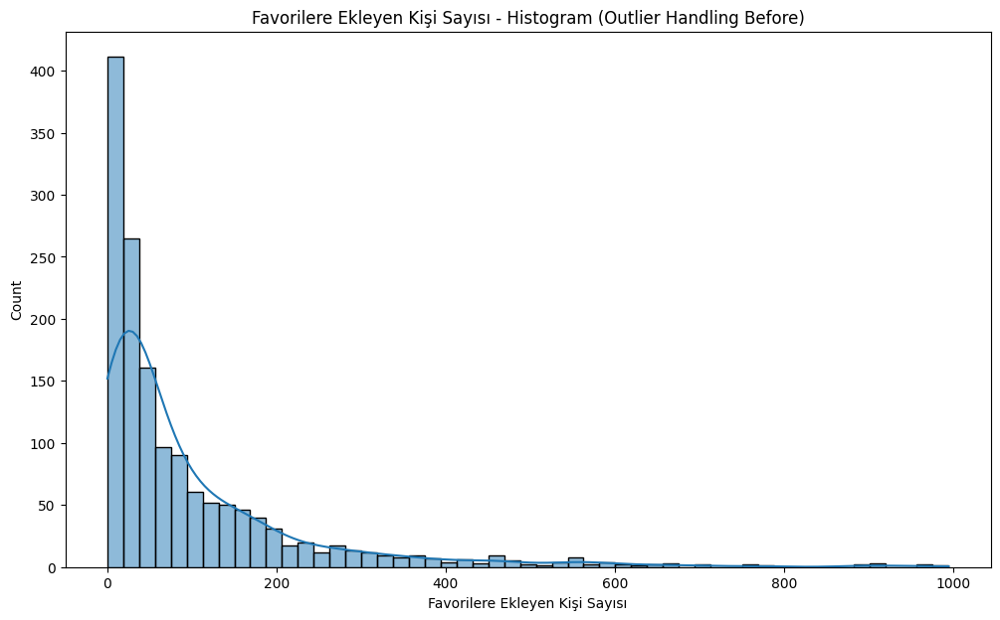

  ✓ Kaydedildi: visualization_v2-nokagitcinsi\Favorilere Ekleyen Kişi Sayısı_before_boxplot.png


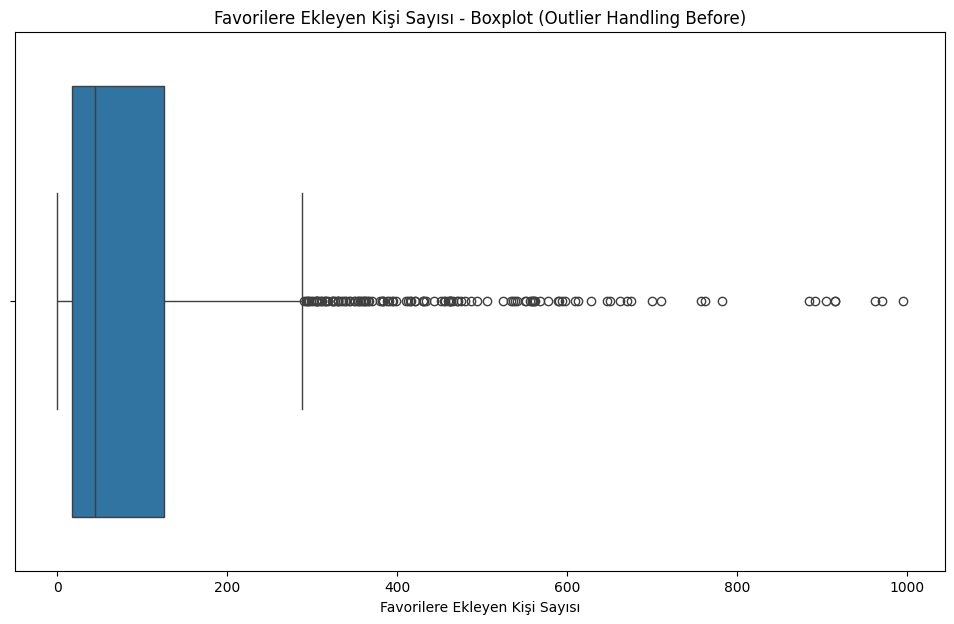

  Favorilere Ekleyen Kişi Sayısı -> Q1: 17.00, Q3: 126.00, IQR: 109.00
  Geçerli Sınırlar -> Alt: -146.50, Üst: 289.50
  Tespit edilen aykırı değer sayısı: 120
  İşlem SONRASI (Capping uygulanmış) görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2-nokagitcinsi\Favorilere Ekleyen Kişi Sayısı_after_histogram.png


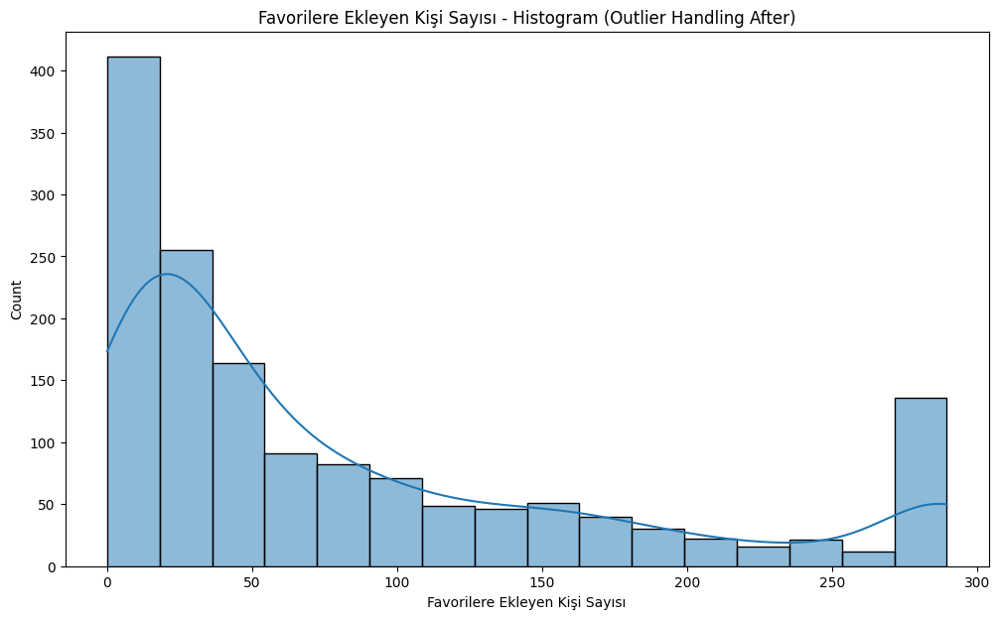

  ✓ Kaydedildi: visualization_v2-nokagitcinsi\Favorilere Ekleyen Kişi Sayısı_after_boxplot.png


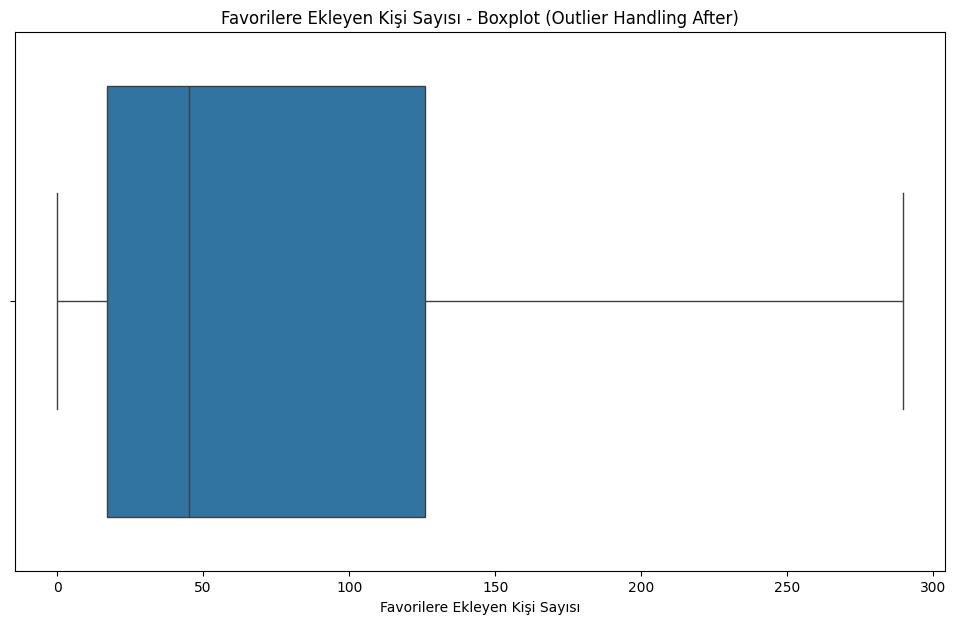


--- İşleniyor: Okuyacağım olarak işaretlenmiş sayısı ---
  İşlem ÖNCESİ görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2-nokagitcinsi\Okuyacağım olarak işaretlenmiş sayısı_before_histogram.png


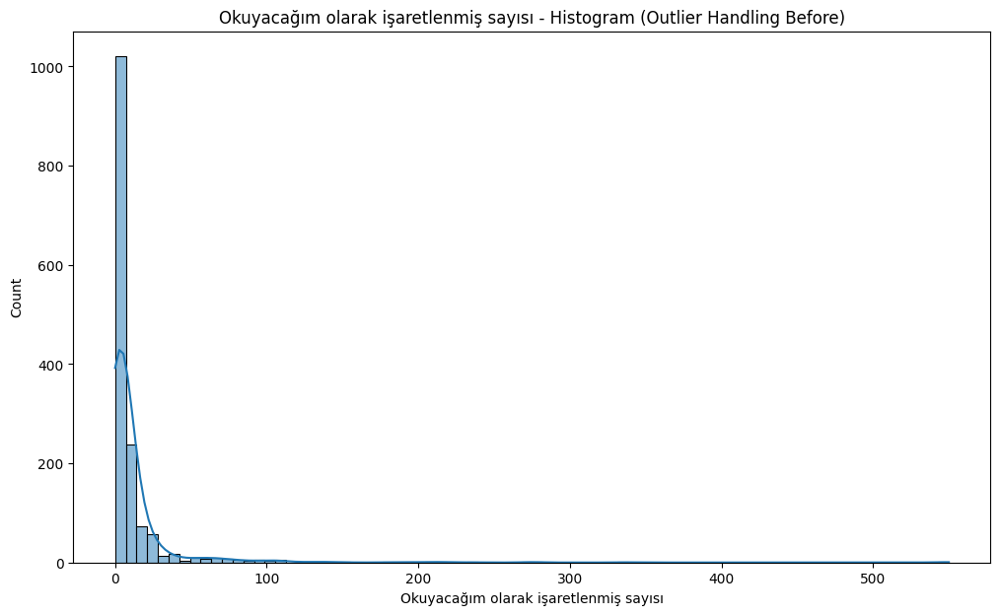

  ✓ Kaydedildi: visualization_v2-nokagitcinsi\Okuyacağım olarak işaretlenmiş sayısı_before_boxplot.png


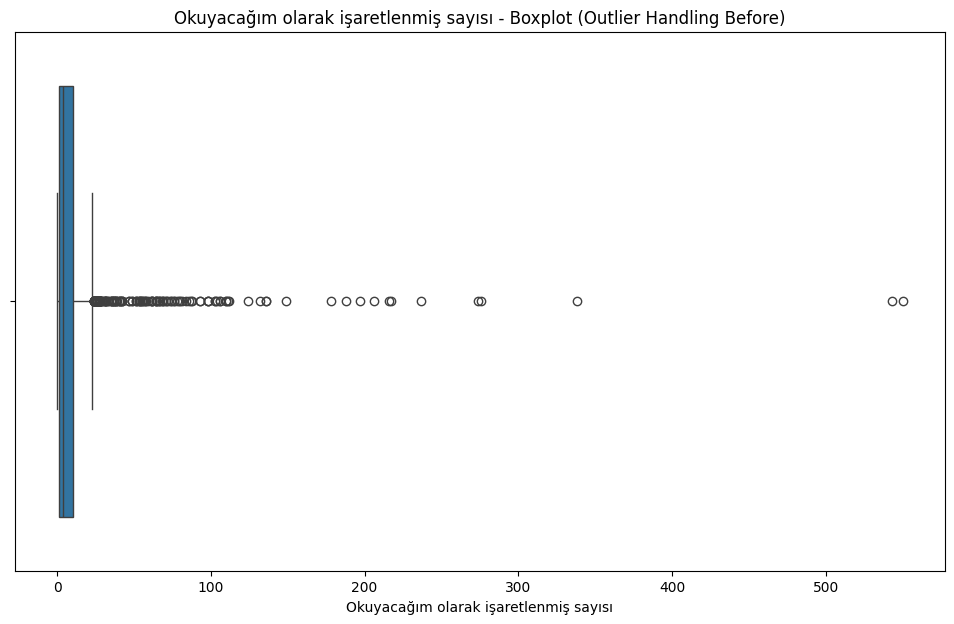

  Okuyacağım olarak işaretlenmiş sayısı -> Q1: 1.00, Q3: 10.00, IQR: 9.00
  Geçerli Sınırlar -> Alt: -12.50, Üst: 23.50
  Tespit edilen aykırı değer sayısı: 147
  İşlem SONRASI (Capping uygulanmış) görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2-nokagitcinsi\Okuyacağım olarak işaretlenmiş sayısı_after_histogram.png


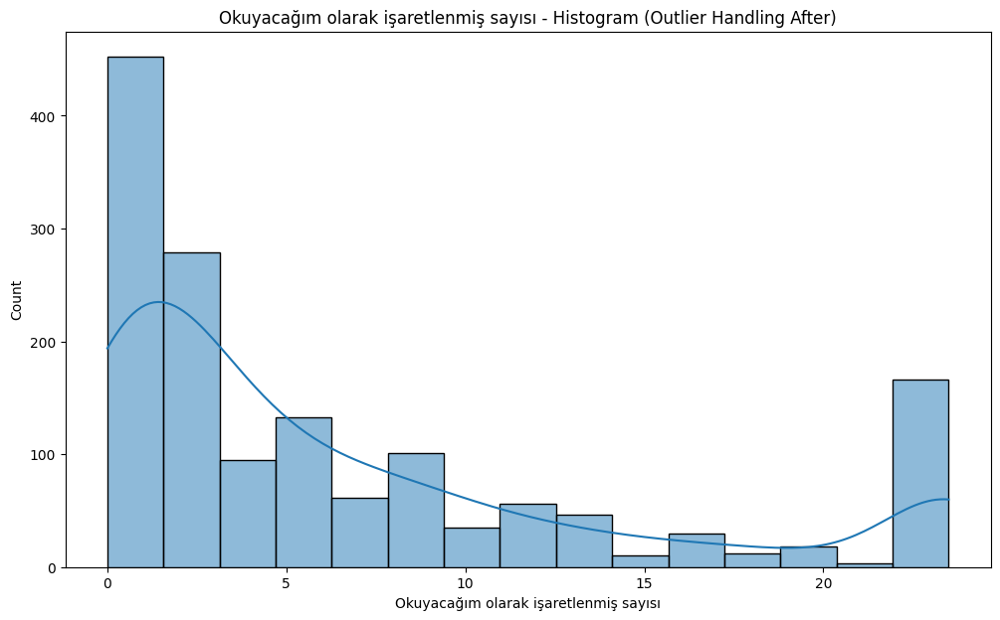

  ✓ Kaydedildi: visualization_v2-nokagitcinsi\Okuyacağım olarak işaretlenmiş sayısı_after_boxplot.png


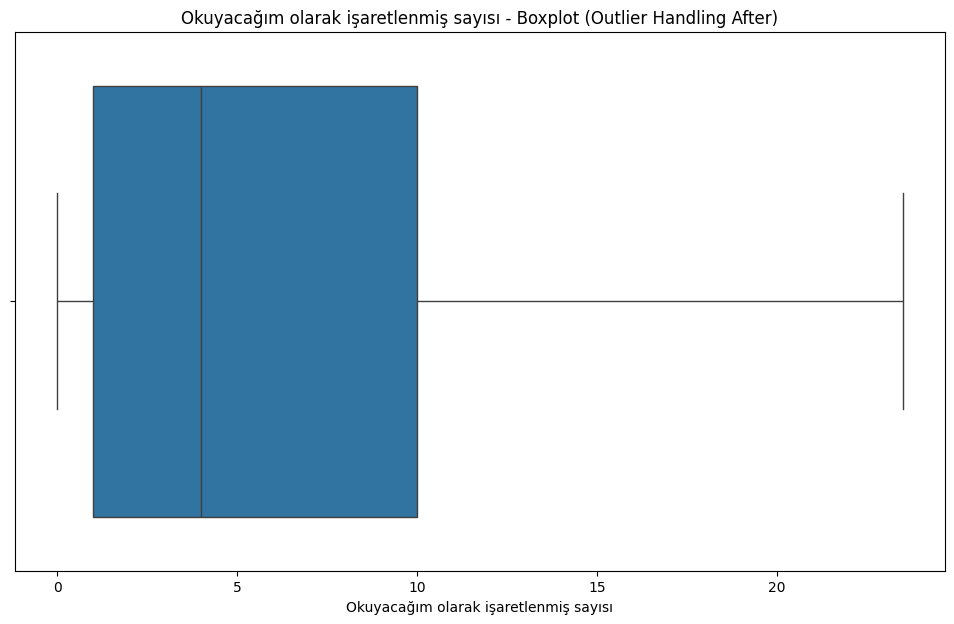


--- İşleniyor: Okudum olarak işaretlenmiş sayısı ---
  İşlem ÖNCESİ görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2-nokagitcinsi\Okudum olarak işaretlenmiş sayısı_before_histogram.png


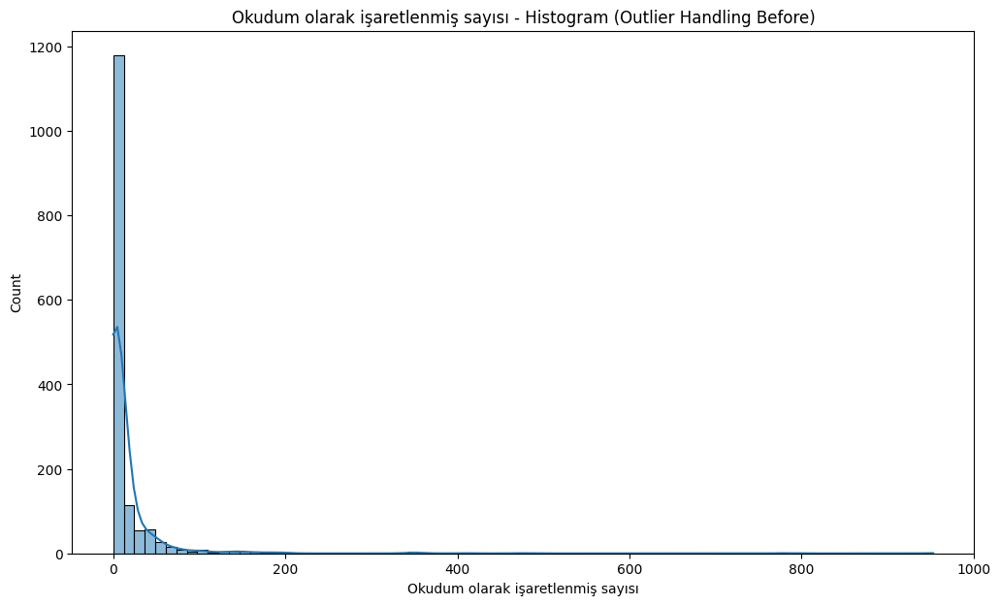

  ✓ Kaydedildi: visualization_v2-nokagitcinsi\Okudum olarak işaretlenmiş sayısı_before_boxplot.png


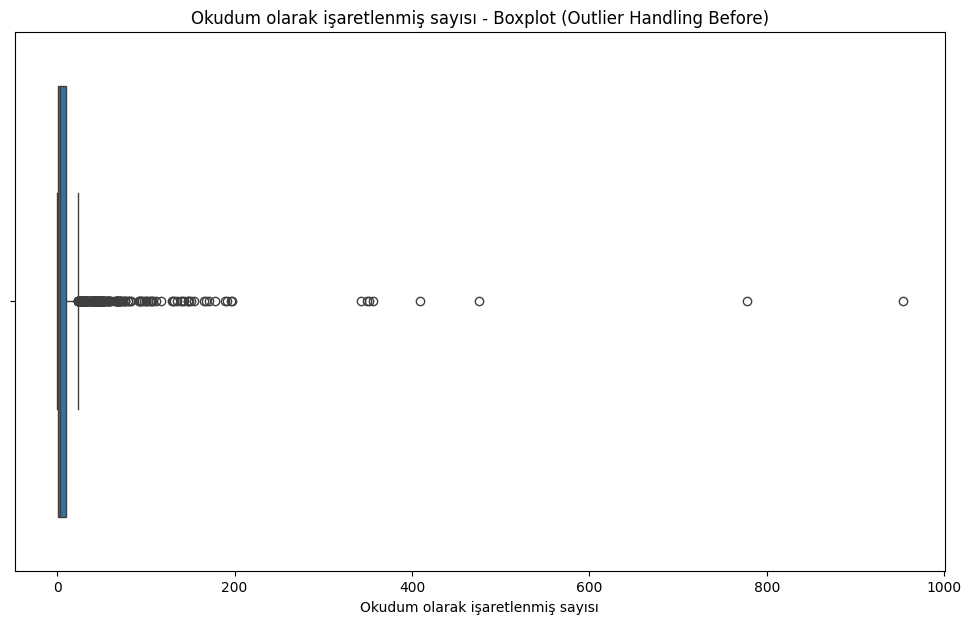

  Okudum olarak işaretlenmiş sayısı -> Q1: 1.00, Q3: 10.00, IQR: 9.00
  Geçerli Sınırlar -> Alt: -12.50, Üst: 23.50
  Tespit edilen aykırı değer sayısı: 210
  İşlem SONRASI (Capping uygulanmış) görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2-nokagitcinsi\Okudum olarak işaretlenmiş sayısı_after_histogram.png


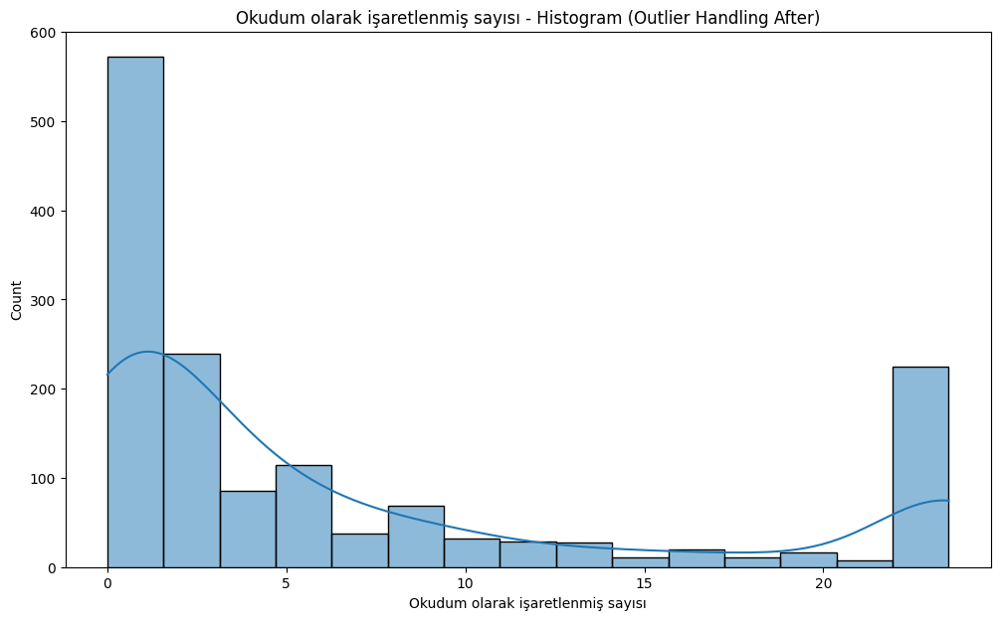

  ✓ Kaydedildi: visualization_v2-nokagitcinsi\Okudum olarak işaretlenmiş sayısı_after_boxplot.png


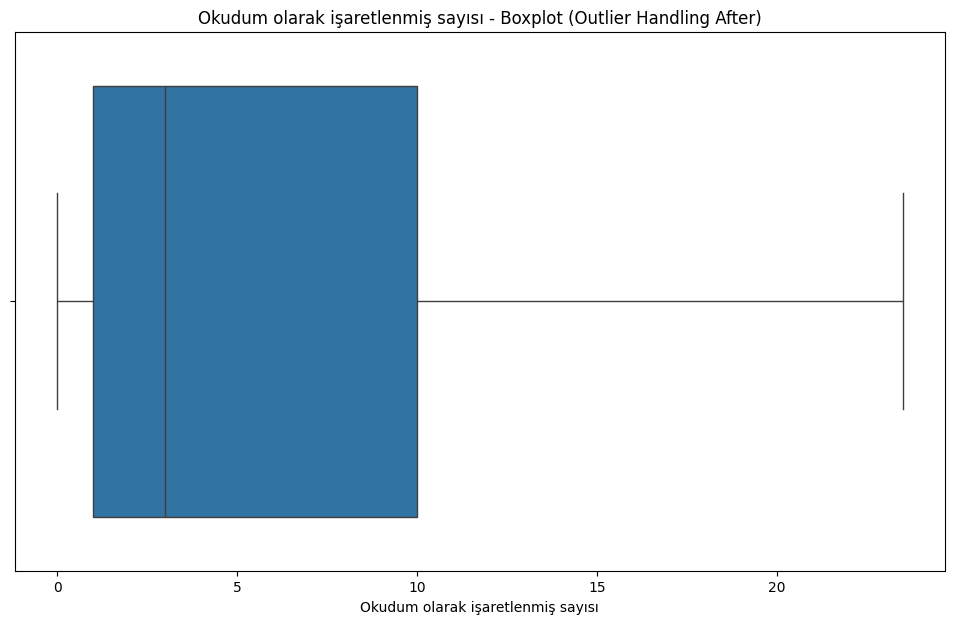


--- İşleniyor: Liste Fiyatı ---
  İşlem ÖNCESİ görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2-nokagitcinsi\Liste Fiyatı_before_histogram.png


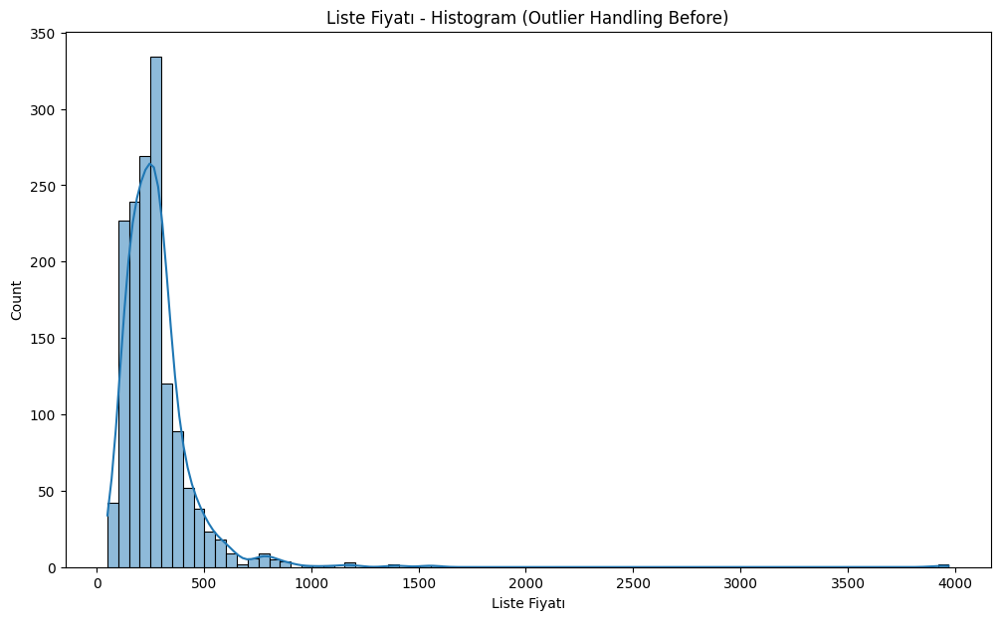

  ✓ Kaydedildi: visualization_v2-nokagitcinsi\Liste Fiyatı_before_boxplot.png


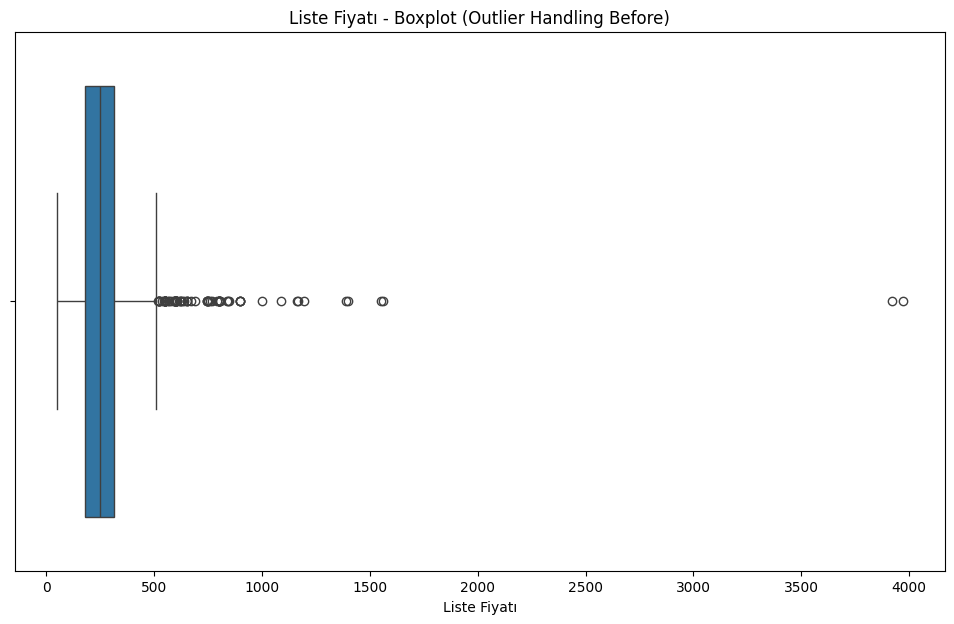

  Liste Fiyatı -> Q1: 180.00, Q3: 314.00, IQR: 134.00
  Geçerli Sınırlar -> Alt: -21.00, Üst: 515.00
  Tespit edilen aykırı değer sayısı: 83
  İşlem SONRASI (Capping uygulanmış) görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2-nokagitcinsi\Liste Fiyatı_after_histogram.png


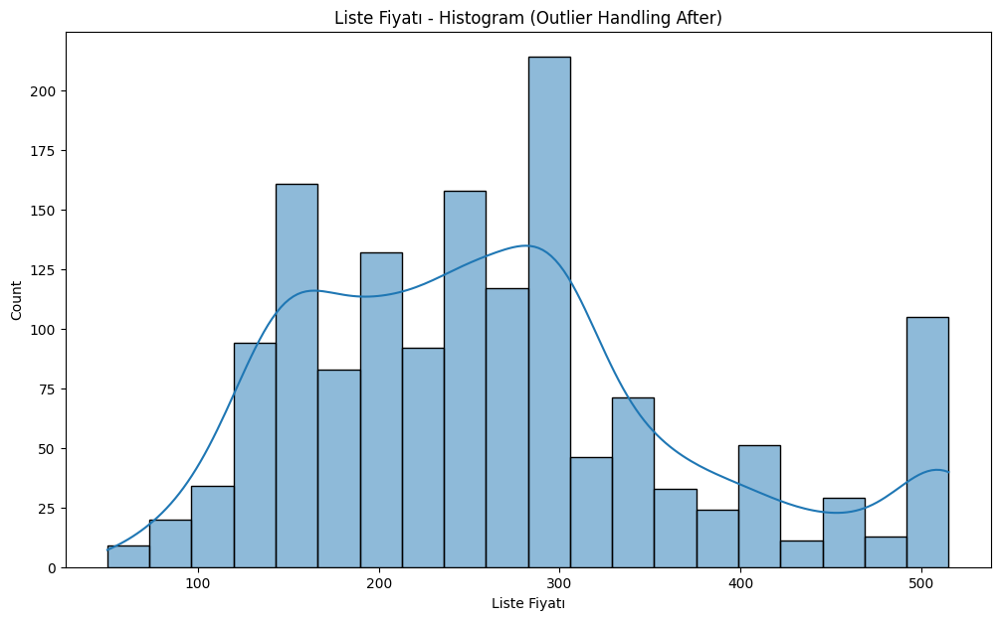

  ✓ Kaydedildi: visualization_v2-nokagitcinsi\Liste Fiyatı_after_boxplot.png


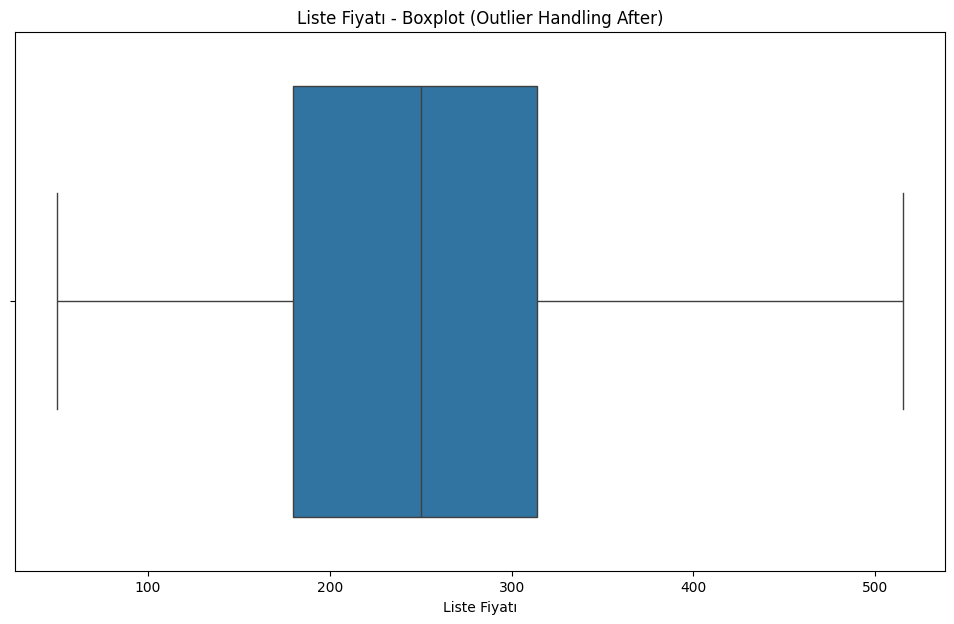


--- İşleniyor: Sayfa Sayısı ---
  İşlem ÖNCESİ görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2-nokagitcinsi\Sayfa Sayısı_before_histogram.png


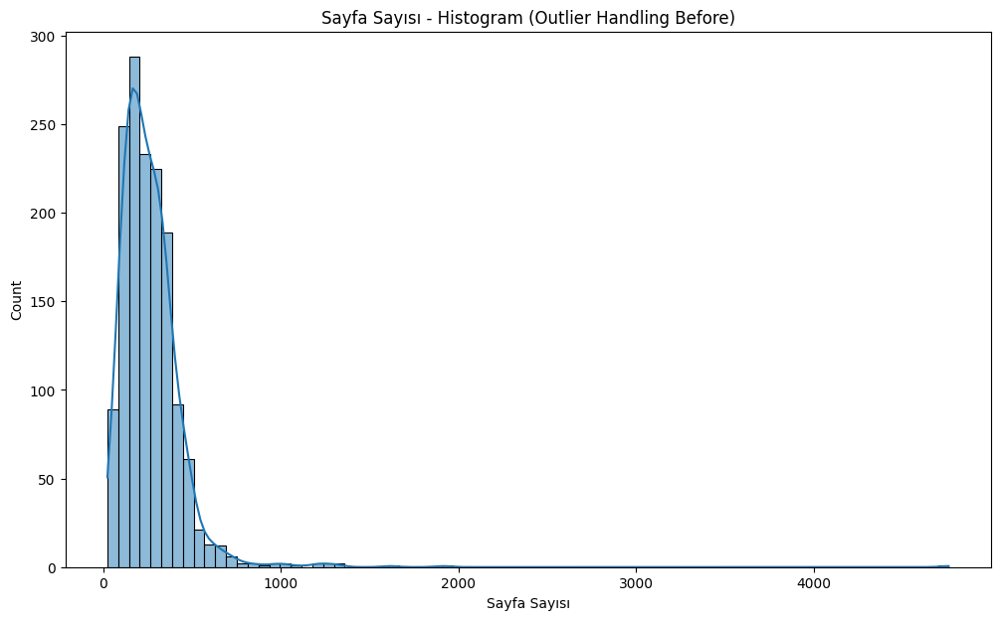

  ✓ Kaydedildi: visualization_v2-nokagitcinsi\Sayfa Sayısı_before_boxplot.png


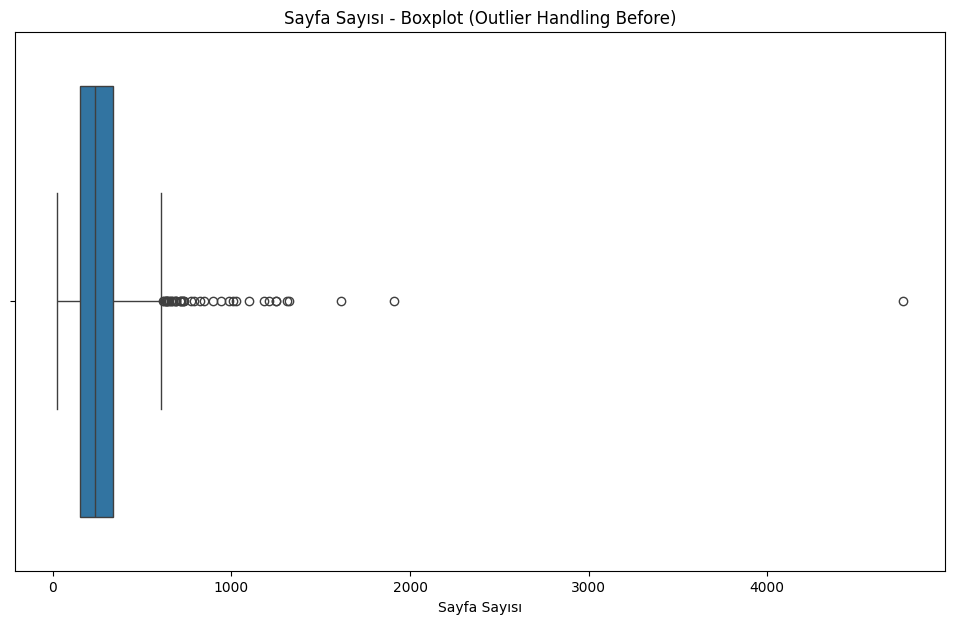

  Sayfa Sayısı -> Q1: 152.00, Q3: 336.00, IQR: 184.00
  Geçerli Sınırlar -> Alt: -124.00, Üst: 612.00
  Tespit edilen aykırı değer sayısı: 39
  İşlem SONRASI (Capping uygulanmış) görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2-nokagitcinsi\Sayfa Sayısı_after_histogram.png


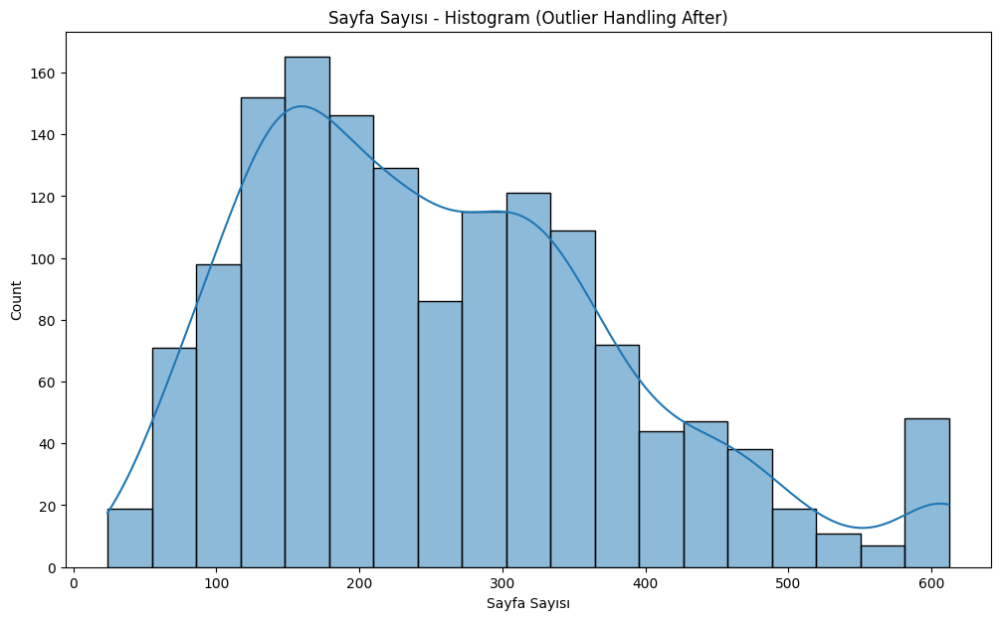

  ✓ Kaydedildi: visualization_v2-nokagitcinsi\Sayfa Sayısı_after_boxplot.png


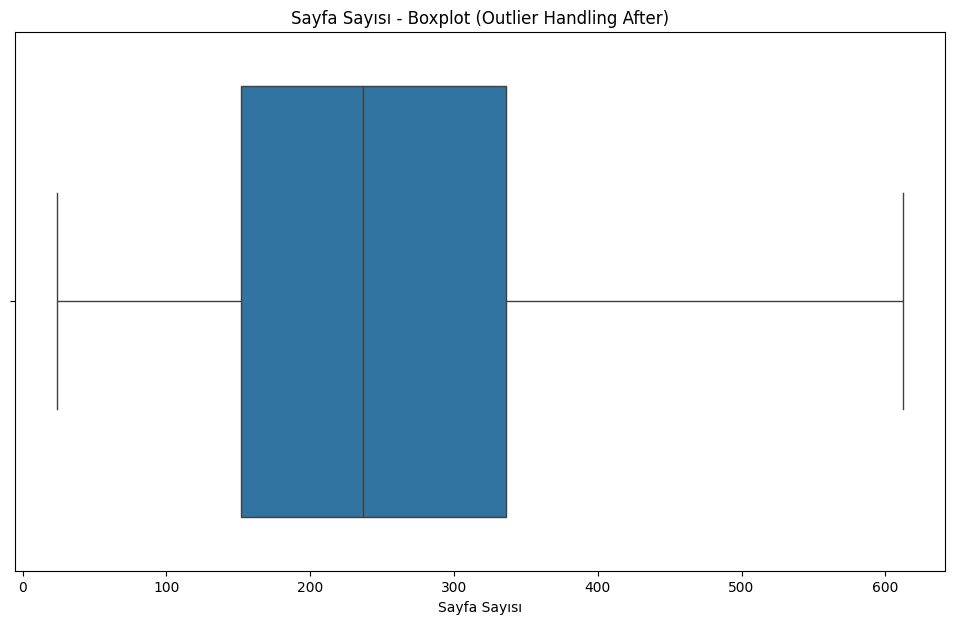


--- İşleniyor: Toplam Satılma Sayısı ---
  İşlem ÖNCESİ görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2-nokagitcinsi\Toplam Satılma Sayısı_before_histogram.png


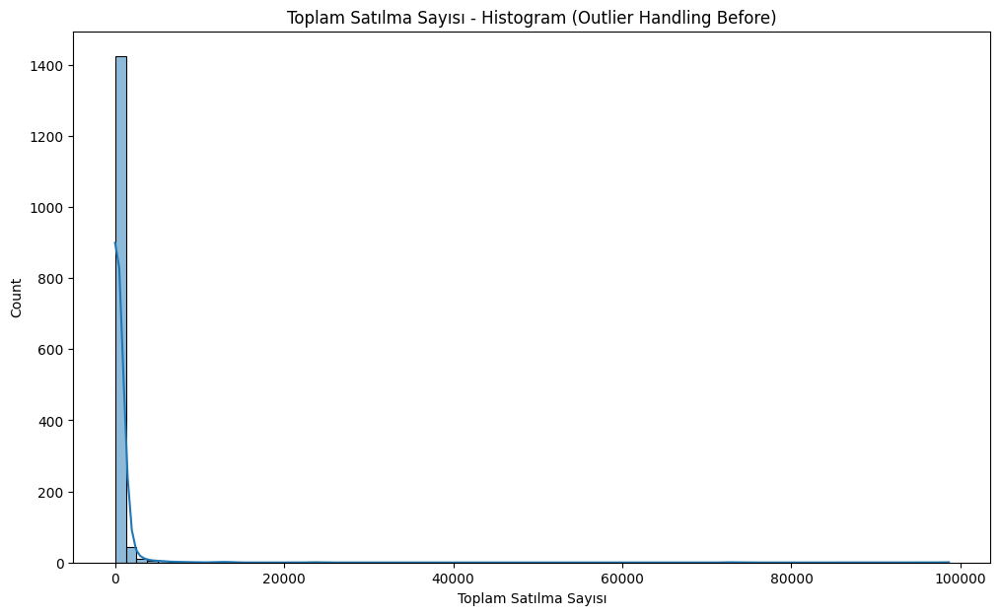

  ✓ Kaydedildi: visualization_v2-nokagitcinsi\Toplam Satılma Sayısı_before_boxplot.png


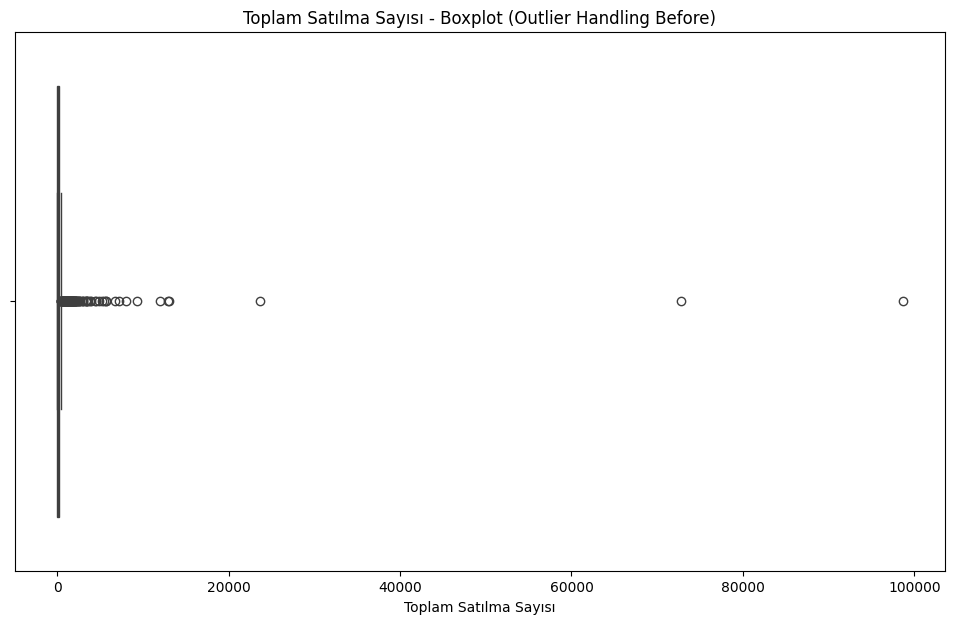

  Toplam Satılma Sayısı -> Q1: 40.00, Q3: 217.00, IQR: 177.00
  Geçerli Sınırlar -> Alt: -225.50, Üst: 482.50
  Tespit edilen aykırı değer sayısı: 145
  İşlem SONRASI (Capping uygulanmış) görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2-nokagitcinsi\Toplam Satılma Sayısı_after_histogram.png


C:\Users\metehan\AppData\Local\Temp\ipykernel_8724\2452900361.py:168: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-225.5' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_cleaned.loc[df_cleaned[col_name] < lower_bound, col_name] = lower_bound


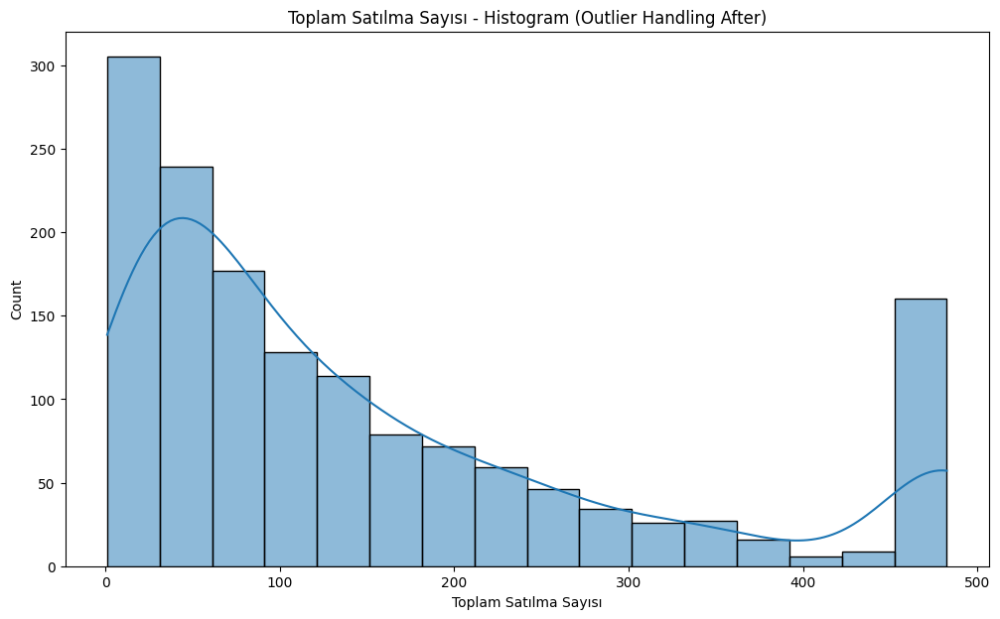

  ✓ Kaydedildi: visualization_v2-nokagitcinsi\Toplam Satılma Sayısı_after_boxplot.png


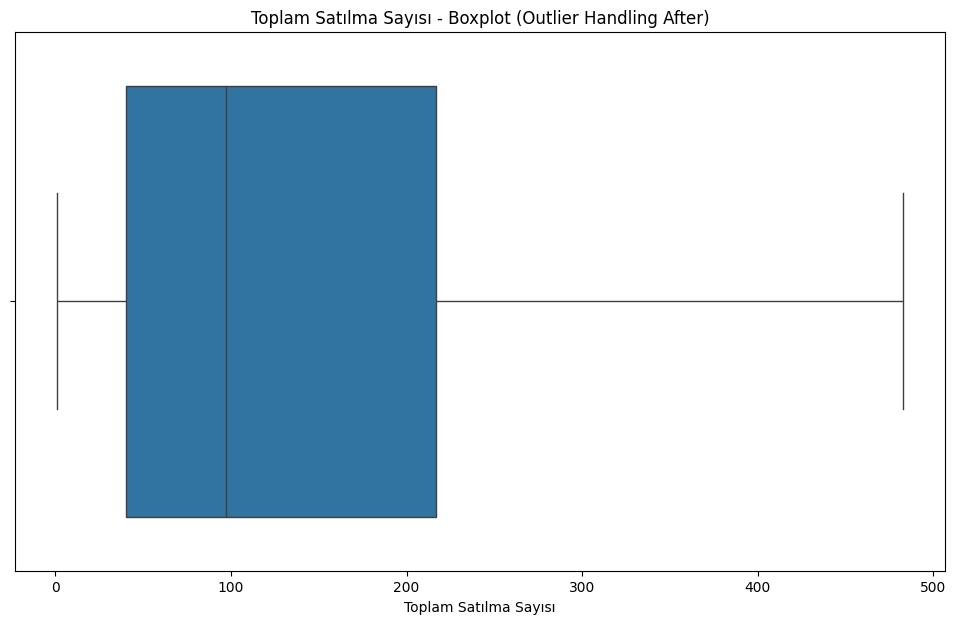


--- İşleniyor: Toplam Yorum Sayısı ---
  İşlem ÖNCESİ görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2-nokagitcinsi\Toplam Yorum Sayısı_before_histogram.png


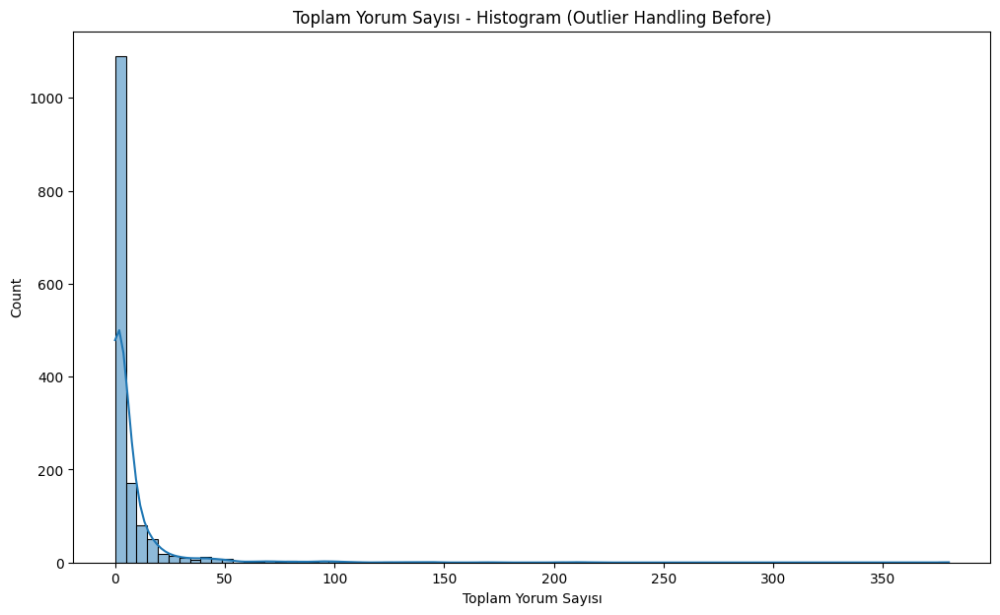

  ✓ Kaydedildi: visualization_v2-nokagitcinsi\Toplam Yorum Sayısı_before_boxplot.png


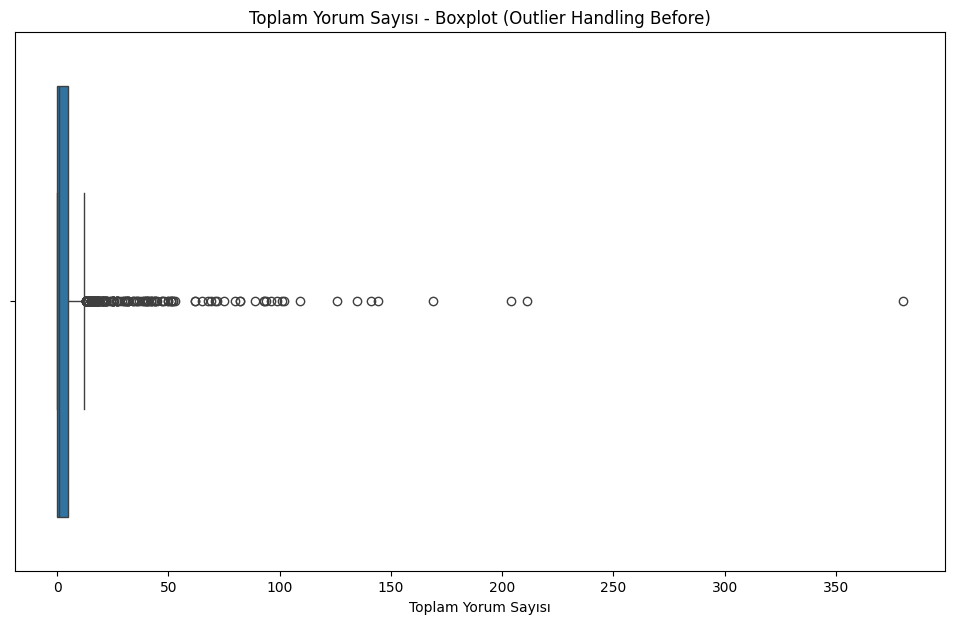

  Toplam Yorum Sayısı -> Q1: 0.00, Q3: 5.00, IQR: 5.00
  Geçerli Sınırlar -> Alt: -7.50, Üst: 12.50
  Tespit edilen aykırı değer sayısı: 179
  İşlem SONRASI (Capping uygulanmış) görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2-nokagitcinsi\Toplam Yorum Sayısı_after_histogram.png


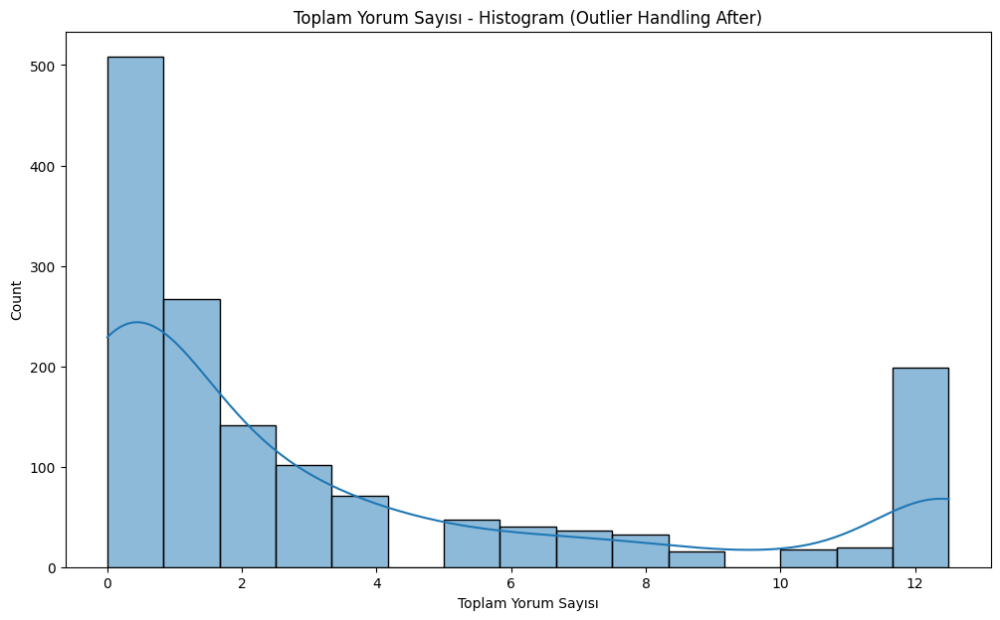

  ✓ Kaydedildi: visualization_v2-nokagitcinsi\Toplam Yorum Sayısı_after_boxplot.png


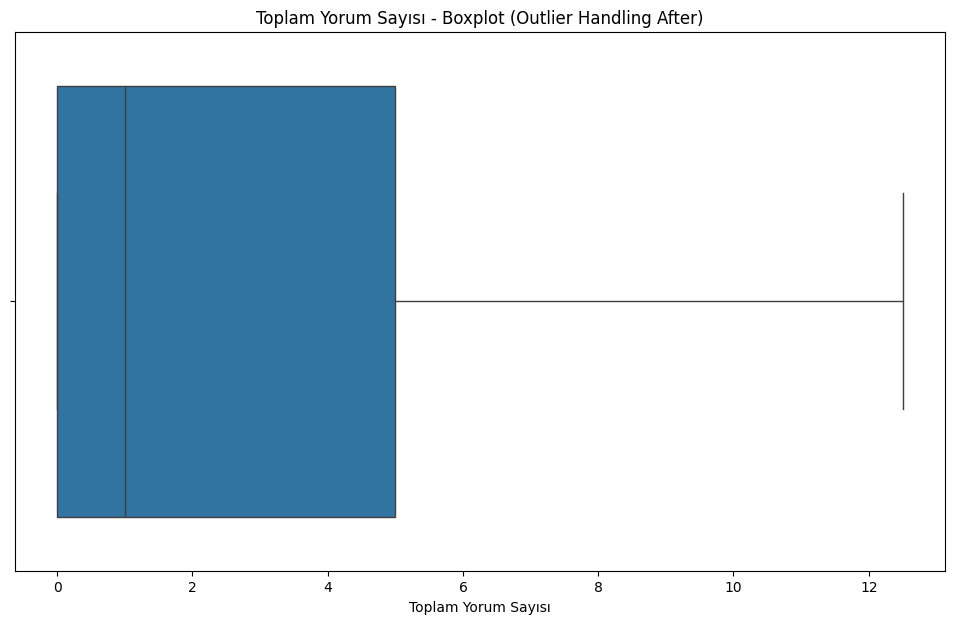


--- İşleniyor: Puan ---
  İşlem ÖNCESİ görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2-nokagitcinsi\Puan_before_histogram.png


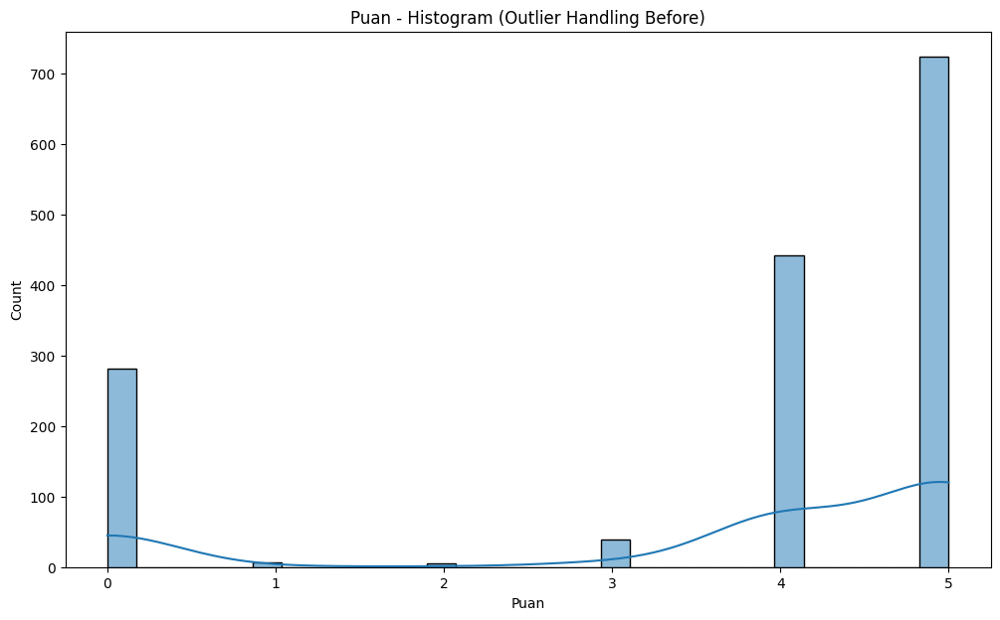

  ✓ Kaydedildi: visualization_v2-nokagitcinsi\Puan_before_boxplot.png


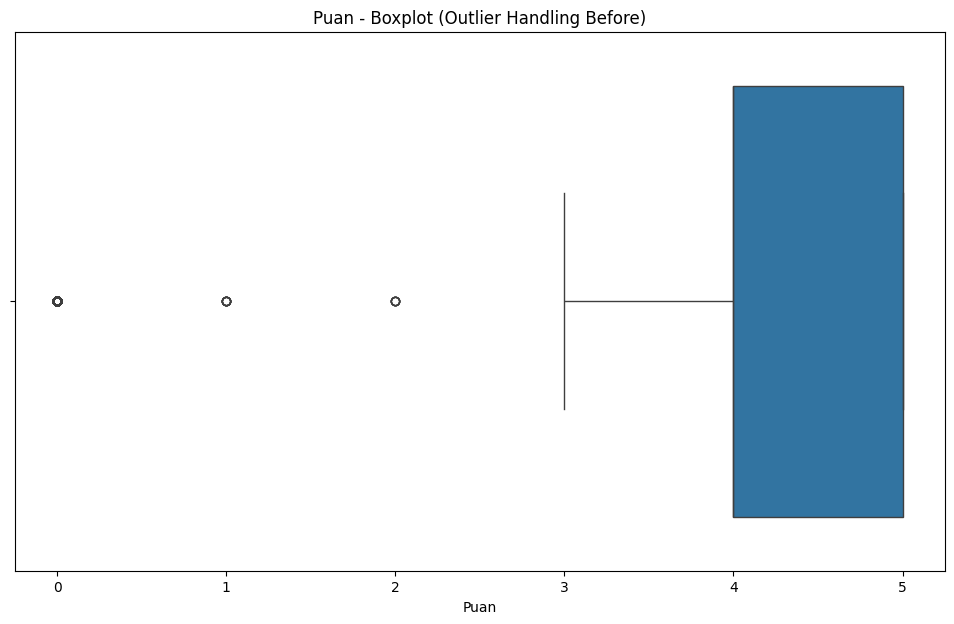

  Puan -> Q1: 4.00, Q3: 5.00, IQR: 1.00
  Geçerli Sınırlar -> Alt: 2.50, Üst: 6.50
  Tespit edilen aykırı değer sayısı: 293
  İşlem SONRASI (Capping uygulanmış) görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2-nokagitcinsi\Puan_after_histogram.png


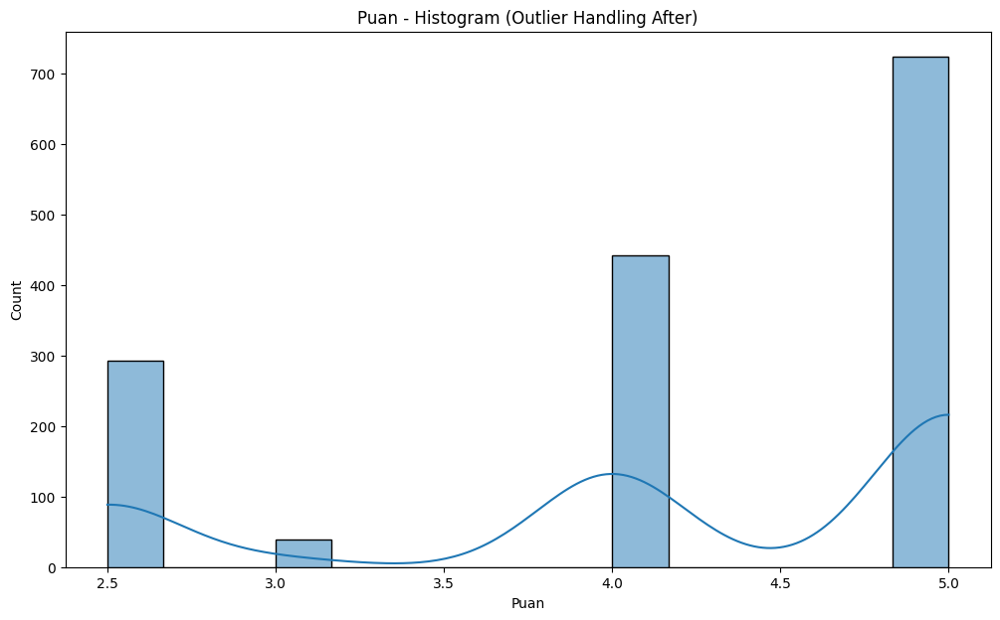

  ✓ Kaydedildi: visualization_v2-nokagitcinsi\Puan_after_boxplot.png


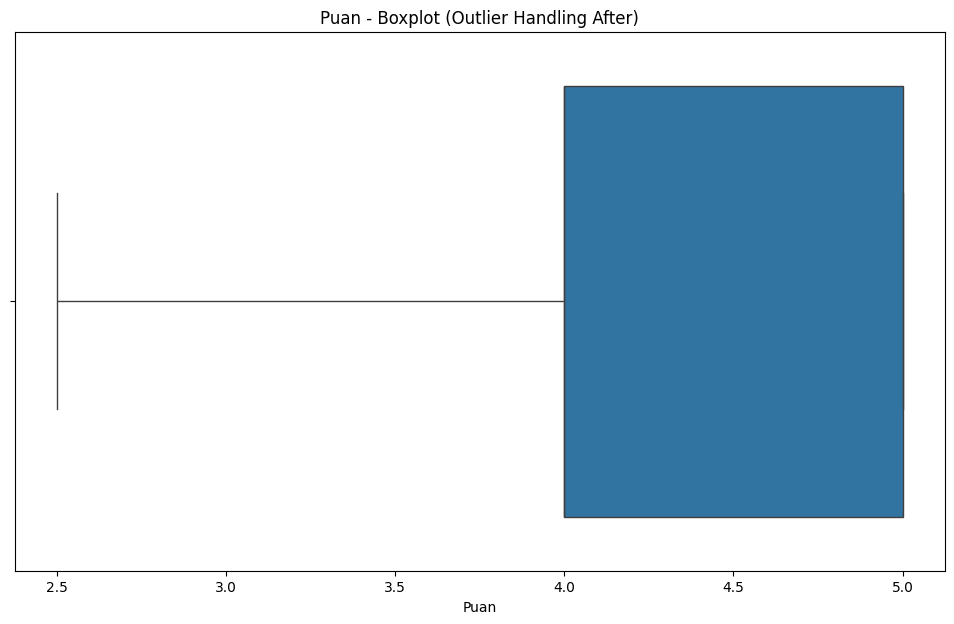


--- İşleniyor: Oy_Sayisi ---
  İşlem ÖNCESİ görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2-nokagitcinsi\Oy_Sayisi_before_histogram.png


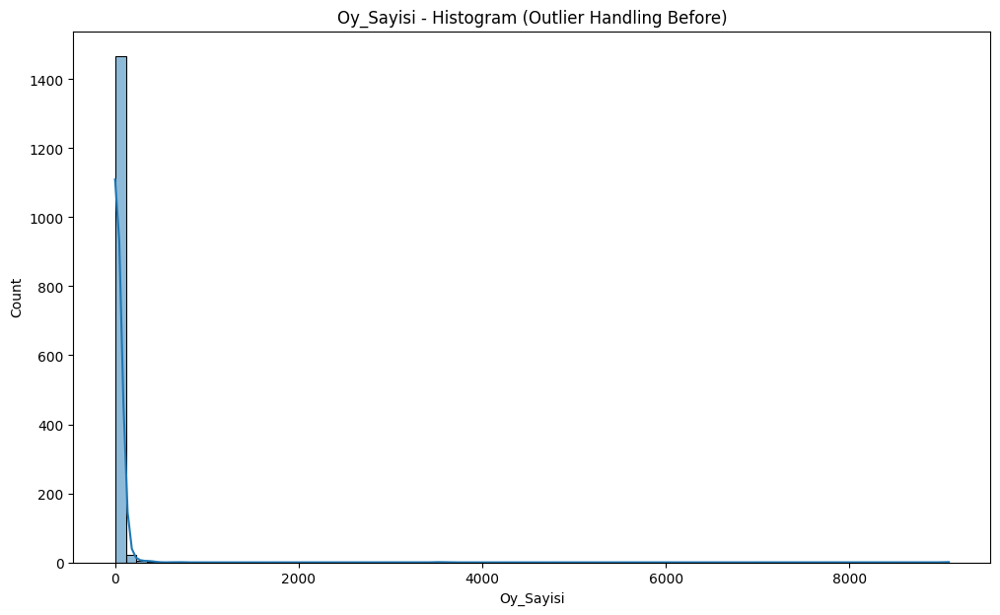

  ✓ Kaydedildi: visualization_v2-nokagitcinsi\Oy_Sayisi_before_boxplot.png


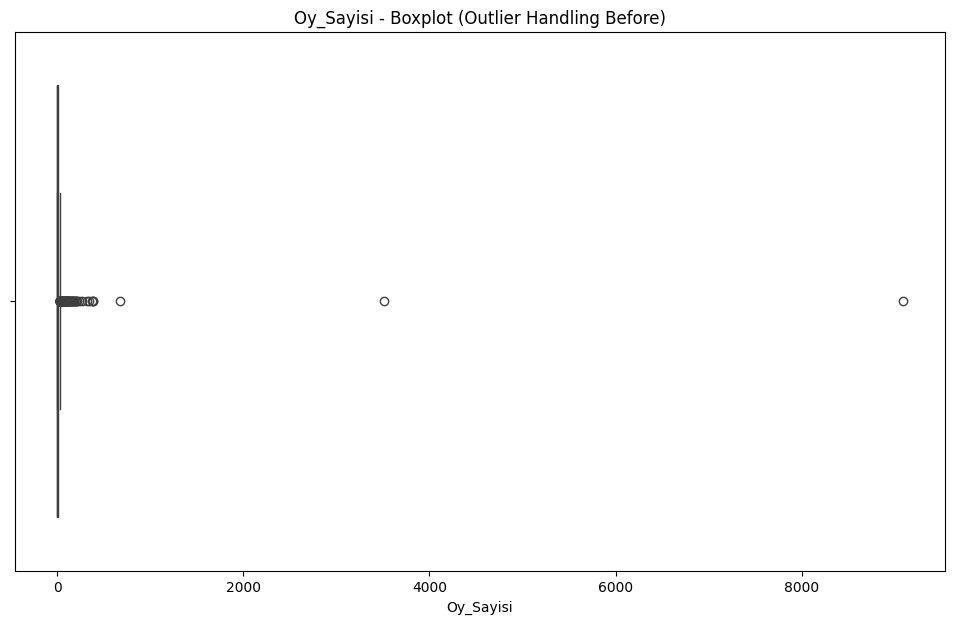

  Oy_Sayisi -> Q1: 1.00, Q3: 12.00, IQR: 11.00
  Geçerli Sınırlar -> Alt: -15.50, Üst: 28.50
  Tespit edilen aykırı değer sayısı: 187
  İşlem SONRASI (Capping uygulanmış) görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2-nokagitcinsi\Oy_Sayisi_after_histogram.png


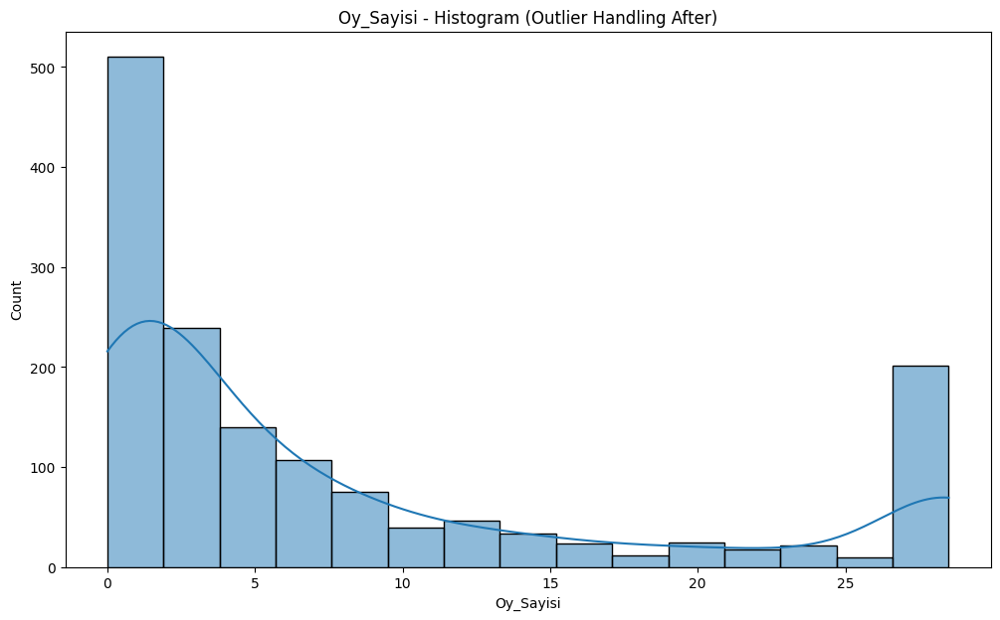

  ✓ Kaydedildi: visualization_v2-nokagitcinsi\Oy_Sayisi_after_boxplot.png


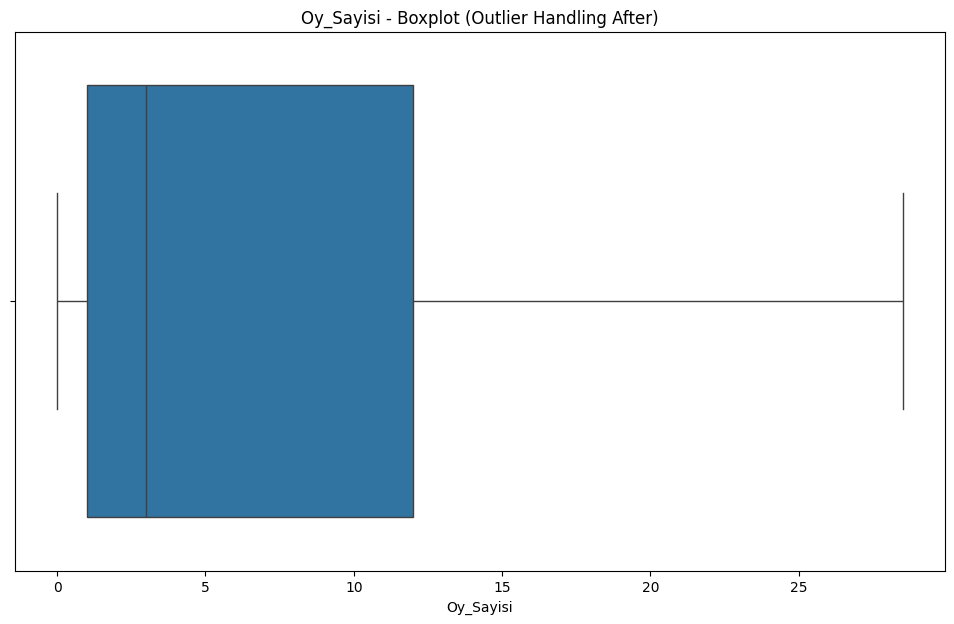


--- İşleniyor: Yayin_Yili ---
  İşlem ÖNCESİ görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2-nokagitcinsi\Yayin_Yili_before_histogram.png


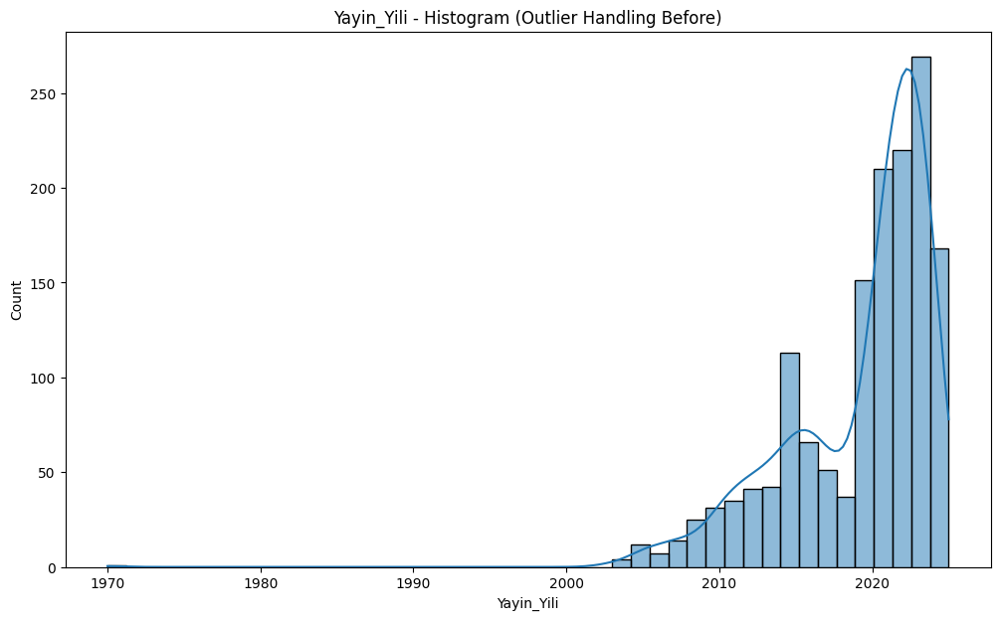

  ✓ Kaydedildi: visualization_v2-nokagitcinsi\Yayin_Yili_before_boxplot.png


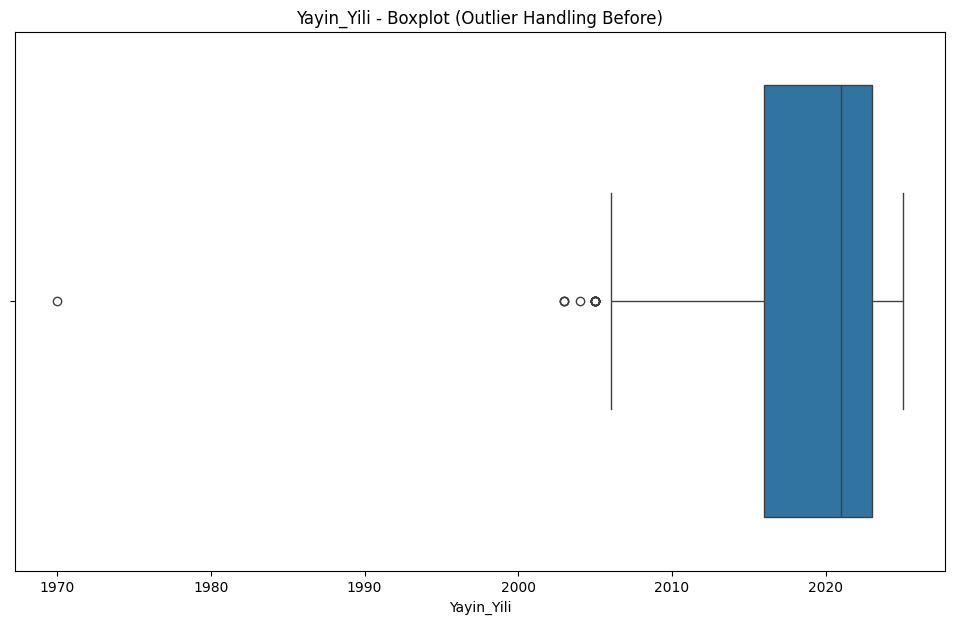

  Yayin_Yili -> Q1: 2016.00, Q3: 2023.00, IQR: 7.00
  Geçerli Sınırlar -> Alt: 2005.50, Üst: 2033.50
  Tespit edilen aykırı değer sayısı: 17
  İşlem SONRASI (Capping uygulanmış) görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2-nokagitcinsi\Yayin_Yili_after_histogram.png


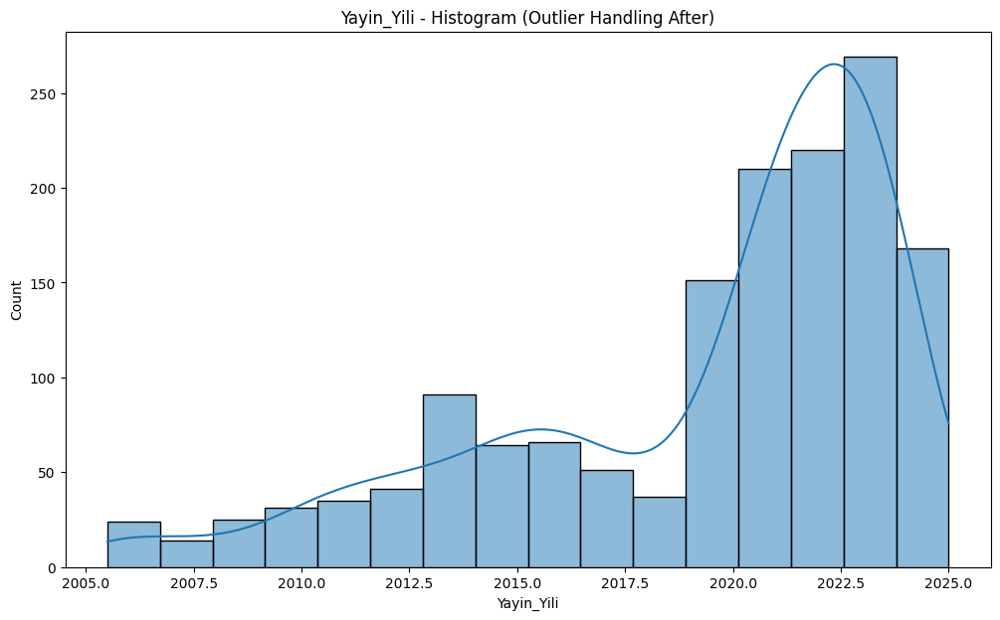

  ✓ Kaydedildi: visualization_v2-nokagitcinsi\Yayin_Yili_after_boxplot.png


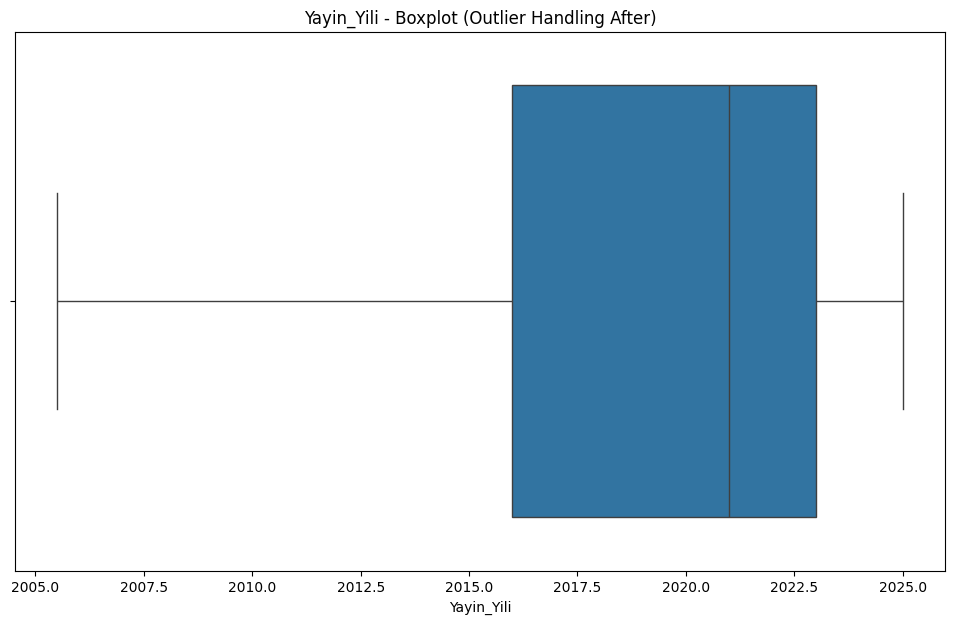


--- İşleniyor: En ---
  İşlem ÖNCESİ görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2-nokagitcinsi\En_before_histogram.png


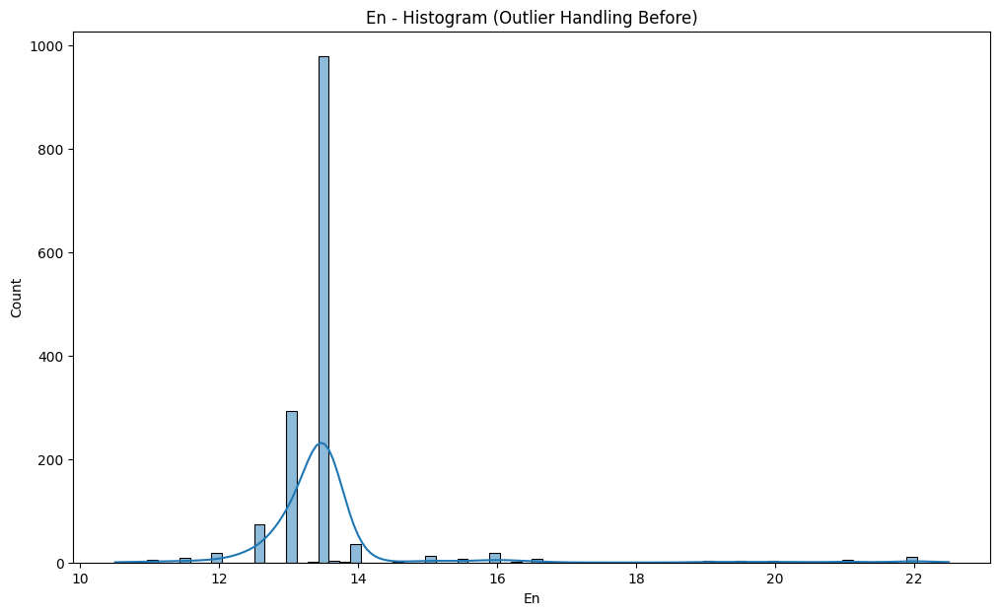

  ✓ Kaydedildi: visualization_v2-nokagitcinsi\En_before_boxplot.png


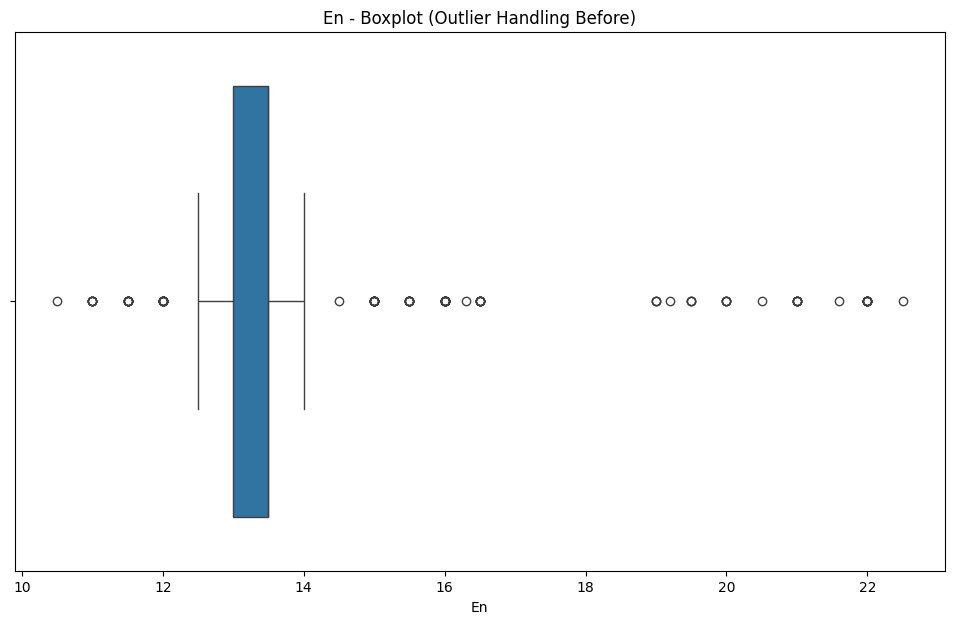

  En -> Q1: 13.00, Q3: 13.50, IQR: 0.50
  Geçerli Sınırlar -> Alt: 12.25, Üst: 14.25
  Tespit edilen aykırı değer sayısı: 111
  İşlem SONRASI (Capping uygulanmış) görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2-nokagitcinsi\En_after_histogram.png


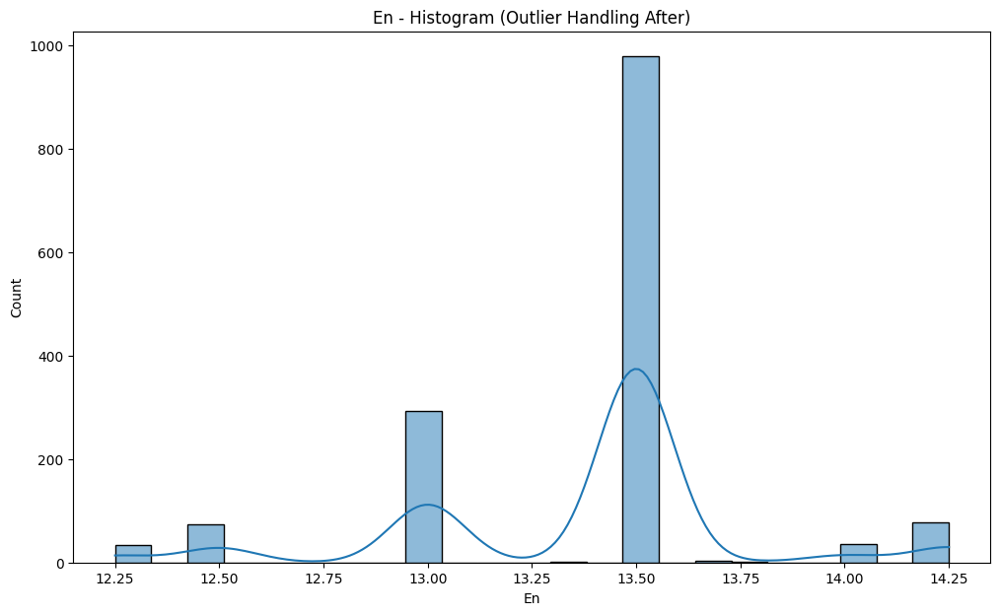

  ✓ Kaydedildi: visualization_v2-nokagitcinsi\En_after_boxplot.png


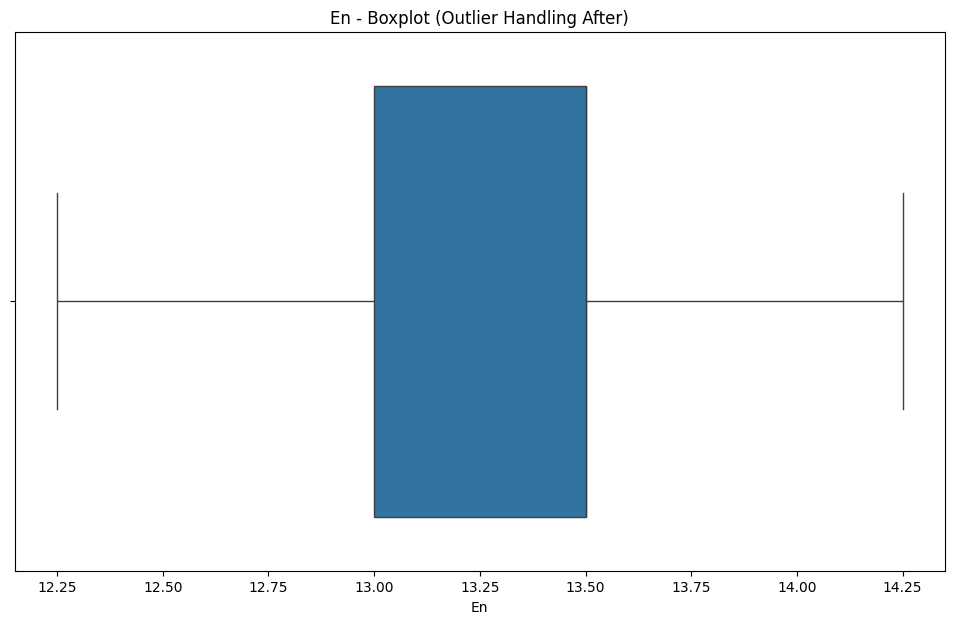


--- İşleniyor: Boy ---
  İşlem ÖNCESİ görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2-nokagitcinsi\Boy_before_histogram.png


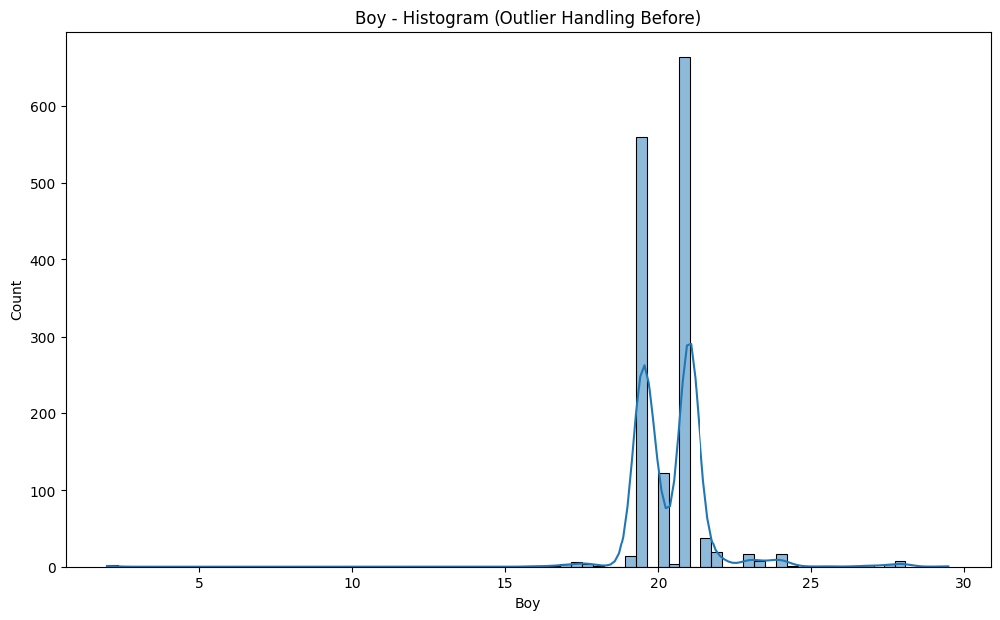

  ✓ Kaydedildi: visualization_v2-nokagitcinsi\Boy_before_boxplot.png


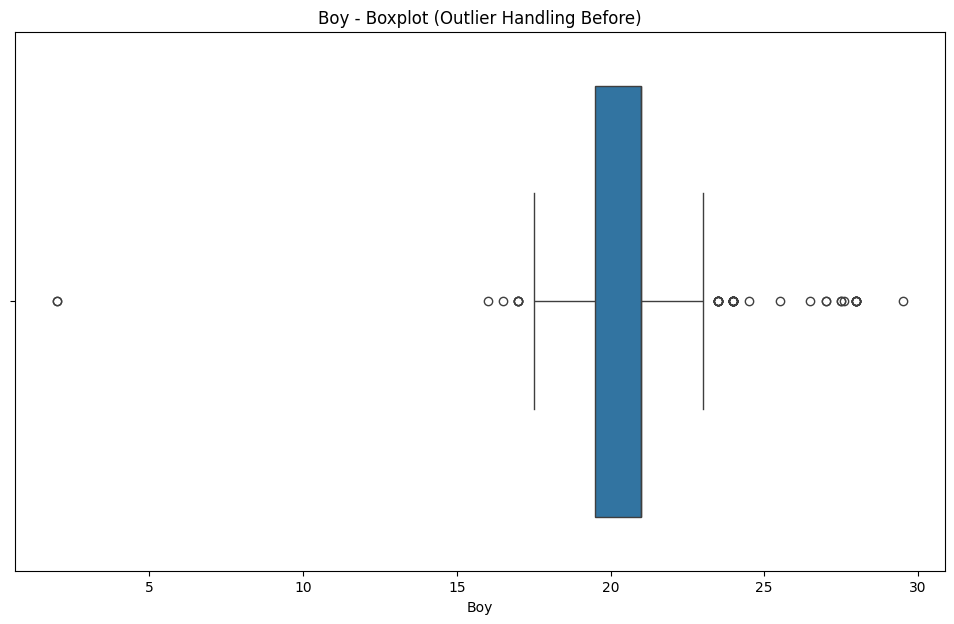

  Boy -> Q1: 19.50, Q3: 21.00, IQR: 1.50
  Geçerli Sınırlar -> Alt: 17.25, Üst: 23.25
  Tespit edilen aykırı değer sayısı: 49
  İşlem SONRASI (Capping uygulanmış) görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2-nokagitcinsi\Boy_after_histogram.png


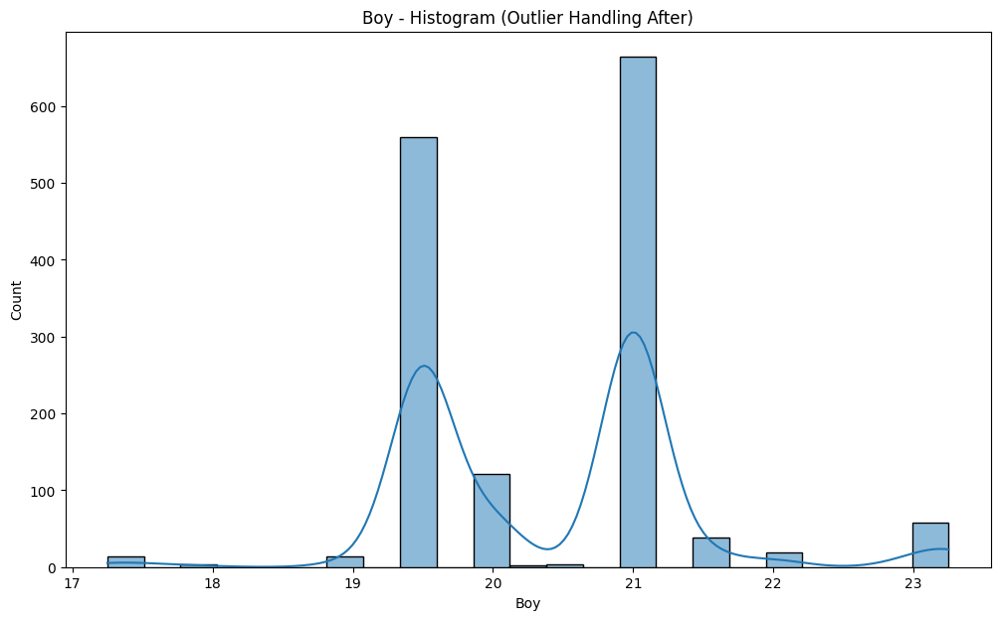

  ✓ Kaydedildi: visualization_v2-nokagitcinsi\Boy_after_boxplot.png


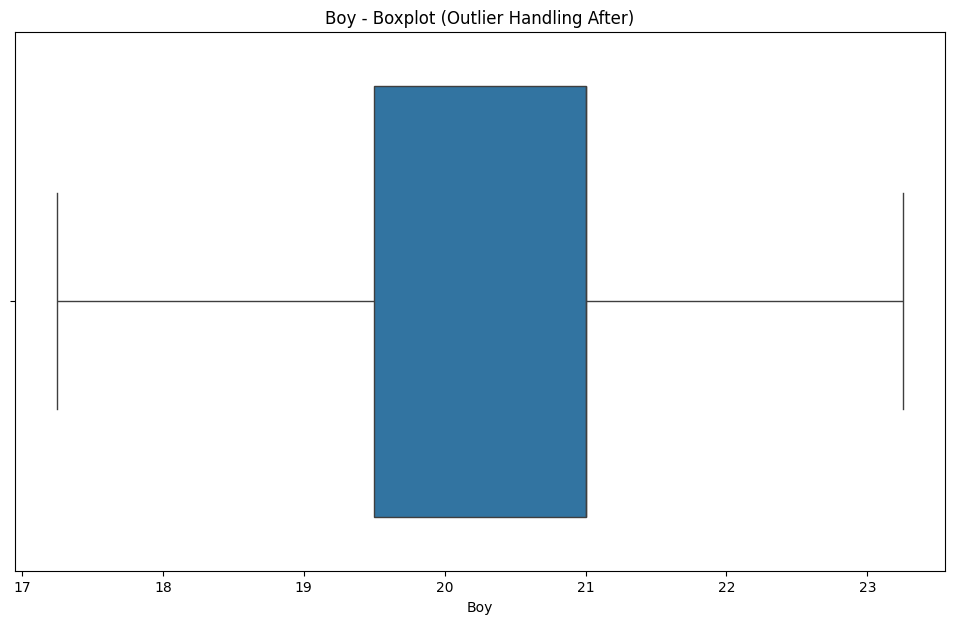


--- İşleniyor: Yazar_Kitap_Sayisi ---
  İşlem ÖNCESİ görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2-nokagitcinsi\Yazar_Kitap_Sayisi_before_histogram.png


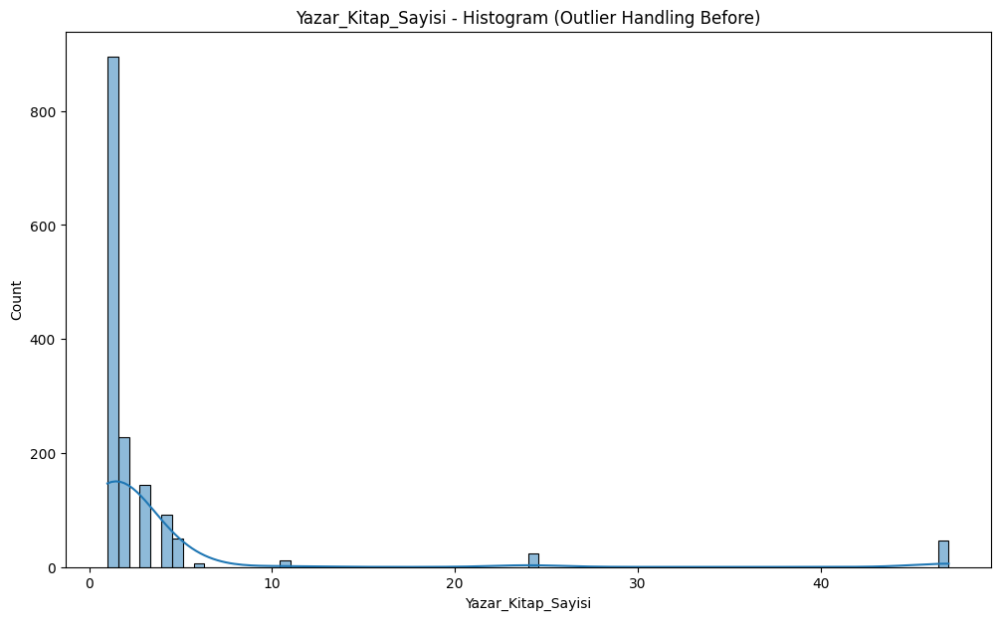

  ✓ Kaydedildi: visualization_v2-nokagitcinsi\Yazar_Kitap_Sayisi_before_boxplot.png


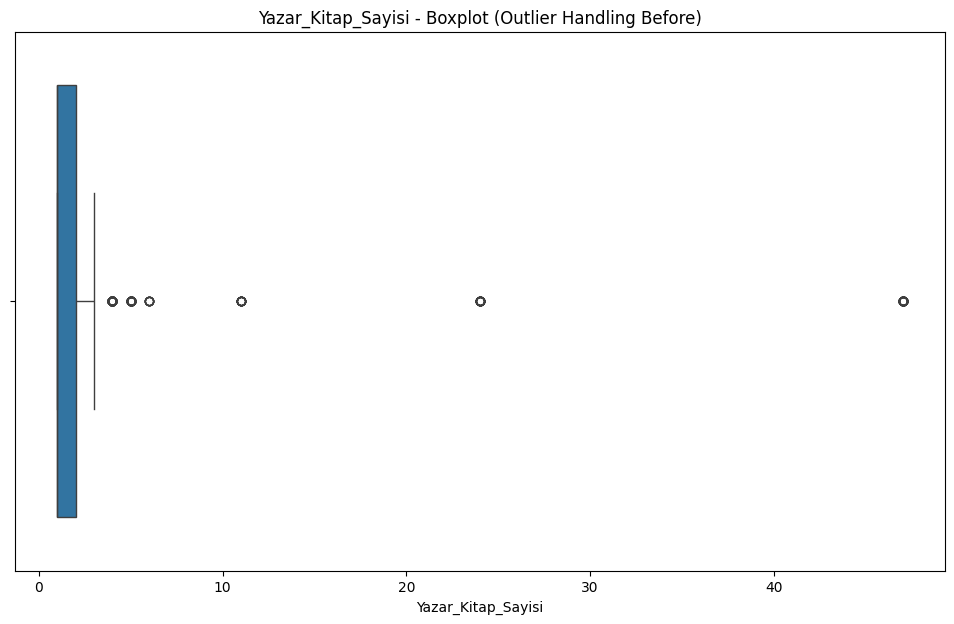

  Yazar_Kitap_Sayisi -> Q1: 1.00, Q3: 2.00, IQR: 1.00
  Geçerli Sınırlar -> Alt: -0.50, Üst: 3.50
  Tespit edilen aykırı değer sayısı: 230
  İşlem SONRASI (Capping uygulanmış) görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2-nokagitcinsi\Yazar_Kitap_Sayisi_after_histogram.png


C:\Users\metehan\AppData\Local\Temp\ipykernel_8724\2452900361.py:168: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.5' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_cleaned.loc[df_cleaned[col_name] < lower_bound, col_name] = lower_bound


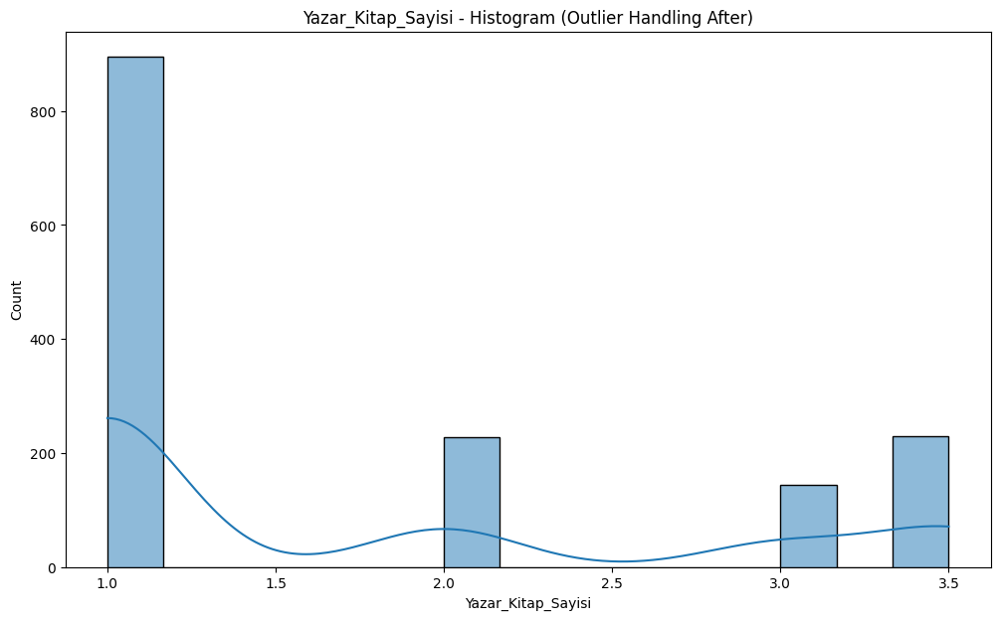

  ✓ Kaydedildi: visualization_v2-nokagitcinsi\Yazar_Kitap_Sayisi_after_boxplot.png


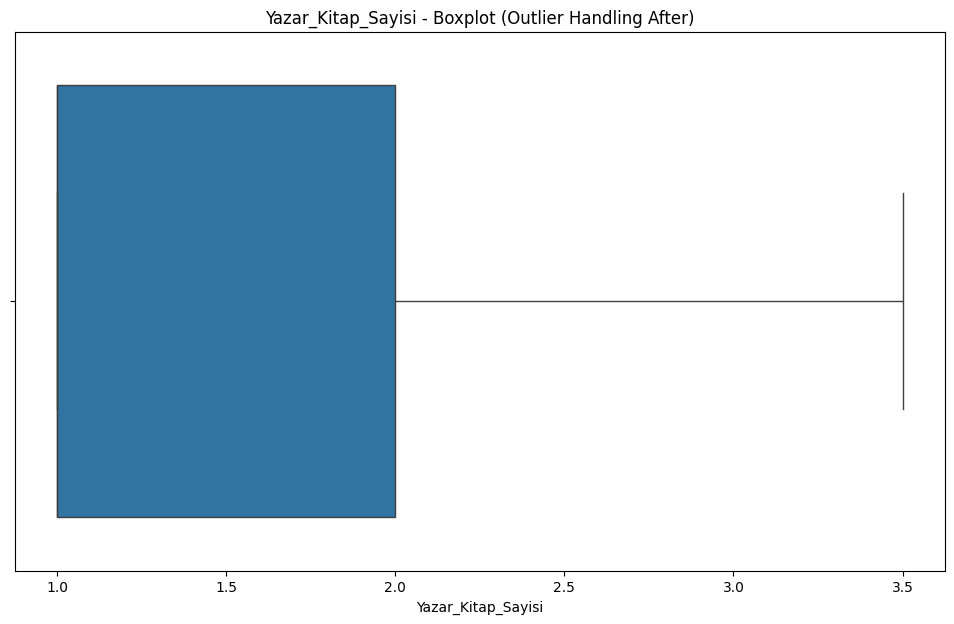


--- Analiz Raporu ---
Orijinal veri 1497 satırdı.
Toplamda 1810 adet aykırı değer (hücre) tespit edildi ve sınır değerler ile baskılandı (capped).

Aykırı değerleri 'Capping' (baskılanmış) veri seti başarıyla kaydedildi:
  -> datasetVersions\kitapyurdu_dataset_v3-nokagitcinsi.csv

--- İşlem Tamamlandı ---


In [5]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os
import sys

# Görselleştirme dosyalarının kaydedileceği klasör adı
VIZ_DIR = "visualization_v2-nokagitcinsi"

# Temizlenmiş verinin kaydedileceği klasör ve dosya adı
CLEANED_DATA_DIR = "datasetVersions"
CLEANED_FILENAME = "kitapyurdu_dataset_v3-nokagitcinsi.csv"  


def save_plot(data_series, col_name, stage, plot_type, output_dir):
    """
    Verilen pandas Serisi için bir histogram veya kutu grafiği oluşturur,
    Jupyter'da gösterir ve belirtilen klasöre kaydeder.
    
    Args:
        data_series (pd.Series): Görselleştirilecek veri.
        col_name (str): Kolon adı (dosya adlandırması için).
        stage (str): 'before' (önce) veya 'after' (sonra).
        plot_type (str): 'histogram' veya 'boxplot'.
        output_dir (str): Görsellerin kaydedileceği klasör.
    """
    plt.figure(figsize=(12, 7))
    
    # Dosya adı ve başlık için formatlama
    title = f"{col_name} - {plot_type.title()} (Outlier Handling {stage.title()})"
    filename = f"{col_name}_{stage}_{plot_type}.png"
    save_path = os.path.join(output_dir, filename)
    
    try:
        if plot_type == 'histogram':
            sns.histplot(data_series, kde=True)
            plt.title(title)
        elif plot_type == 'boxplot':
            sns.boxplot(x=data_series)
            plt.title(title)
        
        # 1. Kaydet
        plt.savefig(save_path)
        print(f"  ✓ Kaydedildi: {save_path}")
        
        # 2. <<! YENİ EKLENDİ !>> Jupyter'da göster
        plt.show() 
        
        # 3. Hafızadan temizle
        plt.close() 
        
    except Exception as e:
        print(f"  ✗ HATA: {col_name} için '{plot_type}' çizilirken hata: {e}", file=sys.stderr)


def process_continuous_data_outliers(file_path):
    """
    Ana fonksiyon: CSV'yi yükler, sürekli (continuous) sayısal kolonları
    filtreler, IQR yöntemiyle aykırı değerleri 'capping' (baskılama)
    yöntemiyle yönetir, işlem öncesi/sonrası görselleri kaydeder/gösterir
    ve temiz veriyi CSV'ye basar.
    
    Args:
        file_path (str): Analiz edilecek CSV dosyasının yolu.
    """
    
    # --- 1. Adım: Çıktı Klasörlerini Oluşturma ---
    try:
        os.makedirs(VIZ_DIR, exist_ok=True)
        print(f"Görseller '{VIZ_DIR}' klasörüne kaydedilecek.")
        
        os.makedirs(CLEANED_DATA_DIR, exist_ok=True)
        print(f"Temizlenmiş veri '{CLEANED_DATA_DIR}' klasörüne kaydedilecek.")
            
    except OSError as e:
        print(f"HATA: Çıktı klasörleri oluşturulamadı: {e}", file=sys.stderr)
        return

    # --- 2. Adım: Veri Yükleme ---
    try:
        df = pd.read_csv(file_path)
        print(f"\n'{file_path}' dosyası başarıyla yüklendi. Toplam {len(df)} satır.")
    except FileNotFoundError:
        print(f"HATA: Dosya bulunamadı. Lütfen şu yolu kontrol edin: {file_path}", file=sys.stderr)
        return
    except Exception as e:
        print(f"Dosya okunurken bir hata oluştu: {e}", file=sys.stderr)
        return

    # --- 3. Adım: 'Gerçek' Sürekli (Continuous) Sayısal Kolonları Filtreleme ---
    
    all_numeric_cols = df.select_dtypes(include=['float64', 'int64']).columns
    continuous_cols = []
    binary_cols = []

    print("\n--- Kolon Analizi ---")
    if len(all_numeric_cols) == 0:
        print("İşlenecek sayısal kolon bulunamadı.")
        return

    for col in all_numeric_cols:
        is_binary = df[col].dropna().isin([0, 1]).all()
        
        if is_binary:
            binary_cols.append(col)
        else:
            continuous_cols.append(col)

    if len(binary_cols) > 0:
        print(f"Atlanan 'Binary' (0/1) Kolonlar: {', '.join(binary_cols)}")
    
    if len(continuous_cols) == 0:
        print("İşlenecek 'sürekli' (continuous) sayısal kolon bulunamadı.")
        return
        
    print(f"İşlenecek 'Sürekli' Kolonlar: {', '.join(continuous_cols)}")

    # --- 4. Adım: Her Sürekli Kolon İçin Aykırı Değer İşleme ve Görselleştirme ---
    
    # Orijinal DataFrame'i kopyala, aykırı değerleri bu kopya üzerinde
    # "Capping" (baskılama) yöntemiyle güncelleyeceğiz.
    df_cleaned = df.copy()
    
    total_outliers_handled = 0
    
    for col_name in continuous_cols:
        print(f"\n--- İşleniyor: {col_name} ---")
        
        # Sadece NaN olmayan verileri al
        data_before = df[col_name].dropna()
        
        if data_before.empty:
            print(f"  ! Uyarı: {col_name} kolonu boş veya sadece NaN değerler içeriyor. Atlanıyor.")
            continue
            
        # --- 4a: "ÖNCE" Görselleştirme ---
        print("  İşlem ÖNCESİ görseller oluşturuluyor...")
        save_plot(data_before, col_name, "before", "histogram", VIZ_DIR)
        save_plot(data_before, col_name, "before", "boxplot", VIZ_DIR)
        
        # --- 4b: IQR Yöntemi ile Aykırı Değer Sınırlarını Hesaplama ---
        Q1 = data_before.quantile(0.25)
        Q3 = data_before.quantile(0.75)
        IQR_val = Q3 - Q1
        
        lower_bound = Q1 - 1.5 * IQR_val
        upper_bound = Q3 + 1.5 * IQR_val
        
        print(f"  {col_name} -> Q1: {Q1:.2f}, Q3: {Q3:.2f}, IQR: {IQR_val:.2f}")
        print(f"  Geçerli Sınırlar -> Alt: {lower_bound:.2f}, Üst: {upper_bound:.2f}")
        
        # --- 4c: Aykırı Değerleri Tespit Etme ve Capping --- <<! GÜNCELLENDİ !>>
        
        # Sadece raporlama için aykırı değer sayısını bul
        outlier_count = data_before[(data_before < lower_bound) | (data_before > upper_bound)].count()
        
        print(f"  Tespit edilen aykırı değer sayısı: {outlier_count}")
        total_outliers_handled += outlier_count
        
        if outlier_count == 0:
            print("  Aykırı değere rastlanmadı. 'Sonra' grafikleri çizilmeyecek.")
            continue
            
        # CAPPING UYGULAMASI
        # 'df_cleaned' kopyası üzerinde çalışıyoruz
        
        # 1. Alt sınırdan küçük olanları alt sınıra eşitle (baskıla)
        df_cleaned.loc[df_cleaned[col_name] < lower_bound, col_name] = lower_bound
        
        # 2. Üst sınırdan büyük olanları üst sınıra eşitle (baskıla)
        df_cleaned.loc[df_cleaned[col_name] > upper_bound, col_name] = upper_bound

        # 'Sonra' verisi, artık Capping uygulanmış veridir
        data_after = df_cleaned[col_name].dropna()

        # --- 4d: "SONRA" Görselleştirme ---
        print("  İşlem SONRASI (Capping uygulanmış) görseller oluşturuluyor...")
        save_plot(data_after, col_name, "after", "histogram", VIZ_DIR)
        save_plot(data_after, col_name, "after", "boxplot", VIZ_DIR)

    print("\n--- Analiz Raporu ---")
    print(f"Orijinal veri {len(df)} satırdı.")
    # <<! GÜNCELLENDİ !>> (Rapor metni)
    print(f"Toplamda {total_outliers_handled} adet aykırı değer (hücre) tespit edildi ve sınır değerler ile baskılandı (capped).")

    # --- 5. Adım: Temizlenmiş (Capped) Veriyi Kaydetme ---
    try:
        output_csv_path = os.path.join(CLEANED_DATA_DIR, CLEANED_FILENAME)
        
        df_cleaned.to_csv(output_csv_path, index=False)
        
        print(f"\nAykırı değerleri 'Capping' (baskılanmış) veri seti başarıyla kaydedildi:")
        print(f"  -> {output_csv_path}")
        
    except Exception as e:
        print(f"\nHATA: Temizlenmiş veri CSV'ye kaydedilirken bir hata oluştu: {e}", file=sys.stderr)


    print("\n--- İşlem Tamamlandı ---")


# --- BU BETİĞİ ÇALIŞTIRMAK İÇİN ---
if __name__ == "__main__":
    # <<!>> LÜTFEN ANALİZ ETMEK İSTEDİĞİNİZ DOSYANIN YOLUNU BURAYA GİRİN
    # Bu kod bir .py dosyası olarak çalıştırılırsa bu blok çalışır.
    # Jupyter'da çalıştırıyorsanız, bu bloğun dışına çıkıp
    # bir sonraki hücrede manuel olarak çağırabilirsiniz:
    
    # csv_dosya_yolu = "verileriniz.csv"
    # process_continuous_data_outliers(csv_dosya_yolu)
    
    # Örnek olarak doğrudan burada tanımlayalım:
    csv_dosya_yolu = "datasetVersions/kitapyurdu_dataset_v2-nokagitcinsi.csv" 
    
    # Ana analiz fonksiyonunu çağır
    process_continuous_data_outliers(csv_dosya_yolu)

### 3) kitapyurdu_dataset_v2-noyayinevinokategorinokagitcinsi.csv --> kitapyurdu_dataset_v3-noyayinevinokategorinokagitcinsi.csv

Görseller 'visualization_v2-noyayinevinokategorinokagitcinsi' klasörüne kaydedilecek.
Temizlenmiş veri 'datasetVersions' klasörüne kaydedilecek.

'datasetVersions/kitapyurdu_dataset_v2-noyayinevinokategorinokagitcinsi.csv' dosyası başarıyla yüklendi. Toplam 1497 satır.

--- Kolon Analizi ---
İşlenecek 'Sürekli' Kolonlar: Favorilere Ekleyen Kişi Sayısı, Okuyacağım olarak işaretlenmiş sayısı, Okudum olarak işaretlenmiş sayısı, Liste Fiyatı, Sayfa Sayısı, Toplam Satılma Sayısı, Toplam Yorum Sayısı, Puan, Oy_Sayisi, Yayin_Yili, En, Boy, Yazar_Kitap_Sayisi

--- İşleniyor: Favorilere Ekleyen Kişi Sayısı ---
  İşlem ÖNCESİ görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2-noyayinevinokategorinokagitcinsi\Favorilere Ekleyen Kişi Sayısı_before_histogram.png


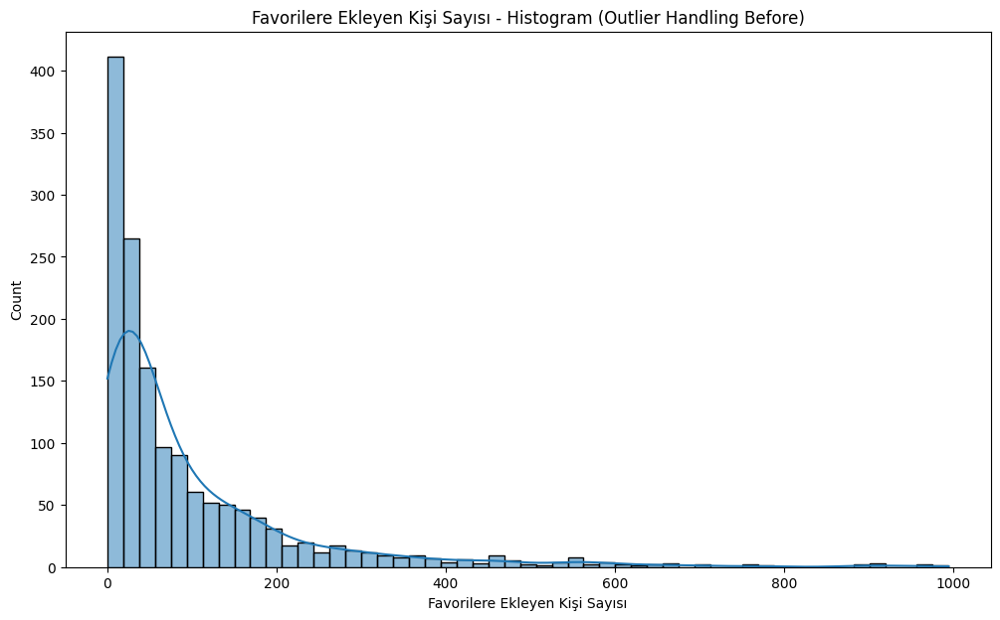

  ✓ Kaydedildi: visualization_v2-noyayinevinokategorinokagitcinsi\Favorilere Ekleyen Kişi Sayısı_before_boxplot.png


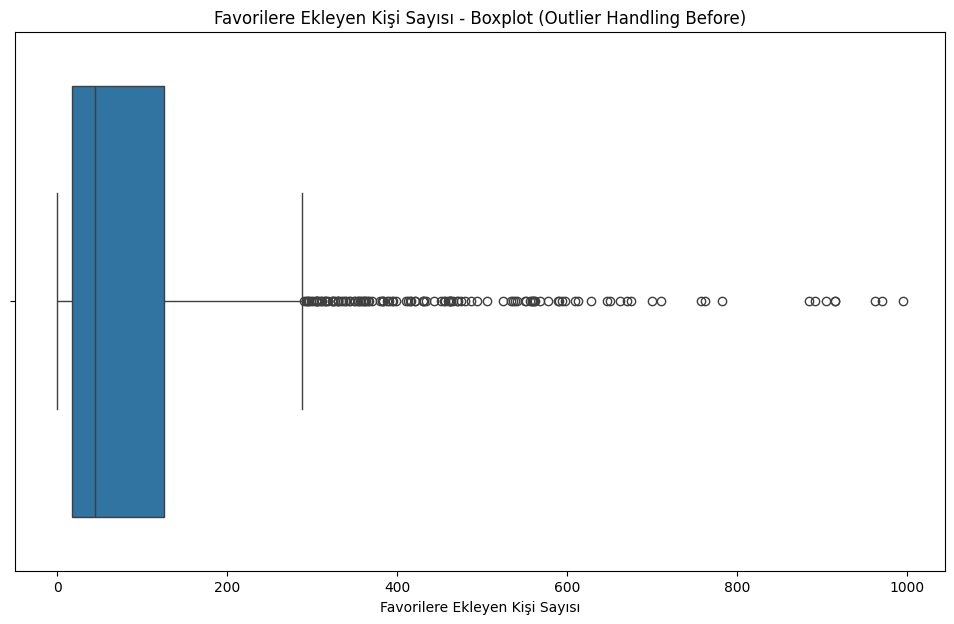

  Favorilere Ekleyen Kişi Sayısı -> Q1: 17.00, Q3: 126.00, IQR: 109.00
  Geçerli Sınırlar -> Alt: -146.50, Üst: 289.50
  Tespit edilen aykırı değer sayısı: 120
  İşlem SONRASI (Capping uygulanmış) görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2-noyayinevinokategorinokagitcinsi\Favorilere Ekleyen Kişi Sayısı_after_histogram.png


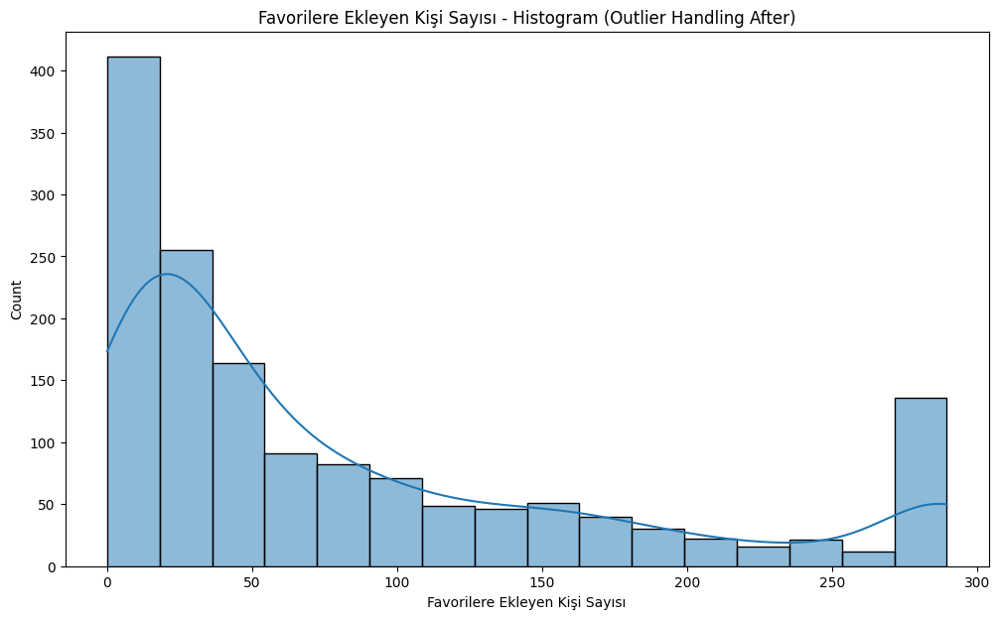

  ✓ Kaydedildi: visualization_v2-noyayinevinokategorinokagitcinsi\Favorilere Ekleyen Kişi Sayısı_after_boxplot.png


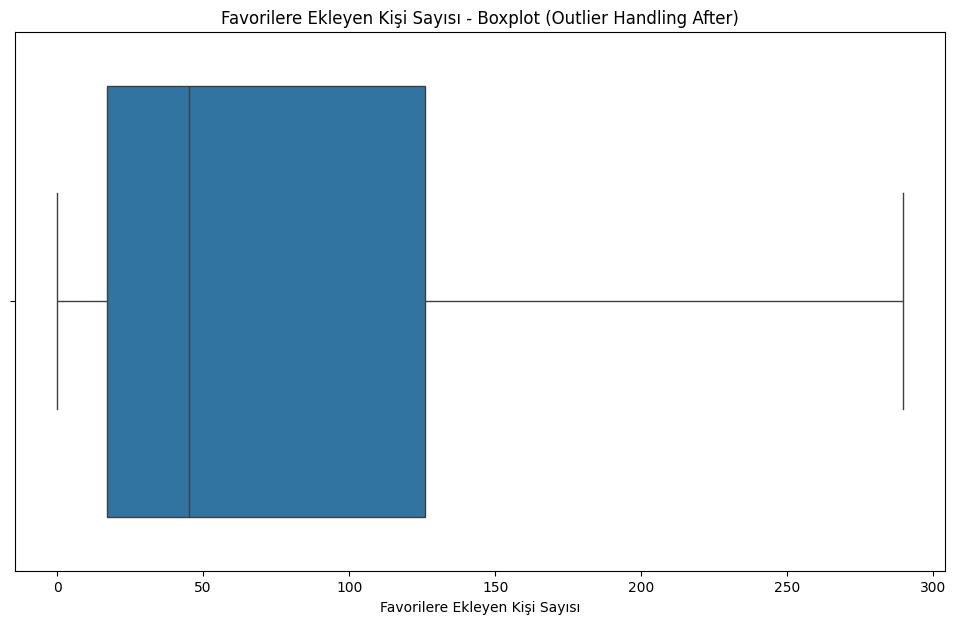


--- İşleniyor: Okuyacağım olarak işaretlenmiş sayısı ---
  İşlem ÖNCESİ görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2-noyayinevinokategorinokagitcinsi\Okuyacağım olarak işaretlenmiş sayısı_before_histogram.png


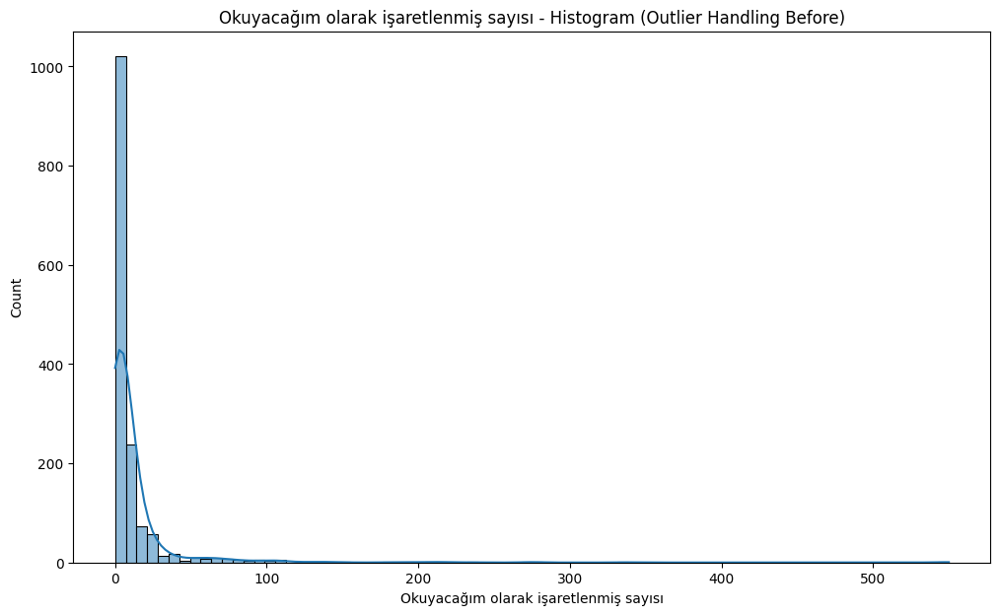

  ✓ Kaydedildi: visualization_v2-noyayinevinokategorinokagitcinsi\Okuyacağım olarak işaretlenmiş sayısı_before_boxplot.png


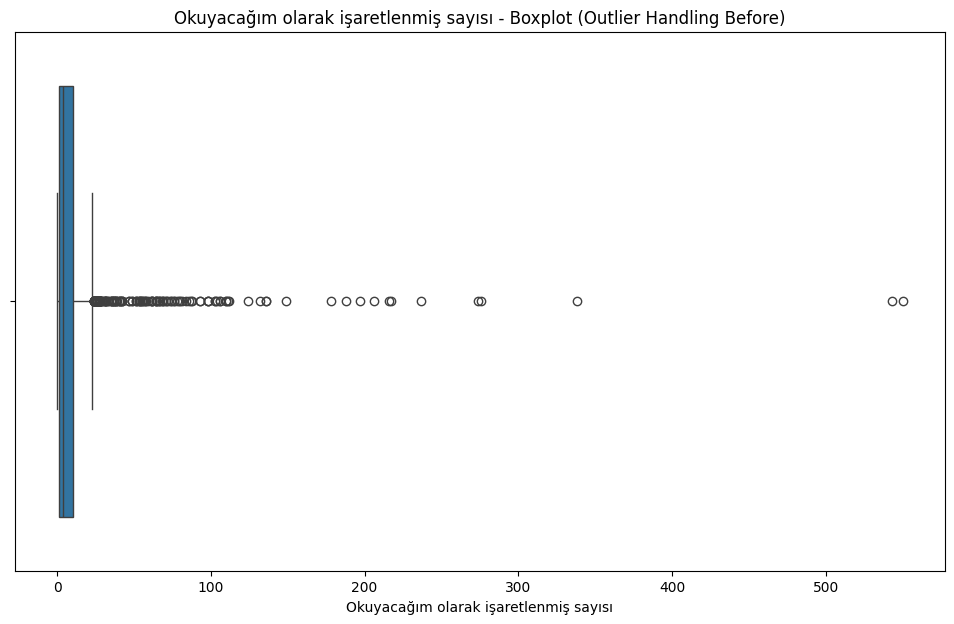

  Okuyacağım olarak işaretlenmiş sayısı -> Q1: 1.00, Q3: 10.00, IQR: 9.00
  Geçerli Sınırlar -> Alt: -12.50, Üst: 23.50
  Tespit edilen aykırı değer sayısı: 147
  İşlem SONRASI (Capping uygulanmış) görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2-noyayinevinokategorinokagitcinsi\Okuyacağım olarak işaretlenmiş sayısı_after_histogram.png


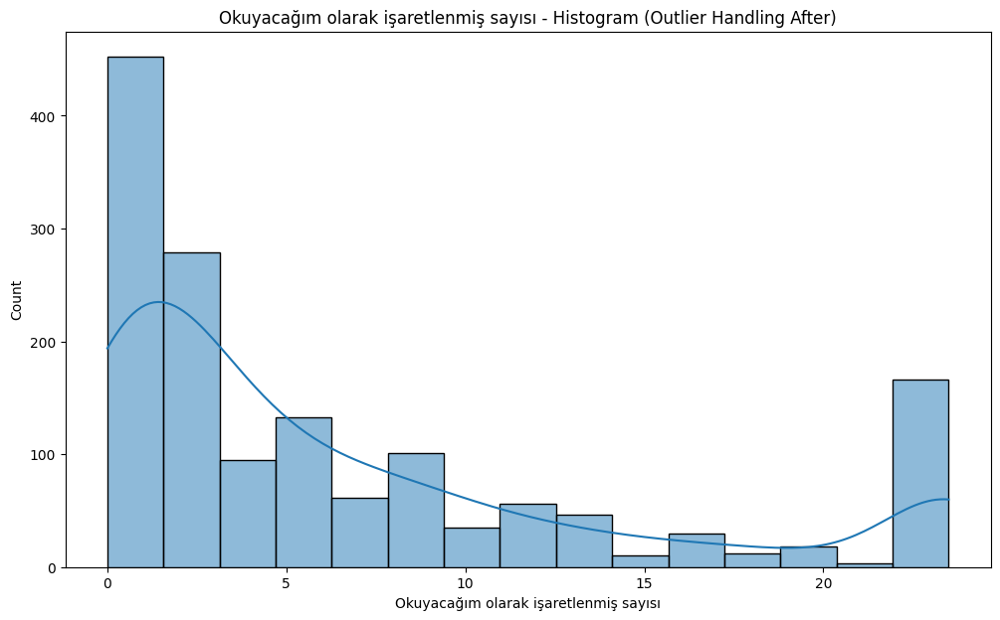

  ✓ Kaydedildi: visualization_v2-noyayinevinokategorinokagitcinsi\Okuyacağım olarak işaretlenmiş sayısı_after_boxplot.png


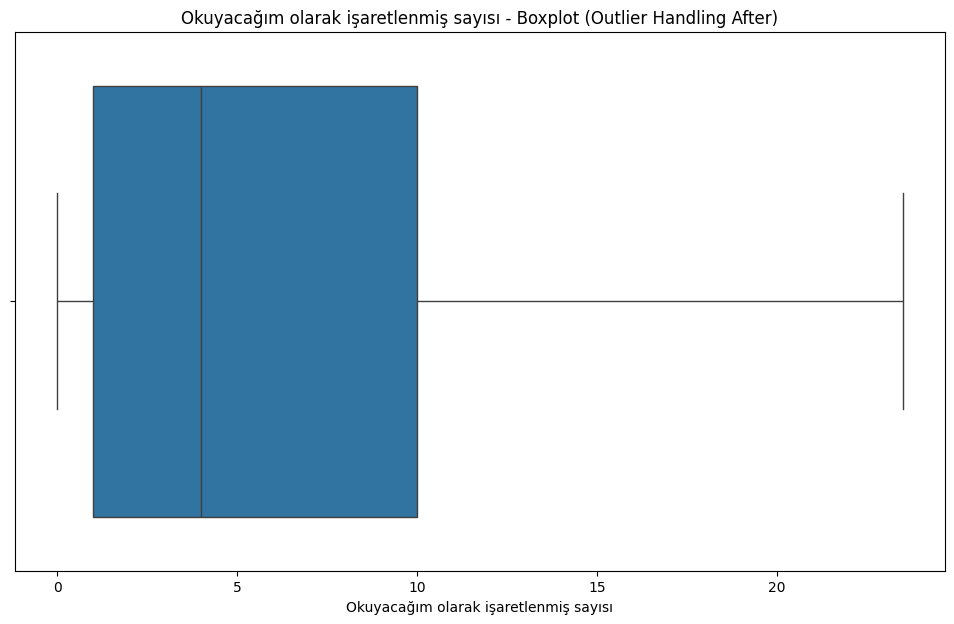


--- İşleniyor: Okudum olarak işaretlenmiş sayısı ---
  İşlem ÖNCESİ görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2-noyayinevinokategorinokagitcinsi\Okudum olarak işaretlenmiş sayısı_before_histogram.png


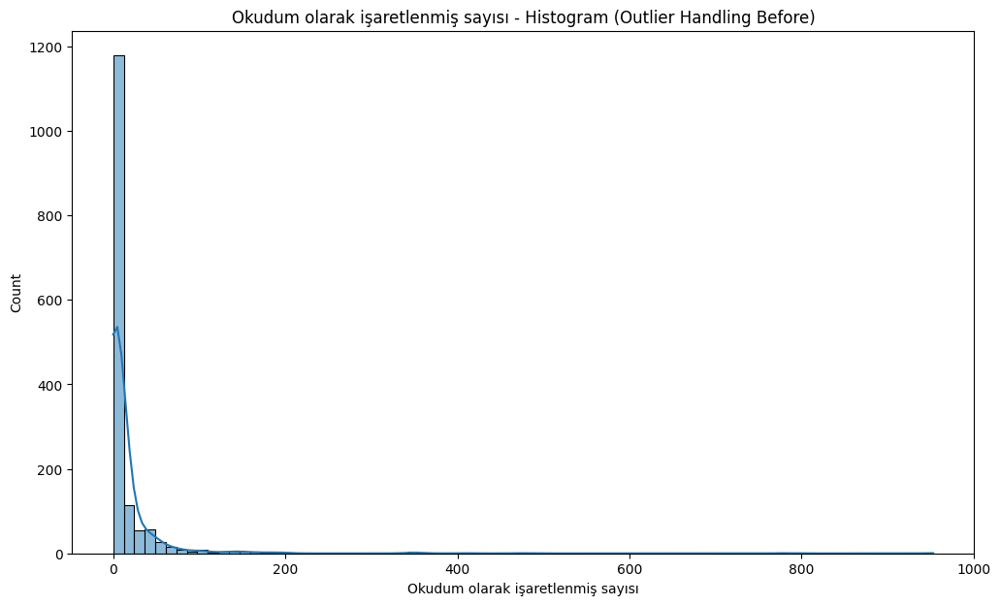

  ✓ Kaydedildi: visualization_v2-noyayinevinokategorinokagitcinsi\Okudum olarak işaretlenmiş sayısı_before_boxplot.png


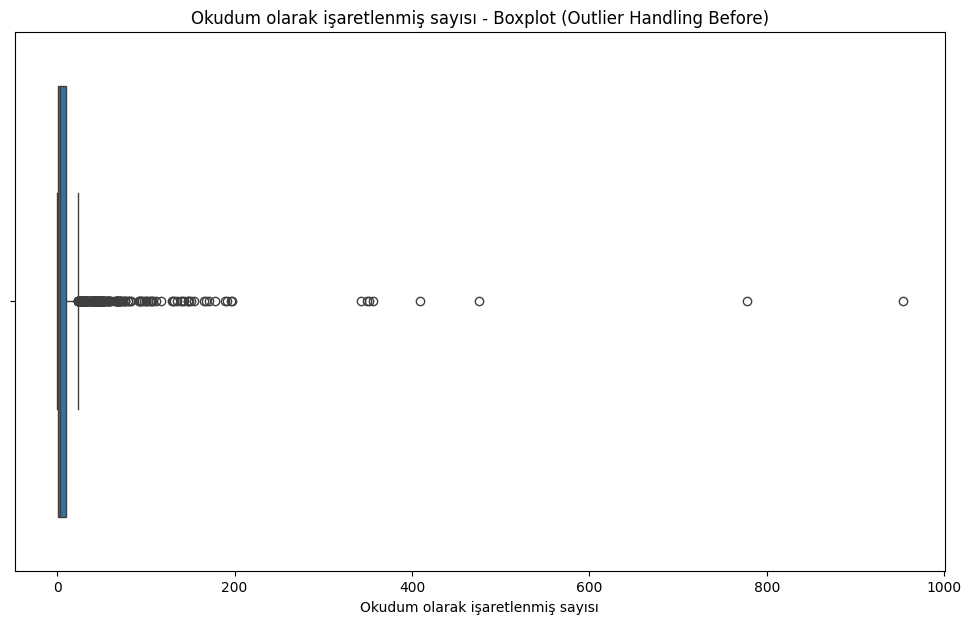

  Okudum olarak işaretlenmiş sayısı -> Q1: 1.00, Q3: 10.00, IQR: 9.00
  Geçerli Sınırlar -> Alt: -12.50, Üst: 23.50
  Tespit edilen aykırı değer sayısı: 210
  İşlem SONRASI (Capping uygulanmış) görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2-noyayinevinokategorinokagitcinsi\Okudum olarak işaretlenmiş sayısı_after_histogram.png


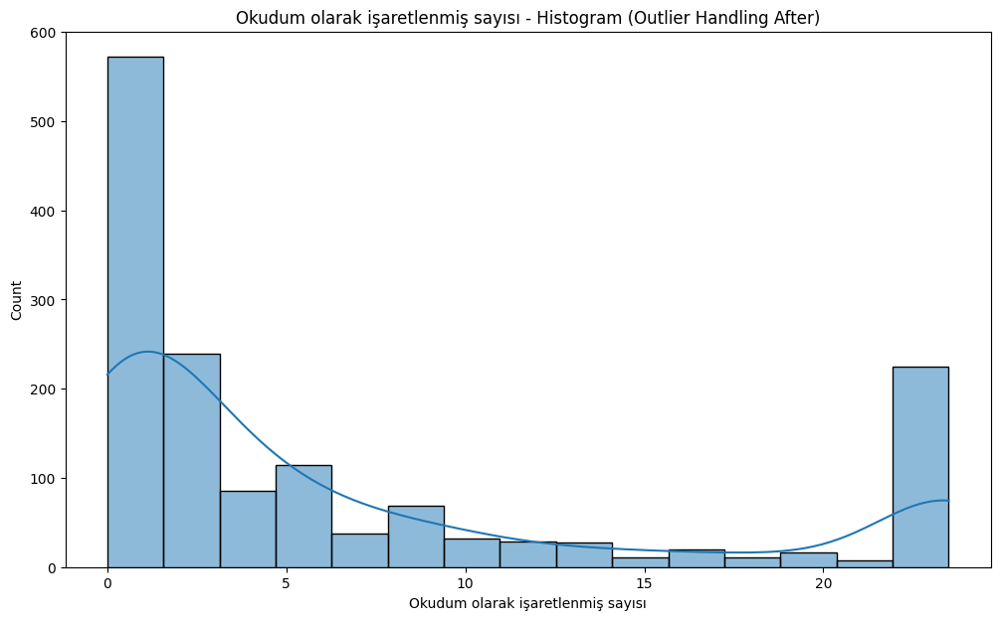

  ✓ Kaydedildi: visualization_v2-noyayinevinokategorinokagitcinsi\Okudum olarak işaretlenmiş sayısı_after_boxplot.png


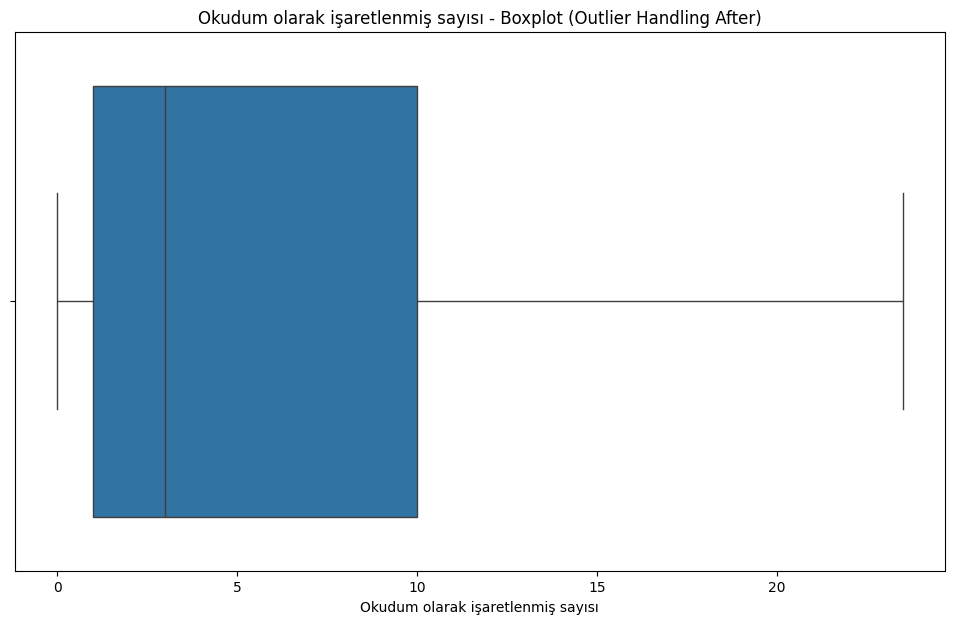


--- İşleniyor: Liste Fiyatı ---
  İşlem ÖNCESİ görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2-noyayinevinokategorinokagitcinsi\Liste Fiyatı_before_histogram.png


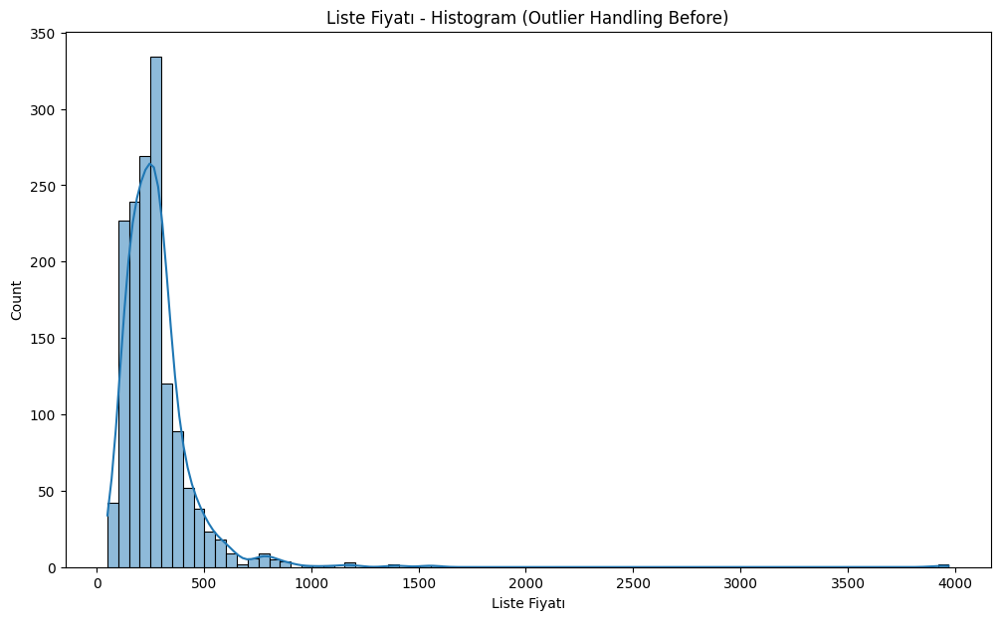

  ✓ Kaydedildi: visualization_v2-noyayinevinokategorinokagitcinsi\Liste Fiyatı_before_boxplot.png


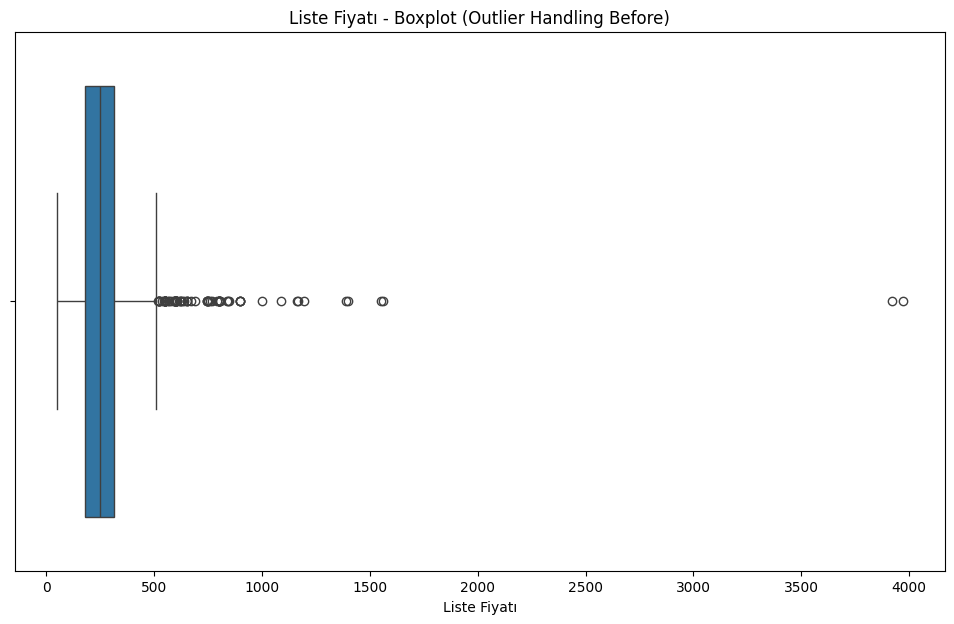

  Liste Fiyatı -> Q1: 180.00, Q3: 314.00, IQR: 134.00
  Geçerli Sınırlar -> Alt: -21.00, Üst: 515.00
  Tespit edilen aykırı değer sayısı: 83
  İşlem SONRASI (Capping uygulanmış) görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2-noyayinevinokategorinokagitcinsi\Liste Fiyatı_after_histogram.png


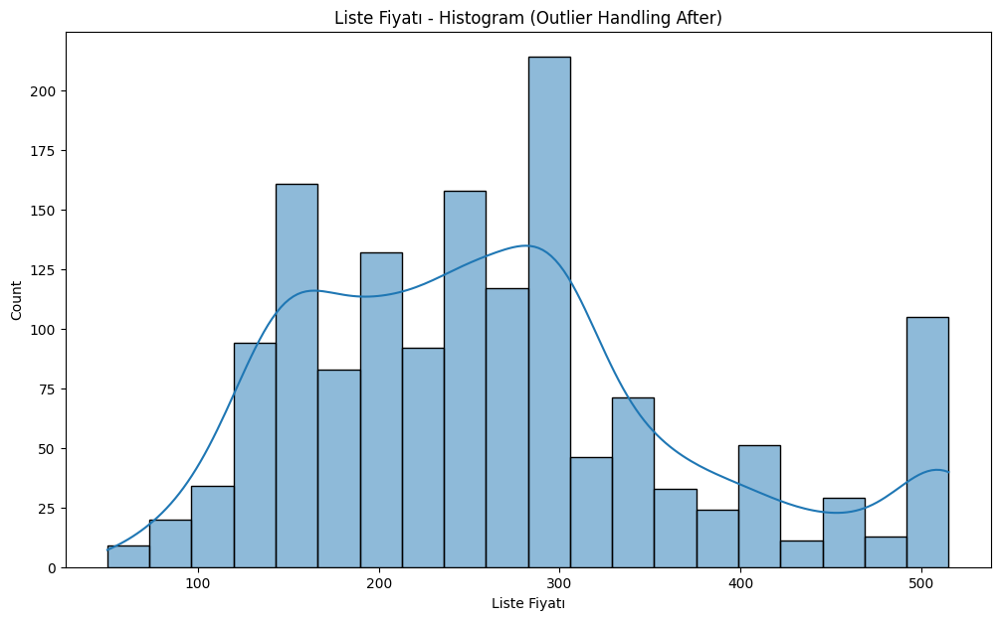

  ✓ Kaydedildi: visualization_v2-noyayinevinokategorinokagitcinsi\Liste Fiyatı_after_boxplot.png


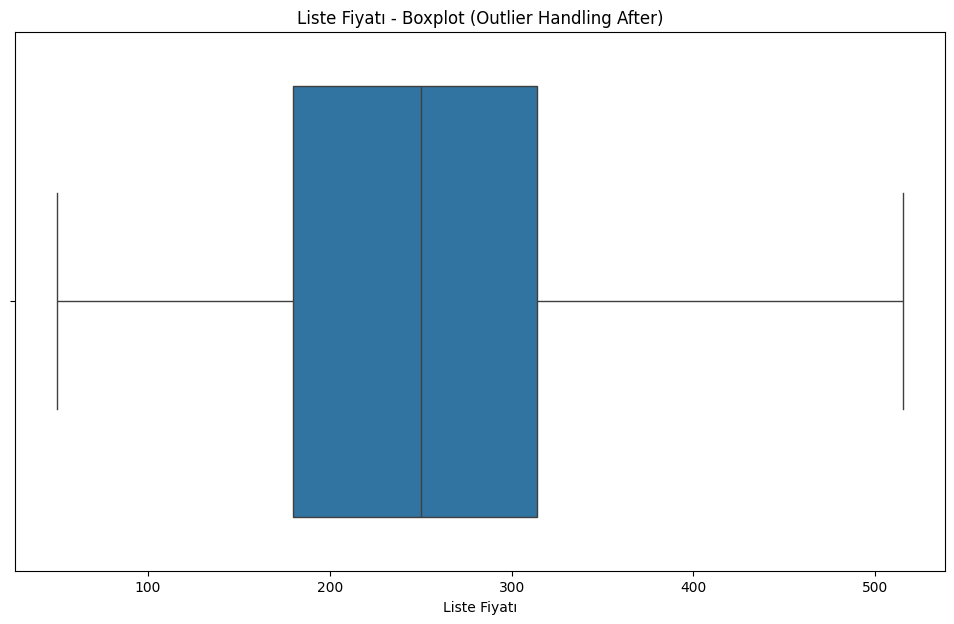


--- İşleniyor: Sayfa Sayısı ---
  İşlem ÖNCESİ görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2-noyayinevinokategorinokagitcinsi\Sayfa Sayısı_before_histogram.png


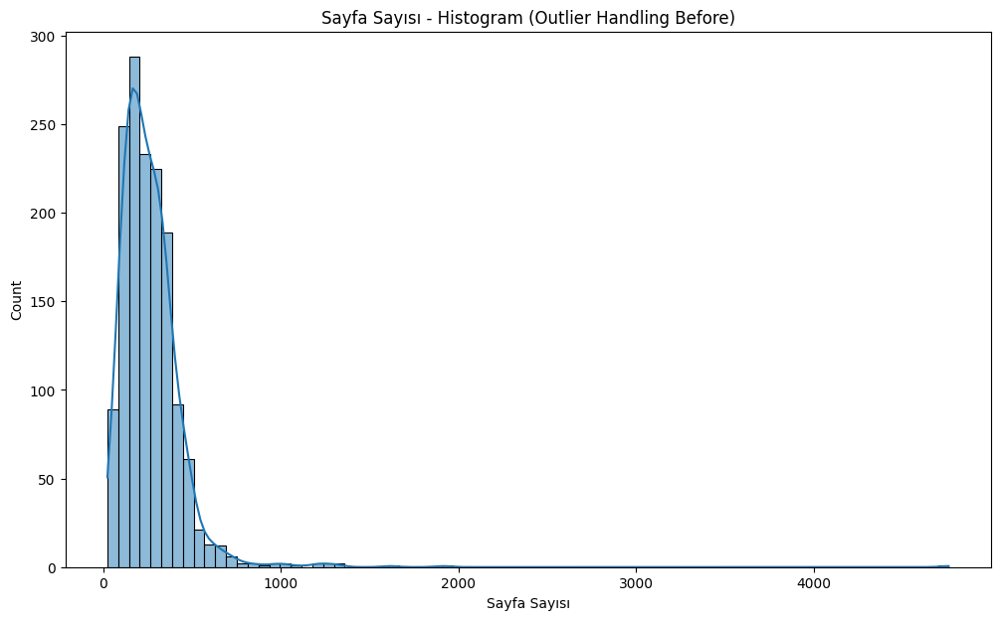

  ✓ Kaydedildi: visualization_v2-noyayinevinokategorinokagitcinsi\Sayfa Sayısı_before_boxplot.png


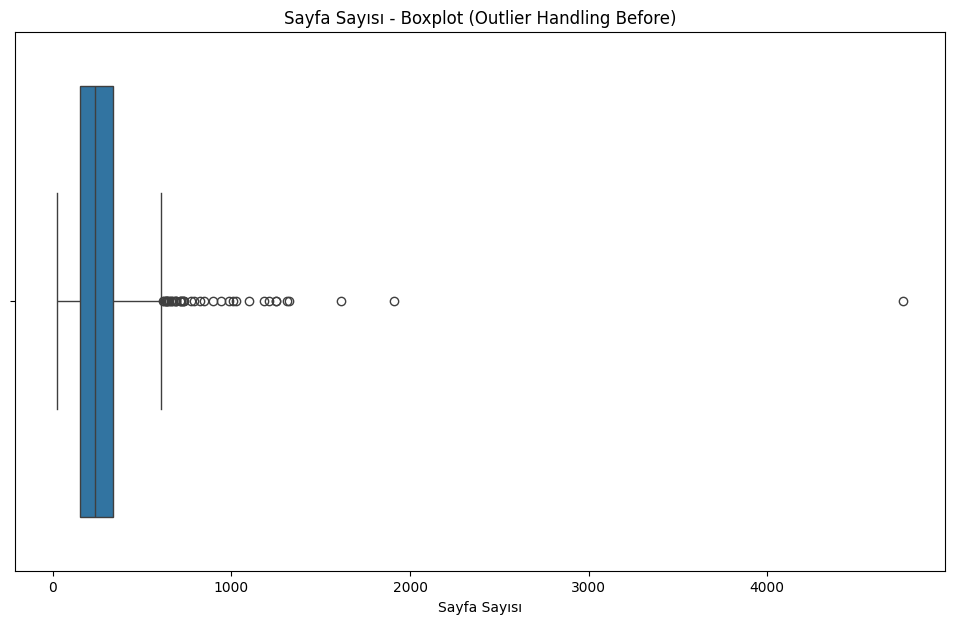

  Sayfa Sayısı -> Q1: 152.00, Q3: 336.00, IQR: 184.00
  Geçerli Sınırlar -> Alt: -124.00, Üst: 612.00
  Tespit edilen aykırı değer sayısı: 39
  İşlem SONRASI (Capping uygulanmış) görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2-noyayinevinokategorinokagitcinsi\Sayfa Sayısı_after_histogram.png


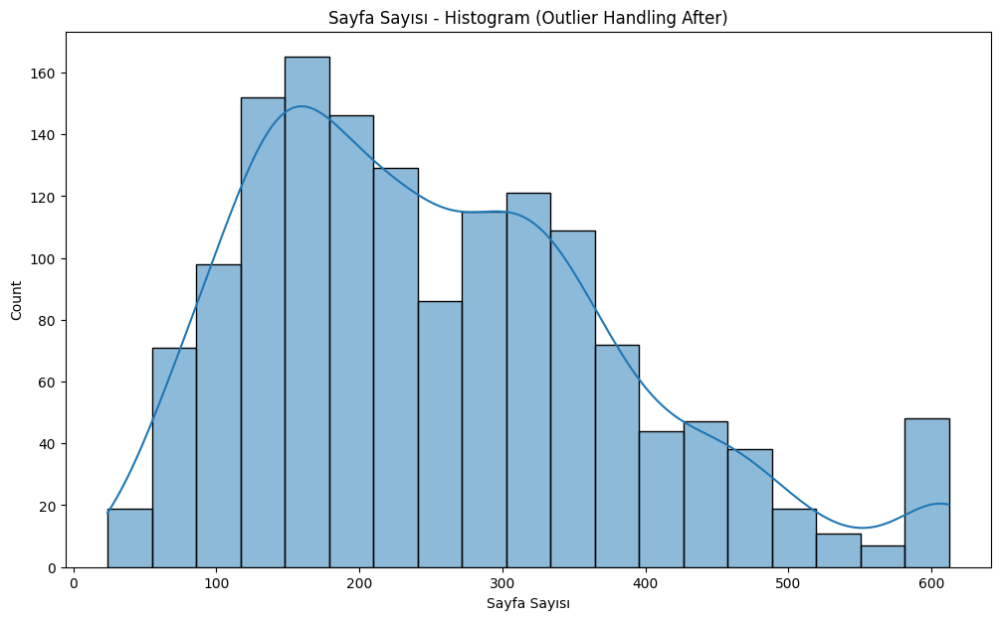

  ✓ Kaydedildi: visualization_v2-noyayinevinokategorinokagitcinsi\Sayfa Sayısı_after_boxplot.png


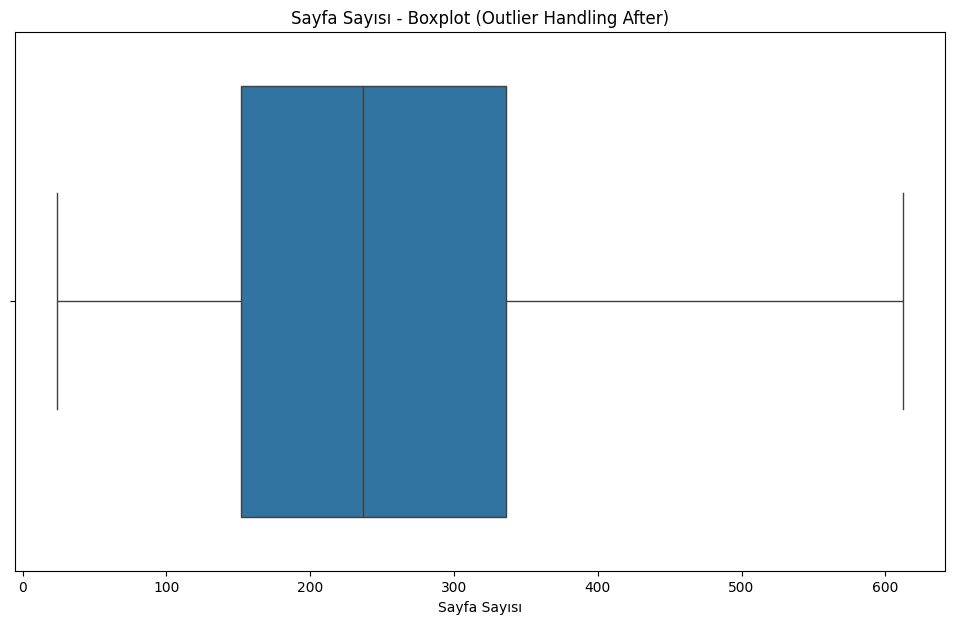


--- İşleniyor: Toplam Satılma Sayısı ---
  İşlem ÖNCESİ görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2-noyayinevinokategorinokagitcinsi\Toplam Satılma Sayısı_before_histogram.png


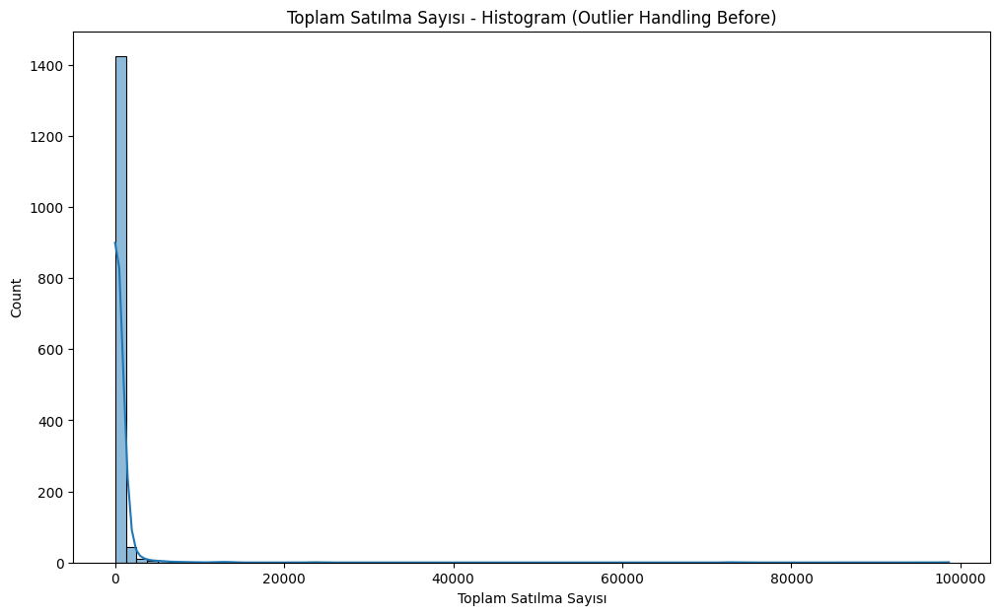

  ✓ Kaydedildi: visualization_v2-noyayinevinokategorinokagitcinsi\Toplam Satılma Sayısı_before_boxplot.png


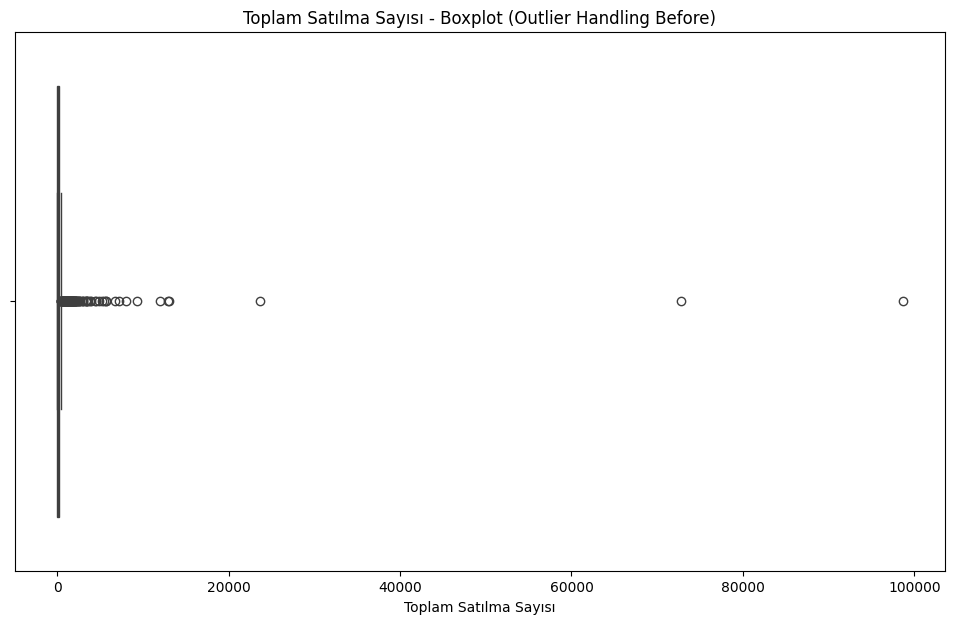

  Toplam Satılma Sayısı -> Q1: 40.00, Q3: 217.00, IQR: 177.00
  Geçerli Sınırlar -> Alt: -225.50, Üst: 482.50
  Tespit edilen aykırı değer sayısı: 145
  İşlem SONRASI (Capping uygulanmış) görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2-noyayinevinokategorinokagitcinsi\Toplam Satılma Sayısı_after_histogram.png


C:\Users\metehan\AppData\Local\Temp\ipykernel_8724\2852181094.py:168: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-225.5' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_cleaned.loc[df_cleaned[col_name] < lower_bound, col_name] = lower_bound


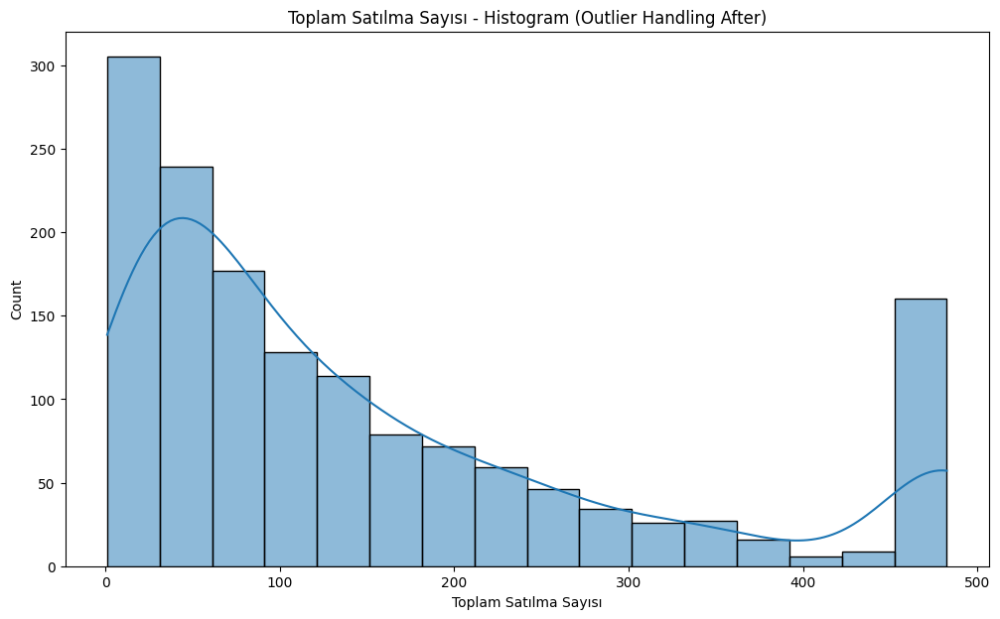

  ✓ Kaydedildi: visualization_v2-noyayinevinokategorinokagitcinsi\Toplam Satılma Sayısı_after_boxplot.png


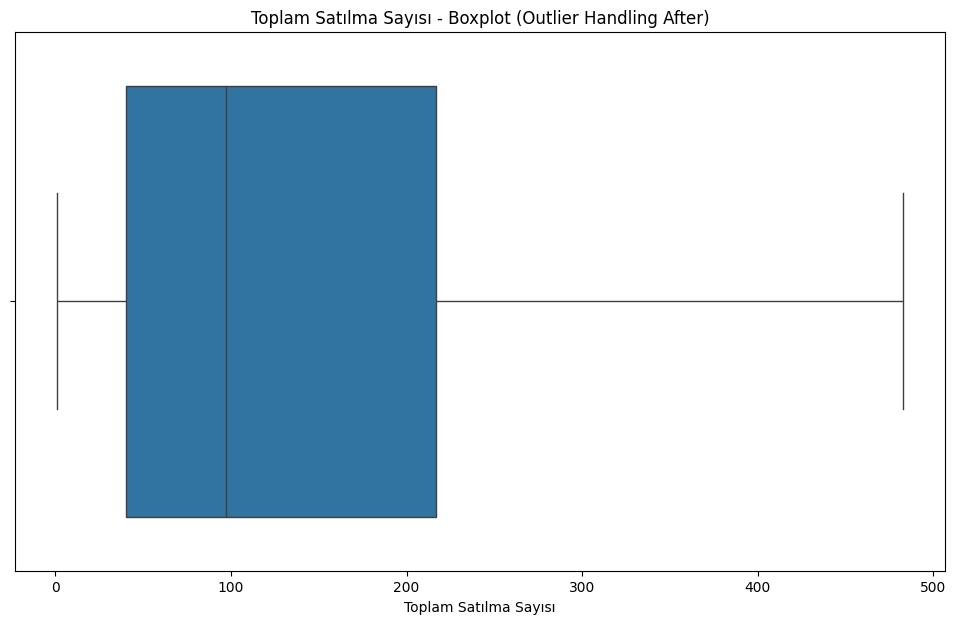


--- İşleniyor: Toplam Yorum Sayısı ---
  İşlem ÖNCESİ görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2-noyayinevinokategorinokagitcinsi\Toplam Yorum Sayısı_before_histogram.png


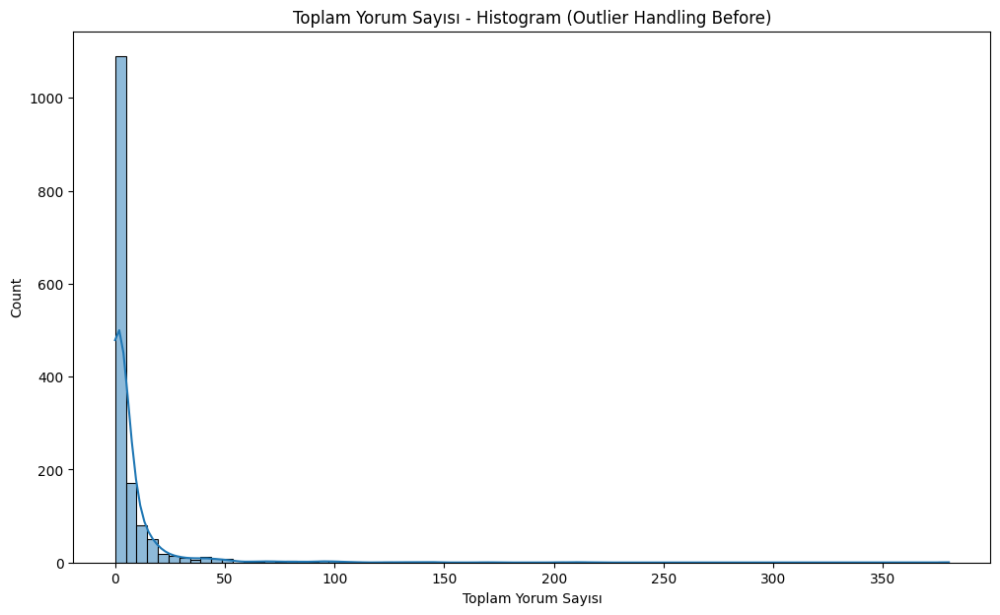

  ✓ Kaydedildi: visualization_v2-noyayinevinokategorinokagitcinsi\Toplam Yorum Sayısı_before_boxplot.png


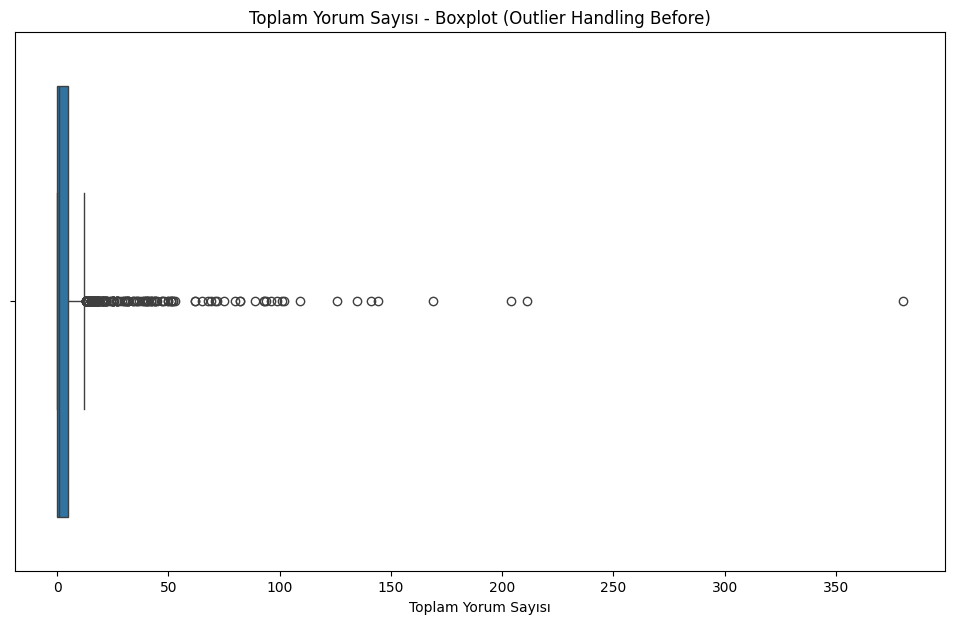

  Toplam Yorum Sayısı -> Q1: 0.00, Q3: 5.00, IQR: 5.00
  Geçerli Sınırlar -> Alt: -7.50, Üst: 12.50
  Tespit edilen aykırı değer sayısı: 179
  İşlem SONRASI (Capping uygulanmış) görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2-noyayinevinokategorinokagitcinsi\Toplam Yorum Sayısı_after_histogram.png


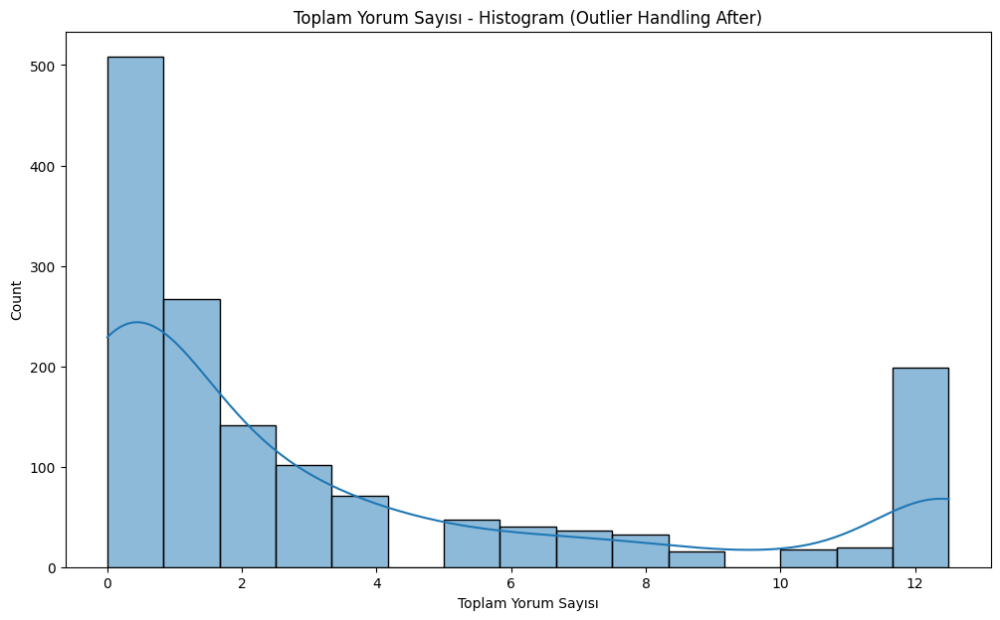

  ✓ Kaydedildi: visualization_v2-noyayinevinokategorinokagitcinsi\Toplam Yorum Sayısı_after_boxplot.png


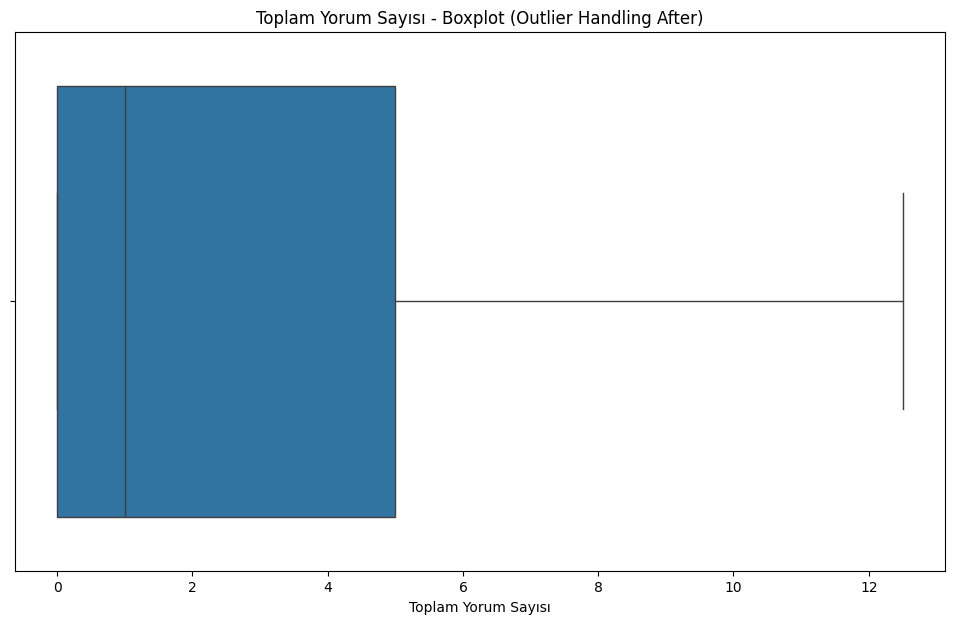


--- İşleniyor: Puan ---
  İşlem ÖNCESİ görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2-noyayinevinokategorinokagitcinsi\Puan_before_histogram.png


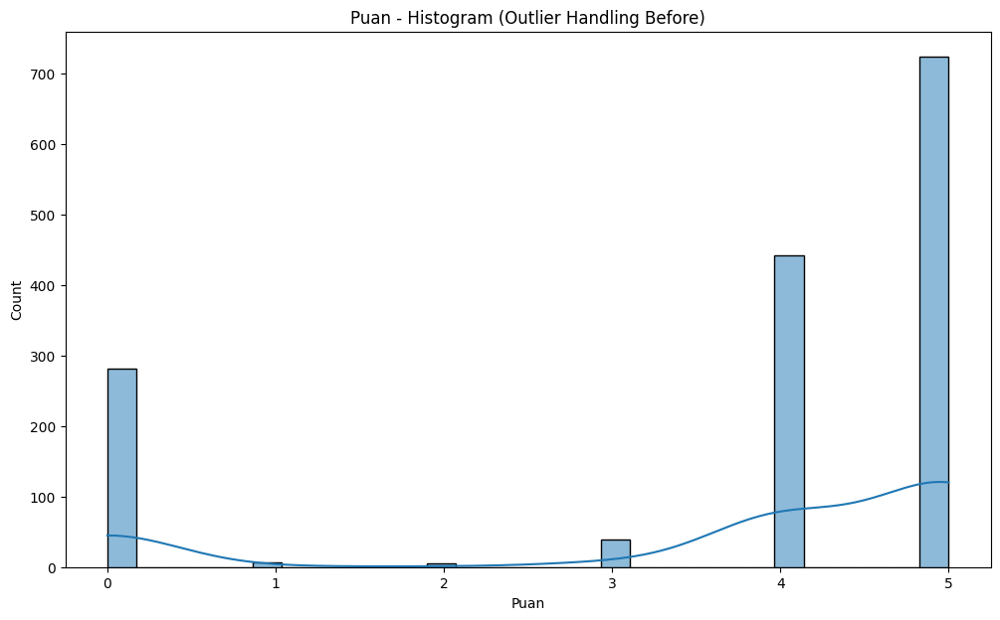

  ✓ Kaydedildi: visualization_v2-noyayinevinokategorinokagitcinsi\Puan_before_boxplot.png


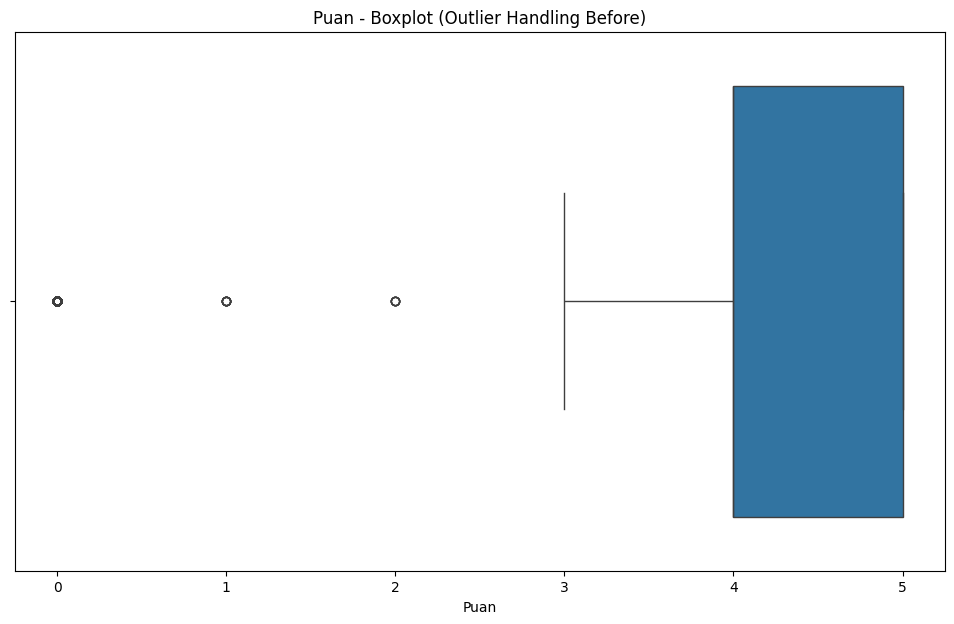

  Puan -> Q1: 4.00, Q3: 5.00, IQR: 1.00
  Geçerli Sınırlar -> Alt: 2.50, Üst: 6.50
  Tespit edilen aykırı değer sayısı: 293
  İşlem SONRASI (Capping uygulanmış) görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2-noyayinevinokategorinokagitcinsi\Puan_after_histogram.png


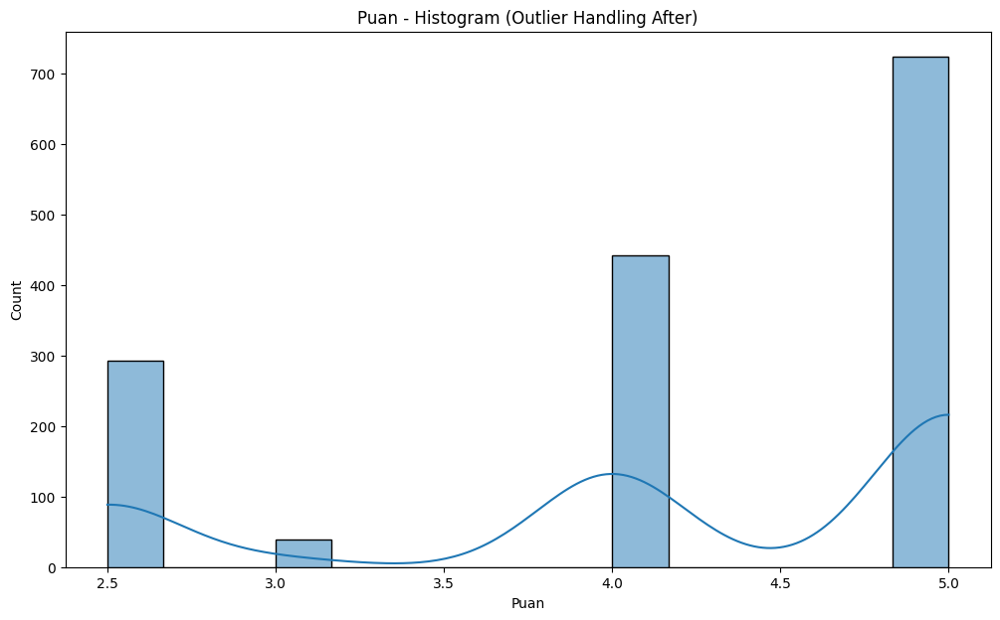

  ✓ Kaydedildi: visualization_v2-noyayinevinokategorinokagitcinsi\Puan_after_boxplot.png


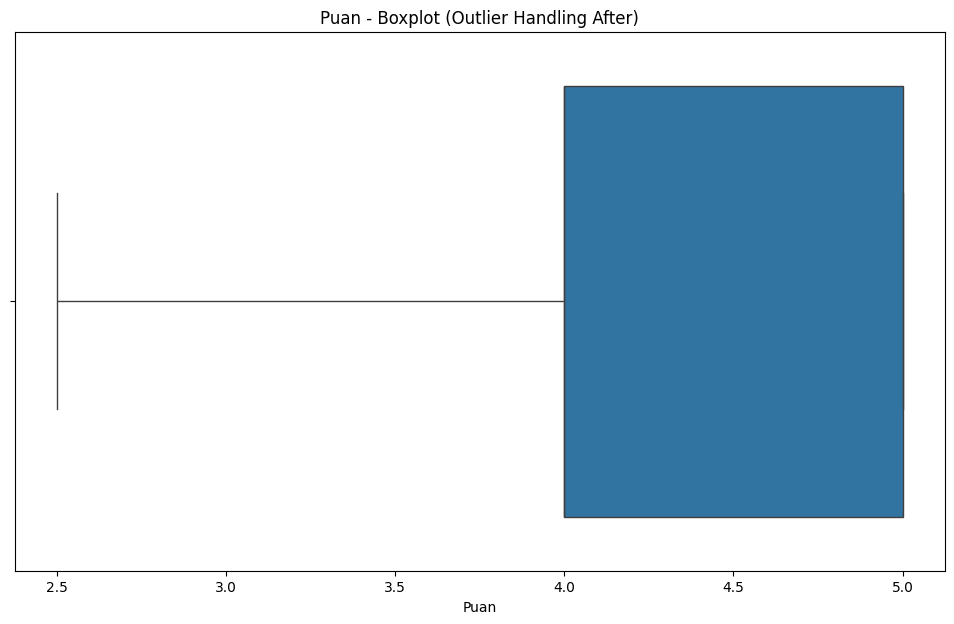


--- İşleniyor: Oy_Sayisi ---
  İşlem ÖNCESİ görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2-noyayinevinokategorinokagitcinsi\Oy_Sayisi_before_histogram.png


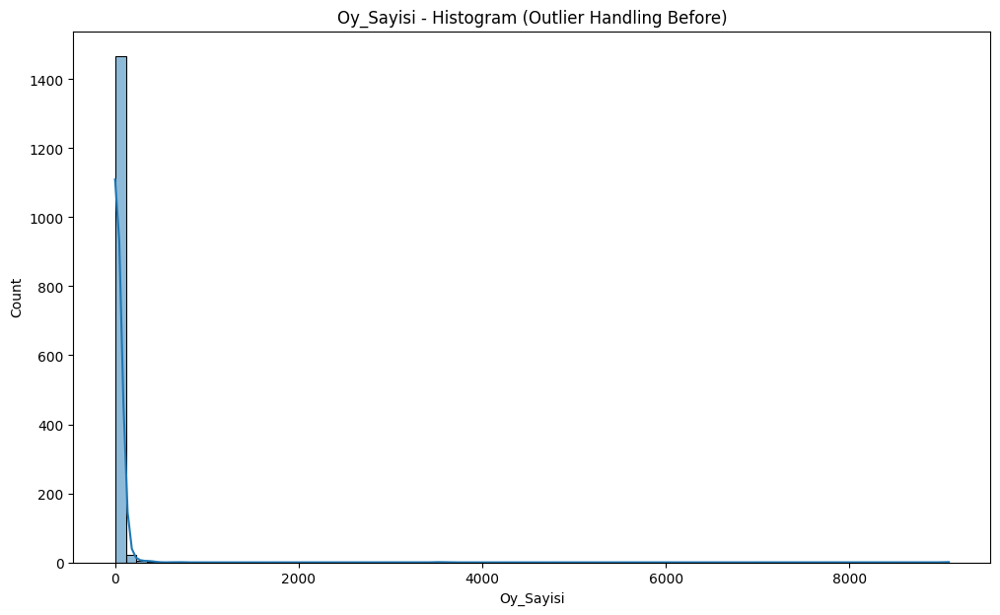

  ✓ Kaydedildi: visualization_v2-noyayinevinokategorinokagitcinsi\Oy_Sayisi_before_boxplot.png


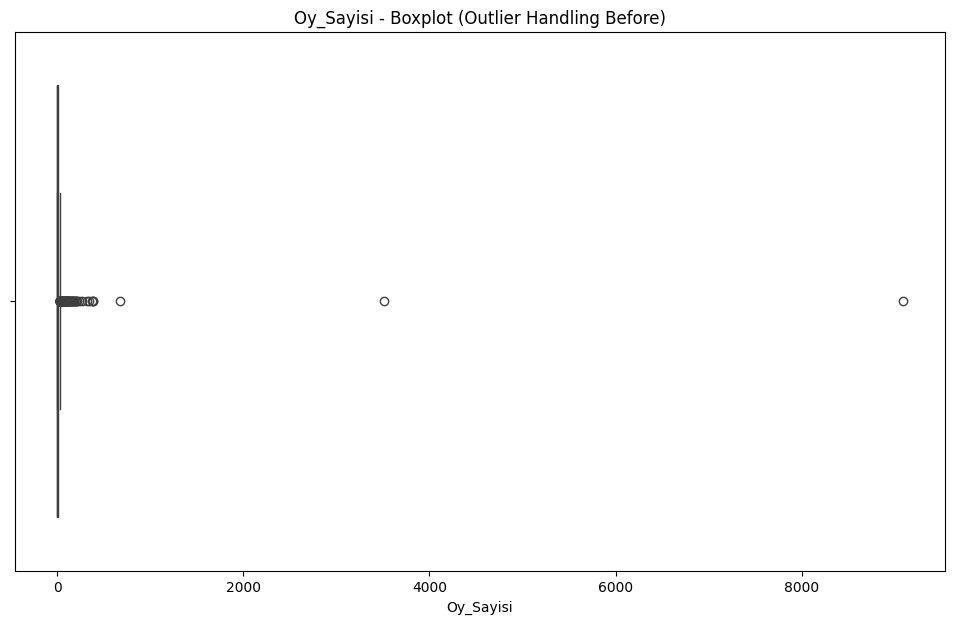

  Oy_Sayisi -> Q1: 1.00, Q3: 12.00, IQR: 11.00
  Geçerli Sınırlar -> Alt: -15.50, Üst: 28.50
  Tespit edilen aykırı değer sayısı: 187
  İşlem SONRASI (Capping uygulanmış) görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2-noyayinevinokategorinokagitcinsi\Oy_Sayisi_after_histogram.png


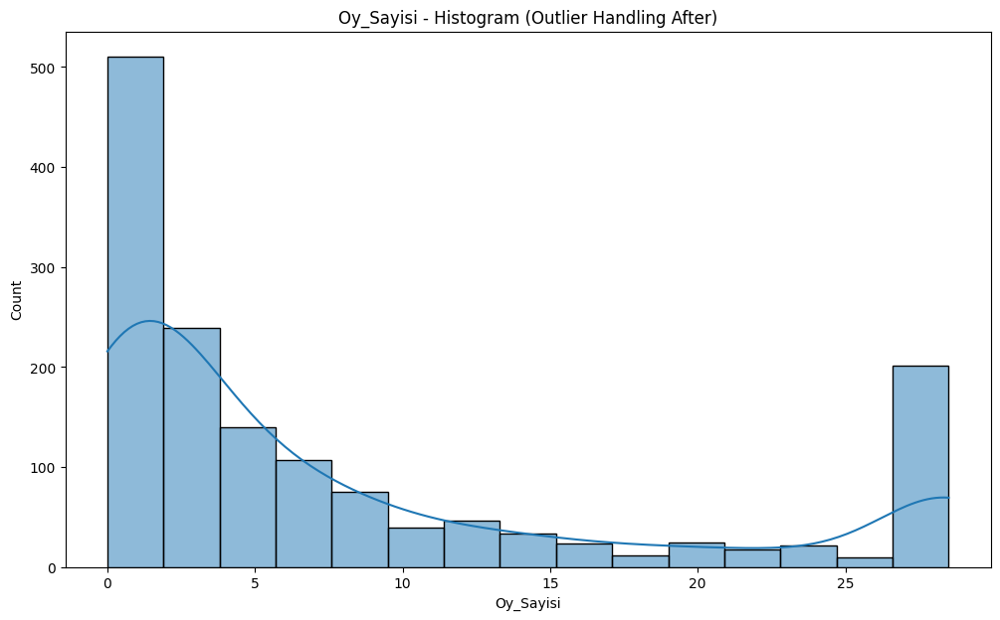

  ✓ Kaydedildi: visualization_v2-noyayinevinokategorinokagitcinsi\Oy_Sayisi_after_boxplot.png


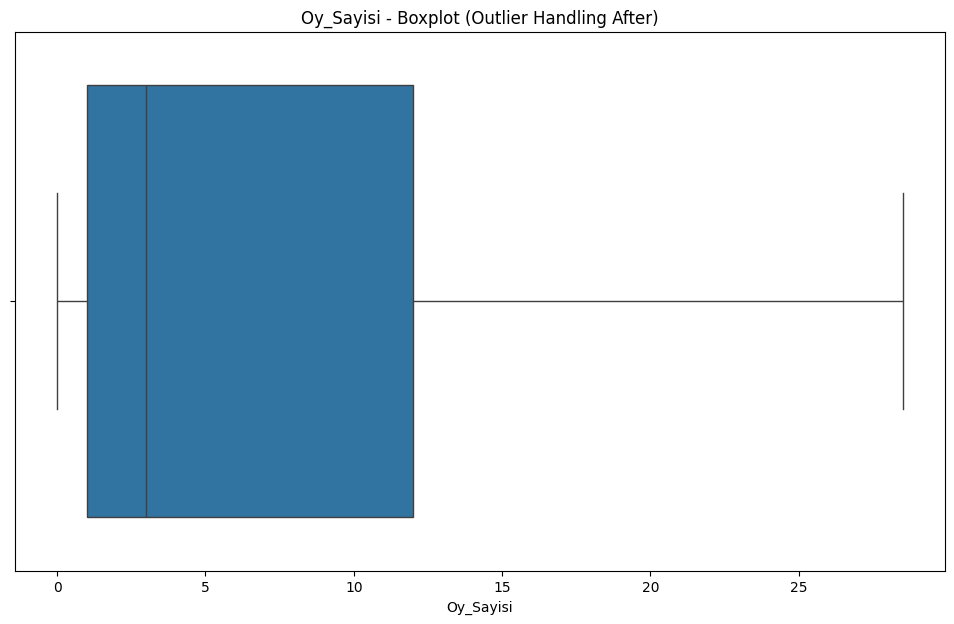


--- İşleniyor: Yayin_Yili ---
  İşlem ÖNCESİ görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2-noyayinevinokategorinokagitcinsi\Yayin_Yili_before_histogram.png


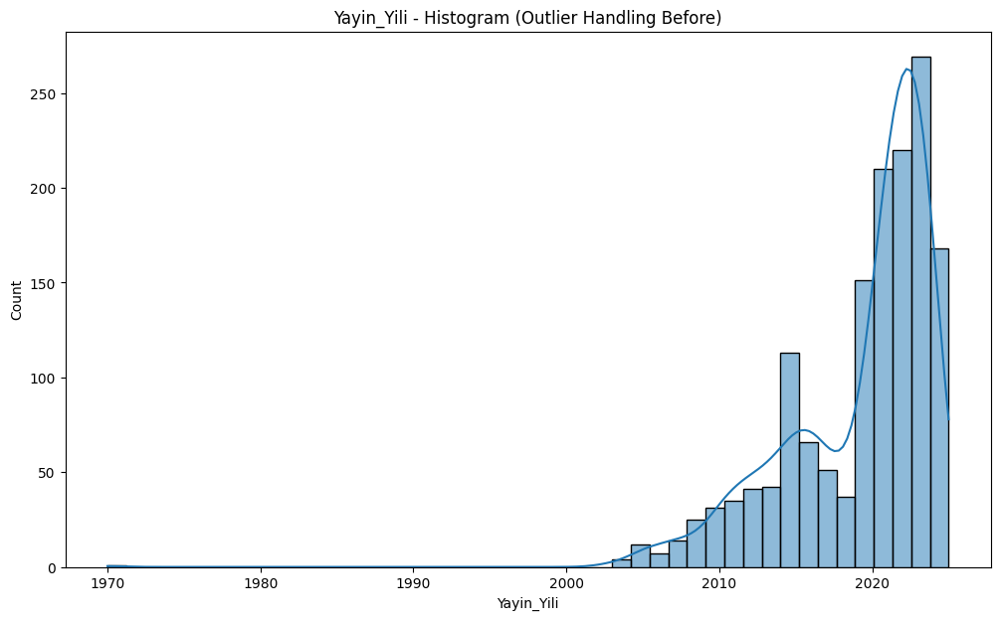

  ✓ Kaydedildi: visualization_v2-noyayinevinokategorinokagitcinsi\Yayin_Yili_before_boxplot.png


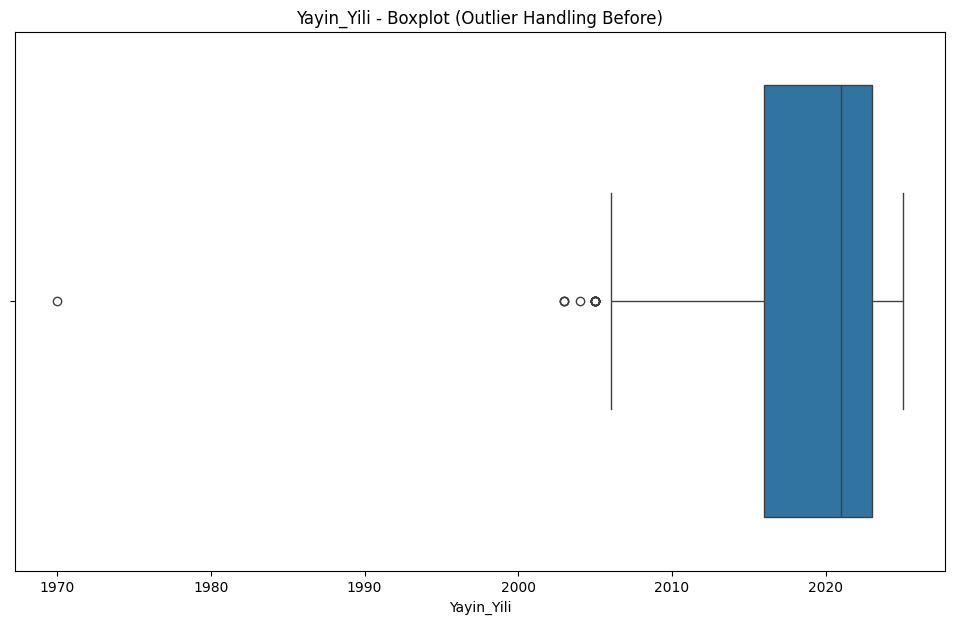

  Yayin_Yili -> Q1: 2016.00, Q3: 2023.00, IQR: 7.00
  Geçerli Sınırlar -> Alt: 2005.50, Üst: 2033.50
  Tespit edilen aykırı değer sayısı: 17
  İşlem SONRASI (Capping uygulanmış) görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2-noyayinevinokategorinokagitcinsi\Yayin_Yili_after_histogram.png


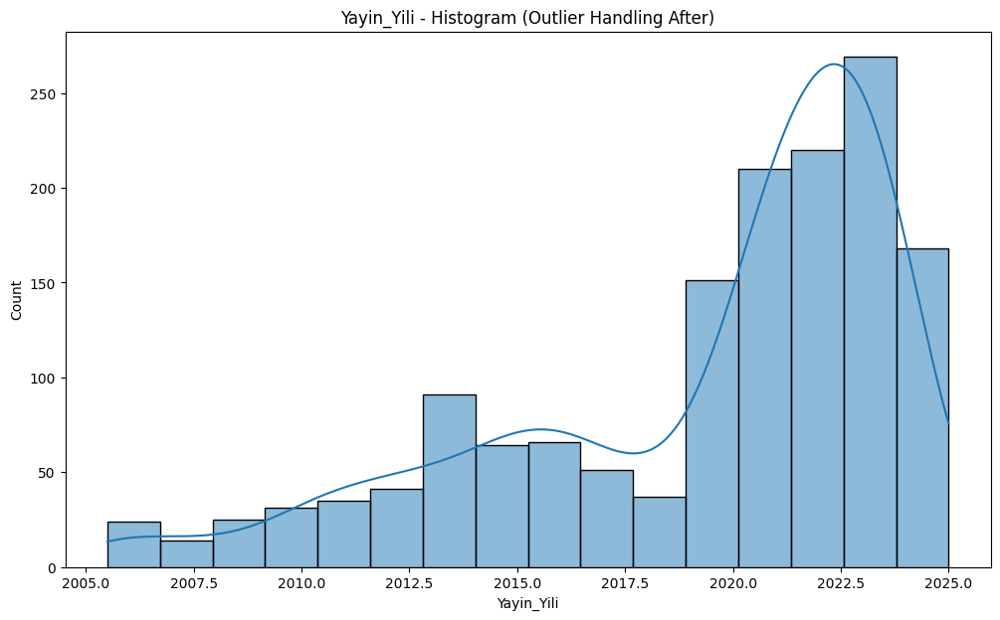

  ✓ Kaydedildi: visualization_v2-noyayinevinokategorinokagitcinsi\Yayin_Yili_after_boxplot.png


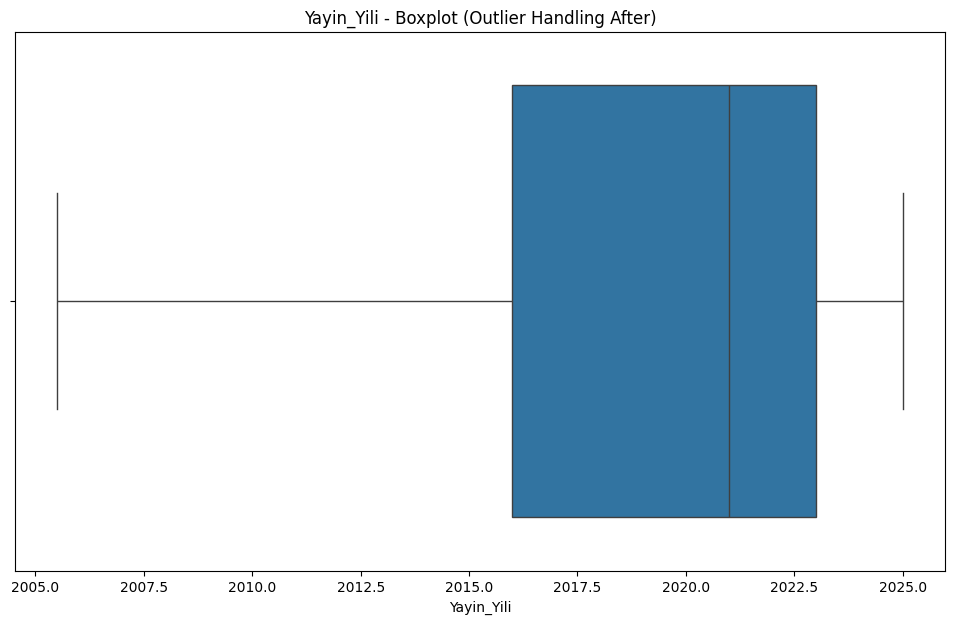


--- İşleniyor: En ---
  İşlem ÖNCESİ görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2-noyayinevinokategorinokagitcinsi\En_before_histogram.png


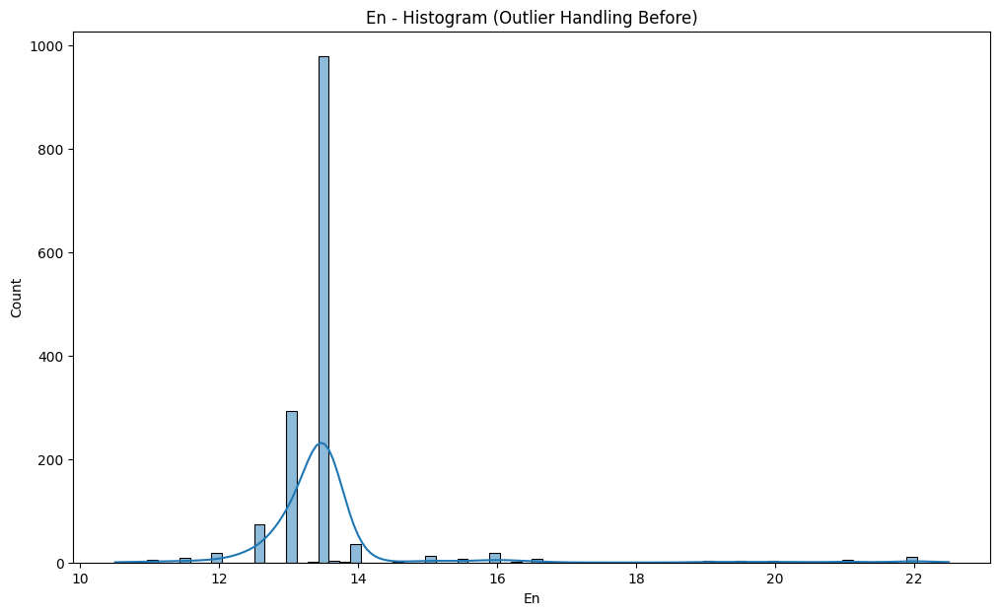

  ✓ Kaydedildi: visualization_v2-noyayinevinokategorinokagitcinsi\En_before_boxplot.png


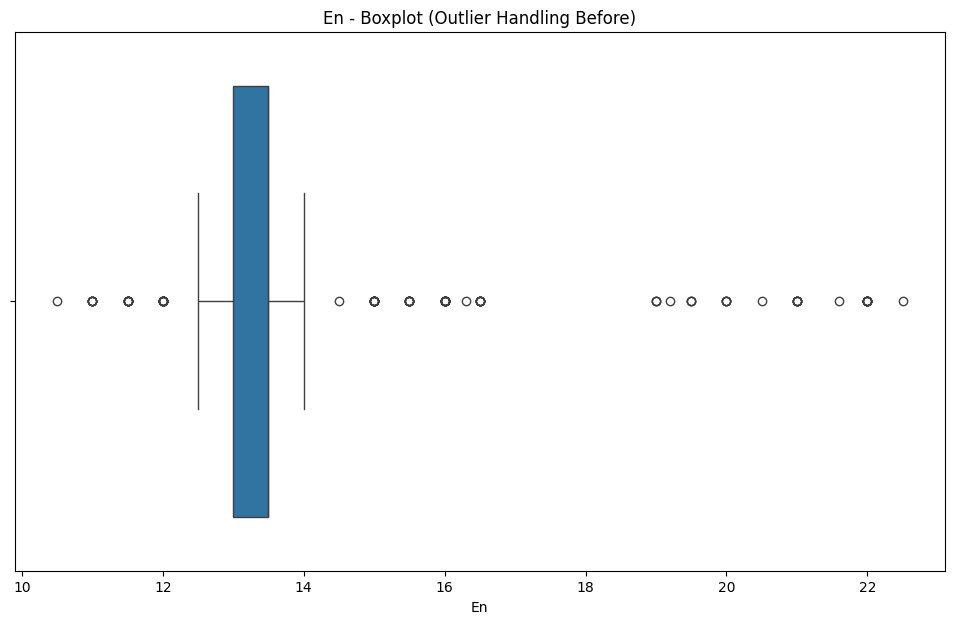

  En -> Q1: 13.00, Q3: 13.50, IQR: 0.50
  Geçerli Sınırlar -> Alt: 12.25, Üst: 14.25
  Tespit edilen aykırı değer sayısı: 111
  İşlem SONRASI (Capping uygulanmış) görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2-noyayinevinokategorinokagitcinsi\En_after_histogram.png


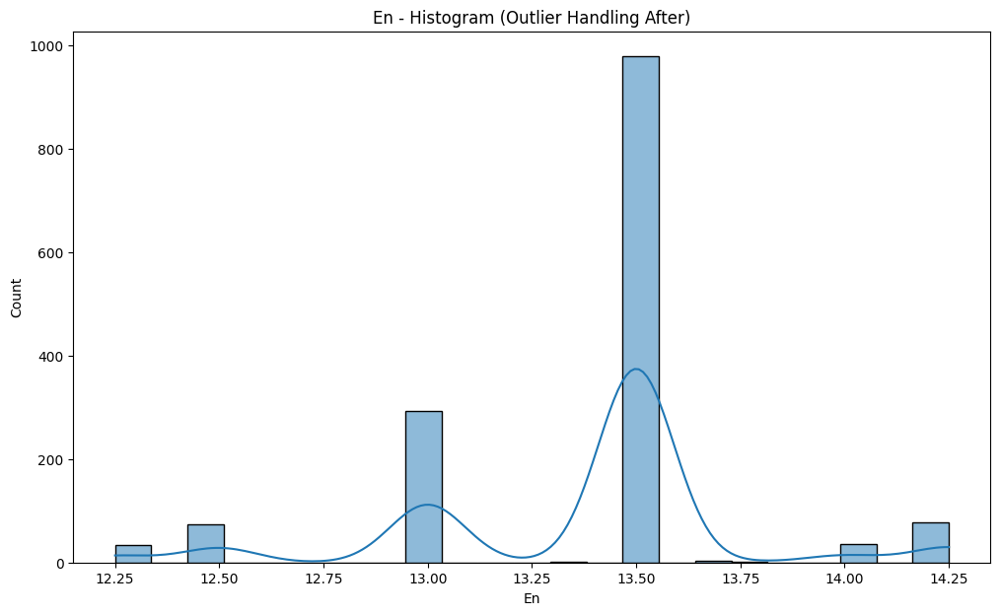

  ✓ Kaydedildi: visualization_v2-noyayinevinokategorinokagitcinsi\En_after_boxplot.png


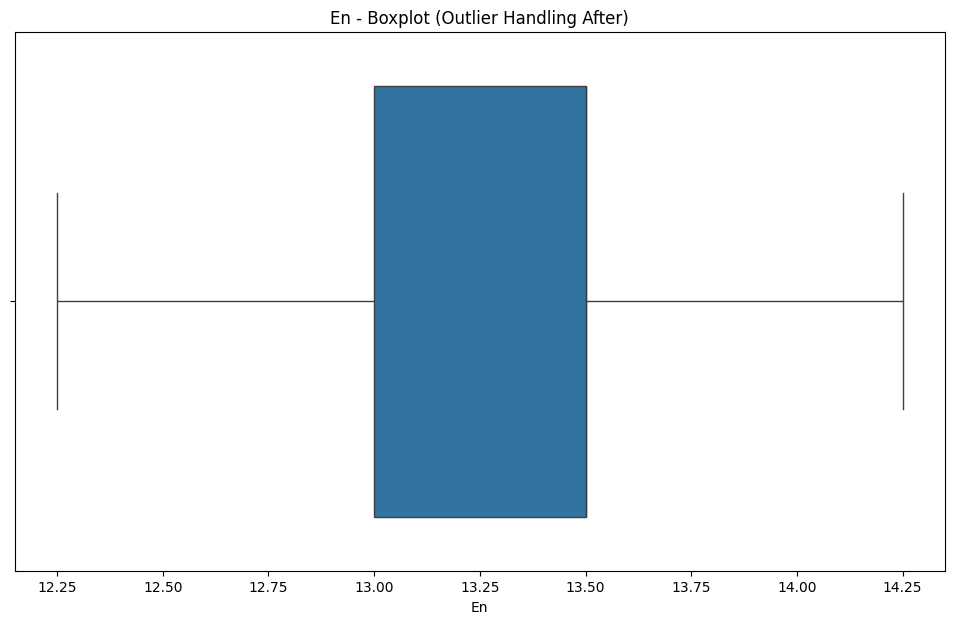


--- İşleniyor: Boy ---
  İşlem ÖNCESİ görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2-noyayinevinokategorinokagitcinsi\Boy_before_histogram.png


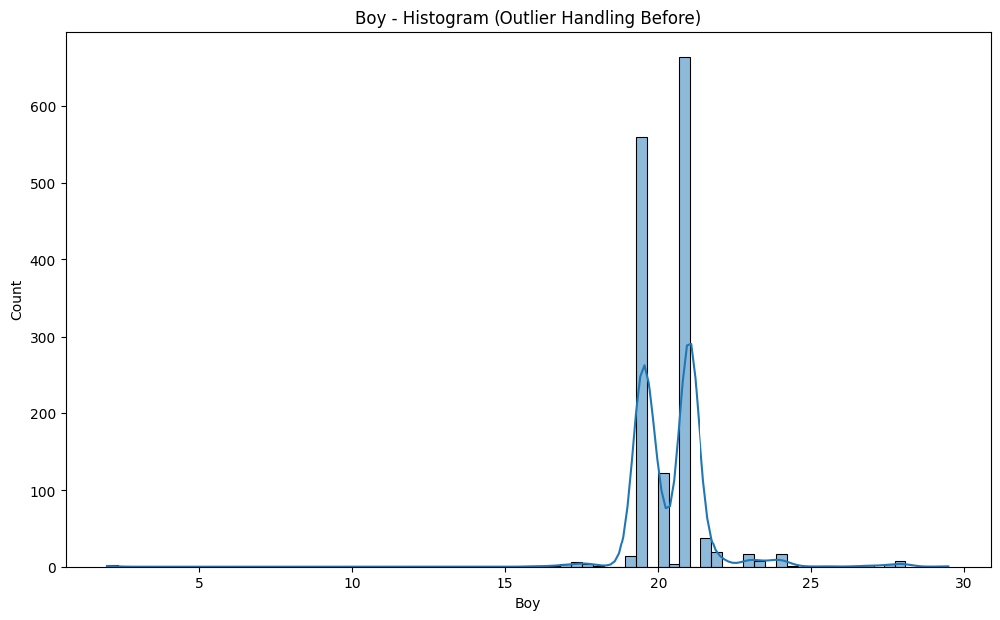

  ✓ Kaydedildi: visualization_v2-noyayinevinokategorinokagitcinsi\Boy_before_boxplot.png


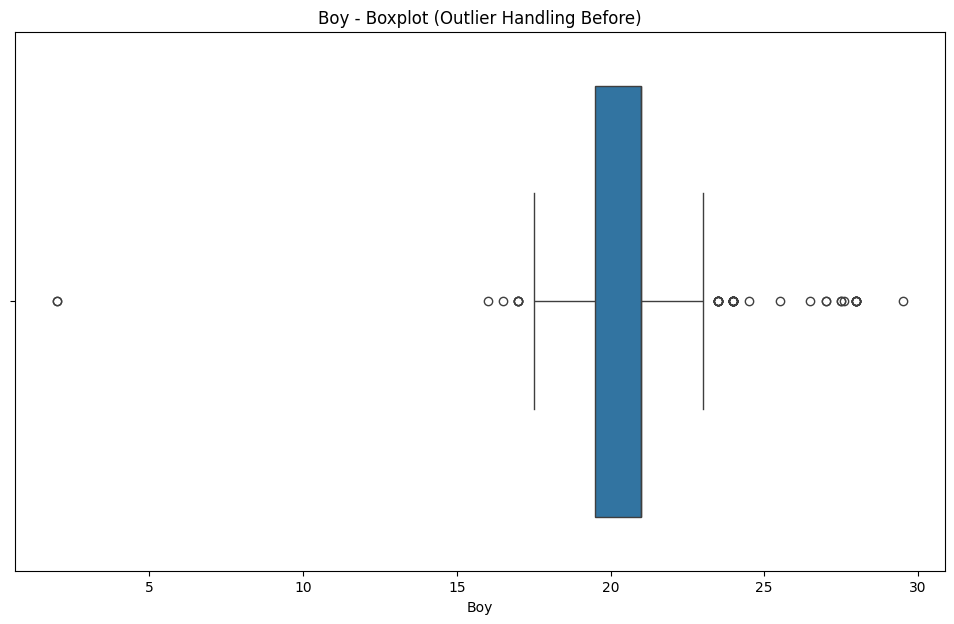

  Boy -> Q1: 19.50, Q3: 21.00, IQR: 1.50
  Geçerli Sınırlar -> Alt: 17.25, Üst: 23.25
  Tespit edilen aykırı değer sayısı: 49
  İşlem SONRASI (Capping uygulanmış) görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2-noyayinevinokategorinokagitcinsi\Boy_after_histogram.png


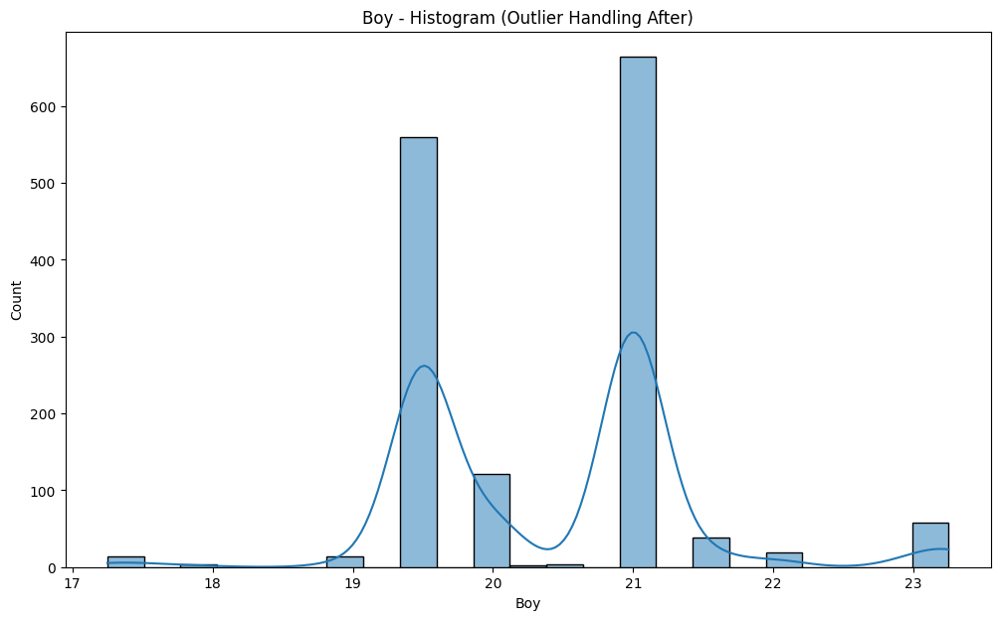

  ✓ Kaydedildi: visualization_v2-noyayinevinokategorinokagitcinsi\Boy_after_boxplot.png


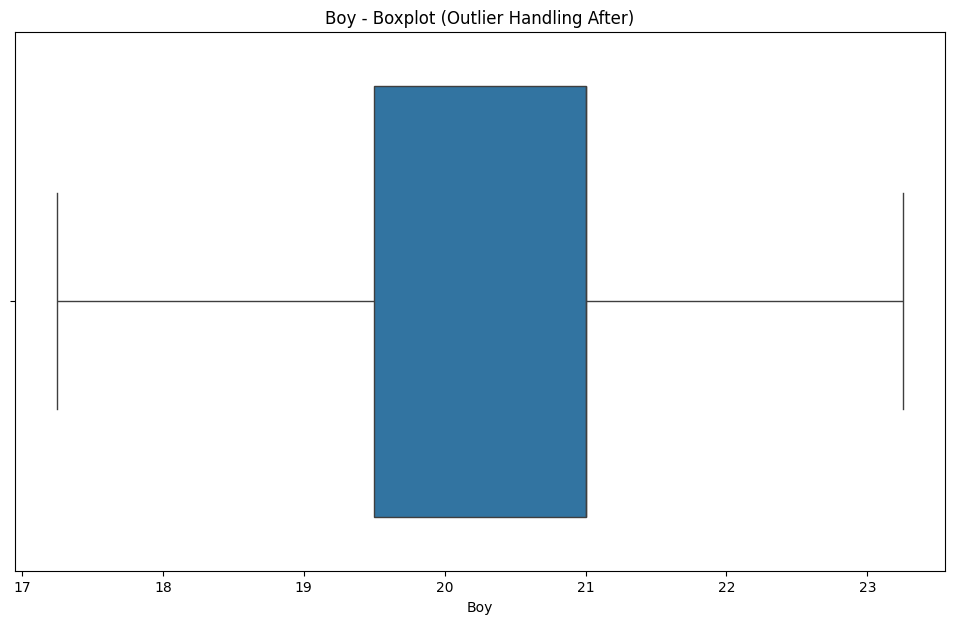


--- İşleniyor: Yazar_Kitap_Sayisi ---
  İşlem ÖNCESİ görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2-noyayinevinokategorinokagitcinsi\Yazar_Kitap_Sayisi_before_histogram.png


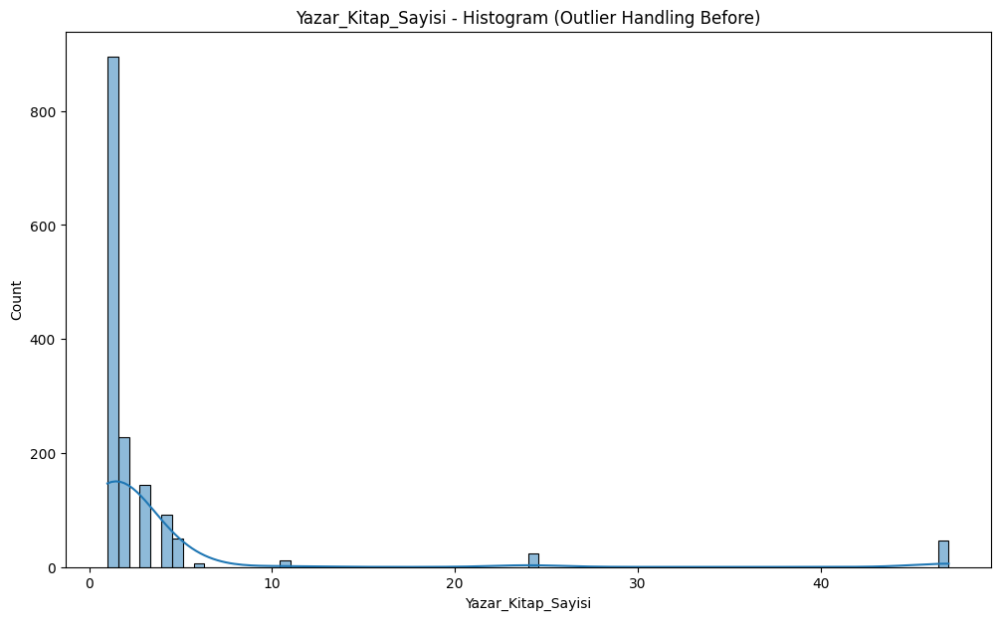

  ✓ Kaydedildi: visualization_v2-noyayinevinokategorinokagitcinsi\Yazar_Kitap_Sayisi_before_boxplot.png


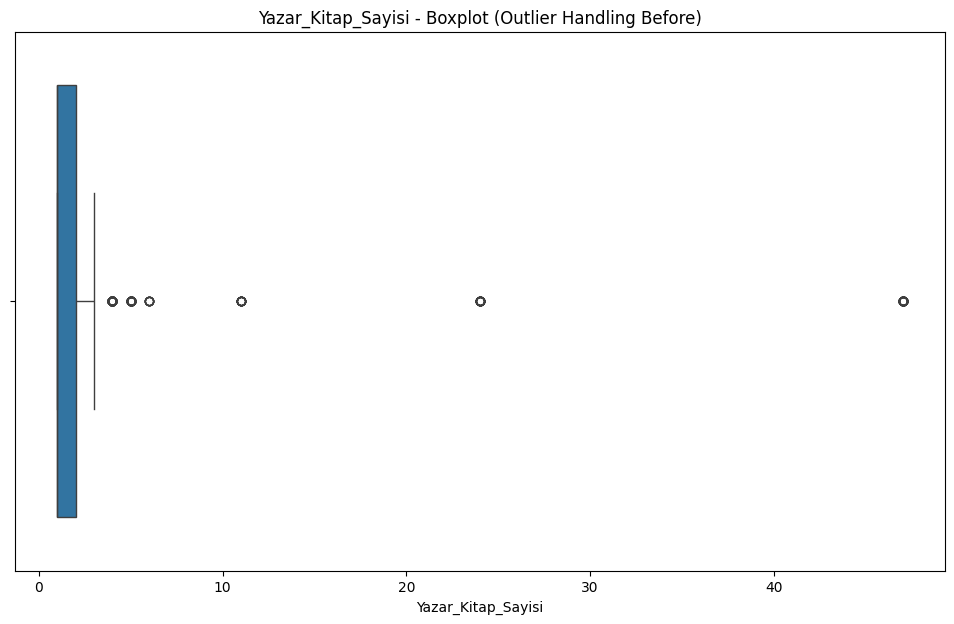

  Yazar_Kitap_Sayisi -> Q1: 1.00, Q3: 2.00, IQR: 1.00
  Geçerli Sınırlar -> Alt: -0.50, Üst: 3.50
  Tespit edilen aykırı değer sayısı: 230
  İşlem SONRASI (Capping uygulanmış) görseller oluşturuluyor...
  ✓ Kaydedildi: visualization_v2-noyayinevinokategorinokagitcinsi\Yazar_Kitap_Sayisi_after_histogram.png


C:\Users\metehan\AppData\Local\Temp\ipykernel_8724\2852181094.py:168: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.5' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_cleaned.loc[df_cleaned[col_name] < lower_bound, col_name] = lower_bound


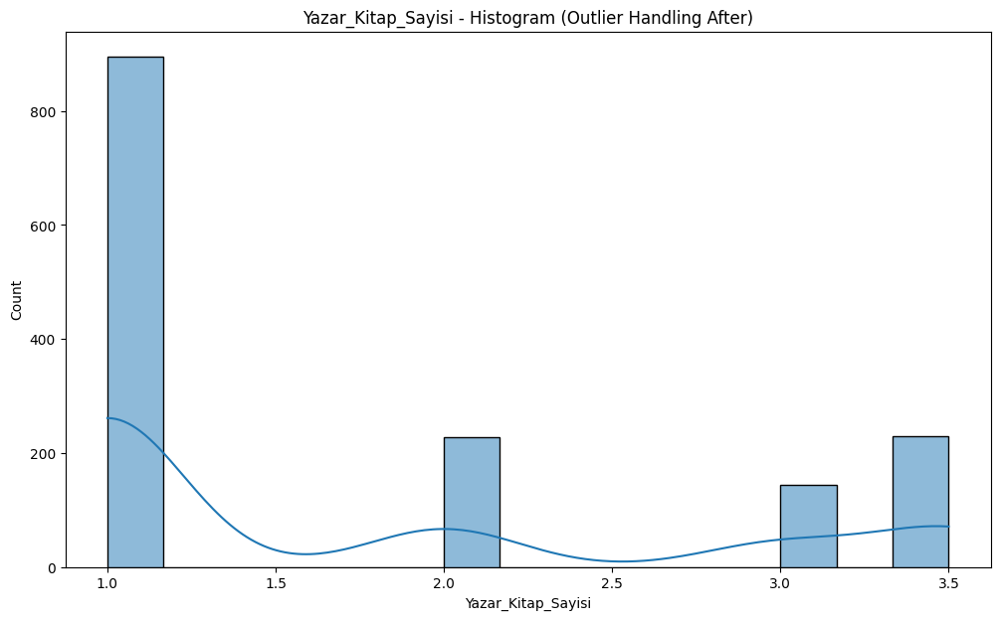

  ✓ Kaydedildi: visualization_v2-noyayinevinokategorinokagitcinsi\Yazar_Kitap_Sayisi_after_boxplot.png


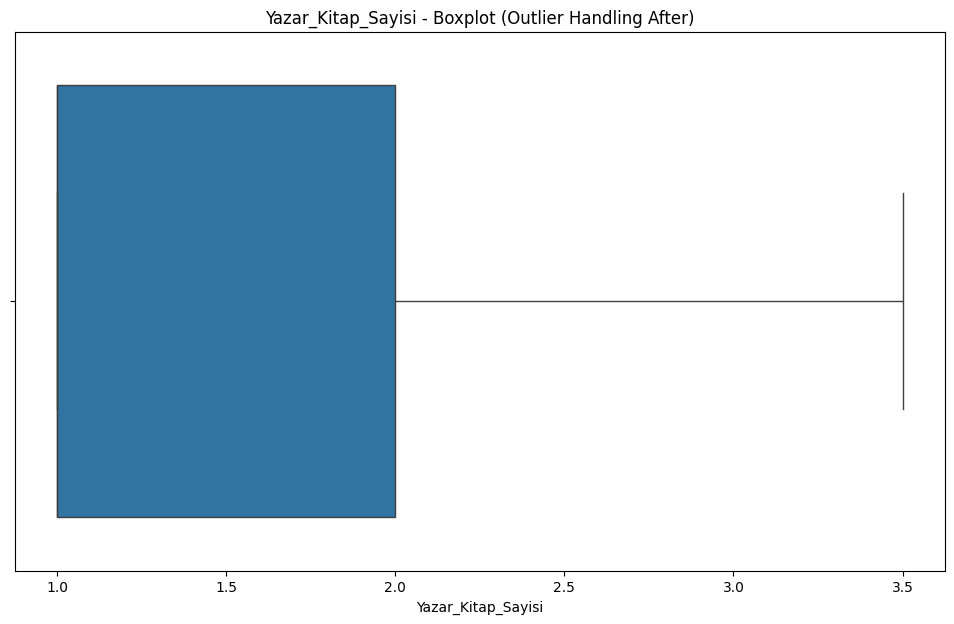


--- Analiz Raporu ---
Orijinal veri 1497 satırdı.
Toplamda 1810 adet aykırı değer (hücre) tespit edildi ve sınır değerler ile baskılandı (capped).

Aykırı değerleri 'Capping' (baskılanmış) veri seti başarıyla kaydedildi:
  -> datasetVersions\kitapyurdu_dataset_v3-noyayinevinokategorinokagitcinsi.csv

--- İşlem Tamamlandı ---


In [6]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os
import sys

# Görselleştirme dosyalarının kaydedileceği klasör adı
VIZ_DIR = "visualization_v2-noyayinevinokategorinokagitcinsi"

# Temizlenmiş verinin kaydedileceği klasör ve dosya adı
CLEANED_DATA_DIR = "datasetVersions"
CLEANED_FILENAME = "kitapyurdu_dataset_v3-noyayinevinokategorinokagitcinsi.csv"  


def save_plot(data_series, col_name, stage, plot_type, output_dir):
    """
    Verilen pandas Serisi için bir histogram veya kutu grafiği oluşturur,
    Jupyter'da gösterir ve belirtilen klasöre kaydeder.
    
    Args:
        data_series (pd.Series): Görselleştirilecek veri.
        col_name (str): Kolon adı (dosya adlandırması için).
        stage (str): 'before' (önce) veya 'after' (sonra).
        plot_type (str): 'histogram' veya 'boxplot'.
        output_dir (str): Görsellerin kaydedileceği klasör.
    """
    plt.figure(figsize=(12, 7))
    
    # Dosya adı ve başlık için formatlama
    title = f"{col_name} - {plot_type.title()} (Outlier Handling {stage.title()})"
    filename = f"{col_name}_{stage}_{plot_type}.png"
    save_path = os.path.join(output_dir, filename)
    
    try:
        if plot_type == 'histogram':
            sns.histplot(data_series, kde=True)
            plt.title(title)
        elif plot_type == 'boxplot':
            sns.boxplot(x=data_series)
            plt.title(title)
        
        # 1. Kaydet
        plt.savefig(save_path)
        print(f"  ✓ Kaydedildi: {save_path}")
        
        # 2. <<! YENİ EKLENDİ !>> Jupyter'da göster
        plt.show() 
        
        # 3. Hafızadan temizle
        plt.close() 
        
    except Exception as e:
        print(f"  ✗ HATA: {col_name} için '{plot_type}' çizilirken hata: {e}", file=sys.stderr)


def process_continuous_data_outliers(file_path):
    """
    Ana fonksiyon: CSV'yi yükler, sürekli (continuous) sayısal kolonları
    filtreler, IQR yöntemiyle aykırı değerleri 'capping' (baskılama)
    yöntemiyle yönetir, işlem öncesi/sonrası görselleri kaydeder/gösterir
    ve temiz veriyi CSV'ye basar.
    
    Args:
        file_path (str): Analiz edilecek CSV dosyasının yolu.
    """
    
    # --- 1. Adım: Çıktı Klasörlerini Oluşturma ---
    try:
        os.makedirs(VIZ_DIR, exist_ok=True)
        print(f"Görseller '{VIZ_DIR}' klasörüne kaydedilecek.")
        
        os.makedirs(CLEANED_DATA_DIR, exist_ok=True)
        print(f"Temizlenmiş veri '{CLEANED_DATA_DIR}' klasörüne kaydedilecek.")
            
    except OSError as e:
        print(f"HATA: Çıktı klasörleri oluşturulamadı: {e}", file=sys.stderr)
        return

    # --- 2. Adım: Veri Yükleme ---
    try:
        df = pd.read_csv(file_path)
        print(f"\n'{file_path}' dosyası başarıyla yüklendi. Toplam {len(df)} satır.")
    except FileNotFoundError:
        print(f"HATA: Dosya bulunamadı. Lütfen şu yolu kontrol edin: {file_path}", file=sys.stderr)
        return
    except Exception as e:
        print(f"Dosya okunurken bir hata oluştu: {e}", file=sys.stderr)
        return

    # --- 3. Adım: 'Gerçek' Sürekli (Continuous) Sayısal Kolonları Filtreleme ---
    
    all_numeric_cols = df.select_dtypes(include=['float64', 'int64']).columns
    continuous_cols = []
    binary_cols = []

    print("\n--- Kolon Analizi ---")
    if len(all_numeric_cols) == 0:
        print("İşlenecek sayısal kolon bulunamadı.")
        return

    for col in all_numeric_cols:
        is_binary = df[col].dropna().isin([0, 1]).all()
        
        if is_binary:
            binary_cols.append(col)
        else:
            continuous_cols.append(col)

    if len(binary_cols) > 0:
        print(f"Atlanan 'Binary' (0/1) Kolonlar: {', '.join(binary_cols)}")
    
    if len(continuous_cols) == 0:
        print("İşlenecek 'sürekli' (continuous) sayısal kolon bulunamadı.")
        return
        
    print(f"İşlenecek 'Sürekli' Kolonlar: {', '.join(continuous_cols)}")

    # --- 4. Adım: Her Sürekli Kolon İçin Aykırı Değer İşleme ve Görselleştirme ---
    
    # Orijinal DataFrame'i kopyala, aykırı değerleri bu kopya üzerinde
    # "Capping" (baskılama) yöntemiyle güncelleyeceğiz.
    df_cleaned = df.copy()
    
    total_outliers_handled = 0
    
    for col_name in continuous_cols:
        print(f"\n--- İşleniyor: {col_name} ---")
        
        # Sadece NaN olmayan verileri al
        data_before = df[col_name].dropna()
        
        if data_before.empty:
            print(f"  ! Uyarı: {col_name} kolonu boş veya sadece NaN değerler içeriyor. Atlanıyor.")
            continue
            
        # --- 4a: "ÖNCE" Görselleştirme ---
        print("  İşlem ÖNCESİ görseller oluşturuluyor...")
        save_plot(data_before, col_name, "before", "histogram", VIZ_DIR)
        save_plot(data_before, col_name, "before", "boxplot", VIZ_DIR)
        
        # --- 4b: IQR Yöntemi ile Aykırı Değer Sınırlarını Hesaplama ---
        Q1 = data_before.quantile(0.25)
        Q3 = data_before.quantile(0.75)
        IQR_val = Q3 - Q1
        
        lower_bound = Q1 - 1.5 * IQR_val
        upper_bound = Q3 + 1.5 * IQR_val
        
        print(f"  {col_name} -> Q1: {Q1:.2f}, Q3: {Q3:.2f}, IQR: {IQR_val:.2f}")
        print(f"  Geçerli Sınırlar -> Alt: {lower_bound:.2f}, Üst: {upper_bound:.2f}")
        
        # --- 4c: Aykırı Değerleri Tespit Etme ve Capping --- <<! GÜNCELLENDİ !>>
        
        # Sadece raporlama için aykırı değer sayısını bul
        outlier_count = data_before[(data_before < lower_bound) | (data_before > upper_bound)].count()
        
        print(f"  Tespit edilen aykırı değer sayısı: {outlier_count}")
        total_outliers_handled += outlier_count
        
        if outlier_count == 0:
            print("  Aykırı değere rastlanmadı. 'Sonra' grafikleri çizilmeyecek.")
            continue
            
        # CAPPING UYGULAMASI
        # 'df_cleaned' kopyası üzerinde çalışıyoruz
        
        # 1. Alt sınırdan küçük olanları alt sınıra eşitle (baskıla)
        df_cleaned.loc[df_cleaned[col_name] < lower_bound, col_name] = lower_bound
        
        # 2. Üst sınırdan büyük olanları üst sınıra eşitle (baskıla)
        df_cleaned.loc[df_cleaned[col_name] > upper_bound, col_name] = upper_bound

        # 'Sonra' verisi, artık Capping uygulanmış veridir
        data_after = df_cleaned[col_name].dropna()

        # --- 4d: "SONRA" Görselleştirme ---
        print("  İşlem SONRASI (Capping uygulanmış) görseller oluşturuluyor...")
        save_plot(data_after, col_name, "after", "histogram", VIZ_DIR)
        save_plot(data_after, col_name, "after", "boxplot", VIZ_DIR)

    print("\n--- Analiz Raporu ---")
    print(f"Orijinal veri {len(df)} satırdı.")
    # <<! GÜNCELLENDİ !>> (Rapor metni)
    print(f"Toplamda {total_outliers_handled} adet aykırı değer (hücre) tespit edildi ve sınır değerler ile baskılandı (capped).")

    # --- 5. Adım: Temizlenmiş (Capped) Veriyi Kaydetme ---
    try:
        output_csv_path = os.path.join(CLEANED_DATA_DIR, CLEANED_FILENAME)
        
        df_cleaned.to_csv(output_csv_path, index=False)
        
        print(f"\nAykırı değerleri 'Capping' (baskılanmış) veri seti başarıyla kaydedildi:")
        print(f"  -> {output_csv_path}")
        
    except Exception as e:
        print(f"\nHATA: Temizlenmiş veri CSV'ye kaydedilirken bir hata oluştu: {e}", file=sys.stderr)


    print("\n--- İşlem Tamamlandı ---")


# --- BU BETİĞİ ÇALIŞTIRMAK İÇİN ---
if __name__ == "__main__":
    # <<!>> LÜTFEN ANALİZ ETMEK İSTEDİĞİNİZ DOSYANIN YOLUNU BURAYA GİRİN
    # Bu kod bir .py dosyası olarak çalıştırılırsa bu blok çalışır.
    # Jupyter'da çalıştırıyorsanız, bu bloğun dışına çıkıp
    # bir sonraki hücrede manuel olarak çağırabilirsiniz:
    
    # csv_dosya_yolu = "verileriniz.csv"
    # process_continuous_data_outliers(csv_dosya_yolu)
    
    # Örnek olarak doğrudan burada tanımlayalım:
    csv_dosya_yolu = "datasetVersions/kitapyurdu_dataset_v2-noyayinevinokategorinokagitcinsi.csv" 
    
    # Ana analiz fonksiyonunu çağır
    process_continuous_data_outliers(csv_dosya_yolu)

---
### Üçüncü olarak kolonların birbirleriyle ilişkisini anlamak için **Korelasyon Analizi (Heatmap ve Matris)** ve **Saçılığım Grafiği (Scatter Plot)** incelemesi yaparak veriyi daha çok görselleştireceğiz.

**Sırayla tüm veri setlerine uygulayalım.**

### 1) kitapyurdu_dataset_v3

'datasetVersions/kitapyurdu_dataset_v3.csv' dosyası başarıyla yüklendi.
Görseller 'visualization_v2' klasörüne kaydedilecek.

--- 1. Korelasyon Analizi (Tüm Sayısal Kolonlar) ---
Korelasyon Matrisi (Sayısal Değerler):

                                           Favorilere Ekleyen Kişi Sayısı  \
Favorilere Ekleyen Kişi Sayısı                                   1.000000   
Okuyacağım olarak işaretlenmiş sayısı                            0.762784   
Okudum olarak işaretlenmiş sayısı                                0.724857   
Liste Fiyatı                                                     0.140539   
Sayfa Sayısı                                                     0.272076   
Toplam Satılma Sayısı                                            0.647441   
Toplam Yorum Sayısı                                              0.688079   
Puan                                                             0.206597   
Oy_Sayisi                                                        0.731224   
Yayin_Yili 

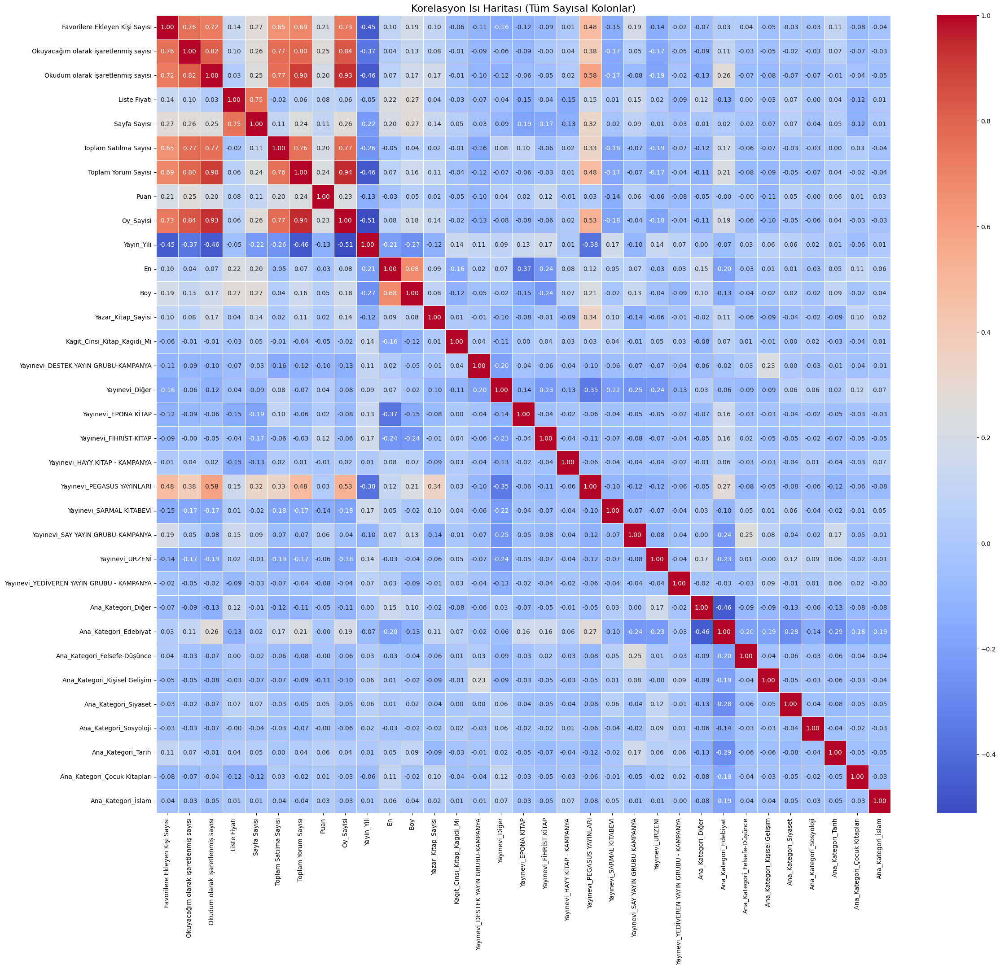


--- 2. Scatter Plot Matrix (Sadece Sürekli Kolonlar) ---
Pair Plot için kullanılacak 'sürekli' kolonlar: Favorilere Ekleyen Kişi Sayısı, Okuyacağım olarak işaretlenmiş sayısı, Okudum olarak işaretlenmiş sayısı, Liste Fiyatı, Sayfa Sayısı, Toplam Satılma Sayısı, Toplam Yorum Sayısı, Puan, Oy_Sayisi, Yayin_Yili, En, Boy, Yazar_Kitap_Sayisi

Uyarı: Çok fazla sürekli kolon (8+) tespit edildi.
Pair plot'un oluşturulması uzun sürebilir ve çıktı çok büyük olabilir...
✓ Pair Plot kaydedildi: visualization_v2\pair_plot.png


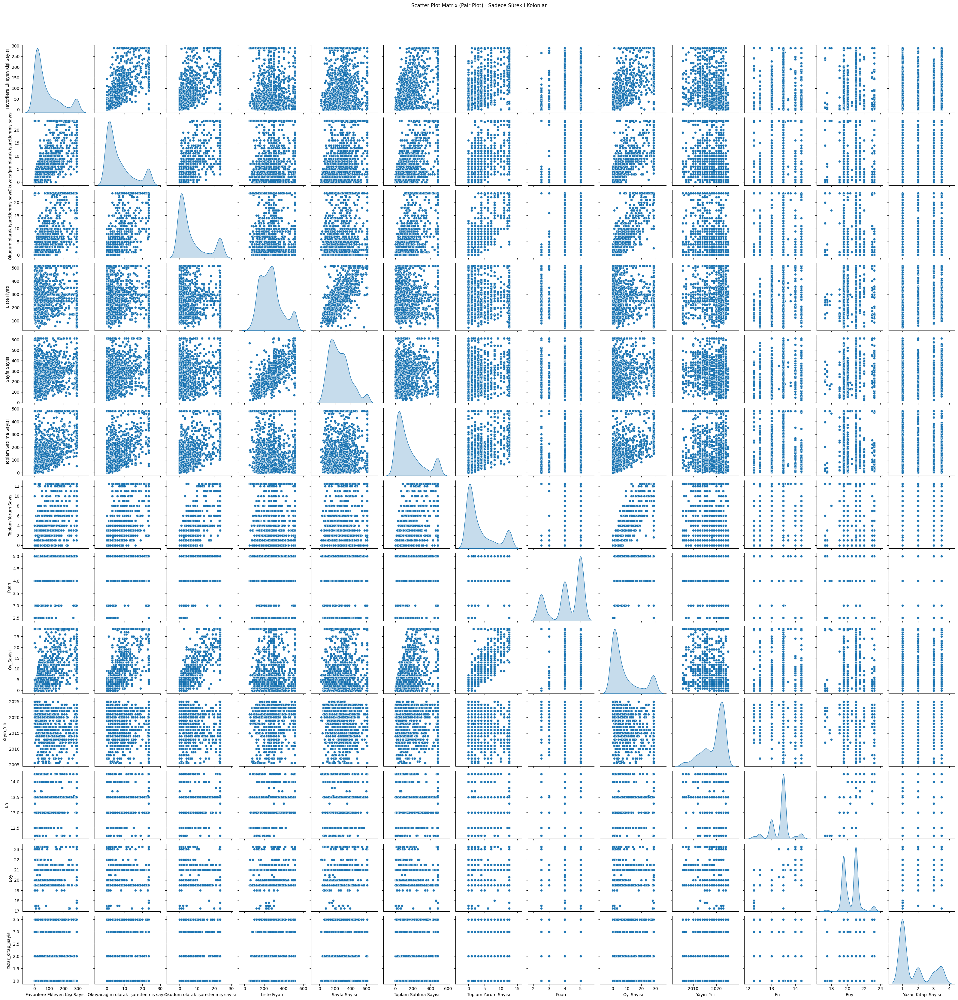


--- Korelasyon Analizi Tamamlandı ---


In [9]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os
import sys

def run_correlation_analysis(csv_file_path, output_viz_dir):
    """
    Belirtilen CSV dosyasını yükler, korelasyon analizleri
    (matris, heatmap) ve bir pair plot (scatter plot matrix)
    oluşturur. Görselleri hem Jupyter'da gösterir hem de
    belirtilen klasöre kaydeder.
    
    Args:
        csv_file_path (str): Analiz edilecek CSV dosyası (temizlenmiş/capped veri).
        output_viz_dir (str): Görsellerin kaydedileceği klasör.
    """
    
    # --- 1. Adım: Veri Yükleme ve Çıktı Klasörü ---
    try:
        # Önceki adımda oluşturduğumuz 'capped' veriyi yüklüyoruz
        df = pd.read_csv(csv_file_path)
        print(f"'{csv_file_path}' dosyası başarıyla yüklendi.")
    except FileNotFoundError:
        print(f"HATA: Dosya bulunamadı. Lütfen şu yolu kontrol edin: {csv_file_path}", file=sys.stderr)
        return
    except Exception as e:
        print(f"Dosya okunurken bir hata oluştu: {e}", file=sys.stderr)
        return

    # Görselleştirme klasörünü oluştur
    os.makedirs(output_viz_dir, exist_ok=True)
    print(f"Görseller '{output_viz_dir}' klasörüne kaydedilecek.\n")

    
    # --- 2. Adım: Korelasyon Matrisi ve Isı Haritası (Heatmap) ---
    # Bu analiz, 0/1 kolonları da dahil olmak üzere TÜM SAYISAL kolonlar için yapılır.
    print("--- 1. Korelasyon Analizi (Tüm Sayısal Kolonlar) ---")
    
    try:
        # .corr() metodu zaten sadece sayısal kolonları seçecektir
        corr_matrix = df.corr(numeric_only=True)
        
        # 2a. Korelasyon Matrisini (sayısal olarak) yazdır
        print("Korelasyon Matrisi (Sayısal Değerler):\n")
        print(corr_matrix)
        print("\n")

        # 2b. Isı Haritasını (Heatmap) çizdir
        # Kolon sayısına göre figür boyutunu ayarla
        num_cols = len(corr_matrix.columns)
        plt.figure(figsize=(max(12, num_cols * 0.8), max(10, num_cols * 0.7)))
        
        sns.heatmap(
            corr_matrix, 
            annot=True,      # Değerleri üzerine yaz
            cmap='coolwarm', # Renk paleti
            fmt='.2f',       # Ondalık formatı (2 basamak)
            linewidths=.5    # Hücreler arası çizgi kalınlığı
        )
        
        plt.title('Korelasyon Isı Haritası (Tüm Sayısal Kolonlar)', fontsize=16)
        
        # Dosyayı kaydet
        heatmap_path = os.path.join(output_viz_dir, 'correlation_heatmap.png')
        # bbox_inches='tight' etiketlerin kesilmesini engeller
        plt.savefig(heatmap_path, bbox_inches='tight')
        print(f"✓ Heatmap kaydedildi: {heatmap_path}")
        
        # Jupyter'da göster
        plt.show()
        plt.close()

    except Exception as e:
        print(f"HATA: Korelasyon heatmap oluşturulurken bir hata oluştu: {e}", file=sys.stderr)


    # --- 3. Adım: Scatter Plot Matrix (Pair Plot) ---
    # Bu analiz, sadece 'SÜREKLİ' (continuous) kolonlar için yapılır.
    # 0/1 (binary) kolonları bir scatter plot matrisinde görmek anlamsızdır.
    print("\n--- 2. Scatter Plot Matrix (Sadece Sürekli Kolonlar) ---")
    
    try:
        # Önceki betikteki filtreleme mantığını tekrar uygulayalım
        all_numeric_cols = df.select_dtypes(include=['float64', 'int64']).columns
        continuous_cols = []
        for col in all_numeric_cols:
            # Kolondaki (NaN olmayan) tüm değerler 0 veya 1 ise, bu kolonu atla
            is_binary = df[col].dropna().isin([0, 1]).all()
            if not is_binary:
                continuous_cols.append(col)
        
        if len(continuous_cols) < 2:
            print(f"Uyarı: Pair Plot çizdirmek için en az 2 adet 'sürekli' sayısal kolon bulunamadı. Atlanıyor.")
            return

        print(f"Pair Plot için kullanılacak 'sürekli' kolonlar: {', '.join(continuous_cols)}")
        
        if len(continuous_cols) > 8:
            print("\nUyarı: Çok fazla sürekli kolon (8+) tespit edildi.")
            print("Pair plot'un oluşturulması uzun sürebilir ve çıktı çok büyük olabilir...")

        # Sadece sürekli kolonları içeren alt bir DataFrame oluştur
        df_continuous = df[continuous_cols]
        
        # Pair Plot'u oluştur
        # 'kind="reg"' eklerseniz, scatter plot'lara regresyon çizgisi de çizer
        g = sns.pairplot(df_continuous, diag_kind='kde') 
        
        g.fig.suptitle('Scatter Plot Matrix (Pair Plot) - Sadece Sürekli Kolonlar', y=1.03) # Başlık
        
        # Dosyayı kaydet
        pairplot_path = os.path.join(output_viz_dir, 'pair_plot.png')
        g.savefig(pairplot_path)
        print(f"✓ Pair Plot kaydedildi: {pairplot_path}")
        
        # Jupyter'da göster (plt.show() pairplot'ta gereklidir)
        plt.show()
        plt.close()

    except Exception as e:
        print(f"HATA: Pair plot oluşturulurken bir hata oluştu: {e}", file=sys.stderr)
        
    print("\n--- Korelasyon Analizi Tamamlandı ---")

# --- BU BETİĞİ JUPYTER'DA ÇALIŞTIRMAK İÇİN ---

# 1. Önceki adımdan gelen, 'capped' (baskılanmış) verinin yolu
# Bu dosyanın var olduğundan emin olun
INPUT_CSV_PATH = "datasetVersions/kitapyurdu_dataset_v3.csv"

# 2. Görselleri kaydetmek istediğiniz klasör
# Bu klasör yoksa, kod tarafından oluşturulacaktır.
OUTPUT_VISUALIZATION_DIR = "visualization_v2"

# 3. Analiz fonksiyonunu çağır
run_correlation_analysis(INPUT_CSV_PATH, OUTPUT_VISUALIZATION_DIR)

### 2) kitapyurdu_dataset_v3-nokagitcinsi.csv

'datasetVersions/kitapyurdu_dataset_v3-nokagitcinsi.csv' dosyası başarıyla yüklendi.
Görseller 'visualization_v2-nokagitcinsi' klasörüne kaydedilecek.

--- 1. Korelasyon Analizi (Tüm Sayısal Kolonlar) ---
Korelasyon Matrisi (Sayısal Değerler):

                                           Favorilere Ekleyen Kişi Sayısı  \
Favorilere Ekleyen Kişi Sayısı                                   1.000000   
Okuyacağım olarak işaretlenmiş sayısı                            0.762784   
Okudum olarak işaretlenmiş sayısı                                0.724857   
Liste Fiyatı                                                     0.140539   
Sayfa Sayısı                                                     0.272076   
Toplam Satılma Sayısı                                            0.647441   
Toplam Yorum Sayısı                                              0.688079   
Puan                                                             0.206597   
Oy_Sayisi                                                     

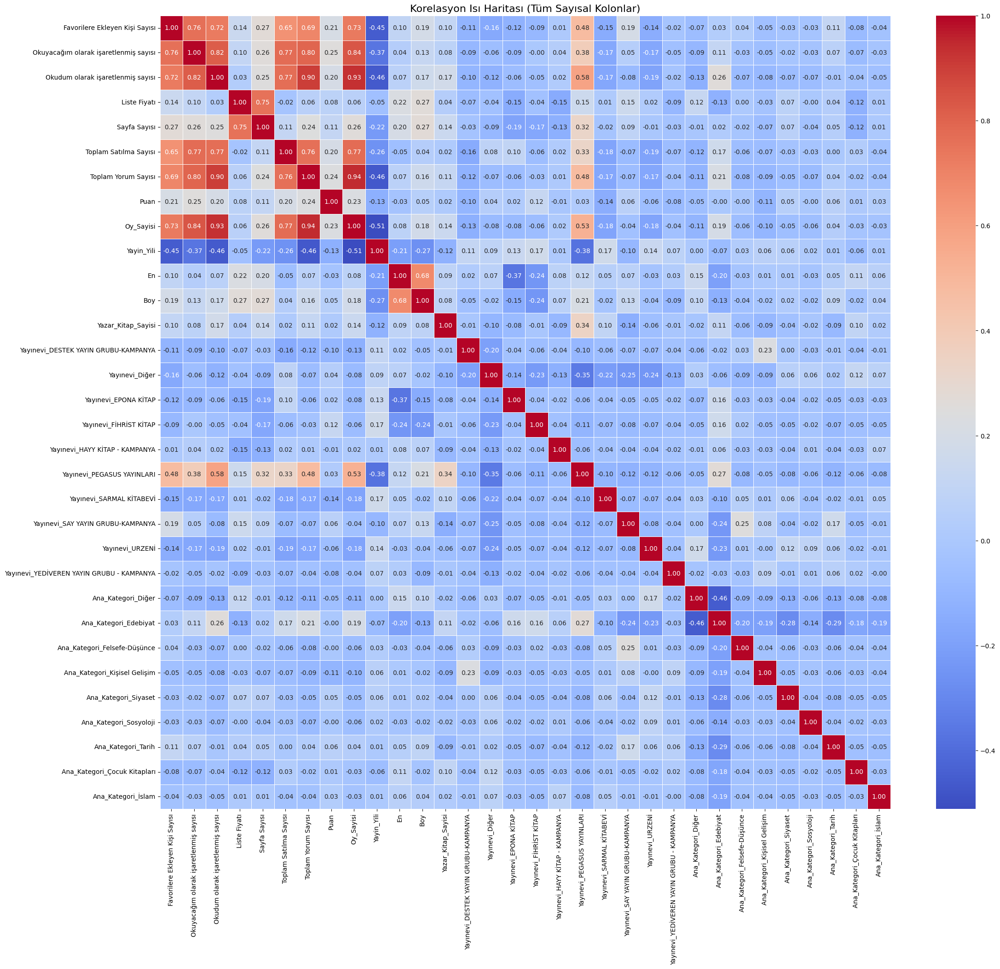


--- 2. Scatter Plot Matrix (Sadece Sürekli Kolonlar) ---
Pair Plot için kullanılacak 'sürekli' kolonlar: Favorilere Ekleyen Kişi Sayısı, Okuyacağım olarak işaretlenmiş sayısı, Okudum olarak işaretlenmiş sayısı, Liste Fiyatı, Sayfa Sayısı, Toplam Satılma Sayısı, Toplam Yorum Sayısı, Puan, Oy_Sayisi, Yayin_Yili, En, Boy, Yazar_Kitap_Sayisi

Uyarı: Çok fazla sürekli kolon (8+) tespit edildi.
Pair plot'un oluşturulması uzun sürebilir ve çıktı çok büyük olabilir...
✓ Pair Plot kaydedildi: visualization_v2-nokagitcinsi\pair_plot.png


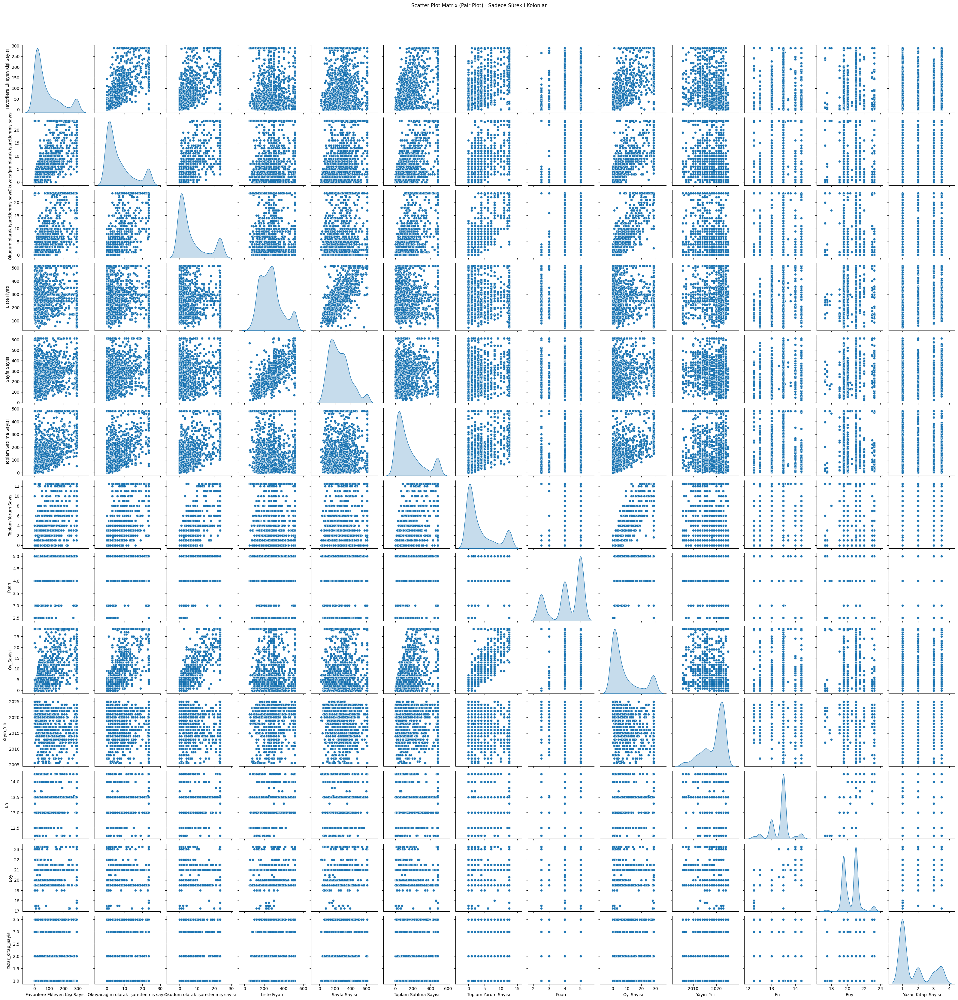


--- Korelasyon Analizi Tamamlandı ---


In [10]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os
import sys

def run_correlation_analysis(csv_file_path, output_viz_dir):
    """
    Belirtilen CSV dosyasını yükler, korelasyon analizleri
    (matris, heatmap) ve bir pair plot (scatter plot matrix)
    oluşturur. Görselleri hem Jupyter'da gösterir hem de
    belirtilen klasöre kaydeder.
    
    Args:
        csv_file_path (str): Analiz edilecek CSV dosyası (temizlenmiş/capped veri).
        output_viz_dir (str): Görsellerin kaydedileceği klasör.
    """
    
    # --- 1. Adım: Veri Yükleme ve Çıktı Klasörü ---
    try:
        # Önceki adımda oluşturduğumuz 'capped' veriyi yüklüyoruz
        df = pd.read_csv(csv_file_path)
        print(f"'{csv_file_path}' dosyası başarıyla yüklendi.")
    except FileNotFoundError:
        print(f"HATA: Dosya bulunamadı. Lütfen şu yolu kontrol edin: {csv_file_path}", file=sys.stderr)
        return
    except Exception as e:
        print(f"Dosya okunurken bir hata oluştu: {e}", file=sys.stderr)
        return

    # Görselleştirme klasörünü oluştur
    os.makedirs(output_viz_dir, exist_ok=True)
    print(f"Görseller '{output_viz_dir}' klasörüne kaydedilecek.\n")

    
    # --- 2. Adım: Korelasyon Matrisi ve Isı Haritası (Heatmap) ---
    # Bu analiz, 0/1 kolonları da dahil olmak üzere TÜM SAYISAL kolonlar için yapılır.
    print("--- 1. Korelasyon Analizi (Tüm Sayısal Kolonlar) ---")
    
    try:
        # .corr() metodu zaten sadece sayısal kolonları seçecektir
        corr_matrix = df.corr(numeric_only=True)
        
        # 2a. Korelasyon Matrisini (sayısal olarak) yazdır
        print("Korelasyon Matrisi (Sayısal Değerler):\n")
        print(corr_matrix)
        print("\n")

        # 2b. Isı Haritasını (Heatmap) çizdir
        # Kolon sayısına göre figür boyutunu ayarla
        num_cols = len(corr_matrix.columns)
        plt.figure(figsize=(max(12, num_cols * 0.8), max(10, num_cols * 0.7)))
        
        sns.heatmap(
            corr_matrix, 
            annot=True,      # Değerleri üzerine yaz
            cmap='coolwarm', # Renk paleti
            fmt='.2f',       # Ondalık formatı (2 basamak)
            linewidths=.5    # Hücreler arası çizgi kalınlığı
        )
        
        plt.title('Korelasyon Isı Haritası (Tüm Sayısal Kolonlar)', fontsize=16)
        
        # Dosyayı kaydet
        heatmap_path = os.path.join(output_viz_dir, 'correlation_heatmap.png')
        # bbox_inches='tight' etiketlerin kesilmesini engeller
        plt.savefig(heatmap_path, bbox_inches='tight')
        print(f"✓ Heatmap kaydedildi: {heatmap_path}")
        
        # Jupyter'da göster
        plt.show()
        plt.close()

    except Exception as e:
        print(f"HATA: Korelasyon heatmap oluşturulurken bir hata oluştu: {e}", file=sys.stderr)


    # --- 3. Adım: Scatter Plot Matrix (Pair Plot) ---
    # Bu analiz, sadece 'SÜREKLİ' (continuous) kolonlar için yapılır.
    # 0/1 (binary) kolonları bir scatter plot matrisinde görmek anlamsızdır.
    print("\n--- 2. Scatter Plot Matrix (Sadece Sürekli Kolonlar) ---")
    
    try:
        # Önceki betikteki filtreleme mantığını tekrar uygulayalım
        all_numeric_cols = df.select_dtypes(include=['float64', 'int64']).columns
        continuous_cols = []
        for col in all_numeric_cols:
            # Kolondaki (NaN olmayan) tüm değerler 0 veya 1 ise, bu kolonu atla
            is_binary = df[col].dropna().isin([0, 1]).all()
            if not is_binary:
                continuous_cols.append(col)
        
        if len(continuous_cols) < 2:
            print(f"Uyarı: Pair Plot çizdirmek için en az 2 adet 'sürekli' sayısal kolon bulunamadı. Atlanıyor.")
            return

        print(f"Pair Plot için kullanılacak 'sürekli' kolonlar: {', '.join(continuous_cols)}")
        
        if len(continuous_cols) > 8:
            print("\nUyarı: Çok fazla sürekli kolon (8+) tespit edildi.")
            print("Pair plot'un oluşturulması uzun sürebilir ve çıktı çok büyük olabilir...")

        # Sadece sürekli kolonları içeren alt bir DataFrame oluştur
        df_continuous = df[continuous_cols]
        
        # Pair Plot'u oluştur
        # 'kind="reg"' eklerseniz, scatter plot'lara regresyon çizgisi de çizer
        g = sns.pairplot(df_continuous, diag_kind='kde') 
        
        g.fig.suptitle('Scatter Plot Matrix (Pair Plot) - Sadece Sürekli Kolonlar', y=1.03) # Başlık
        
        # Dosyayı kaydet
        pairplot_path = os.path.join(output_viz_dir, 'pair_plot.png')
        g.savefig(pairplot_path)
        print(f"✓ Pair Plot kaydedildi: {pairplot_path}")
        
        # Jupyter'da göster (plt.show() pairplot'ta gereklidir)
        plt.show()
        plt.close()

    except Exception as e:
        print(f"HATA: Pair plot oluşturulurken bir hata oluştu: {e}", file=sys.stderr)
        
    print("\n--- Korelasyon Analizi Tamamlandı ---")

# --- BU BETİĞİ JUPYTER'DA ÇALIŞTIRMAK İÇİN ---

# 1. Önceki adımdan gelen, 'capped' (baskılanmış) verinin yolu
# Bu dosyanın var olduğundan emin olun
INPUT_CSV_PATH = "datasetVersions/kitapyurdu_dataset_v3-nokagitcinsi.csv"

# 2. Görselleri kaydetmek istediğiniz klasör
# Bu klasör yoksa, kod tarafından oluşturulacaktır.
OUTPUT_VISUALIZATION_DIR = "visualization_v2-nokagitcinsi"

# 3. Analiz fonksiyonunu çağır
run_correlation_analysis(INPUT_CSV_PATH, OUTPUT_VISUALIZATION_DIR)

### 3) kitapyurdu_dataset_v3-noyayinevinokategorinokagitcinsi.csv

'datasetVersions/kitapyurdu_dataset_v3-noyayinevinokategorinokagitcinsi.csv' dosyası başarıyla yüklendi.
Görseller 'visualization_v3-noyayinevinokategorinokagitcinsi' klasörüne kaydedilecek.

--- 1. Korelasyon Analizi (Tüm Sayısal Kolonlar) ---
Korelasyon Matrisi (Sayısal Değerler):

                                       Favorilere Ekleyen Kişi Sayısı  \
Favorilere Ekleyen Kişi Sayısı                               1.000000   
Okuyacağım olarak işaretlenmiş sayısı                        0.762784   
Okudum olarak işaretlenmiş sayısı                            0.724857   
Liste Fiyatı                                                 0.140539   
Sayfa Sayısı                                                 0.272076   
Toplam Satılma Sayısı                                        0.647441   
Toplam Yorum Sayısı                                          0.688079   
Puan                                                         0.206597   
Oy_Sayisi                                                 

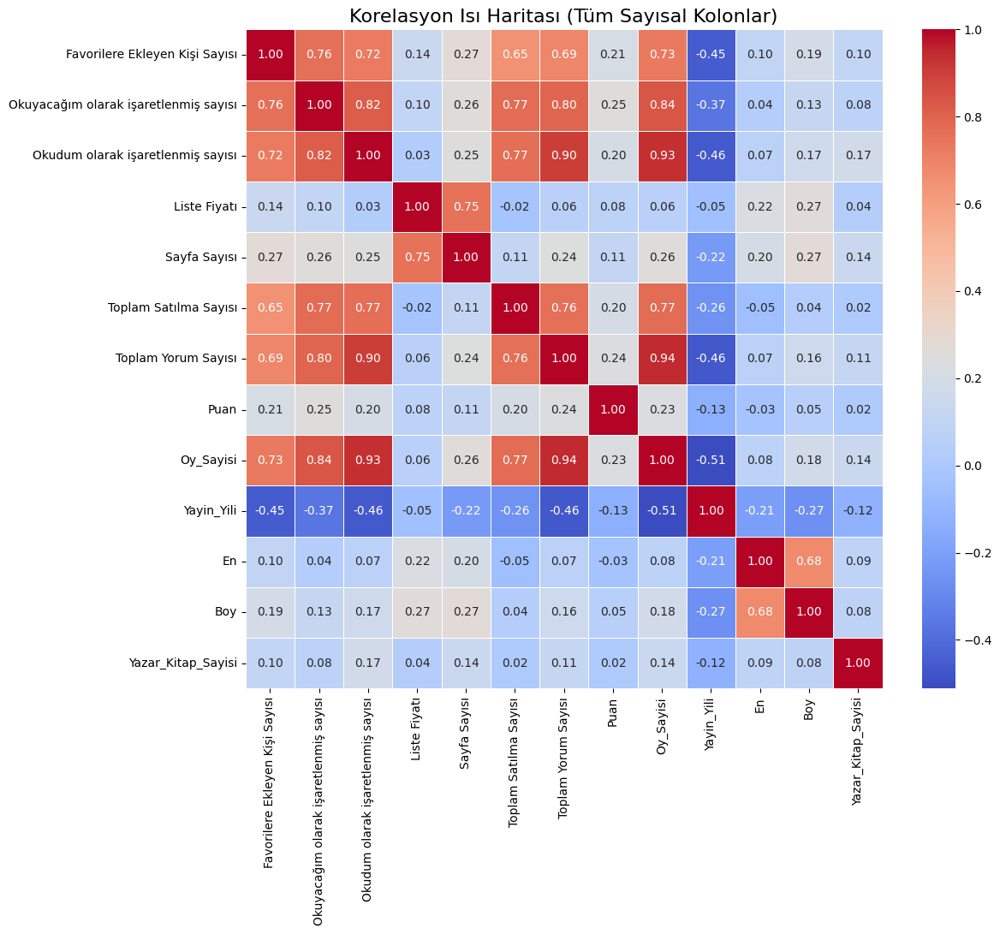


--- 2. Scatter Plot Matrix (Sadece Sürekli Kolonlar) ---
Pair Plot için kullanılacak 'sürekli' kolonlar: Favorilere Ekleyen Kişi Sayısı, Okuyacağım olarak işaretlenmiş sayısı, Okudum olarak işaretlenmiş sayısı, Liste Fiyatı, Sayfa Sayısı, Toplam Satılma Sayısı, Toplam Yorum Sayısı, Puan, Oy_Sayisi, Yayin_Yili, En, Boy, Yazar_Kitap_Sayisi

Uyarı: Çok fazla sürekli kolon (8+) tespit edildi.
Pair plot'un oluşturulması uzun sürebilir ve çıktı çok büyük olabilir...
✓ Pair Plot kaydedildi: visualization_v3-noyayinevinokategorinokagitcinsi\pair_plot.png


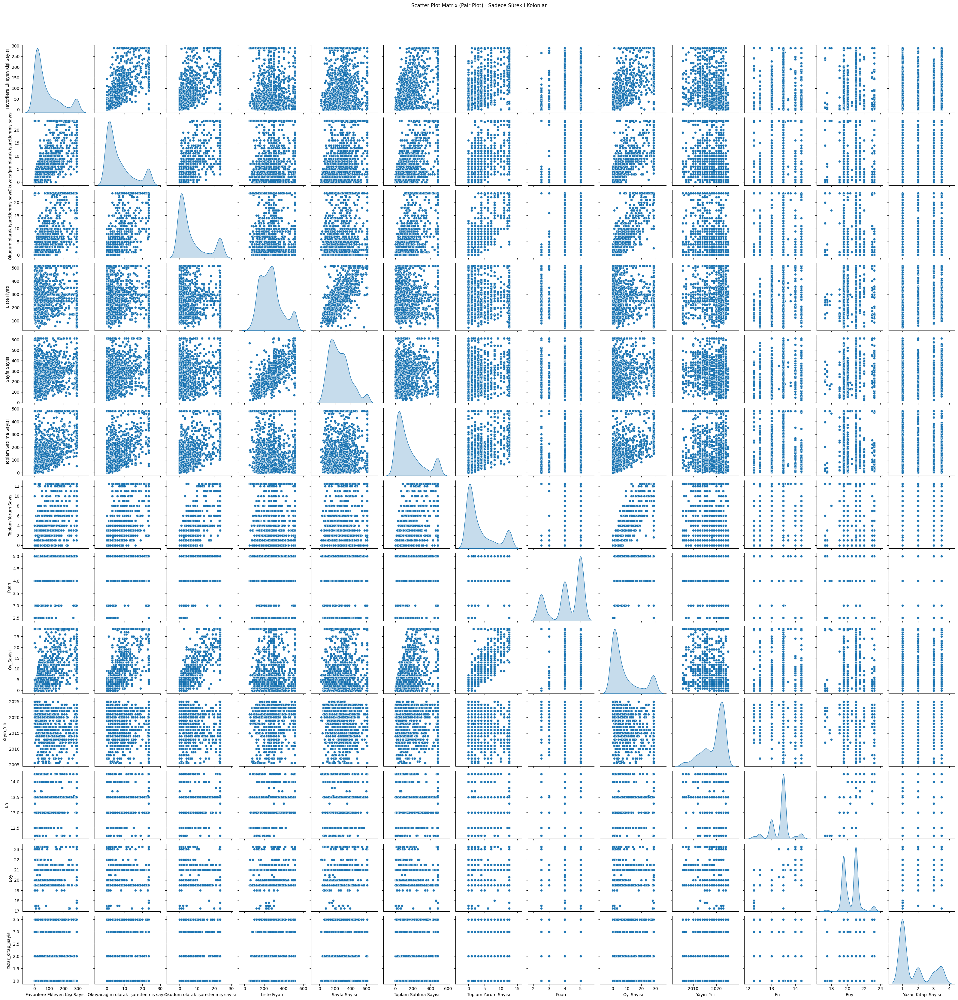


--- Korelasyon Analizi Tamamlandı ---


In [11]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os
import sys

def run_correlation_analysis(csv_file_path, output_viz_dir):
    """
    Belirtilen CSV dosyasını yükler, korelasyon analizleri
    (matris, heatmap) ve bir pair plot (scatter plot matrix)
    oluşturur. Görselleri hem Jupyter'da gösterir hem de
    belirtilen klasöre kaydeder.
    
    Args:
        csv_file_path (str): Analiz edilecek CSV dosyası (temizlenmiş/capped veri).
        output_viz_dir (str): Görsellerin kaydedileceği klasör.
    """
    
    # --- 1. Adım: Veri Yükleme ve Çıktı Klasörü ---
    try:
        # Önceki adımda oluşturduğumuz 'capped' veriyi yüklüyoruz
        df = pd.read_csv(csv_file_path)
        print(f"'{csv_file_path}' dosyası başarıyla yüklendi.")
    except FileNotFoundError:
        print(f"HATA: Dosya bulunamadı. Lütfen şu yolu kontrol edin: {csv_file_path}", file=sys.stderr)
        return
    except Exception as e:
        print(f"Dosya okunurken bir hata oluştu: {e}", file=sys.stderr)
        return

    # Görselleştirme klasörünü oluştur
    os.makedirs(output_viz_dir, exist_ok=True)
    print(f"Görseller '{output_viz_dir}' klasörüne kaydedilecek.\n")

    
    # --- 2. Adım: Korelasyon Matrisi ve Isı Haritası (Heatmap) ---
    # Bu analiz, 0/1 kolonları da dahil olmak üzere TÜM SAYISAL kolonlar için yapılır.
    print("--- 1. Korelasyon Analizi (Tüm Sayısal Kolonlar) ---")
    
    try:
        # .corr() metodu zaten sadece sayısal kolonları seçecektir
        corr_matrix = df.corr(numeric_only=True)
        
        # 2a. Korelasyon Matrisini (sayısal olarak) yazdır
        print("Korelasyon Matrisi (Sayısal Değerler):\n")
        print(corr_matrix)
        print("\n")

        # 2b. Isı Haritasını (Heatmap) çizdir
        # Kolon sayısına göre figür boyutunu ayarla
        num_cols = len(corr_matrix.columns)
        plt.figure(figsize=(max(12, num_cols * 0.8), max(10, num_cols * 0.7)))
        
        sns.heatmap(
            corr_matrix, 
            annot=True,      # Değerleri üzerine yaz
            cmap='coolwarm', # Renk paleti
            fmt='.2f',       # Ondalık formatı (2 basamak)
            linewidths=.5    # Hücreler arası çizgi kalınlığı
        )
        
        plt.title('Korelasyon Isı Haritası (Tüm Sayısal Kolonlar)', fontsize=16)
        
        # Dosyayı kaydet
        heatmap_path = os.path.join(output_viz_dir, 'correlation_heatmap.png')
        # bbox_inches='tight' etiketlerin kesilmesini engeller
        plt.savefig(heatmap_path, bbox_inches='tight')
        print(f"✓ Heatmap kaydedildi: {heatmap_path}")
        
        # Jupyter'da göster
        plt.show()
        plt.close()

    except Exception as e:
        print(f"HATA: Korelasyon heatmap oluşturulurken bir hata oluştu: {e}", file=sys.stderr)


    # --- 3. Adım: Scatter Plot Matrix (Pair Plot) ---
    # Bu analiz, sadece 'SÜREKLİ' (continuous) kolonlar için yapılır.
    # 0/1 (binary) kolonları bir scatter plot matrisinde görmek anlamsızdır.
    print("\n--- 2. Scatter Plot Matrix (Sadece Sürekli Kolonlar) ---")
    
    try:
        # Önceki betikteki filtreleme mantığını tekrar uygulayalım
        all_numeric_cols = df.select_dtypes(include=['float64', 'int64']).columns
        continuous_cols = []
        for col in all_numeric_cols:
            # Kolondaki (NaN olmayan) tüm değerler 0 veya 1 ise, bu kolonu atla
            is_binary = df[col].dropna().isin([0, 1]).all()
            if not is_binary:
                continuous_cols.append(col)
        
        if len(continuous_cols) < 2:
            print(f"Uyarı: Pair Plot çizdirmek için en az 2 adet 'sürekli' sayısal kolon bulunamadı. Atlanıyor.")
            return

        print(f"Pair Plot için kullanılacak 'sürekli' kolonlar: {', '.join(continuous_cols)}")
        
        if len(continuous_cols) > 8:
            print("\nUyarı: Çok fazla sürekli kolon (8+) tespit edildi.")
            print("Pair plot'un oluşturulması uzun sürebilir ve çıktı çok büyük olabilir...")

        # Sadece sürekli kolonları içeren alt bir DataFrame oluştur
        df_continuous = df[continuous_cols]
        
        # Pair Plot'u oluştur
        # 'kind="reg"' eklerseniz, scatter plot'lara regresyon çizgisi de çizer
        g = sns.pairplot(df_continuous, diag_kind='kde') 
        
        g.fig.suptitle('Scatter Plot Matrix (Pair Plot) - Sadece Sürekli Kolonlar', y=1.03) # Başlık
        
        # Dosyayı kaydet
        pairplot_path = os.path.join(output_viz_dir, 'pair_plot.png')
        g.savefig(pairplot_path)
        print(f"✓ Pair Plot kaydedildi: {pairplot_path}")
        
        # Jupyter'da göster (plt.show() pairplot'ta gereklidir)
        plt.show()
        plt.close()

    except Exception as e:
        print(f"HATA: Pair plot oluşturulurken bir hata oluştu: {e}", file=sys.stderr)
        
    print("\n--- Korelasyon Analizi Tamamlandı ---")

# --- BU BETİĞİ JUPYTER'DA ÇALIŞTIRMAK İÇİN ---

# 1. Önceki adımdan gelen, 'capped' (baskılanmış) verinin yolu
# Bu dosyanın var olduğundan emin olun
INPUT_CSV_PATH = "datasetVersions/kitapyurdu_dataset_v3-noyayinevinokategorinokagitcinsi.csv"

# 2. Görselleri kaydetmek istediğiniz klasör
# Bu klasör yoksa, kod tarafından oluşturulacaktır.
OUTPUT_VISUALIZATION_DIR = "visualization_v3-noyayinevinokategorinokagitcinsi"

# 3. Analiz fonksiyonunu çağır
run_correlation_analysis(INPUT_CSV_PATH, OUTPUT_VISUALIZATION_DIR)

# Korelasyon Analizi Özeti (Heatmap Bulguları)

Aşağıdaki özet, veri setindeki tüm sayısal kolonlar (one-hot encoding uygulanmış kategorik değişkenler dahil) arasındaki Pearson korelasyon matrisine dayanmaktadır.

## 1. Çok Güçlü Pozitif Korelasyonlar (Popülerlik ve Etkileşim)

Veri setindeki en güçlü ilişkiler, beklendiği gibi, kullanıcı etkileşim metrikleri arasında gözlemlenmiştir.

* **`Oy_Sayisi`** ile **`Toplam Yorum Sayısı`** ($r = 0.94$) ve **`Okudum olarak işaretlenmiş sayısı`** ($r = 0.93$) arasında neredeyse mükemmel bir pozitif ilişki vardır.
    * **Yorum:** Bu, kitabı okuyup "Okudum" olarak işaretleyen kullanıcıların aynı zamanda oy verdiğini ve yorum yaptığını göstermektedir. Bu üç metrik büyük ölçüde aynı kullanıcı davranışını ölçmektedir.

* **`Toplam Satılma Sayısı`**, diğer tüm kullanıcı etkileşim metrikleriyle (**`Okuyacağım...`** ($r = 0.77$), **`Oy_Sayisi`** ($r = 0.77$), **`Toplam Yorum Sayısı`** ($r = 0.76$)) güçlü pozitif korelasyona sahiptir.
    * **Yorum:** Kısacası, **çok satan kitaplar aynı zamanda sosyal olarak en çok etkileşim alan kitaplardır**. Popülerlik (satış) ve sosyal etkileşim (oy, yorum, listeye ekleme) birbiriyle doğrudan ilişkilidir.

## 2. Kitap Özellikleri ve Fiyat

* Beklendiği gibi, **`Liste Fiyatı`** ile **`Sayfa Sayısı`** arasında güçlü bir pozitif ilişki ($r = 0.75$) bulunmaktadır. Sayfa sayısı arttıkça kitabın fiyatı da artmaktadır.

* **Önemli Bulgulardan Biri:** **`Liste Fiyatı`** ile **`Toplam Satılma Sayısı`** arasında **hiçbir korelasyon yoktur** ($r = -0.02$).
    * **Yorum:** Bu, mevcut veri setinde fiyatın tek başına kitap satışlarını artırıcı veya azaltıcı bir faktör olmadığını göstermektedir. Diğer faktörler (yazar, popülerlik, tür) fiyattan çok daha baskındır.

## 3. Öne Çıkan Negatif Korelasyonlar (Yayın Yılı)

* **`Yayin_Yili`** kolonu, tüm popülerlik metrikleriyle (**`Oy_Sayisi`** ($r = -0.51$), **`Toplam Yorum Sayısı`** ($r = -0.46$), **`Okudum...`** ($r = -0.46$)) orta düzeyde negatif korelasyona sahiptir.
    * **Yorum:** Bu durum, yeni çıkan kitapların (Yayın Yılı yüksek olanların) daha az oy ve yoruma sahip olduğunu gösterir. Bu çok doğaldır, çünkü eski kitapların zaman içinde daha fazla oy, yorum ve okunma bilgisi biriktirmek için daha fazla zamanı olmuştur.

## 4. Kategorik Bulgular (Yayınevi ve Tür)

One-hot encoding ile oluşturulan kategorik kolonlar arasında bazı ilginç bulgular bulunmaktadır:

* **`Yayınevi_PEGASUS YAYINLARI`** kolonu, **`Okudum olarak işaretlenmiş sayısı`** ($r = 0.58$) ve **`Oy_Sayisi`** ($r = 0.53$) ile orta-güçlü düzeyde pozitif bir ilişkiye sahiptir.
    * **Yorum:** Bu, Pegasus yayınevinden çıkan kitapların veri setinde ortalamaya göre daha popüler (daha çok okunan ve oylanan) olduğunu göstermektedir.

* **`Ana_Kategori_Edebiyat`**, **`Okudum olarak işaretlenmiş sayısı`** ($r = 0.26$) ve **`Toplam Yorum Sayısı`** ($r = 0.21$) ile zayıf pozitif bir korelasyona sahiptir.

## 5. "Puan" Kolonu Üzerine İlginç Bir Gözlem

* **`Puan`** kolonu, **`Toplam Satılma Sayısı`** ($r = 0.20$), **`Oy_Sayisi`** ($r = 0.23$) veya **`Toplam Yorum Sayısı`** ($r = 0.24$) gibi başarı metriklerinin **hiçbiriyle güçlü bir ilişki göstermemektedir**.
    * **Sonuç:** Bu bulgu, bir kitabın "çok satmasının" veya "çok oy almasının" o kitabın "yüksek puanlı" olduğu anlamına gelmediğini ortaya koymaktadır. Popülerlik ve kalite (puan) arasında beklenenden daha zayıf bir bağ vardır.

---
### Dördüncü olarak **MinMaxScaler** kullanarak **Normalizasyon** uyguluyoruz. Böylece tüm veriler [0-1] aralığına indirgenmiş olacak.

#### **NOT: BU AŞAMAYLA BİRLİKTE ARTIK TÜM PRE-PROCESSING & FUTURE ENGINEERING İŞLEMLERİNİ BİTİREREK MODEL EĞİTİMİNE 3 FARKLI VERSİYONLA TAMAMEN HAZIRIZ.**

**Sırayla tüm veri setlerine uygulayalım.**

### 1) kitapyurdu_dataset_v3.csv --> kitapyurdu_dataset_v4Final.csv

In [13]:
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
import os
import sys

# --- KONFİGÜRASYON ---

# 1. Girdi Dosyası: Bir önceki adımda oluşturduğumuz 'capped' veri
INPUT_CSV_PATH = "datasetVersions/kitapyurdu_dataset_v3.csv"

# 2. Çıktı Dizini ve Dosya Adı:
OUTPUT_DIR = "datasetVersions"
OUTPUT_FILENAME = "kitapyurdu_dataset_v4Final.csv"

# --- NORMALİZASYON FONKSİYONU ---

def normalize_dataset(csv_file_path, output_dir, output_filename):
    """
    CSV dosyasını yükler, tüm sayısal kolonlara Min-Max normalizasyonu
    uygular ve sonucu yeni bir CSV olarak kaydeder.
    
    Args:
        csv_file_path (str): İşlenecek CSV dosyasının yolu.
        output_dir (str): Çıktı dosyasının kaydedileceği klasör.
        output_filename (str): Çıktı dosyasının adı.
    """
    
    print("--- Min-Max Normalizasyon İşlemi Başlatıldı ---")
    
    # --- 1. Adım: Veri Yükleme ---
    try:
        df = pd.read_csv(csv_file_path)
        print(f"'{csv_file_path}' dosyası başarıyla yüklendi.")
    except FileNotFoundError:
        print(f"HATA: Dosya bulunamadı. Lütfen şu yolu kontrol edin: {csv_file_path}", file=sys.stderr)
        return
    except Exception as e:
        print(f"Dosya okunurken bir hata oluştu: {e}", file=sys.stderr)
        return

    # --- 2. Adım: Kolonları Ayırma (Sayısal vs. Sayısal Olmayan) ---
    
    # Ölçeklendirilecek (normalize edilecek) kolonları seç
    numeric_cols = df.select_dtypes(include=['float64', 'int64']).columns
    
    # Dokunulmayacak, korunacak (örn: 'Kitap Adı' gibi) kolonları seç
    non_numeric_cols = df.select_dtypes(exclude=['float64', 'int64']).columns
    
    if len(numeric_cols) == 0:
        print("HATA: Ölçeklendirilecek sayısal kolon bulunamadı.", file=sys.stderr)
        return
        
    print(f"\nToplam {len(numeric_cols)} adet sayısal kolon normalize edilecek.")
    
    if len(non_numeric_cols) > 0:
        print(f"Toplam {len(non_numeric_cols)} adet sayısal olmayan kolon korunacak: {', '.join(non_numeric_cols)}")
    else:
        print("Sayısal olmayan (korunacak) kolon bulunamadı.")

    # --- 3. Adım: Min-Max Scaler Uygulaması ---
    
    # Scaler'ı başlat (varsayılan olarak 0-1 arasına ölçekler)
    scaler = MinMaxScaler()
    
    # Sadece sayısal kolonları al
    df_numeric = df[numeric_cols]
    
    # Scaler'ı uygula
    # .fit_transform() bir NumPy array döndürür
    scaled_data = scaler.fit_transform(df_numeric)
    
    # NumPy array'i tekrar DataFrame'e dönüştür
    # ÖNEMLİ: Orijinal kolon isimlerini geri veriyoruz
    df_scaled = pd.DataFrame(scaled_data, columns=numeric_cols)
    
    print("\nMin-Max normalizasyonu (0-1 aralığına ölçeklendirme) tamamlandı.")

    # --- 4. Adım: Verileri Birleştirme ve Kaydetme ---
    
    if len(non_numeric_cols) > 0:
        # Korunan (sayısal olmayan) kolonları al
        # Olası index hatalarını önlemek için index'leri sıfırla
        df_non_numeric = df[non_numeric_cols].reset_index(drop=True)
        
        # Ölçeklenmiş sayısal verilerle birleştir
        df_final = pd.concat([df_non_numeric, df_scaled], axis=1)
        print("Sayısal olmayan kolonlar ile normalize edilmiş veriler birleştirildi.")
    else:
        # Sadece ölçeklenmiş veriyi kullan
        df_final = df_scaled

    # 5. Adım: Diske Kaydetme
    try:
        # Çıktı klasörünü oluştur (varsa hata verme)
        os.makedirs(output_dir, exist_ok=True)
        
        # Tam dosya yolunu oluştur
        output_path = os.path.join(output_dir, output_filename)
        
        # DataFrame'i CSV olarak kaydet (index'i kaydetme)
        df_final.to_csv(output_path, index=False)
        
        print(f"\n--- İşlem Başarılı ---")
        print(f"Normalize edilmiş yeni veri seti başarıyla kaydedildi:")
        print(f"  -> {output_path}")

        # Kullanıcıya yeni veriden bir örnek göster
        print("\nNormalize Edilmiş Veri Örneği (ilk 5 satır):\n")
        print(df_final.head())
        
    except Exception as e:
        print(f"\nHATA: Normalize edilmiş veri CSV'ye kaydedilirken bir hata oluştu: {e}", file=sys.stderr)


# --- BU BETİĞİ JUPYTER'DA ÇALIŞTIRMAK İÇİN ---

# Ayarları kontrol edin ve hücreyi çalıştırın
normalize_dataset(
    csv_file_path=INPUT_CSV_PATH,
    output_dir=OUTPUT_DIR,
    output_filename=OUTPUT_FILENAME
)

--- Min-Max Normalizasyon İşlemi Başlatıldı ---
'datasetVersions/kitapyurdu_dataset_v3.csv' dosyası başarıyla yüklendi.

Toplam 33 adet sayısal kolon normalize edilecek.
Sayısal olmayan (korunacak) kolon bulunamadı.

Min-Max normalizasyonu (0-1 aralığına ölçeklendirme) tamamlandı.

--- İşlem Başarılı ---
Normalize edilmiş yeni veri seti başarıyla kaydedildi:
  -> datasetVersions\kitapyurdu_dataset_v4Final.csv

Normalize Edilmiş Veri Örneği (ilk 5 satır):

   Favorilere Ekleyen Kişi Sayısı  Okuyacağım olarak işaretlenmiş sayısı  \
0                        0.027634                               0.000000   
1                        0.390328                               0.255319   
2                        0.082902                               0.212766   
3                        0.124352                               0.212766   
4                        0.369603                               0.553191   

   Okudum olarak işaretlenmiş sayısı  Liste Fiyatı  Sayfa Sayısı  \
0              

### 2) kitapyurdu_dataset_v3-nokagitcinsi.csv --> kitapyurdu_dataset_v4-nokagitcinsiFinal.csv

In [14]:
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
import os
import sys

# --- KONFİGÜRASYON ---

# 1. Girdi Dosyası: Bir önceki adımda oluşturduğumuz 'capped' veri
INPUT_CSV_PATH = "datasetVersions/kitapyurdu_dataset_v3-nokagitcinsi.csv"

# 2. Çıktı Dizini ve Dosya Adı:
OUTPUT_DIR = "datasetVersions"
OUTPUT_FILENAME = "kitapyurdu_dataset_v4-nokagitcinsiFinal.csv"

# --- NORMALİZASYON FONKSİYONU ---

def normalize_dataset(csv_file_path, output_dir, output_filename):
    """
    CSV dosyasını yükler, tüm sayısal kolonlara Min-Max normalizasyonu
    uygular ve sonucu yeni bir CSV olarak kaydeder.
    
    Args:
        csv_file_path (str): İşlenecek CSV dosyasının yolu.
        output_dir (str): Çıktı dosyasının kaydedileceği klasör.
        output_filename (str): Çıktı dosyasının adı.
    """
    
    print("--- Min-Max Normalizasyon İşlemi Başlatıldı ---")
    
    # --- 1. Adım: Veri Yükleme ---
    try:
        df = pd.read_csv(csv_file_path)
        print(f"'{csv_file_path}' dosyası başarıyla yüklendi.")
    except FileNotFoundError:
        print(f"HATA: Dosya bulunamadı. Lütfen şu yolu kontrol edin: {csv_file_path}", file=sys.stderr)
        return
    except Exception as e:
        print(f"Dosya okunurken bir hata oluştu: {e}", file=sys.stderr)
        return

    # --- 2. Adım: Kolonları Ayırma (Sayısal vs. Sayısal Olmayan) ---
    
    # Ölçeklendirilecek (normalize edilecek) kolonları seç
    numeric_cols = df.select_dtypes(include=['float64', 'int64']).columns
    
    # Dokunulmayacak, korunacak (örn: 'Kitap Adı' gibi) kolonları seç
    non_numeric_cols = df.select_dtypes(exclude=['float64', 'int64']).columns
    
    if len(numeric_cols) == 0:
        print("HATA: Ölçeklendirilecek sayısal kolon bulunamadı.", file=sys.stderr)
        return
        
    print(f"\nToplam {len(numeric_cols)} adet sayısal kolon normalize edilecek.")
    
    if len(non_numeric_cols) > 0:
        print(f"Toplam {len(non_numeric_cols)} adet sayısal olmayan kolon korunacak: {', '.join(non_numeric_cols)}")
    else:
        print("Sayısal olmayan (korunacak) kolon bulunamadı.")

    # --- 3. Adım: Min-Max Scaler Uygulaması ---
    
    # Scaler'ı başlat (varsayılan olarak 0-1 arasına ölçekler)
    scaler = MinMaxScaler()
    
    # Sadece sayısal kolonları al
    df_numeric = df[numeric_cols]
    
    # Scaler'ı uygula
    # .fit_transform() bir NumPy array döndürür
    scaled_data = scaler.fit_transform(df_numeric)
    
    # NumPy array'i tekrar DataFrame'e dönüştür
    # ÖNEMLİ: Orijinal kolon isimlerini geri veriyoruz
    df_scaled = pd.DataFrame(scaled_data, columns=numeric_cols)
    
    print("\nMin-Max normalizasyonu (0-1 aralığına ölçeklendirme) tamamlandı.")

    # --- 4. Adım: Verileri Birleştirme ve Kaydetme ---
    
    if len(non_numeric_cols) > 0:
        # Korunan (sayısal olmayan) kolonları al
        # Olası index hatalarını önlemek için index'leri sıfırla
        df_non_numeric = df[non_numeric_cols].reset_index(drop=True)
        
        # Ölçeklenmiş sayısal verilerle birleştir
        df_final = pd.concat([df_non_numeric, df_scaled], axis=1)
        print("Sayısal olmayan kolonlar ile normalize edilmiş veriler birleştirildi.")
    else:
        # Sadece ölçeklenmiş veriyi kullan
        df_final = df_scaled

    # 5. Adım: Diske Kaydetme
    try:
        # Çıktı klasörünü oluştur (varsa hata verme)
        os.makedirs(output_dir, exist_ok=True)
        
        # Tam dosya yolunu oluştur
        output_path = os.path.join(output_dir, output_filename)
        
        # DataFrame'i CSV olarak kaydet (index'i kaydetme)
        df_final.to_csv(output_path, index=False)
        
        print(f"\n--- İşlem Başarılı ---")
        print(f"Normalize edilmiş yeni veri seti başarıyla kaydedildi:")
        print(f"  -> {output_path}")

        # Kullanıcıya yeni veriden bir örnek göster
        print("\nNormalize Edilmiş Veri Örneği (ilk 5 satır):\n")
        print(df_final.head())
        
    except Exception as e:
        print(f"\nHATA: Normalize edilmiş veri CSV'ye kaydedilirken bir hata oluştu: {e}", file=sys.stderr)


# --- BU BETİĞİ JUPYTER'DA ÇALIŞTIRMAK İÇİN ---

# Ayarları kontrol edin ve hücreyi çalıştırın
normalize_dataset(
    csv_file_path=INPUT_CSV_PATH,
    output_dir=OUTPUT_DIR,
    output_filename=OUTPUT_FILENAME
)

--- Min-Max Normalizasyon İşlemi Başlatıldı ---
'datasetVersions/kitapyurdu_dataset_v3-nokagitcinsi.csv' dosyası başarıyla yüklendi.

Toplam 32 adet sayısal kolon normalize edilecek.
Sayısal olmayan (korunacak) kolon bulunamadı.

Min-Max normalizasyonu (0-1 aralığına ölçeklendirme) tamamlandı.

--- İşlem Başarılı ---
Normalize edilmiş yeni veri seti başarıyla kaydedildi:
  -> datasetVersions\kitapyurdu_dataset_v4-nokagitcinsiFinal.csv

Normalize Edilmiş Veri Örneği (ilk 5 satır):

   Favorilere Ekleyen Kişi Sayısı  Okuyacağım olarak işaretlenmiş sayısı  \
0                        0.027634                               0.000000   
1                        0.390328                               0.255319   
2                        0.082902                               0.212766   
3                        0.124352                               0.212766   
4                        0.369603                               0.553191   

   Okudum olarak işaretlenmiş sayısı  Liste Fiyatı  Sayfa

### 3) kitapyurdu_dataset_v3-noyayinevinokategorinokagitcinsi.csv --> kitapyurdu_dataset_v4-noyayinevinokategorinokagitcinsiFinal.csv

In [15]:
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
import os
import sys

# --- KONFİGÜRASYON ---

# 1. Girdi Dosyası: Bir önceki adımda oluşturduğumuz 'capped' veri
INPUT_CSV_PATH = "datasetVersions/kitapyurdu_dataset_v3-noyayinevinokategorinokagitcinsi.csv"

# 2. Çıktı Dizini ve Dosya Adı:
OUTPUT_DIR = "datasetVersions"
OUTPUT_FILENAME = "kitapyurdu_dataset_v4-noyayinevinokategorinokagitcinsiFinal.csv"

# --- NORMALİZASYON FONKSİYONU ---

def normalize_dataset(csv_file_path, output_dir, output_filename):
    """
    CSV dosyasını yükler, tüm sayısal kolonlara Min-Max normalizasyonu
    uygular ve sonucu yeni bir CSV olarak kaydeder.
    
    Args:
        csv_file_path (str): İşlenecek CSV dosyasının yolu.
        output_dir (str): Çıktı dosyasının kaydedileceği klasör.
        output_filename (str): Çıktı dosyasının adı.
    """
    
    print("--- Min-Max Normalizasyon İşlemi Başlatıldı ---")
    
    # --- 1. Adım: Veri Yükleme ---
    try:
        df = pd.read_csv(csv_file_path)
        print(f"'{csv_file_path}' dosyası başarıyla yüklendi.")
    except FileNotFoundError:
        print(f"HATA: Dosya bulunamadı. Lütfen şu yolu kontrol edin: {csv_file_path}", file=sys.stderr)
        return
    except Exception as e:
        print(f"Dosya okunurken bir hata oluştu: {e}", file=sys.stderr)
        return

    # --- 2. Adım: Kolonları Ayırma (Sayısal vs. Sayısal Olmayan) ---
    
    # Ölçeklendirilecek (normalize edilecek) kolonları seç
    numeric_cols = df.select_dtypes(include=['float64', 'int64']).columns
    
    # Dokunulmayacak, korunacak (örn: 'Kitap Adı' gibi) kolonları seç
    non_numeric_cols = df.select_dtypes(exclude=['float64', 'int64']).columns
    
    if len(numeric_cols) == 0:
        print("HATA: Ölçeklendirilecek sayısal kolon bulunamadı.", file=sys.stderr)
        return
        
    print(f"\nToplam {len(numeric_cols)} adet sayısal kolon normalize edilecek.")
    
    if len(non_numeric_cols) > 0:
        print(f"Toplam {len(non_numeric_cols)} adet sayısal olmayan kolon korunacak: {', '.join(non_numeric_cols)}")
    else:
        print("Sayısal olmayan (korunacak) kolon bulunamadı.")

    # --- 3. Adım: Min-Max Scaler Uygulaması ---
    
    # Scaler'ı başlat (varsayılan olarak 0-1 arasına ölçekler)
    scaler = MinMaxScaler()
    
    # Sadece sayısal kolonları al
    df_numeric = df[numeric_cols]
    
    # Scaler'ı uygula
    # .fit_transform() bir NumPy array döndürür
    scaled_data = scaler.fit_transform(df_numeric)
    
    # NumPy array'i tekrar DataFrame'e dönüştür
    # ÖNEMLİ: Orijinal kolon isimlerini geri veriyoruz
    df_scaled = pd.DataFrame(scaled_data, columns=numeric_cols)
    
    print("\nMin-Max normalizasyonu (0-1 aralığına ölçeklendirme) tamamlandı.")

    # --- 4. Adım: Verileri Birleştirme ve Kaydetme ---
    
    if len(non_numeric_cols) > 0:
        # Korunan (sayısal olmayan) kolonları al
        # Olası index hatalarını önlemek için index'leri sıfırla
        df_non_numeric = df[non_numeric_cols].reset_index(drop=True)
        
        # Ölçeklenmiş sayısal verilerle birleştir
        df_final = pd.concat([df_non_numeric, df_scaled], axis=1)
        print("Sayısal olmayan kolonlar ile normalize edilmiş veriler birleştirildi.")
    else:
        # Sadece ölçeklenmiş veriyi kullan
        df_final = df_scaled

    # 5. Adım: Diske Kaydetme
    try:
        # Çıktı klasörünü oluştur (varsa hata verme)
        os.makedirs(output_dir, exist_ok=True)
        
        # Tam dosya yolunu oluştur
        output_path = os.path.join(output_dir, output_filename)
        
        # DataFrame'i CSV olarak kaydet (index'i kaydetme)
        df_final.to_csv(output_path, index=False)
        
        print(f"\n--- İşlem Başarılı ---")
        print(f"Normalize edilmiş yeni veri seti başarıyla kaydedildi:")
        print(f"  -> {output_path}")

        # Kullanıcıya yeni veriden bir örnek göster
        print("\nNormalize Edilmiş Veri Örneği (ilk 5 satır):\n")
        print(df_final.head())
        
    except Exception as e:
        print(f"\nHATA: Normalize edilmiş veri CSV'ye kaydedilirken bir hata oluştu: {e}", file=sys.stderr)


# --- BU BETİĞİ JUPYTER'DA ÇALIŞTIRMAK İÇİN ---

# Ayarları kontrol edin ve hücreyi çalıştırın
normalize_dataset(
    csv_file_path=INPUT_CSV_PATH,
    output_dir=OUTPUT_DIR,
    output_filename=OUTPUT_FILENAME
)

--- Min-Max Normalizasyon İşlemi Başlatıldı ---
'datasetVersions/kitapyurdu_dataset_v3-noyayinevinokategorinokagitcinsi.csv' dosyası başarıyla yüklendi.

Toplam 13 adet sayısal kolon normalize edilecek.
Sayısal olmayan (korunacak) kolon bulunamadı.

Min-Max normalizasyonu (0-1 aralığına ölçeklendirme) tamamlandı.

--- İşlem Başarılı ---
Normalize edilmiş yeni veri seti başarıyla kaydedildi:
  -> datasetVersions\kitapyurdu_dataset_v4-noyayinevinokategorinokagitcinsiFinal.csv

Normalize Edilmiş Veri Örneği (ilk 5 satır):

   Favorilere Ekleyen Kişi Sayısı  Okuyacağım olarak işaretlenmiş sayısı  \
0                        0.027634                               0.000000   
1                        0.390328                               0.255319   
2                        0.082902                               0.212766   
3                        0.124352                               0.212766   
4                        0.369603                               0.553191   

   Okudum olarak 

# **4) Makine Öğrenmesi & En Uygun Regresyon Modelinin Bulunması**

# **Regresyon Modeli Karşılaştırma Analizi**

Bu komut dosyası (script), bir veri setindeki hedef değişkeni (bu durumda "Toplam Satılma Sayısı") tahmin etmek için 10 farklı regresyon modelini otomatik olarak eğiten, değerlendiren ve karşılaştıran kapsamlı bir analiz boru hattıdır.

Analizin amacı, hangi modelin veri setinize en iyi performansı (en yüksek doğruluk, en düşük hata) sağladığını belirlemektir.

## **Bölüm 1: Gerekli Kütüphanelerin İçe Aktarılması (Imports)**

Kodun bu ilk bölümü, analiz için gerekli olan tüm kütüphaneleri ve araçları yükler.

**Neden Yapılıyor?**
* **pandas & numpy:** Veri setini okumak, temizlemek ve yapılandırmak için temel araçlardır.
* **matplotlib & seaborn:** Sonuçları ve model performanslarını görselleştirmek için kullanılır.
* **sklearn:** Makine öğrenmesi için standart kütüphanedir.
    * `train_test_split`: Veriyi eğitim ve test olarak ayırmak için kullanılır. Bu, modelin "ezber" yapıp yapmadığını anlamanın tek yoludur.
    * `metrics`: Modellerin ne kadar başarılı olduğunu ölçmek için matematiksel formülleri sağlar.
    * **Modeller (Linear, KNN, Ensemble, vb.):** Tahmin yapmak için kullanılacak farklı algoritmaları içerir. Her modelin veriye yaklaşımı farklıdır.
* **warnings & pd.set_option:** Çıktının daha temiz ve okunaklı olmasını sağlayan kalite-of-life ayarlarıdır.

---

## **Bölüm 2: Yardımcı Fonksiyon (`calculate_adj_r2`)**

Bu bölüm, standart **$R^2$ (R-squared)** metriğini temel alarak **"Düzeltilmiş $R^2$" (Adjusted $R^2$)** değerini hesaplayan küçük bir yardımcı fonksiyon tanımlar.

### **Teknik Açıklama: $R^2$ vs. Düzeltilmiş $R^2$**

* **$R^2$ (R-squared veya Belirlilik Katsayısı):**
    * **Nedir?** 0 ile 1 arasında bir değerdir. Hedef değişkendeki (örn: Satış Sayısı) değişkenliğin *yüzde kaçının* modeldeki özellikler (örn: fiyat, yazar, yayınevi) tarafından açıklandığını gösterir.
    * **Örnek:** `$R^2 = 0.85$` demek, "satış sayısındaki değişimin %85'ini modelimiz açıklayabiliyor" demektir. Yüksek olması iyidir.
    * **Sorunu:** Modele *alakasız* bir özellik ekleseniz bile (örn: "kitap kapağı rengi"), $R^2$ değeri asla düşmez, en iyi ihtimalle aynı kalır veya hafifçe artar. Bu, modelin gerçekten iyileşip iyileşmediğini anlamayı zorlaştırır.

* **Düzeltilmiş $R^2$ (Adjusted R-squared):**
    * **Nedir?** $R^2$'nin "cezalandırılmış" halidir. Modele eklenen her yeni özelliğin (formüldeki `p` değeri) modele gerçekten katkı sağlayıp sağlamadığına bakar.
    * **Neden Kullanılır?** Eğer modele *gereksiz* bir özellik eklerseniz, Düzeltilmiş $R^2$ değeri düşer. Bu, modelin karmaşıklığını ve özellik sayısını dikkate alan daha dürüst bir başarı metriğidir.

---

## **Bölüm 3: Ana Analiz Fonksiyonu (`compare_regression_models`)**

Bu, tüm ağır işi yapan ana fonksiyondur. Veriyi alır, modelleri eğitir, değerlendirir ve sonuçları raporlar.

### **Adım 3.1: Veri Yükleme ve Hazırlama**

**Neden Yapılıyor?**
1.  **Veri Yükleme (`pd.read_csv`):** Analizin başlaması için veri diske alınır. `try-except` bloğu, dosya bulunamazsa programın çökmesini engeller.
2.  **Boş Değerleri Atma (`dropna`):** Tahmin etmeye çalıştığımız "Toplam Satılma Sayısı" (`y`) değeri `NaN` (boş) ise, o satırın model eğitimine veya testine bir katkısı olamaz. Bu yüzden bu "cevapsız" satırlar atılır.
3.  **X ve y Ayırma:** Makine öğrenmesinde kuraldır. `y` (hedef), tahmin etmeye çalıştığımız şeydir (Satış Sayısı). `X` (özellikler), tahmini yapmak için kullandığımız diğer her şeydir (Fiyat, Puan, vb.).
4.  **Sayısal Veri Seçimi (`select_dtypes`):** Bu script'teki modeller (örn. `LinearRegression`) matematiksel işlemler yapar ve sadece sayısal verilerle çalışır. Veri ön işleme (pre-processing) adımından kalmış olabilecek metin tabanlı (kategorik) kolonlar varsa, bu adımda analizden çıkarılır.
5.  **`train_test_split` (En Önemli Adım):**
    * **Neden?** Modelin performansını *dürüstçe* ölçmek için. Eğer modelimize elimizdeki tüm veriyi (1000 satır) "ezberletirsek" ve sonra aynı 1000 satırı ne kadar iyi tahmin ettiğini sorarsak, "hepsini %100 doğru bildim" diyebilir. Bu, modelin "öğrendiğini" değil, **"ezberlediğini"** gösterir (**Overfitting**).
    * **Çözüm:** Veriyi ikiye böleriz (%80 Eğitim, %20 Test).
        * **Eğitim Seti (X\_train, y\_train):** Modelin "ders çalışacağı" ve desenleri öğreneceği veri (800 satır).
        * **Test Seti (X\_test, y\_test):** Modelin *daha önce hiç görmediği* "sınav" verisi (200 satır). Modelin başarısı, bu test seti üzerinde ölçülür.
    * `random_state=42`: Bölme işleminin her seferinde *aynı* şekilde yapılmasını sağlar. Bu sayede analizi tekrar çalıştırdığımızda farklı sonuçlar almayız (tekrarlanabilirlik).

### **Adım 3.2: Modellerin Tanımlanması**

**Neden Yapılıyor?**
Farklı model ailelerini test etmek için bir "sözlük" (dictionary) yapısı kullanılır. Bu, kodun temiz ve genişletilebilir olmasını sağlar.
* **Lineer Modeller (Linear, Ridge, Lasso, ElasticNet):** Veri üzerinde basit, düz çizgisel ilişkiler bulmaya çalışır. Hızlıdırlar ve yorumlanmaları kolaydır.
* **Doğrusal Olmayan Modeller (KNN, Decision Tree):** Daha karmaşık, eğrisel ilişkileri yakalayabilirler. `Decision Tree` (Karar Ağacı), "eğer fiyat > 50 ise ve yayınevi X ise, satış Y olur" gibi kurallar öğrenir.
* **Ensemble (Topluluk) Modelleri (Random Forest, Boosting, XGBoost, LightGBM):** En güçlü modellerdir. Yüzlerce (burada `n_estimators=100` ayarlanmış) zayıf modeli (genellikle karar ağaçlarını) birleştirerek çok güçlü ve isabetli bir "uzmanlar komitesi" oluştururlar.

### **Adım 3.3: Model Eğitimi ve Değerlendirme**

Bu adım, tanımlanan her model için bir döngü başlatır, modeli eğitir, test verisi üzerinde tahmin yaptırır ve performansını ölçer.

**Neden Yapılıyor?**
1.  **`model.fit(X_train, y_train)`:** Bu, **"eğitim"** anıdır. Model, eğitim verisindeki (`X_train`) özellikler ile (`y_train`) hedef arasındaki matematiksel ilişkiyi öğrenir.
2.  **`model.predict(X_test)`:** Model, öğrendiği ilişkiyi kullanarak *daha önce hiç görmediği* `X_test` verisine bakar ve `y_test` değerlerinin ne olması gerektiğine dair tahminler (`y_pred`) üretir.
3.  **Metriklerin Hesaplanması:** Bu, modelin "sınav kağıdını" okuduğumuz yerdir. `y_test` (gerçek cevaplar) ile `y_pred` (modelin tahminleri) karşılaştırılır.

#### **Teknik Açıklama: Regresyon Metrikleri**

* **$R^2$ / Adj. $R^2$:** (Bkz. Bölüm 2) Modelin açıklama gücünü ölçer. 1'e ne kadar yakınsa o kadar iyidir.
* **$MAE$ (Mean Absolute Error - Ortalama Mutlak Hata):**
    * **Nedir?** Modelin tahminlerinin *ortalama olarak* gerçek değerden ne kadar saptığını gösterir.
    * **Örnek:** `MAE = 12.5` ise, "Modelimiz satış sayısını tahmin ederken ortalama 12.5 adet yanılıyor" demektir. Yorumlaması en kolay hata metriğidir. Düşük olması iyidir.
* **$MSE$ (Mean Squared Error - Ortalama Karesel Hata):**
    * **Nedir?** Hataların karesini alır. `(Gerçek - Tahmin)^2`.
    * **Neden?** **Büyük hataları** *çok daha ağır* cezalandırır. Örneğin:
        * İki tahmin: 10 hata, 10 hata -> MSE = (10^2 + 10^2) / 2 = 100
        * İki tahmin: 1 hata, 19 hata -> MSE = (1^2 + 19^2) / 2 = 181
    * MAE için iki durum da (10+10)/2 = 10 ve (1+19)/2 = 10, yani aynıdır. Ancak MSE, ikinci modelin (19 hata yapan) çok daha kötü olduğunu söyler.
* **$RMSE$ (Root Mean Squared Error - Karesel Ortalama Hatanın Karekökü):**
    * **Nedir?** $MSE$'nin kareköküdür.
    * **Neden?** $MSE$ büyük hataları cezalandırmada iyidir ancak birimi "satış sayısının karesi" gibi anlamsız bir şey olur. Karekök almak, metriği $MAE$ gibi tekrar orijinal birime (yani "satış sayısı") döndürür. Regresyonda en yaygın kullanılan hata metriğidir. Düşük olması iyidir.
* **$MedAE$ (Median Absolute Error - Medyan Mutlak Hata):**
    * **Nedir?** Hataların ortalaması yerine *medyanını* (orta değerini) alır.
    * **Neden?** **Aykırı değerlere (outlier)** karşı dayanıklıdır. Eğer model 999 tahmini doğru yapıp sadece 1 tahmini *aşırı* yanlış yaparsa, $MAE$ ve $RMSE$ bu tek hata yüzünden çok yükselir. $MedAE$ ise bu aşırı hatayı görmezden gelir ve modelin "tipik" performansını gösterir.

### **Adım 3.4: Sonuçların Raporlanması**

**Neden Yapılıyor?**
Toplanan tüm metrikler (`results` listesi), okunması kolay bir `pandas.DataFrame` tablosuna dönüştürülür. Bu tablo, en iyi performansı gösteren modeli (en yüksek $R^2$'ye göre sıralanır) hızlıca görebilmemiz için `to_markdown` formatında yazdırılır.

### **Adım 3.5: Görselleştirme ve Kaydetme**

Bu son adım, elde edilen raporu daha kolay yorumlanabilir hale getirmek için çubuk grafikler (bar plot) oluşturur.

**Neden Yapılıyor?**
1.  **Sıralama:** Her metrik için modeller yeniden sıralanır. $R^2$ için "en yüksek" olan en iyidir, $RMSE$ için "en düşük" olan en iyidir. Bu, grafiklerin her zaman "en iyiden en kötüye" doğru okunmasını sağlar.
2.  **`sns.barplot`:** Sayısal bir tablo yerine hangi modelin açık ara daha iyi olduğunu *görsel* olarak anlamak çok daha hızlıdır.
3.  **`ax.bar_label(...)` (Önemli Güncelleme):** Bu satır, çubukların tam değerini (örn: 0.8542) çubuğun hemen sağına yazar. Bu, grafiği okumak için X eksenindeki çizgilere bakma ihtiyacını ortadan kaldırır.
4.  **`ax.set_xlim(...)` (Önemli Güncelleme):** `bar_label` ile eklenen etiketler bazen grafiğin kenarından taşabilir. Bu kod satırı, grafiğin sağ kenar boşluğunu %15 artırarak etiketlerin rahatça sığmasını garanti eder.
5.  **`plt.savefig(...)`:** Analiz sonuçlarını kalıcı hale getirmek için her bir grafiği bir `.png` dosyası olarak `model_comparison_visuals` klasörüne kaydeder.

---

## **Bölüm 4: Analizi Çalıştırma**

Script'in bu son bölümü, yukarıda tanımlanan tüm fonksiyonları çalıştırmak için gerekli ayarları yapar ve ana fonksiyonu çağırır.

**Neden Yapılıyor?**
Bu blok, script'i "yapılandırılabilir" hale getirir. Farklı bir veri seti (`INPUT_CSV_PATH`) veya farklı bir hedef kolonu (`TARGET_COL_NAME`) tahmin etmek isterseniz, tüm kodu değiştirmek yerine sadece bu değişkenleri güncellemeniz yeterlidir.

`compare_regression_models(...)` fonksiyonu çağrıldığında, tüm analiz süreci (Yükleme -> Hazırlama -> Eğitim -> Değerlendirme -> Raporlama -> Görselleştirme) başlar ve tamamlanır.

In [17]:
pip install pandas scikit-learn matplotlib seaborn xgboost lightgbm

   ---------------------------------------- 0.0/72.0 MB ? eta -:--:--
   - -------------------------------------- 1.8/72.0 MB 12.4 MB/s eta 0:00:06
   -- ------------------------------------- 4.7/72.0 MB 13.3 MB/s eta 0:00:06
   ---- ----------------------------------- 7.9/72.0 MB 13.6 MB/s eta 0:00:05
   ----- ---------------------------------- 10.5/72.0 MB 13.7 MB/s eta 0:00:05
   ------ --------------------------------- 12.6/72.0 MB 12.6 MB/s eta 0:00:05
   --------- ------------------------------ 16.5/72.0 MB 13.8 MB/s eta 0:00:05
   ---------- ----------------------------- 19.4/72.0 MB 13.8 MB/s eta 0:00:04
   ------------ --------------------------- 22.3/72.0 MB 13.9 MB/s eta 0:00:04
   ------------- -------------------------- 25.2/72.0 MB 13.9 MB/s eta 0:00:04
   --------------- ------------------------ 28.0/72.0 MB 13.9 MB/s eta 0:00:04
   ----------------- ---------------------- 30.9/72.0 MB 13.9 MB/s eta 0:00:03
   ------------------ --------------------- 33.8/72.0 MB 13.9 MB

---
### **1) kitapyurdu_dataset_v4Final.csv Veri Setinin Performansını Görelim.**

--- Model Karşılaştırma Analizi Başlatıldı ---
Veri Seti: datasetVersions/kitapyurdu_dataset_v4Final.csv
Hedef Kolon: Toplam Satılma Sayısı

Veri seti ayrıldı: 1197 eğitim, 300 test satırı.
Kullanılan özellik (feature) sayısı: 32

--- Modeller Eğitiliyor ve Değerlendiriliyor ---
  Eğitiliyor: Linear Regression...
  Eğitiliyor: Ridge...
  Eğitiliyor: Lasso...
  Eğitiliyor: ElasticNet...
  Eğitiliyor: KNN Regressor...
  Eğitiliyor: Decision Tree...
  Eğitiliyor: Random Forest...
  Eğitiliyor: Gradient Boosting...
  Eğitiliyor: XGBoost...
  Eğitiliyor: LightGBM...


--- MODEL KARŞILAŞTIRMA RAPORU ---
| Model             |   R-squared |   Adj. R-squared |    MAE |    MSE |   RMSE |   MedianAE |   Eğitim Süresi (sn) |
|:------------------|------------:|-----------------:|-------:|-------:|-------:|-----------:|---------------------:|
| Gradient Boosting |      0.7561 |           0.7269 | 0.0965 | 0.0220 | 0.1485 |     0.0680 |               0.2089 |
| Random Forest     |      0.7501 |      

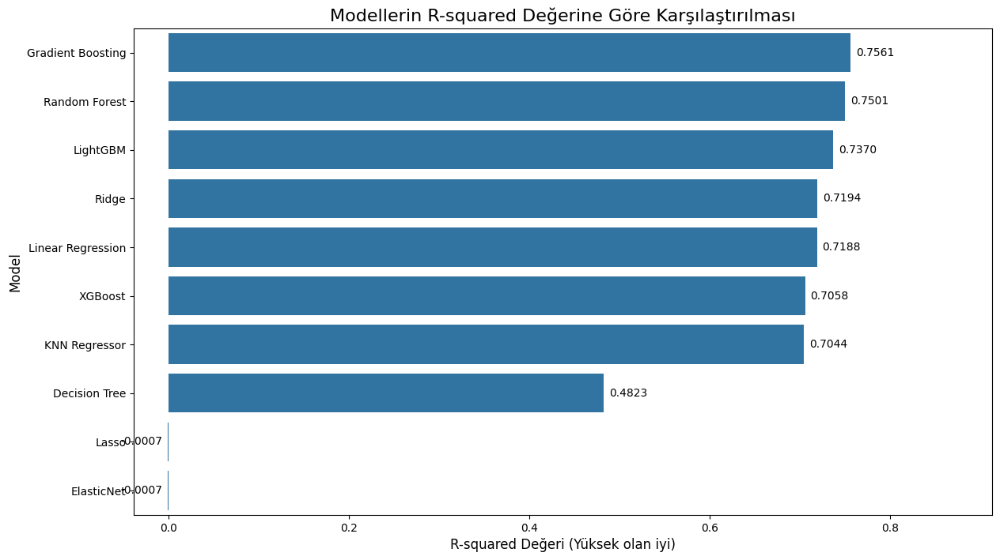

  ✓ Kaydedildi: MLTraining/visualResults-v4Final\model_comparison_adj._r_squared.png


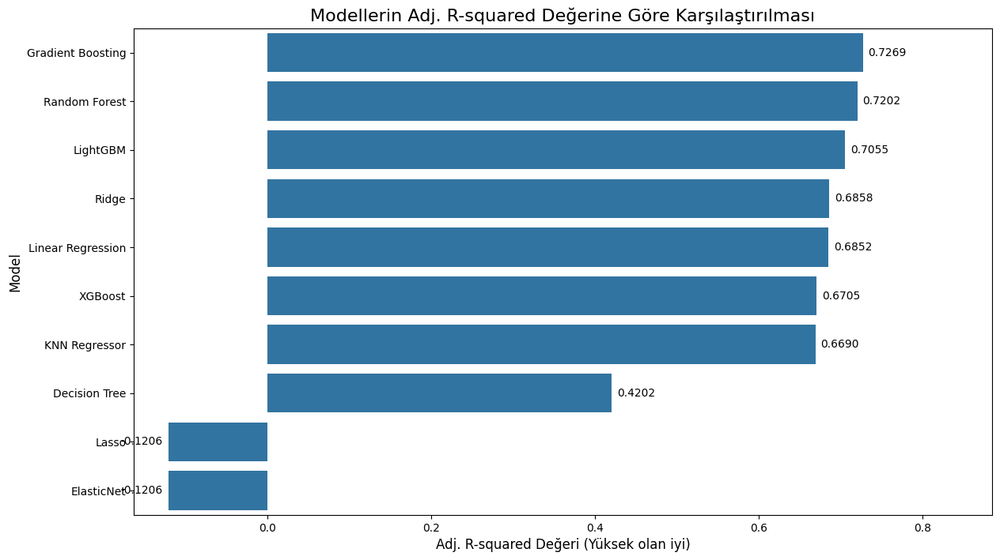

  ✓ Kaydedildi: MLTraining/visualResults-v4Final\model_comparison_rmse.png


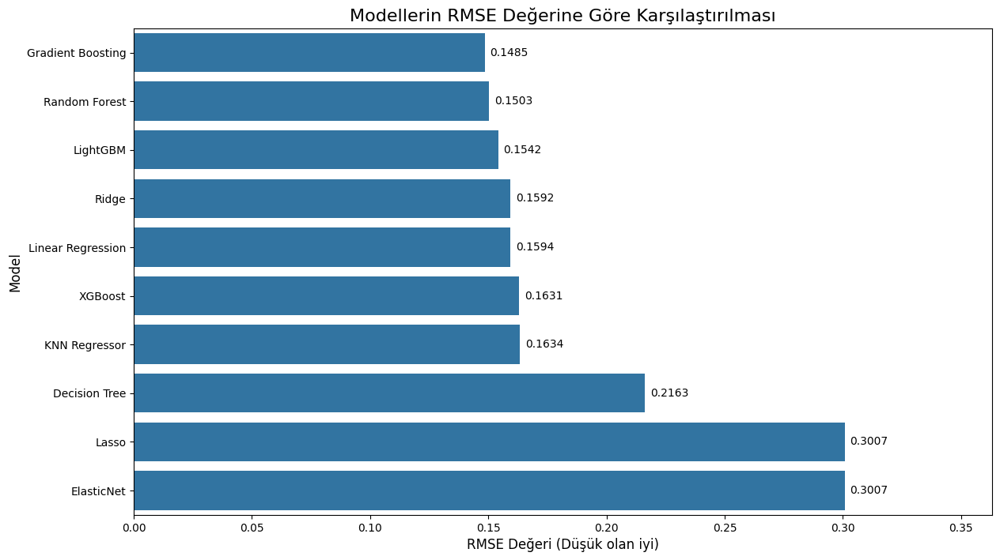

  ✓ Kaydedildi: MLTraining/visualResults-v4Final\model_comparison_mae.png


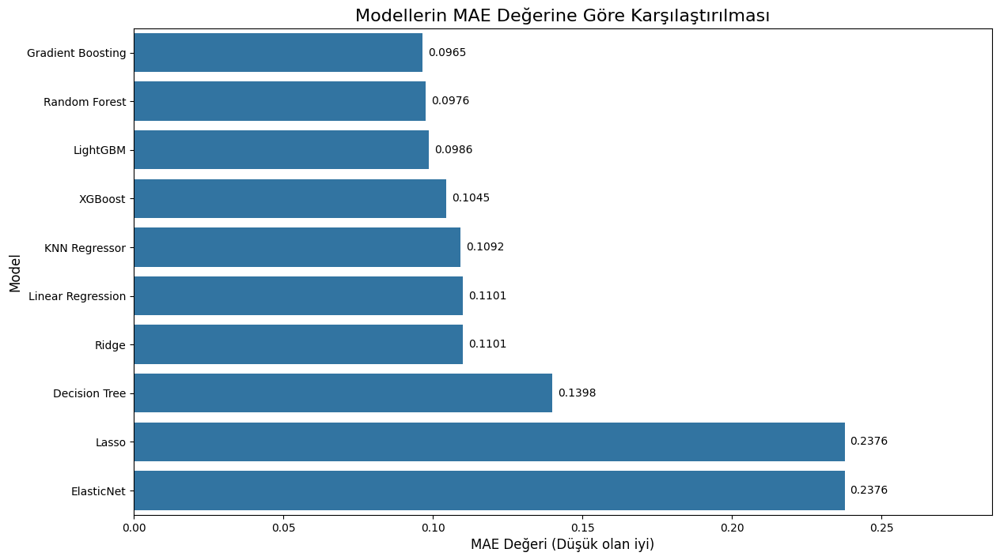

  ✓ Kaydedildi: MLTraining/visualResults-v4Final\model_comparison_eğitim_süresi_sn.png


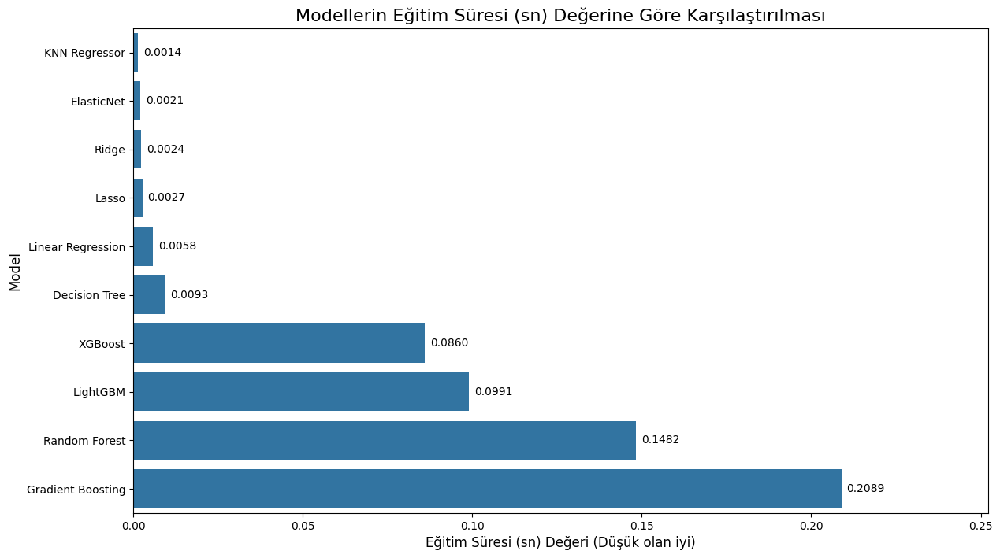


--- Analiz Tamamlandı ---


In [20]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import time
import os
import sys
import warnings

# Sklearn metrikleri ve model seçimi
from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    r2_score, 
    mean_absolute_error, 
    mean_squared_error, 
    median_absolute_error
)

# 1. Lineer Modeller
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet

# 2. Doğrusal Olmayan Modeller
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor

# 3. Ensemble (Topluluk) Modelleri
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
import xgboost as xgb
import lightgbm as lgb

# Uyarıları bastır (özellikle model yakınsama uyarıları için)
warnings.filterwarnings('ignore')
# Pandas float formatını ayarla (daha okunaklı olması için)
pd.set_option('display.float_format', '{:.4f}'.format)


def calculate_adj_r2(r2, n, p):
    """
    R-squared (R2) değerini kullanarak Düzeltilmiş R-squared (Adjusted R2)
    değerini hesaplar.
    
    Args:
        r2 (float): Modelin R-squared skoru.
        n (int): Örneklem sayısı (test setinin satır sayısı).
        p (int): Özellik (feature) sayısı.
    
    Returns:
        float: Hesaplanmış Adjusted R-squared skoru.
    """
    if (n - p - 1) == 0:
        return r2 # Bölme hatasını önle
    return 1 - (1 - r2) * (n - 1) / (n - p - 1)

def compare_regression_models(csv_file_path, target_column, output_viz_dir):
    """
    Bir CSV dosyasını yükler, 10 farklı regresyon modelini eğitir,
    kapsamlı metriklerle karşılaştırır ve sonuçları görselleştirip kaydeder.
    
    Args:
        csv_file_path (str): İşlenecek normalize edilmiş CSV dosyasının yolu.
        target_column (str): Tahmin edilecek hedef kolonun adı (Y).
        output_viz_dir (str): Görselleştirmelerin kaydedileceği klasör.
    """
    
    print(f"--- Model Karşılaştırma Analizi Başlatıldı ---")
    print(f"Veri Seti: {csv_file_path}")
    print(f"Hedef Kolon: {target_column}")
    
    # --- 1. Adım: Veri Yükleme ve Hazırlama ---
    try:
        df = pd.read_csv(csv_file_path)
    except FileNotFoundError:
        print(f"\nHATA: Dosya bulunamadı: {csv_file_path}", file=sys.stderr)
        return
    except Exception as e:
        print(f"\nHATA: Dosya okunurken bir hata oluştu: {e}", file=sys.stderr)
        return

    if df[target_column].isnull().any():
        print(f"Uyarı: Hedef kolonda ({target_column}) {df[target_column].isnull().sum()} adet boş değer bulundu. Bu satırlar analizden çıkarılıyor.")
        df = df.dropna(subset=[target_column])

    y = df[target_column]
    X = df.drop(columns=[target_column], errors='ignore')
    X = X.select_dtypes(include=np.number) 
    
    if X.empty:
        print("\nHATA: Model için kullanılabilir hiçbir özellik (feature) kolonu bulunamadı.", file=sys.stderr)
        return

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    
    print(f"\nVeri seti ayrıldı: {len(X_train)} eğitim, {len(X_test)} test satırı.")
    print(f"Kullanılan özellik (feature) sayısı: {len(X.columns)}")

    n_test = len(X_test)
    p_test = len(X.columns)

    # --- 2. Adım: Modelleri Tanımla ---
    models = {
        "Linear Regression": LinearRegression(),
        "Ridge": Ridge(random_state=42),
        "Lasso": Lasso(random_state=42),
        "ElasticNet": ElasticNet(random_state=42),
        "KNN Regressor": KNeighborsRegressor(),
        "Decision Tree": DecisionTreeRegressor(random_state=42),
        "Random Forest": RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1),
        "Gradient Boosting": GradientBoostingRegressor(n_estimators=100, random_state=42),
        "XGBoost": xgb.XGBRegressor(n_estimators=100, random_state=42, n_jobs=-1),
        "LightGBM": lgb.LGBMRegressor(n_estimators=100, random_state=42, n_jobs=-1, verbose=-1)
    }
    
    # --- 3. Adım: Modelleri Eğit ve Değerlendir ---
    results = [] 
    print("\n--- Modeller Eğitiliyor ve Değerlendiriliyor ---")
    
    for model_name, model in models.items():
        print(f"  Eğitiliyor: {model_name}...")
        
        try:
            start_time = time.time()
            model.fit(X_train, y_train)
            end_time = time.time()
            
            y_pred = model.predict(X_test)
            
            r2 = r2_score(y_test, y_pred)
            adj_r2 = calculate_adj_r2(r2, n_test, p_test)
            mae = mean_absolute_error(y_test, y_pred)
            mse = mean_squared_error(y_test, y_pred)
            rmse = np.sqrt(mse)
            medae = median_absolute_error(y_test, y_pred)
            train_time = end_time - start_time
            
            results.append({
                "Model": model_name,
                "R-squared": r2,
                "Adj. R-squared": adj_r2,
                "MAE": mae,
                "MSE": mse,
                "RMSE": rmse,
                "MedianAE": medae,
                "Eğitim Süresi (sn)": train_time
            })
            
        except Exception as e:
            print(f"    HATA: {model_name} eğitilirken bir hata oluştu: {e}", file=sys.stderr)
            
    if not results:
        print("\nHATA: Hiçbir model başarıyla eğitilemedi.", file=sys.stderr)
        return

    # --- 4. Adım: Sonuçları Raporla (DataFrame) ---
    results_df = pd.DataFrame(results)
    results_df = results_df.sort_values(by="R-squared", ascending=False).reset_index(drop=True)
    
    print("\n\n--- MODEL KARŞILAŞTIRMA RAPORU ---")
    print(results_df.to_markdown(index=False, floatfmt=".4f"))
    
    # --- 5. Adım: Sonuçları Görselleştir ve Kaydet ---
    print(f"\n\n--- Görseller Oluşturuluyor ve '{output_viz_dir}' Klasörüne Kaydediliyor ---")
    
    try:
        os.makedirs(output_viz_dir, exist_ok=True)
    except OSError as e:
        print(f"HATA: Çıktı klasörü oluşturulamadı: {e}", file=sys.stderr)
        return

    metrics_to_plot = ["R-squared", "Adj. R-squared", "RMSE", "MAE", "Eğitim Süresi (sn)"]
    
    for metric in metrics_to_plot:
        ascending_order = False if "R-squared" in metric else True
        
        # Veriyi sırala
        sorted_data = results_df.sort_values(by=metric, ascending=ascending_order)
        
        # <<! GÜNCELLENDİ !>> Figür boyutu etiketlere yer açmak için genişletildi
        plt.figure(figsize=(14, 8)) 
        
        # Sıralanmış veriyi bar plot'a aktar ve 'ax' değişkenine ata
        ax = sns.barplot(
            x=metric, 
            y="Model", 
            data=sorted_data
        )
        
        plt.title(f"Modellerin {metric} Değerine Göre Karşılaştırılması", fontsize=16)
        plt.xlabel(f"{metric} Değeri ({'Yüksek olan iyi' if not ascending_order else 'Düşük olan iyi'})", fontsize=12)
        plt.ylabel("Model", fontsize=12)
        
        # --- <<! YENİ EKLENDİ: Değer Etiketleri !>> ---
        # Barların üzerine sayısal değerleri ekle
        # ax.containers[0], yatay çubuk grubunu temsil eder
        # fmt='%.4f' -> 4 ondalık basamak göster
        # padding=5 -> etiketin bardan 5 piksel sağda durmasını sağlar
        ax.bar_label(ax.containers[0], fmt='%.4f', padding=5)
        
        # Etiketlerin sığması için x ekseni limitini (sağ tarafı) %15 genişlet
        current_xlim = ax.get_xlim()
        ax.set_xlim(current_xlim[0], current_xlim[1] * 1.15) 
        # --- <<! YENİ EKLEME BİTTİ !>> ---

        # Dosya adını oluştur
        filename = f"model_comparison_{metric.lower().replace(' ', '_').replace('-', '_').replace('(', '').replace(')', '')}.png"
        save_path = os.path.join(output_viz_dir, filename)
        
        try:
            plt.savefig(save_path, bbox_inches='tight')
            print(f"  ✓ Kaydedildi: {save_path}")
        except Exception as e:
            print(f"    ✗ HATA: {filename} kaydedilemedi: {e}", file=sys.stderr)
            
        # Grafiği Jupyter'da göster
        plt.show()
        plt.close()

    print("\n--- Analiz Tamamlandı ---")

# --- AYARLAR VE ÇALIŞTIRMA ---

# 1. Girdi Dosyası: Normalizasyon adımından gelen CSV'nin yolu
# <<!>> BU YOLU KENDİ VERİ SETİNİZE GÖRE DEĞİŞTİRİN
INPUT_CSV_PATH = "datasetVersions/kitapyurdu_dataset_v4Final.csv"

# 2. Hedef Kolon: Tahmin etmek istediğiniz kolonun adı
TARGET_COL_NAME = "Toplam Satılma Sayısı"

# 3. Çıktı Klasörü: Görsellerin kaydedileceği yer
# <<!>> İSTERSENİZ BU KLASÖR ADINI DEĞİŞTİREBİLİRSİNİZ
OUTPUT_VIZ_DIR = "MLTraining/visualResults-v4Final"

# Analiz fonksiyonunu çağır
compare_regression_models(
    csv_file_path=INPUT_CSV_PATH,
    target_column=TARGET_COL_NAME,
    output_viz_dir=OUTPUT_VIZ_DIR
)

---
### **2) kitapyurdu_dataset_v4-nokagitcinsiFinal.csv Veri Setinin Performansını Görelim.**

--- Model Karşılaştırma Analizi Başlatıldı ---
Veri Seti: datasetVersions/kitapyurdu_dataset_v4-nokagitcinsiFinal.csv
Hedef Kolon: Toplam Satılma Sayısı

Veri seti ayrıldı: 1197 eğitim, 300 test satırı.
Kullanılan özellik (feature) sayısı: 31

--- Modeller Eğitiliyor ve Değerlendiriliyor ---
  Eğitiliyor: Linear Regression...
  Eğitiliyor: Ridge...
  Eğitiliyor: Lasso...
  Eğitiliyor: ElasticNet...
  Eğitiliyor: KNN Regressor...
  Eğitiliyor: Decision Tree...
  Eğitiliyor: Random Forest...
  Eğitiliyor: Gradient Boosting...
  Eğitiliyor: XGBoost...
  Eğitiliyor: LightGBM...


--- MODEL KARŞILAŞTIRMA RAPORU ---
| Model             |   R-squared |   Adj. R-squared |    MAE |    MSE |   RMSE |   MedianAE |   Eğitim Süresi (sn) |
|:------------------|------------:|-----------------:|-------:|-------:|-------:|-----------:|---------------------:|
| Gradient Boosting |      0.7560 |           0.7278 | 0.0965 | 0.0221 | 0.1485 |     0.0680 |               0.2314 |
| Random Forest     |      0

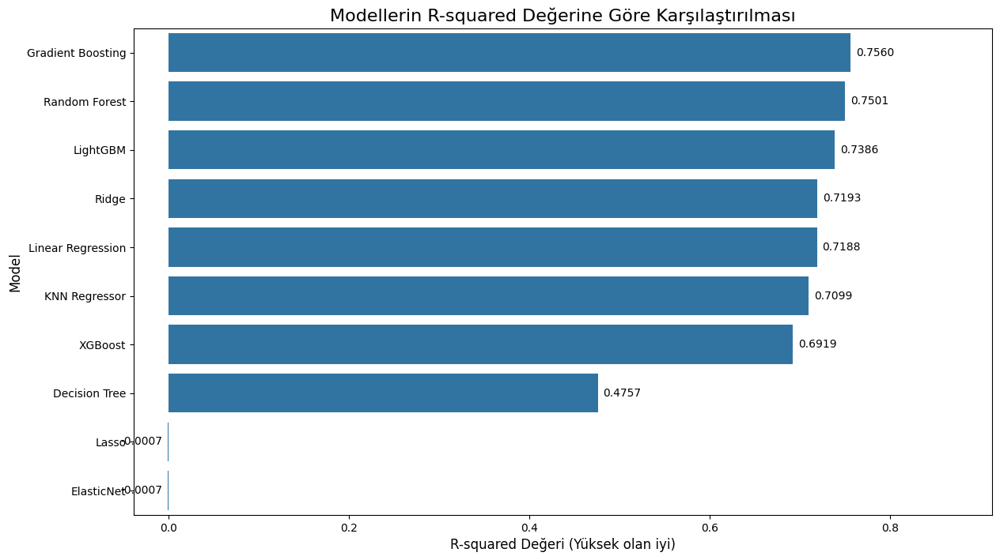

  ✓ Kaydedildi: MLTraining/visualResults-v4nokagitcinsiFinal\model_comparison_adj._r_squared.png


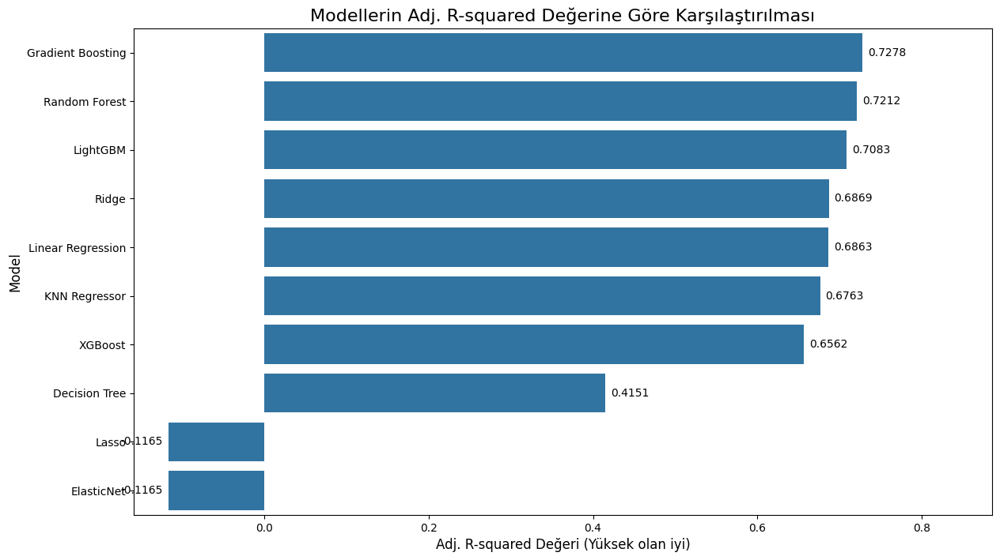

  ✓ Kaydedildi: MLTraining/visualResults-v4nokagitcinsiFinal\model_comparison_rmse.png


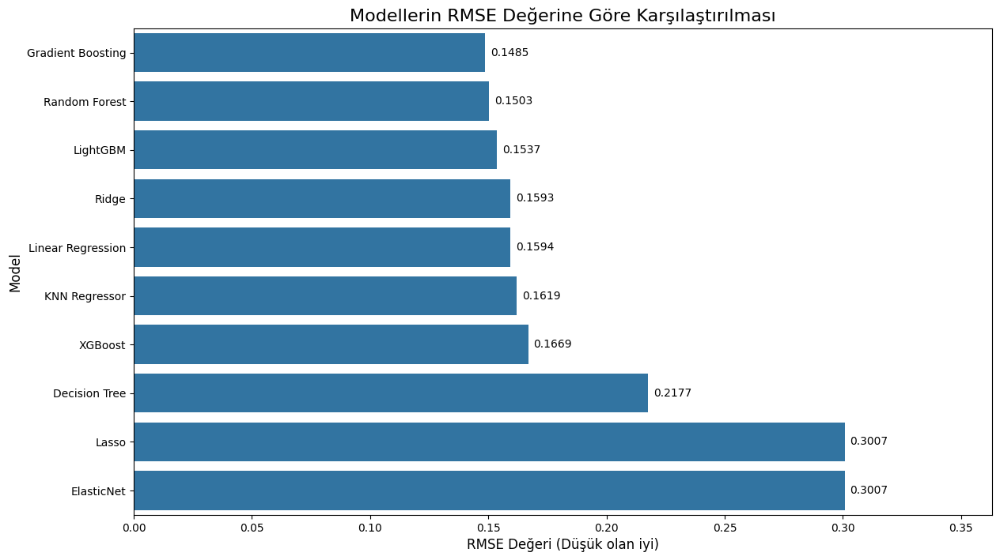

  ✓ Kaydedildi: MLTraining/visualResults-v4nokagitcinsiFinal\model_comparison_mae.png


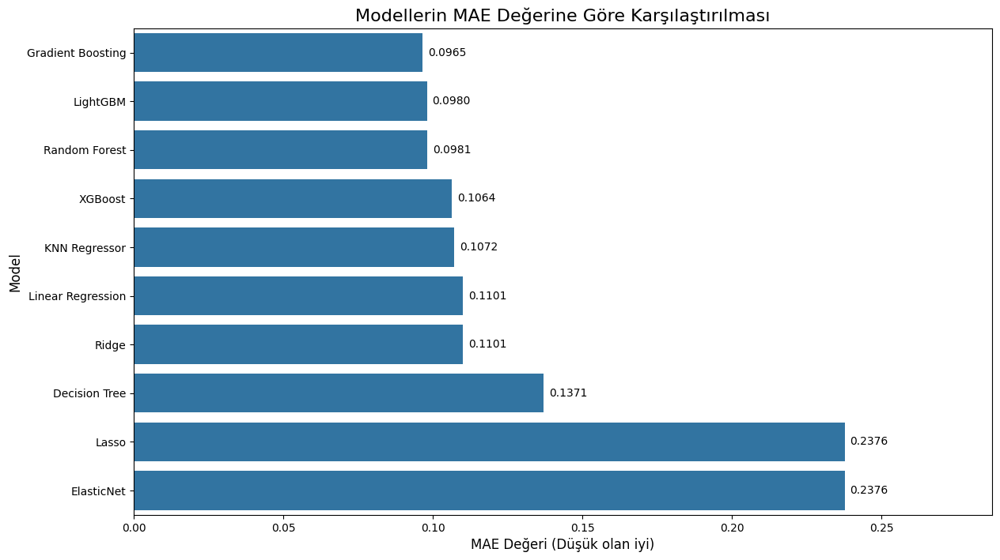

  ✓ Kaydedildi: MLTraining/visualResults-v4nokagitcinsiFinal\model_comparison_eğitim_süresi_sn.png


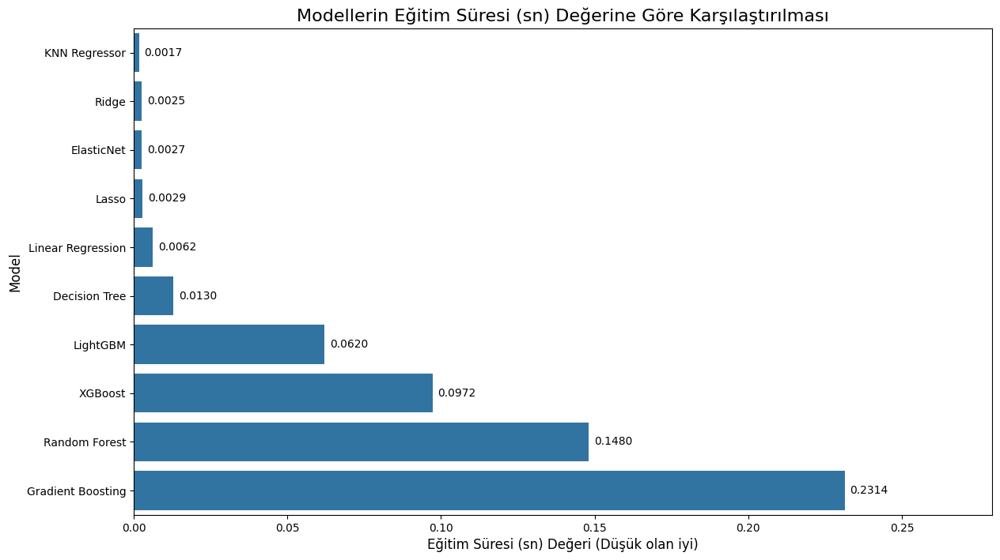


--- Analiz Tamamlandı ---


In [23]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import time
import os
import sys
import warnings

# Sklearn metrikleri ve model seçimi
from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    r2_score, 
    mean_absolute_error, 
    mean_squared_error, 
    median_absolute_error
)

# 1. Lineer Modeller
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet

# 2. Doğrusal Olmayan Modeller
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor

# 3. Ensemble (Topluluk) Modelleri
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
import xgboost as xgb
import lightgbm as lgb

# Uyarıları bastır (özellikle model yakınsama uyarıları için)
warnings.filterwarnings('ignore')
# Pandas float formatını ayarla (daha okunaklı olması için)
pd.set_option('display.float_format', '{:.4f}'.format)


def calculate_adj_r2(r2, n, p):
    """
    R-squared (R2) değerini kullanarak Düzeltilmiş R-squared (Adjusted R2)
    değerini hesaplar.
    
    Args:
        r2 (float): Modelin R-squared skoru.
        n (int): Örneklem sayısı (test setinin satır sayısı).
        p (int): Özellik (feature) sayısı.
    
    Returns:
        float: Hesaplanmış Adjusted R-squared skoru.
    """
    if (n - p - 1) == 0:
        return r2 # Bölme hatasını önle
    return 1 - (1 - r2) * (n - 1) / (n - p - 1)

def compare_regression_models(csv_file_path, target_column, output_viz_dir):
    """
    Bir CSV dosyasını yükler, 10 farklı regresyon modelini eğitir,
    kapsamlı metriklerle karşılaştırır ve sonuçları görselleştirip kaydeder.
    
    Args:
        csv_file_path (str): İşlenecek normalize edilmiş CSV dosyasının yolu.
        target_column (str): Tahmin edilecek hedef kolonun adı (Y).
        output_viz_dir (str): Görselleştirmelerin kaydedileceği klasör.
    """
    
    print(f"--- Model Karşılaştırma Analizi Başlatıldı ---")
    print(f"Veri Seti: {csv_file_path}")
    print(f"Hedef Kolon: {target_column}")
    
    # --- 1. Adım: Veri Yükleme ve Hazırlama ---
    try:
        df = pd.read_csv(csv_file_path)
    except FileNotFoundError:
        print(f"\nHATA: Dosya bulunamadı: {csv_file_path}", file=sys.stderr)
        return
    except Exception as e:
        print(f"\nHATA: Dosya okunurken bir hata oluştu: {e}", file=sys.stderr)
        return

    if df[target_column].isnull().any():
        print(f"Uyarı: Hedef kolonda ({target_column}) {df[target_column].isnull().sum()} adet boş değer bulundu. Bu satırlar analizden çıkarılıyor.")
        df = df.dropna(subset=[target_column])

    y = df[target_column]
    X = df.drop(columns=[target_column], errors='ignore')
    X = X.select_dtypes(include=np.number) 
    
    if X.empty:
        print("\nHATA: Model için kullanılabilir hiçbir özellik (feature) kolonu bulunamadı.", file=sys.stderr)
        return

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    
    print(f"\nVeri seti ayrıldı: {len(X_train)} eğitim, {len(X_test)} test satırı.")
    print(f"Kullanılan özellik (feature) sayısı: {len(X.columns)}")

    n_test = len(X_test)
    p_test = len(X.columns)

    # --- 2. Adım: Modelleri Tanımla ---
    models = {
        "Linear Regression": LinearRegression(),
        "Ridge": Ridge(random_state=42),
        "Lasso": Lasso(random_state=42),
        "ElasticNet": ElasticNet(random_state=42),
        "KNN Regressor": KNeighborsRegressor(),
        "Decision Tree": DecisionTreeRegressor(random_state=42),
        "Random Forest": RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1),
        "Gradient Boosting": GradientBoostingRegressor(n_estimators=100, random_state=42),
        "XGBoost": xgb.XGBRegressor(n_estimators=100, random_state=42, n_jobs=-1),
        "LightGBM": lgb.LGBMRegressor(n_estimators=100, random_state=42, n_jobs=-1, verbose=-1)
    }
    
    # --- 3. Adım: Modelleri Eğit ve Değerlendir ---
    results = [] 
    print("\n--- Modeller Eğitiliyor ve Değerlendiriliyor ---")
    
    for model_name, model in models.items():
        print(f"  Eğitiliyor: {model_name}...")
        
        try:
            start_time = time.time()
            model.fit(X_train, y_train)
            end_time = time.time()
            
            y_pred = model.predict(X_test)
            
            r2 = r2_score(y_test, y_pred)
            adj_r2 = calculate_adj_r2(r2, n_test, p_test)
            mae = mean_absolute_error(y_test, y_pred)
            mse = mean_squared_error(y_test, y_pred)
            rmse = np.sqrt(mse)
            medae = median_absolute_error(y_test, y_pred)
            train_time = end_time - start_time
            
            results.append({
                "Model": model_name,
                "R-squared": r2,
                "Adj. R-squared": adj_r2,
                "MAE": mae,
                "MSE": mse,
                "RMSE": rmse,
                "MedianAE": medae,
                "Eğitim Süresi (sn)": train_time
            })
            
        except Exception as e:
            print(f"    HATA: {model_name} eğitilirken bir hata oluştu: {e}", file=sys.stderr)
            
    if not results:
        print("\nHATA: Hiçbir model başarıyla eğitilemedi.", file=sys.stderr)
        return

    # --- 4. Adım: Sonuçları Raporla (DataFrame) ---
    results_df = pd.DataFrame(results)
    results_df = results_df.sort_values(by="R-squared", ascending=False).reset_index(drop=True)
    
    print("\n\n--- MODEL KARŞILAŞTIRMA RAPORU ---")
    print(results_df.to_markdown(index=False, floatfmt=".4f"))
    
    # --- 5. Adım: Sonuçları Görselleştir ve Kaydet ---
    print(f"\n\n--- Görseller Oluşturuluyor ve '{output_viz_dir}' Klasörüne Kaydediliyor ---")
    
    try:
        os.makedirs(output_viz_dir, exist_ok=True)
    except OSError as e:
        print(f"HATA: Çıktı klasörü oluşturulamadı: {e}", file=sys.stderr)
        return

    metrics_to_plot = ["R-squared", "Adj. R-squared", "RMSE", "MAE", "Eğitim Süresi (sn)"]
    
    for metric in metrics_to_plot:
        ascending_order = False if "R-squared" in metric else True
        
        # Veriyi sırala
        sorted_data = results_df.sort_values(by=metric, ascending=ascending_order)
        
        # <<! GÜNCELLENDİ !>> Figür boyutu etiketlere yer açmak için genişletildi
        plt.figure(figsize=(14, 8)) 
        
        # Sıralanmış veriyi bar plot'a aktar ve 'ax' değişkenine ata
        ax = sns.barplot(
            x=metric, 
            y="Model", 
            data=sorted_data
        )
        
        plt.title(f"Modellerin {metric} Değerine Göre Karşılaştırılması", fontsize=16)
        plt.xlabel(f"{metric} Değeri ({'Yüksek olan iyi' if not ascending_order else 'Düşük olan iyi'})", fontsize=12)
        plt.ylabel("Model", fontsize=12)
        
        # --- <<! YENİ EKLENDİ: Değer Etiketleri !>> ---
        # Barların üzerine sayısal değerleri ekle
        # ax.containers[0], yatay çubuk grubunu temsil eder
        # fmt='%.4f' -> 4 ondalık basamak göster
        # padding=5 -> etiketin bardan 5 piksel sağda durmasını sağlar
        ax.bar_label(ax.containers[0], fmt='%.4f', padding=5)
        
        # Etiketlerin sığması için x ekseni limitini (sağ tarafı) %15 genişlet
        current_xlim = ax.get_xlim()
        ax.set_xlim(current_xlim[0], current_xlim[1] * 1.15) 
        # --- <<! YENİ EKLEME BİTTİ !>> ---

        # Dosya adını oluştur
        filename = f"model_comparison_{metric.lower().replace(' ', '_').replace('-', '_').replace('(', '').replace(')', '')}.png"
        save_path = os.path.join(output_viz_dir, filename)
        
        try:
            plt.savefig(save_path, bbox_inches='tight')
            print(f"  ✓ Kaydedildi: {save_path}")
        except Exception as e:
            print(f"    ✗ HATA: {filename} kaydedilemedi: {e}", file=sys.stderr)
            
        # Grafiği Jupyter'da göster
        plt.show()
        plt.close()

    print("\n--- Analiz Tamamlandı ---")

# --- AYARLAR VE ÇALIŞTIRMA ---

# 1. Girdi Dosyası: Normalizasyon adımından gelen CSV'nin yolu
# <<!>> BU YOLU KENDİ VERİ SETİNİZE GÖRE DEĞİŞTİRİN
INPUT_CSV_PATH = "datasetVersions/kitapyurdu_dataset_v4-nokagitcinsiFinal.csv"

# 2. Hedef Kolon: Tahmin etmek istediğiniz kolonun adı
TARGET_COL_NAME = "Toplam Satılma Sayısı"

# 3. Çıktı Klasörü: Görsellerin kaydedileceği yer
# <<!>> İSTERSENİZ BU KLASÖR ADINI DEĞİŞTİREBİLİRSİNİZ
OUTPUT_VIZ_DIR = "MLTraining/visualResults-v4nokagitcinsiFinal"

# Analiz fonksiyonunu çağır
compare_regression_models(
    csv_file_path=INPUT_CSV_PATH,
    target_column=TARGET_COL_NAME,
    output_viz_dir=OUTPUT_VIZ_DIR
)

---
### **3) kitapyurdu_dataset_v4-noyayinevinokategorinokagitcinsiFinal.csv Veri Setinin Performansını Görelim.**

--- Model Karşılaştırma Analizi Başlatıldı ---
Veri Seti: datasetVersions/kitapyurdu_dataset_v4-noyayinevinokategorinokagitcinsiFinal.csv
Hedef Kolon: Toplam Satılma Sayısı

Veri seti ayrıldı: 1197 eğitim, 300 test satırı.
Kullanılan özellik (feature) sayısı: 12

--- Modeller Eğitiliyor ve Değerlendiriliyor ---
  Eğitiliyor: Linear Regression...
  Eğitiliyor: Ridge...
  Eğitiliyor: Lasso...
  Eğitiliyor: ElasticNet...
  Eğitiliyor: KNN Regressor...
  Eğitiliyor: Decision Tree...
  Eğitiliyor: Random Forest...
  Eğitiliyor: Gradient Boosting...
  Eğitiliyor: XGBoost...
  Eğitiliyor: LightGBM...


--- MODEL KARŞILAŞTIRMA RAPORU ---
| Model             |   R-squared |   Adj. R-squared |    MAE |    MSE |   RMSE |   MedianAE |   Eğitim Süresi (sn) |
|:------------------|------------:|-----------------:|-------:|-------:|-------:|-----------:|---------------------:|
| Gradient Boosting |      0.7303 |           0.7190 | 0.1037 | 0.0244 | 0.1561 |     0.0741 |               0.1976 |
| Random

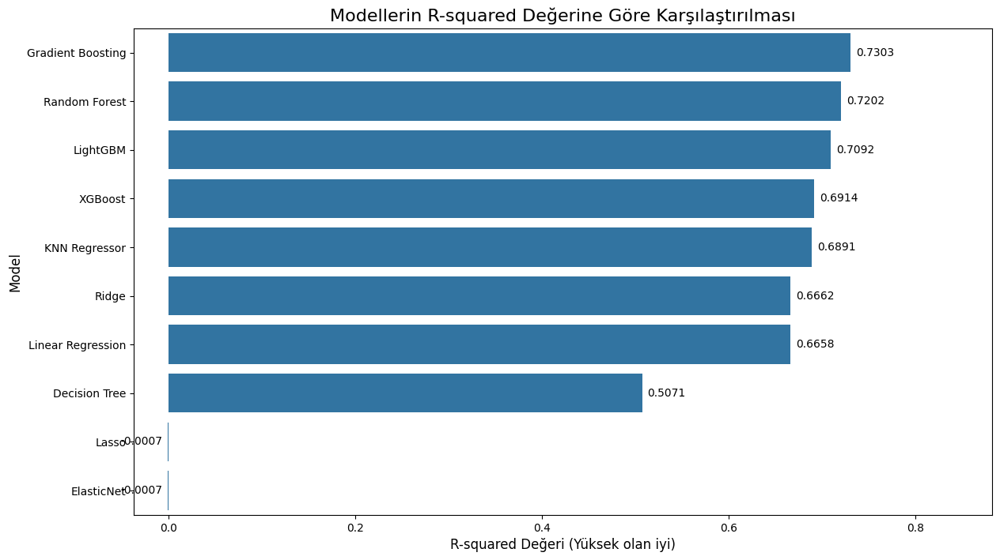

  ✓ Kaydedildi: MLTraining/visualResults-v4noyayinevinokategorinokagitcinsiFinal\model_comparison_adj._r_squared.png


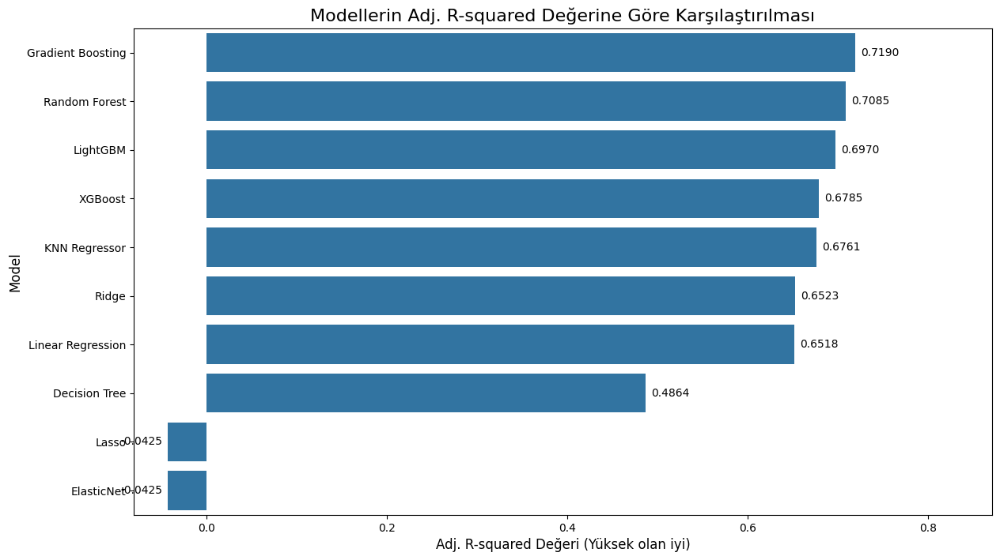

  ✓ Kaydedildi: MLTraining/visualResults-v4noyayinevinokategorinokagitcinsiFinal\model_comparison_rmse.png


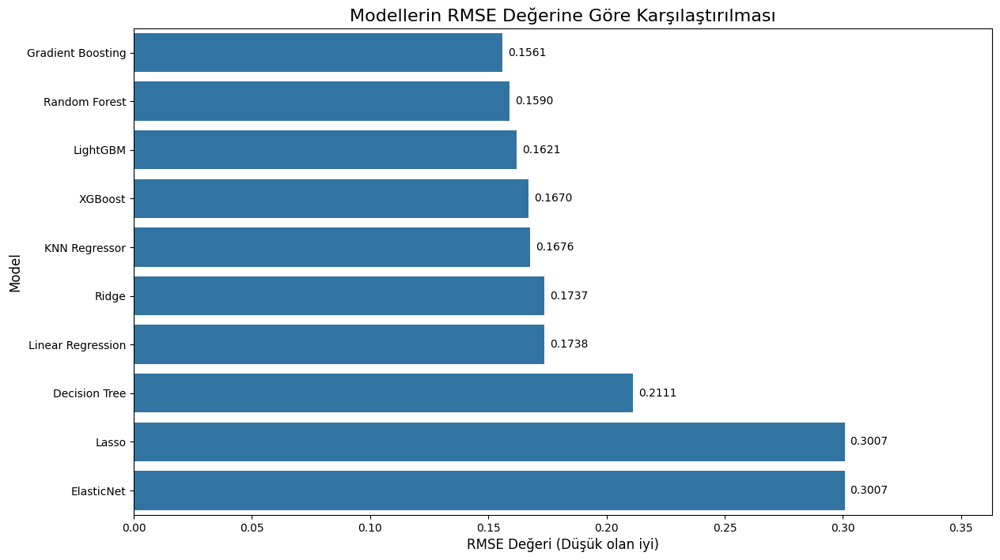

  ✓ Kaydedildi: MLTraining/visualResults-v4noyayinevinokategorinokagitcinsiFinal\model_comparison_mae.png


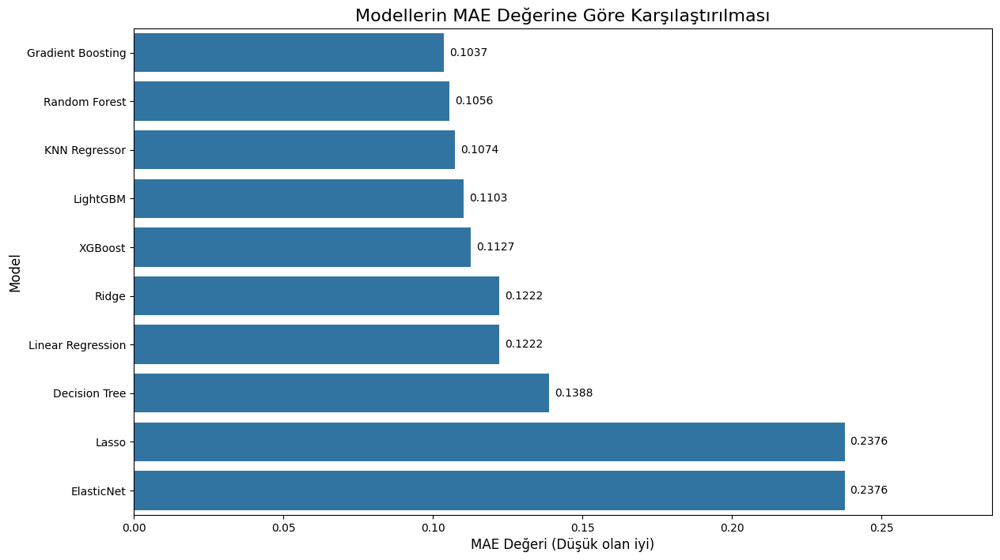

  ✓ Kaydedildi: MLTraining/visualResults-v4noyayinevinokategorinokagitcinsiFinal\model_comparison_eğitim_süresi_sn.png


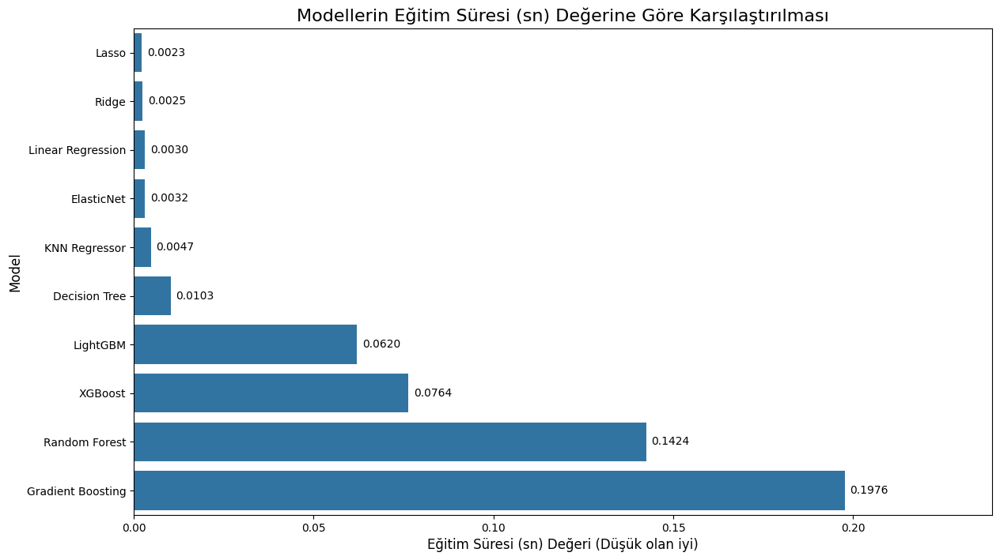


--- Analiz Tamamlandı ---


In [25]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import time
import os
import sys
import warnings

# Sklearn metrikleri ve model seçimi
from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    r2_score, 
    mean_absolute_error, 
    mean_squared_error, 
    median_absolute_error
)

# 1. Lineer Modeller
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet

# 2. Doğrusal Olmayan Modeller
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor

# 3. Ensemble (Topluluk) Modelleri
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
import xgboost as xgb
import lightgbm as lgb

# Uyarıları bastır (özellikle model yakınsama uyarıları için)
warnings.filterwarnings('ignore')
# Pandas float formatını ayarla (daha okunaklı olması için)
pd.set_option('display.float_format', '{:.4f}'.format)


def calculate_adj_r2(r2, n, p):
    """
    R-squared (R2) değerini kullanarak Düzeltilmiş R-squared (Adjusted R2)
    değerini hesaplar.
    
    Args:
        r2 (float): Modelin R-squared skoru.
        n (int): Örneklem sayısı (test setinin satır sayısı).
        p (int): Özellik (feature) sayısı.
    
    Returns:
        float: Hesaplanmış Adjusted R-squared skoru.
    """
    if (n - p - 1) == 0:
        return r2 # Bölme hatasını önle
    return 1 - (1 - r2) * (n - 1) / (n - p - 1)

def compare_regression_models(csv_file_path, target_column, output_viz_dir):
    """
    Bir CSV dosyasını yükler, 10 farklı regresyon modelini eğitir,
    kapsamlı metriklerle karşılaştırır ve sonuçları görselleştirip kaydeder.
    
    Args:
        csv_file_path (str): İşlenecek normalize edilmiş CSV dosyasının yolu.
        target_column (str): Tahmin edilecek hedef kolonun adı (Y).
        output_viz_dir (str): Görselleştirmelerin kaydedileceği klasör.
    """
    
    print(f"--- Model Karşılaştırma Analizi Başlatıldı ---")
    print(f"Veri Seti: {csv_file_path}")
    print(f"Hedef Kolon: {target_column}")
    
    # --- 1. Adım: Veri Yükleme ve Hazırlama ---
    try:
        df = pd.read_csv(csv_file_path)
    except FileNotFoundError:
        print(f"\nHATA: Dosya bulunamadı: {csv_file_path}", file=sys.stderr)
        return
    except Exception as e:
        print(f"\nHATA: Dosya okunurken bir hata oluştu: {e}", file=sys.stderr)
        return

    if df[target_column].isnull().any():
        print(f"Uyarı: Hedef kolonda ({target_column}) {df[target_column].isnull().sum()} adet boş değer bulundu. Bu satırlar analizden çıkarılıyor.")
        df = df.dropna(subset=[target_column])

    y = df[target_column]
    X = df.drop(columns=[target_column], errors='ignore')
    X = X.select_dtypes(include=np.number) 
    
    if X.empty:
        print("\nHATA: Model için kullanılabilir hiçbir özellik (feature) kolonu bulunamadı.", file=sys.stderr)
        return

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    
    print(f"\nVeri seti ayrıldı: {len(X_train)} eğitim, {len(X_test)} test satırı.")
    print(f"Kullanılan özellik (feature) sayısı: {len(X.columns)}")

    n_test = len(X_test)
    p_test = len(X.columns)

    # --- 2. Adım: Modelleri Tanımla ---
    models = {
        "Linear Regression": LinearRegression(),
        "Ridge": Ridge(random_state=42),
        "Lasso": Lasso(random_state=42),
        "ElasticNet": ElasticNet(random_state=42),
        "KNN Regressor": KNeighborsRegressor(),
        "Decision Tree": DecisionTreeRegressor(random_state=42),
        "Random Forest": RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1),
        "Gradient Boosting": GradientBoostingRegressor(n_estimators=100, random_state=42),
        "XGBoost": xgb.XGBRegressor(n_estimators=100, random_state=42, n_jobs=-1),
        "LightGBM": lgb.LGBMRegressor(n_estimators=100, random_state=42, n_jobs=-1, verbose=-1)
    }
    
    # --- 3. Adım: Modelleri Eğit ve Değerlendir ---
    results = [] 
    print("\n--- Modeller Eğitiliyor ve Değerlendiriliyor ---")
    
    for model_name, model in models.items():
        print(f"  Eğitiliyor: {model_name}...")
        
        try:
            start_time = time.time()
            model.fit(X_train, y_train)
            end_time = time.time()
            
            y_pred = model.predict(X_test)
            
            r2 = r2_score(y_test, y_pred)
            adj_r2 = calculate_adj_r2(r2, n_test, p_test)
            mae = mean_absolute_error(y_test, y_pred)
            mse = mean_squared_error(y_test, y_pred)
            rmse = np.sqrt(mse)
            medae = median_absolute_error(y_test, y_pred)
            train_time = end_time - start_time
            
            results.append({
                "Model": model_name,
                "R-squared": r2,
                "Adj. R-squared": adj_r2,
                "MAE": mae,
                "MSE": mse,
                "RMSE": rmse,
                "MedianAE": medae,
                "Eğitim Süresi (sn)": train_time
            })
            
        except Exception as e:
            print(f"    HATA: {model_name} eğitilirken bir hata oluştu: {e}", file=sys.stderr)
            
    if not results:
        print("\nHATA: Hiçbir model başarıyla eğitilemedi.", file=sys.stderr)
        return

    # --- 4. Adım: Sonuçları Raporla (DataFrame) ---
    results_df = pd.DataFrame(results)
    results_df = results_df.sort_values(by="R-squared", ascending=False).reset_index(drop=True)
    
    print("\n\n--- MODEL KARŞILAŞTIRMA RAPORU ---")
    print(results_df.to_markdown(index=False, floatfmt=".4f"))
    
    # --- 5. Adım: Sonuçları Görselleştir ve Kaydet ---
    print(f"\n\n--- Görseller Oluşturuluyor ve '{output_viz_dir}' Klasörüne Kaydediliyor ---")
    
    try:
        os.makedirs(output_viz_dir, exist_ok=True)
    except OSError as e:
        print(f"HATA: Çıktı klasörü oluşturulamadı: {e}", file=sys.stderr)
        return

    metrics_to_plot = ["R-squared", "Adj. R-squared", "RMSE", "MAE", "Eğitim Süresi (sn)"]
    
    for metric in metrics_to_plot:
        ascending_order = False if "R-squared" in metric else True
        
        # Veriyi sırala
        sorted_data = results_df.sort_values(by=metric, ascending=ascending_order)
        
        # <<! GÜNCELLENDİ !>> Figür boyutu etiketlere yer açmak için genişletildi
        plt.figure(figsize=(14, 8)) 
        
        # Sıralanmış veriyi bar plot'a aktar ve 'ax' değişkenine ata
        ax = sns.barplot(
            x=metric, 
            y="Model", 
            data=sorted_data
        )
        
        plt.title(f"Modellerin {metric} Değerine Göre Karşılaştırılması", fontsize=16)
        plt.xlabel(f"{metric} Değeri ({'Yüksek olan iyi' if not ascending_order else 'Düşük olan iyi'})", fontsize=12)
        plt.ylabel("Model", fontsize=12)
        
        # --- <<! YENİ EKLENDİ: Değer Etiketleri !>> ---
        # Barların üzerine sayısal değerleri ekle
        # ax.containers[0], yatay çubuk grubunu temsil eder
        # fmt='%.4f' -> 4 ondalık basamak göster
        # padding=5 -> etiketin bardan 5 piksel sağda durmasını sağlar
        ax.bar_label(ax.containers[0], fmt='%.4f', padding=5)
        
        # Etiketlerin sığması için x ekseni limitini (sağ tarafı) %15 genişlet
        current_xlim = ax.get_xlim()
        ax.set_xlim(current_xlim[0], current_xlim[1] * 1.15) 
        # --- <<! YENİ EKLEME BİTTİ !>> ---

        # Dosya adını oluştur
        filename = f"model_comparison_{metric.lower().replace(' ', '_').replace('-', '_').replace('(', '').replace(')', '')}.png"
        save_path = os.path.join(output_viz_dir, filename)
        
        try:
            plt.savefig(save_path, bbox_inches='tight')
            print(f"  ✓ Kaydedildi: {save_path}")
        except Exception as e:
            print(f"    ✗ HATA: {filename} kaydedilemedi: {e}", file=sys.stderr)
            
        # Grafiği Jupyter'da göster
        plt.show()
        plt.close()

    print("\n--- Analiz Tamamlandı ---")

# --- AYARLAR VE ÇALIŞTIRMA ---

# 1. Girdi Dosyası: Normalizasyon adımından gelen CSV'nin yolu
# <<!>> BU YOLU KENDİ VERİ SETİNİZE GÖRE DEĞİŞTİRİN
INPUT_CSV_PATH = "datasetVersions/kitapyurdu_dataset_v4-noyayinevinokategorinokagitcinsiFinal.csv"

# 2. Hedef Kolon: Tahmin etmek istediğiniz kolonun adı
TARGET_COL_NAME = "Toplam Satılma Sayısı"

# 3. Çıktı Klasörü: Görsellerin kaydedileceği yer
# <<!>> İSTERSENİZ BU KLASÖR ADINI DEĞİŞTİREBİLİRSİNİZ
OUTPUT_VIZ_DIR = "MLTraining/visualResults-v4noyayinevinokategorinokagitcinsiFinal"

# Analiz fonksiyonunu çağır
compare_regression_models(
    csv_file_path=INPUT_CSV_PATH,
    target_column=TARGET_COL_NAME,
    output_viz_dir=OUTPUT_VIZ_DIR
)

# **Model Karşılaştırma Analizi: Sonuçlar ve Gelecek Adımlar**

## **1. Analiz Özeti ve Kazanan Model : GRADIENT BOOSTING!**

Yapılan kapsamlı regresyon analizi sonucunda, 10 farklı makine öğrenmesi algoritması test edilmiştir. Bu testler sonucunda, **Gradient Boosting Regressor** algoritması, diğer tüm modellere kıyasla tutarlı bir şekilde en iyi performansı gösteren model olarak belirlenmiştir.

## **2. Performans Değerlendirmesi**

Gradient Boosting'in başarısı, temel başarı metrikleri arasındaki dengeli ve üstün skorlarına dayanmaktadır:

* **Yüksek Açıklayıcılık (R²):** Model, hedef değişkendeki (Toplam Satılma Sayısı) varyansı açıklamada en yüksek **$R^2$ (Belirlilik Katsayısı)** skorunu elde etmiştir. Bu, modelin veri setindeki desenleri en iyi anlayan model olduğunu göstermektedir.
* **Düşük Hata Oranları (RMSE & MAE):** Model, hem **$RMSE$ (Karesel Ortalama Hatanın Karekökü)** hem de **$MAE$ (Ortalama Mutlak Hata)** metriklerinde en düşük değerleri vermiştir. Bu, modelin tahminlerinin gerçek değerlere *en yakın* ve *en tutarlı* tahminler olduğu anlamına gelir.
* **Eğitim Süresi Değerlendirmesi:** Gradient Boosting'in eğitim süresi (yaklaşık 0.2 saniye), bazı basit lineer modellere göre bir miktar daha uzun olsa da, bu durum bir sorun teşkil etmemektedir. Veri setimizin mevcut boyutu göz önüne alındığında, bu süre son derece makuldür. Modelin sağladığı yüksek doğruluk, bu cüzi zaman maliyetini fazlasıyla haklı çıkarmaktadır.

## **3. Zirve Performans: En İyi Veri Seti Sonuçları**

Model, test edilen çeşitli veri setleri arasında en iyi performansını aşağıdaki veri seti ile göstermiştir:

* **Veri Seti:** `kitapyurdu_dataset_v4-nokagitcinsiFinal.csv`
* **Elde Edilen Skorlar:**
    * **$R^2$:** 0.7560
    * **Adj. $R^2$:** 0.7278
    * **$RMSE$:** 0.1485
    * **$MAE$:** 0.0965

Bu metrikler, modelin bu spesifik veri üzerinde oldukça başarılı ve güvenilir tahminler üretebildiğini doğrulamaktadır.



# **5) Modelin Servis Edilmesi (API)**

Model seçim ve değerlendirme aşaması başarıyla tamamlanmıştır. Projenin bir sonraki aşaması, bu kanıtlanmış modeli operasyonel hale getirmektir.

**Plan:**
Seçilen **Gradient Boosting** modeli, ayrı bir Python script'ine alınacak ve (FastAPI) bir **API (Application Programming Interface)** olarak servis edilecektir. Bu sayede, modelin tahmin yetenekleri diğer uygulamalar veya sistemler tarafından kolayca tüketilebilir hale getirilecektir.

# Modelin FastAPI ile Servis Edilmesi (Deployment)

Bu aşamada, veri analizini tamamlayıp en iyi model olarak belirlediğimiz **Gradient Boosting Regressor**'ı, gerçek dünya tahminleri yapabilmesi için bir web servisi (API) haline getirdik.

Bu süreç, bir veri bilimi projesini statik bir notebook'tan, dinamik ve interaktif bir uygulamaya dönüştürmüştür. Kullandığımız teknoloji, yüksek performanslı bir Python web çatısı olan **FastAPI**'dir.

Mimari üç ana bileşenden oluşmaktadır:
        **MLDeploymentAPI/**
1.  **`train_model.py` (Model Eğitim Betiği)**
2.  **`main.py` (FastAPI Sunucusu)**
3.  **`index.html` (Dinamik Frontend Arayüzü)**

---

## 1. Model Eğitim Betiği (`train_model.py`)

API'nin çalışması için gerekli olan "üretim (production)" dosyalarını oluşturmak için **bir kez** çalıştırılan bir betiktir.

* **Girdi:** Normalize *edilmemiş* (`"datasetVersions/kitapyurdu_dataset_v3-nokagitcinsi.csv"`) veriyi kullandı.
* **Amaç:** API'nin yeni veriyi işleyebilmesi için gerekli olan ön-işleme (preprocessing) adımlarını ve modeli kaydetmek.
* **Çıktılar (3 Kritik Dosya):**
    1.  **`scaler.joblib`:** API'ye gelen yeni verileri (örn: `Sayfa Sayısı: 300`) nasıl normalize edeceğini (min/max değerlerini) bilen, eğitilmiş `MinMaxScaler` nesnesi.
    2.  **`model_features.json`:** Modelin eğitildiği **tüm özelliklerin (feature) listesini ve sırasını** içeren bir JSON dosyası. Bu, API'ye gelen verinin doğru sırada modele beslenmesini garanti eder.
    3.  **`gbr_model.joblib`:** Normalize edilmiş verilerle eğitilmiş son Gradient Boosting modelimiz.

## 2. API Sunucusu (`main.py`)

Projenin beyni olan FastAPI sunucusudur. `uvicorn` (veya `python -m uvicorn`) ile çalıştırılır.

* **Başlangıçta:** Sunucu başlarken yukarıdaki 3 dosyayı (`scaler.joblib`, `model_features.json`, `gbr_model.joblib`) hafızaya yükler.
* **Sunduğu Endpoint'ler (API Uç Noktaları):**
    * **`GET /`:** Kullanıcının etkileşime gireceği ana arayüz olan `index.html` dosyasını sunar.
    * **`GET /features`:** Frontend'in (arayüzün) hangi input alanlarını oluşturacağını bilmesi için `model_features.json` dosyasının içeriğini (yani tüm kolon adlarını) dinamik olarak listeler.
    * **`POST /predict`:** Tahmin işleminin yapıldığı ana uç noktadır.

### `/predict` Endpoint'inin Çalışma Mantığı

1.  Frontend'den (arayüzden) gelen veriyi (örn: `{"Sayfa Sayısı": 300, "Ana_Kategori_Edebiyat": 1, ...}`) alır.
2.  Bu veriyi, hafızadaki `model_features` listesini kullanarak doğru kolon sırasına sahip bir `pandas.DataFrame`'e dönüştürür.
3.  Hafızadaki `scaler` nesnesini kullanarak (`scaler.transform()`) bu DataFrame'i normalize eder. (Asla `.fit()` kullanmaz).
4.  Normalize edilmiş veriyi hafızadaki `model` nesnesine (`model.predict()`) verir.
5.  Modelden dönen tahmini (örn: `[1450.7]`) temiz bir JSON objesi (`{"tahmin_edilen_satis": 1450.7}`) olarak kullanıcıya geri döndürür.

## 3. Dinamik Frontend (`index.html`)

Kullanıcının gördüğü ve etkileşime girdiği tek sayfalık web arayüzüdür (HTML, CSS, Javascript).

* **Modern Tasarım:**  Modern , temiz ve profesyonel bir UI/UX tasarımı uygulanmıştır.


### Arayüzün Akıllı Özellikleri

* **Dinamik Form Oluşturma:** Arayüz, `GET /features` endpoint'inden çektiği özellik listesine göre **tüm form alanlarını otomatik olarak oluşturur**. Bu sayede modele yeni bir özellik eklenirse arayüzün manuel olarak güncellenmesine gerek kalmaz.
* **Akıllı Gruplama (Dropdown Menüler):**
    * Javascript, `Yayınevi_` ve `Ana_Kategori_` ile başlayan tüm özellikleri analiz eder.
    * Bu özellikleri iki ayrı "Dropdown" menü (`<select>`) olarak gruplar.
    * Kullanıcı bu menülerden bir seçim yaptığında (örn: "Edebiyat"), API'ye gönderilecek veride `Ana_Kategori_Edebiyat` kolonunun değeri `1` olarak ayarlanır.
* **Kullanıcı Dostu İyileştirmeler:**
    * **"Örnek Veri Doldur" Butonu:** Tüm alanları test için geçerli örnek verilerle doldurur.
    * **Negatif Değer Engelleme:** Tüm sayısal alanlara `min="0"` kuralı atanarak negatif değer girişi engellenmiştir.
    

---
# Proje Nasıl Çalıştırılır? (Adım Adım Kılavuz)

Bu kılavuz, Kitap Satış Tahmini projesini yerel makinenizde çalıştırmak için gereken tüm adımları içermektedir.

## 1. Gereksinimler (Kütüphaneler)

Öncelikle, projenin ihtiyaç duyduğu tüm Python kütüphanelerinin yüklü olduğundan emin olmanız gerekir. Terminalinize aşağıdaki komutu yazarak tüm gereksinimleri tek seferde yükleyebilirsiniz:

```bash
pip install "fastapi[all]" uvicorn scikit-learn pandas joblib

## 2. Adım: Modeli Eğitme (Yalnızca Bir Kez)
API sunucusunu başlatmadan önce, Gradient Boosting modelimizi eğitmeli ve API'nin ihtiyaç duyduğu dosyaları **(.joblib ve .json)** oluşturmalıyız.

Terminali açın, proje klasörünüze gidin **(cd MLKitapSatisTahmini) & (cd MLDeploymentAPI)** ve aşağıdaki komutu çalıştırın:

**NOT : train_model.py dosyasındaki eğitim veri seti pathini değiştirmeyi unutmayın.**
```bash
python train_model.py 



## 3. Adım: API Sunucusunu Başlatma
Model dosyaları hazır olduğuna göre, FastAPI sunucusunu başlatabiliriz. Terminalde (halen proje klasöründeyken) aşağıdaki komutu çalıştırın:
```bash
python -m uvicorn main:app --reload

## 4. Adım: Arayüzü Kullanma

Sunucu artık çalışıyor.

1.  Web tarayıcınızı (Chrome, Firefox vb.) açın.
2.  Adres çubuğuna `http://127.0.0.1:8000` yazın ve Enter'a basın.

Karşınıza, geliştirdiğiniz modern ve dinamik frontend arayüzü çıkacaktır. Artık "Örnek Veri Doldur" butonunu kullanabilir veya alanları manuel olarak doldurarak "Tahmin Et" butonuna basabilirsiniz.

<img src="images/frontend.png" alt="Frontend" width="720">
<img src="images/terminalapi.png" alt="TerminalAPI" width="720">